<a href="https://colab.research.google.com/github/SampadSikder/Nonnegative-Matrix-Factorization-Experimentation/blob/main/AT%26T_multiple_images_min_max_scalar%2Bsvd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Equations from https://proceedings.neurips.cc/paper/2000/file/f9d1152547c0bde01830b7e8bd60024c-Paper.pdf
Edges after nmf in basis matrix: http://www.cs.cmu.edu/~./changbo/publications/IJPRAI05.pdf

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.cluster import KMeans
import numpy
import matplotlib.pyplot as mtp

In [ ]:
from google.colab import drive
drive.mount('/content/Drive')

Mounted at /content/Drive


# Code Library

In [ ]:
import time

def extractFrameFromImage(filePath, imageLimit, frame_rate):
  vidcap = cv2.VideoCapture(filePath)
  success,image = vidcap.read()
  count = 0
  #define framerate
  frame_rate = 10
  prev = 0
  frame=0
  while success:
    time_elapsed = time.time() - prev
    success,image = vidcap.read()  
    if time_elapsed > 1./frame_rate:
      prev = time.time()
      cv2.imwrite("%d.jpg" % count, image)     # save frame as JPEG file      
      #print('Read a new frame: ', success)
      count=count+1
      frame += frame_rate # i.e. at 30 fps, this advances one second
      vidcap.set(cv2.CAP_PROP_POS_FRAMES, frame)
    if count>=imageLimit:
      break
  vidcap.release()
  cv2.destroyAllWindows()

  

In [ ]:
def checkCrop():
  img=cv2.imread('/content/9.jpg')
  img=img[350:600,400:600]
  cv2_imshow(img)

In [ ]:
import os
def countWidthandHeight():
  #img=cv2.imread('/content/9.jpg')
  img=cv2.imread('/content/9.pgm')
  image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #resize
  
  width = int(image.shape[1])
  
  height = int(image.shape[0])
  
  print(width, height)

  


  count=0

  for image_name in os.listdir('/content'):
    extension = os.path.splitext(image_name)[1][1:]
    if extension=='pgm':
      count=count+1

  return width, height, count

In [ ]:
def singleImage(path):
  img=cv2.imread(path)
  
  image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #resize
  
  width = int(image.shape[1])
  
  height = int(image.shape[0])


  dim = (width, height)
  print(width, height)
  #resizing image
  resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

  return image, width, height

In [ ]:
def multiplyImage():
  img=cv2.imread('/content/9.jpg')
  image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  #resize
  imageT=np.transpose(image)
  result=np.matmul(image,imageT)

  cv2_imshow(result)


In [ ]:


def convertAllImageToMatrix(width, height, x): # x = number of images
  
 

  y = width*height 

  m = np.zeros(shape=(x, int(y)))
  print(m.shape)
  itr = 0
  name_list = []
  for image_name in os.listdir('/content'):
    extension = os.path.splitext(image_name)[1][1:]
    #if extension=='jpg':
    if extension=='pgm':
      image_path='/content/'+image_name
      image = cv2.imread(image_path)
      #####flip image
      #image=cv2.flip(image,0)
      #crop image
      #img=image[350:600,400:600]
      #grayscale	
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
      #resize
      dim = (width, height)
      print(width, height)
      #resizing image
      resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
      #rows,cols = resized.shape # gives dimensions for RGB array
      
      rows,cols=resized.shape#normal shape
      img_size = rows*cols
      img_1D_vector = resized.reshape(img_size)
      
      #print(img_1D_vector)
      #np.append(m, img_1D_vector,axis=0)
      m[itr]=img_1D_vector
      itr=itr+1
      name_list.append(image_name)
      print(itr)
      
  return m, name_list, itr

In [ ]:
def normalizeM(m):
  sum=0
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      sum+=m[i][j]
  mean=sum/row*col 

  m=m/mean

  return m, mean

In [ ]:
def normalizeMin(m):
  min=99999999999999
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      if m[i,j]<min:
        min=m[i,j]
  m=m/min
  return m, min

In [ ]:
def normalizeMax(m):
  max=-1
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      if m[i,j]>max:
        max=m[i,j]
  m=m/max
  return m, max

In [ ]:
def normalizeMinMaxScalar(m):
  min=99999999999999
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      if m[i,j]<min:
        min=m[i,j]
  max=-1
  row, col=m.shape
  for i in range(0,row):
    for j in range(0,col):
      if m[i,j]>max:
        max=m[i,j]

  for i in range(0,row):
    for j in range(0,col):
      m[i,j]=(m[i,j]-min)/(max-min)

  return m,min,max

In [ ]:
def updateW(x,w,h):
  #XVT
  ht=np.transpose(h)
  numerator=np.matmul(x,ht)
  #UVVT
  den1=np.matmul(w,h)
  denominator=np.matmul(den1,ht)

  #return
  print('u')
  secondPart=np.divide(numerator,denominator)
  return np.multiply(w,secondPart)

In [ ]:
def updateH(x,w,h):
  #UT*X
  wt=np.transpose(w)
  numerator=np.matmul(wt,x)
  #UTUV
  den1=np.matmul(w,h)
  denominator=np.matmul(wt,den1)
  
  #update return
  print('v')
  secondPart=np.divide(numerator,denominator)
  return np.multiply(h,secondPart)

In [ ]:
def performNMF(x, featureNo, imageCount, EPSILON=1e-9):
  w=abs(np.random.normal(3,2.5,size=(imageCount,featureNo)))
  h=abs(np.random.normal(3,2.5,size=(featureNo, x.shape[1])))

  print("Shape of W: "+str(w.shape))
  print("Shape of H: "+str(h.shape))

  itr=0
  cost=np.linalg.norm(x-np.matmul(w,h))
  while cost>EPSILON:
    if itr%2==0:
      h=updateH(x,w,h)
      #h*=6
    else:
      w=updateW(x,w,h)
      #w/=4
    wh=np.matmul(w,h)
    print(w,h)
    cost=np.linalg.norm(x-wh)
    print(cost)
    if itr>=100:
      break
    itr=itr+1
  return w,h

In [ ]:
def getImageListFromM(x_new):
  #print(height,width)
  images = []
  for row in x_new:
    img_data = []
    for i in range(height):
      img_row = []
      for j in range(width):
        img_row.append(row[i*width + j])
      img_data.append(img_row)
    images.append(img_data)
  return images

In [ ]:
def convertMatrixToImage(x,mean):
  x_new=np.zeros((x.shape[0],x.shape[1]), dtype=int)
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      x_new[i][j]=x[i,j]*mean
      x_new[i][j]=math.ceil(x_new[i][j])
  print(x_new)
  return x_new

In [ ]:
def convertMatrixtoImageMinMax(x, min, max):
  row, col=x.shape
  for i in range(0,row):
    for j in range(0,col):
      x[i,j]=(x[i,j]*(max-min))+min
  return x

### Testing Code

In [ ]:
from google.colab.patches import cv2_imshow


In [ ]:
def compareAndTest(m, w, h, min, max, mean):
  x_new=np.matmul(w,h)
  x_new=convertMatrixtoImageMinMax(x_new, min, max)
  x_new=np.ceil(x_new*mean)
  #x_new=np.transpose(x_new)

  resulting_images = getImageListFromM(x_new)
  original_images = getImageListFromM(np.ceil(m*mean))

  
  for index in range(m.shape[0]):
    print("-------------------------------Number of image: "+str(index))
 
  
    img=np.array(resulting_images[index])

    print(img)

    cv2_imshow(img)
    print("Image after NMF:")

    img=np.array(original_images[index])
    cv2_imshow(img)

    print(img)
    print("Image Before NMF:")


In [ ]:
def variance(m): # m = matrix of all images
  return np.var(m)

In [ ]:
def __grouper(labels, original_images, resulting_images):
    groups = []
    for current_label in set(labels):
      cluster = []
      for index,label in enumerate(labels):
        if label == current_label:
          node = [label, original_images[index], resulting_images[index]]
          cluster.append(node)
      groups.append(cluster)
    return groups

In [ ]:
def compareAndTestWithKNN(m, w, h, mean, n_clusters):
  x_new=np.matmul(w,h)
  x_new=np.ceil(x_new*mean)
  #x_new=np.transpose(x_new)

  kmeans = KMeans(n_clusters, random_state=0)
  kmeans.fit(w)

  resulting_images = getImageListFromM(x_new)
  original_images = getImageListFromM(np.ceil(m*mean))
  
  clusters = __grouper(kmeans.labels_, original_images, resulting_images)

  for cluster in clusters:
    print("----------------Labels------------------------")
    for index, node in enumerate(cluster):
      print("-------------------------------Number of image: "+str(index)+"-----------Cluster="+str(node[0])+".")
      img=np.array(node[1])
      cv2_imshow(img)
  
  return kmeans

In [ ]:
def scatterPlot(kmeans,F):
  y_predict= kmeans.fit_predict(F)  
  mtp.scatter(F[y_predict == 0, 0], F[y_predict == 0, 1], s = 10, c = 'blue', label = 'Cluster 1') #for first cluster  
  mtp.scatter(F[y_predict == 1, 0], F[y_predict == 1, 1], s = 10, c = 'green', label = 'Cluster 2') #for second cluster  
  mtp.scatter(F[y_predict== 2, 0], F[y_predict == 2, 1], s = 10, c = 'red', label = 'Cluster 3') #for third cluster  
  mtp.scatter(F[y_predict == 3, 0], F[y_predict == 3, 1], s = 10, c = 'cyan', label = 'Cluster 4') #for fourth cluster  
  mtp.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 30, c = 'yellow', label = 'Centroid')   
  mtp.title('Clusters')  

  mtp.legend()  
  mtp.show() 

# Experimentation Area

In [ ]:
imageLimit = 100
frame_rate=5
extractFrameFromImage('/content/Drive/MyDrive/Colab Notebooks/Dataset/ClothStackDetection.mp4', imageLimit, frame_rate)

In [ ]:
!ls

In [ ]:
width, height, imageCount=countWidthandHeight()

In [ ]:
print(imageCount)

In [ ]:
m, imageNameList, imageCount = convertAllImageToMatrix(width, height, imageCount)


In [ ]:
m.shape

In [ ]:
m

In [ ]:
m, mean = normalizeM(m)

In [ ]:
w,h=performNMF(m, 10, imageCount)

# from sklearn.decomposition import NMF
# nmf_model = NMF(10,max_iter=100)
# w = nmf_model.fit_transform(m)
# h=nmf_model.components_


In [ ]:
compareAndTest(m,w,h, mean)

In [ ]:
x_new=np.matmul(w,h)
x_new=np.ceil(x_new*mean)
x_new=np.transpose(x_new)

print("Original Image Set Variance: "+str(variance(np.ceil(np.transpose(m)*mean))))
print("NMF Generated Image Set Variance: "+str(variance(x_new)))

In [ ]:
w.shape

# Clustering

In [ ]:
kmeans=compareAndTestWithKNN(m,w,h, mean, 3)

In [ ]:
scatterPlot(kmeans,w)

#Visualization


In [ ]:
m,width,height=singleImage('/content/8.jpg')
print(width,height)

#multiplyImage()

In [ ]:
#m,mean=normalizeM(m)
print(m)
w,h=performNMF(m, 10, height)
print(m)
'''
from sklearn.decomposition import NMF
nmf_model = NMF(100,max_iter=100)
w = nmf_model.fit_transform(m)
h=nmf_model.components_
'''

In [ ]:
import math
m=m
cv2_imshow(m)
#cv2_imshow(convertMatrixToImage(np.matmul(w,h),mean))
cv2_imshow(np.matmul(w,h))

In [ ]:
#cv2_imshow(convertMatrixToImage(w,mean))
cv2_imshow(np.ceil(w))
print(np.ceil(w))

In [ ]:
#cv2_imshow(convertMatrixToImage(h,mean))
print(w.shape)
col=np.transpose(w)
temp=col[0].reshape(11,23)
print(temp)
cv2_imshow(temp)

In [ ]:
cv2_imshow(np.matmul(w,h))

#Temp

In [ ]:
!find content/Face-recognition/Datasets/att_faces/Training -type f -print0 | xargs -0 mv -t /content

In [ ]:
!rm content/Face-recognition -r 

rm: cannot remove 'content/Face-recognition': No such file or directory


In [ ]:
!git clone https://github.com/mohamed-elsayed-mohamed/Face-Recognition.git

fatal: destination path 'Face-Recognition' already exists and is not an empty directory.


In [ ]:
print(m)
w,h=performNMF(m, 10, height)
print(m)

Streaming output truncated to the last 5000 lines.
 [0.34597828 3.14426643 0.72743952 ... 4.74557699 3.20373488 0.96155385]
 [1.75322273 5.125309   1.18489538 ... 3.51585258 3.40181553 0.28915337]
 [1.34406938 7.03712118 2.13409084 ... 3.84289036 2.0352155  0.65373096]] [[3.95163503e+00 4.38003081e+00 4.29259246e+00 2.68132097e+00
  6.46318444e+00 3.33646284e+00 4.48170713e+00 2.92770894e+00
  1.18181132e+00 5.80247070e+00 5.12738289e+00 3.53634865e+00
  2.90915977e+00 2.05763446e+00 4.53130457e+00 5.27101556e+00
  2.69817266e+00 6.85697769e+00 5.61927734e+00 2.84051235e+00
  5.59187765e+00 5.78848011e+00 5.85456947e+00 7.05601216e+00
  5.10708456e+00 5.50453556e+00 1.99666136e+00 1.98242411e+00
  4.86224359e+00 6.03304256e+00 7.07036262e+00 9.65557508e-01
  4.09676731e+00 4.80486991e+00 7.06333855e+00 3.78731615e+00
  4.41958734e+00 1.69809046e-01 3.57851256e+00 2.83328336e+00
  1.98696564e+00 5.51355479e+00 7.22754145e+00 3.27348329e+00
  3.39950056e+00 2.13421652e-01 2.57483302e-02 

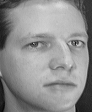

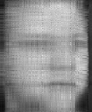

In [ ]:
import math
m=m
cv2_imshow(m)
#cv2_imshow(convertMatrixToImage(np.matmul(w,h),mean))
cv2_imshow(np.matmul(w,h))

In [ ]:
m,mean=normalizeM(m)
w,h=performNMF(m, 10, height)
print(m)

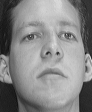

[[41 42 44 ... 49 53 53]
 [42 40 42 ... 47 52 54]
 [41 42 42 ... 48 52 51]
 ...
 [32 32 28 ... 40 39 40]
 [36 35 28 ... 41 42 41]
 [36 35 29 ... 42 42 42]]


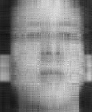

In [ ]:
import math
cv2_imshow(m*mean)
cv2_imshow(convertMatrixToImage(np.matmul(w,h),mean))

In [ ]:
m,minn=normalizeMin(m)
w,h=performNMF(m, 10, height)
print(m)

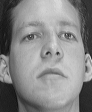

[[30 29 33 ... 42 40 42]
 [30 30 34 ... 42 40 31]
 [33 35 37 ... 45 42 43]
 ...
 [27 26 24 ... 40 33 44]
 [29 30 27 ... 42 36 44]
 [28 30 27 ... 41 35 45]]


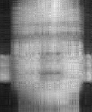

In [ ]:
import math
cv2_imshow(m*minn)
cv2_imshow(convertMatrixToImage(np.matmul(w,h),minn))

In [ ]:
m,minn=normalizeMax(m)
w,h=performNMF(m, 10, height)
print(m)

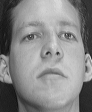

[[26 26 24 ... 32 31 34]
 [32 31 28 ... 34 33 35]
 [25 24 23 ... 34 29 37]
 ...
 [34 35 33 ... 45 40 42]
 [33 33 31 ... 41 40 41]
 [38 39 37 ... 44 43 48]]


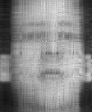

In [ ]:
import math
cv2_imshow(m*minn)
cv2_imshow(convertMatrixToImage(np.matmul(w,h),minn))

#Test on multiple images

In [ ]:
import shutil
counter = 1
source = "/content/Face-Recognition/Datasets/att_faces/Training"
destination = "/content/"

# code to move the files from sub-folder to main folder.
for root, dirs, files in os.walk(source):
    for file in files:
        # Get the full path of the file
        file_path = os.path.join(root, file)
        
        file_extension = os.path.splitext(file)[1]
        
        # Create the new file name
        new_file_name = str(counter) + file_extension
        
        # Move the file to the destination and rename it
        shutil.move(file_path, os.path.join(destination, new_file_name))
        
        # Increment the counter
        counter += 1
print("Files Moved")

Files Moved


In [64]:
width, height, imageCount=countWidthandHeight()

92 112


In [ ]:
m, imageNameList, imageCount = convertAllImageToMatrix(width, height, imageCount)

In [66]:
#m, mean = normalizeM(m)
m,min,max=normalizeMinMaxScalar(m)

In [62]:
#w,h=performNMF(m, 10, imageCount)

from sklearn.decomposition import non_negative_factorization
w,h,n_iter = non_negative_factorization(m,max_iter=100,n_components=10,init='nndsvdar')



/usr/local/lib/python3.9/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


[[ 39.  43.  39. ...  24.  24.  23.]
 [115. 108. 109. ...  48.  47.  48.]
 [116. 116. 117. ...  19.  24.  16.]
 ...
 [123. 121. 121. ...  78.  79.  67.]
 [ 30.  37.  35. ...  26.  27.  32.]
 [ 69.  76.  69. ... 104. 121.  93.]]
-------------------------------Number of image: 0
[[60. 60. 61. ... 52. 52. 52.]
 [60. 62. 61. ... 52. 52. 52.]
 [61. 61. 62. ... 52. 52. 51.]
 ...
 [72. 74. 74. ... 35. 33. 33.]
 [77. 80. 81. ... 38. 36. 35.]
 [80. 85. 84. ... 40. 40. 36.]]


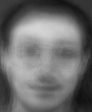

Image after NMF:


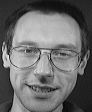

[[39. 43. 39. ... 33. 42. 29.]
 [45. 39. 46. ... 39. 33. 37.]
 [41. 40. 42. ... 37. 39. 33.]
 ...
 [69. 73. 64. ... 23. 21. 26.]
 [71. 70. 71. ... 25. 26. 22.]
 [69. 70. 77. ... 24. 24. 23.]]
Image Before NMF:
-------------------------------Number of image: 1
[[117. 117. 118. ... 113. 113. 113.]
 [118. 118. 118. ... 113. 113. 113.]
 [118. 118. 117. ... 113. 113. 113.]
 ...
 [ 81.  79.  81. ...  54.  54.  54.]
 [ 83.  81.  86. ...  53.  54.  55.]
 [ 85.  85.  88. ...  54.  56.  55.]]


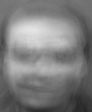

Image after NMF:


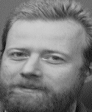

[[115. 108. 109. ... 106. 108. 109.]
 [108. 107. 111. ... 107. 107. 107.]
 [106. 109. 106. ... 110. 107. 108.]
 ...
 [ 96.  84.  73. ...  48.  40.  47.]
 [ 91.  87.  75. ...  49.  50.  51.]
 [100.  80.  84. ...  48.  47.  48.]]
Image Before NMF:
-------------------------------Number of image: 2
[[ 87.  87.  87. ...  92.  91.  92.]
 [ 87.  87.  87. ...  92.  92.  92.]
 [ 87.  87.  87. ...  92.  92.  92.]
 ...
 [103. 104. 106. ...  94.  95.  94.]
 [107. 109. 111. ...  97.  96.  96.]
 [110. 114. 116. ... 101.  98.  97.]]


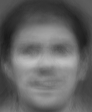

Image after NMF:


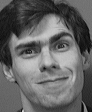

[[116. 116. 117. ... 114. 117. 114.]
 [115. 118. 117. ... 113. 120. 115.]
 [111. 121. 111. ... 113. 116. 116.]
 ...
 [101.  96. 101. ...  21.  25.  24.]
 [103.  93. 100. ...  17.  27.  19.]
 [ 98.  96.  98. ...  19.  24.  16.]]
Image Before NMF:
-------------------------------Number of image: 3
[[ 48.  47.  48. ...  43.  44.  43.]
 [ 48.  48.  48. ...  44.  44.  43.]
 [ 48.  48.  48. ...  44.  44.  44.]
 ...
 [ 88.  88.  89. ...  70.  69.  69.]
 [ 92.  92.  95. ...  72.  72.  70.]
 [ 95. 101. 102. ...  78.  78.  73.]]


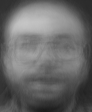

Image after NMF:


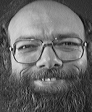

[[52. 47. 51. ... 45. 48. 45.]
 [52. 50. 53. ... 46. 46. 47.]
 [55. 44. 58. ... 45. 48. 44.]
 ...
 [67. 68. 73. ... 44. 35. 46.]
 [72. 62. 68. ... 35. 39. 49.]
 [73. 68. 63. ... 30. 34. 42.]]
Image Before NMF:
-------------------------------Number of image: 4
[[118. 118. 118. ... 115. 115. 115.]
 [118. 119. 118. ... 115. 116. 115.]
 [118. 118. 118. ... 115. 115. 115.]
 ...
 [142. 141. 143. ...  94.  92.  91.]
 [144. 144. 148. ...  96.  95.  95.]
 [145. 147. 150. ...  97.  96.  96.]]


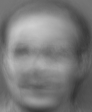

Image after NMF:


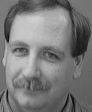

[[124. 124. 123. ... 115. 114. 117.]
 [124. 124. 122. ... 118. 116. 114.]
 [124. 121. 124. ... 116. 118. 112.]
 ...
 [130. 111. 143. ...  97. 101.  86.]
 [128. 118. 145. ...  99.  85. 101.]
 [128. 129. 145. ...  99. 102.  95.]]
Image Before NMF:
-------------------------------Number of image: 5
[[46. 46. 46. ... 59. 58. 60.]
 [46. 46. 45. ... 60. 60. 60.]
 [47. 46. 46. ... 59. 61. 61.]
 ...
 [30. 30. 30. ... 66. 68. 69.]
 [31. 33. 32. ... 70. 67. 67.]
 [35. 35. 35. ... 73. 69. 69.]]


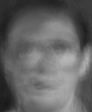

Image after NMF:


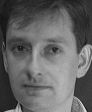

[[34. 38. 36. ... 46. 45. 46.]
 [33. 37. 38. ... 46. 46. 47.]
 [34. 37. 42. ... 46. 48. 48.]
 ...
 [36. 36. 37. ... 56. 57. 53.]
 [38. 39. 36. ... 57. 63. 55.]
 [34. 35. 33. ... 55. 58. 55.]]
Image Before NMF:
-------------------------------Number of image: 6
[[135. 134. 134. ... 138. 138. 137.]
 [135. 134. 134. ... 138. 138. 138.]
 [135. 134. 134. ... 137. 138. 138.]
 ...
 [ 77.  74.  76. ...  73.  74.  75.]
 [ 78.  76.  80. ...  73.  73.  75.]
 [ 80.  78.  82. ...  74.  73.  75.]]


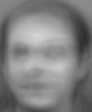

Image after NMF:


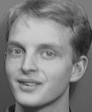

[[129. 127. 133. ... 122. 124. 124.]
 [130. 128. 126. ... 123. 124. 122.]
 [127. 126. 132. ... 123. 123. 126.]
 ...
 [ 69.  72.  71. ...  90.  90.  95.]
 [ 70.  69.  71. ...  92.  93.  92.]
 [ 74.  69.  72. ...  93.  93.  93.]]
Image Before NMF:
-------------------------------Number of image: 7
[[ 69.  69.  69. ...  66.  66.  66.]
 [ 69.  69.  69. ...  66.  66.  66.]
 [ 69.  70.  70. ...  66.  66.  66.]
 ...
 [170. 171. 173. ... 115. 112. 111.]
 [174. 176. 178. ... 121. 119. 117.]
 [175. 180. 183. ... 125. 122. 119.]]


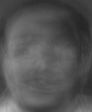

Image after NMF:


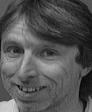

[[ 97.  94.  92. ...  85.  84.  80.]
 [ 89.  92.  94. ...  82.  83.  85.]
 [ 90.  93.  92. ...  79.  85.  82.]
 ...
 [187. 194. 198. ... 138. 142. 134.]
 [197. 200. 201. ... 138. 146. 132.]
 [199. 199. 199. ... 144. 143. 129.]]
Image Before NMF:
-------------------------------Number of image: 8
[[118. 118. 119. ... 117. 117. 117.]
 [118. 119. 118. ... 117. 117. 117.]
 [119. 119. 118. ... 117. 117. 117.]
 ...
 [106. 105. 107. ...  81.  82.  82.]
 [110. 110. 114. ...  83.  83.  83.]
 [113. 115. 118. ...  85.  84.  84.]]


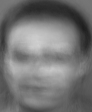

Image after NMF:


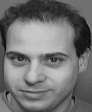

[[113. 112. 111. ... 111. 116. 109.]
 [114. 114. 113. ... 111. 111. 112.]
 [113. 114. 113. ... 112. 108. 114.]
 ...
 [137. 140. 137. ...  89.  87.  87.]
 [139. 136. 142. ...  89.  88.  87.]
 [137. 137. 141. ...  87.  87.  89.]]
Image Before NMF:
-------------------------------Number of image: 9
[[ 30.  31.  31. ...  25.  25.  25.]
 [ 30.  31.  31. ...  25.  26.  26.]
 [ 31.  31.  32. ...  26.  26.  26.]
 ...
 [202. 205. 207. ... 132. 127. 126.]
 [209. 214. 215. ... 140. 136. 132.]
 [212. 222. 222. ... 147. 143. 137.]]


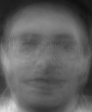

Image after NMF:


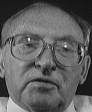

[[ 25.  24.  26. ...  21.  20.  18.]
 [ 23.  27.  24. ...  19.  19.  19.]
 [ 23.  24.  28. ...  20.  23.  16.]
 ...
 [202. 196. 186. ... 188. 184. 195.]
 [195. 197. 184. ... 186. 187. 194.]
 [198. 193. 190. ... 186. 189. 187.]]
Image Before NMF:
-------------------------------Number of image: 10
[[111. 110. 111. ... 105. 105. 105.]
 [111. 111. 110. ... 105. 104. 104.]
 [111. 111. 110. ... 105. 105. 104.]
 ...
 [ 38.  36.  37. ...  33.  33.  34.]
 [ 39.  37.  40. ...  32.  33.  34.]
 [ 39.  39.  41. ...  34.  34.  34.]]


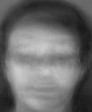

Image after NMF:


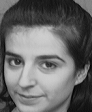

[[136. 136. 136. ... 128. 133. 133.]
 [137. 137. 138. ... 130. 133. 127.]
 [134. 140. 137. ... 134. 133. 128.]
 ...
 [ 59.  60.  55. ...  16.  22.  22.]
 [ 65.  61.  48. ...  17.  22.  19.]
 [ 60.  48.  56. ...  19.  20.  21.]]
Image Before NMF:
-------------------------------Number of image: 11
[[50. 50. 50. ... 56. 56. 57.]
 [50. 51. 50. ... 57. 57. 57.]
 [52. 50. 51. ... 56. 58. 57.]
 ...
 [38. 37. 38. ... 54. 52. 53.]
 [37. 39. 39. ... 56. 54. 52.]
 [40. 41. 41. ... 60. 58. 55.]]


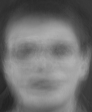

Image after NMF:


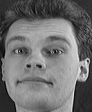

[[46. 48. 41. ... 46. 51. 52.]
 [51. 46. 47. ... 52. 47. 53.]
 [46. 48. 46. ... 51. 53. 45.]
 ...
 [43. 44. 37. ... 37. 39. 40.]
 [44. 39. 42. ... 34. 39. 40.]
 [38. 41. 41. ... 35. 36. 37.]]
Image Before NMF:
-------------------------------Number of image: 12
[[ 98.  99.  99. ...  95.  95.  95.]
 [ 98.  99.  99. ...  95.  95.  95.]
 [ 99.  98.  99. ...  95.  95.  95.]
 ...
 [119. 123. 124. ...  69.  69.  68.]
 [126. 128. 130. ...  71.  71.  71.]
 [129. 132. 133. ...  71.  70.  71.]]


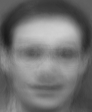

Image after NMF:


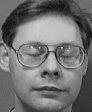

[[114. 118. 114. ... 109. 112. 112.]
 [113. 115. 117. ... 113. 108. 114.]
 [118. 111. 118. ... 113. 111. 108.]
 ...
 [103.  93. 110. ...  51.  55.  52.]
 [ 98. 101.  98. ...  49.  54.  55.]
 [ 96. 101.  98. ...  54.  55.  52.]]
Image Before NMF:
-------------------------------Number of image: 13
[[53. 53. 53. ... 51. 50. 51.]
 [53. 54. 53. ... 51. 50. 51.]
 [54. 54. 54. ... 50. 51. 50.]
 ...
 [82. 83. 83. ... 63. 60. 60.]
 [84. 86. 86. ... 66. 64. 62.]
 [85. 89. 90. ... 70. 67. 65.]]


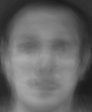

Image after NMF:


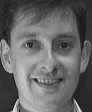

[[40. 41. 43. ... 43. 42. 41.]
 [44. 47. 49. ... 46. 40. 42.]
 [44. 45. 44. ... 39. 41. 42.]
 ...
 [43. 49. 48. ... 38. 37. 36.]
 [48. 47. 49. ... 40. 39. 38.]
 [48. 51. 45. ... 40. 37. 36.]]
Image Before NMF:
-------------------------------Number of image: 14
[[111. 110. 111. ... 113. 113. 114.]
 [111. 110. 110. ... 114. 113. 113.]
 [111. 111. 110. ... 113. 114. 114.]
 ...
 [ 84.  82.  84. ...  77.  78.  78.]
 [ 85.  84.  88. ...  78.  78.  79.]
 [ 87.  87.  90. ...  79.  78.  79.]]


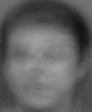

Image after NMF:


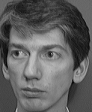

[[105. 106. 100. ...  98. 106. 103.]
 [105. 105. 105. ... 103. 103. 101.]
 [105. 105. 108. ... 104. 103. 102.]
 ...
 [ 76.  67.  69. ...  74.  78.  77.]
 [ 71.  71.  68. ...  77.  77.  79.]
 [ 73.  71.  66. ...  76.  76.  76.]]
Image Before NMF:
-------------------------------Number of image: 15
[[115. 114. 114. ... 117. 117. 117.]
 [115. 113. 114. ... 118. 118. 117.]
 [114. 114. 114. ... 117. 118. 118.]
 ...
 [ 67.  67.  69. ...  68.  72.  72.]
 [ 72.  70.  75. ...  68.  70.  72.]
 [ 75.  76.  79. ...  70.  69.  71.]]


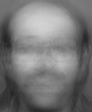

Image after NMF:


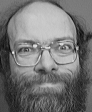

[[121. 121. 122. ... 121. 120. 120.]
 [121. 120. 118. ... 123. 120. 122.]
 [119. 122. 121. ... 121. 120. 121.]
 ...
 [ 64.  71.  69. ...  97. 104. 101.]
 [ 70.  71.  66. ...  99.  97. 102.]
 [ 65.  69.  72. ...  96.  98. 100.]]
Image Before NMF:
-------------------------------Number of image: 16
[[ 60.  60.  61. ...  53.  52.  52.]
 [ 60.  61.  62. ...  52.  52.  52.]
 [ 61.  61.  62. ...  53.  52.  52.]
 ...
 [126. 131. 132. ...  82.  82.  81.]
 [137. 141. 143. ...  87.  86.  84.]
 [142. 152. 152. ...  94.  91.  86.]]


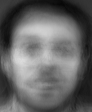

Image after NMF:


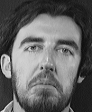

[[ 47.  47.  47. ...  40.  38.  39.]
 [ 50.  45.  47. ...  38.  39.  36.]
 [ 46.  49.  47. ...  40.  39.  36.]
 ...
 [ 54.  51.  30. ...  33.  34.  30.]
 [ 37.  65. 170. ...  35.  33.  27.]
 [104. 212. 213. ...  30.  35.  33.]]
Image Before NMF:
-------------------------------Number of image: 17
[[130. 130. 131. ... 125. 125. 124.]
 [130. 130. 131. ... 124. 124. 124.]
 [130. 130. 130. ... 125. 124. 124.]
 ...
 [122. 124. 125. ...  77.  78.  77.]
 [127. 127. 131. ...  78.  79.  80.]
 [129. 131. 134. ...  77.  78.  79.]]


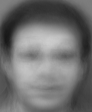

Image after NMF:


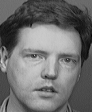

[[113. 109. 113. ... 105. 107. 106.]
 [110. 111. 112. ... 108. 104. 107.]
 [110. 112. 111. ... 105. 105. 106.]
 ...
 [137. 151. 105. ...  68.  72.  68.]
 [149. 135. 106. ...  70.  69.  68.]
 [152. 126. 120. ...  72.  66.  71.]]
Image Before NMF:
-------------------------------Number of image: 18
[[50. 50. 50. ... 47. 47. 46.]
 [50. 50. 51. ... 47. 47. 47.]
 [51. 51. 50. ... 47. 47. 47.]
 ...
 [80. 80. 81. ... 64. 63. 64.]
 [84. 85. 87. ... 66. 66. 64.]
 [87. 93. 94. ... 72. 71. 67.]]


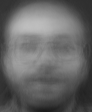

Image after NMF:


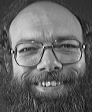

[[45. 54. 48. ... 42. 50. 37.]
 [50. 53. 49. ... 49. 48. 44.]
 [52. 50. 48. ... 47. 43. 47.]
 ...
 [67. 67. 67. ... 40. 42. 32.]
 [60. 65. 68. ... 50. 55. 39.]
 [65. 63. 76. ... 46. 67. 33.]]
Image Before NMF:
-------------------------------Number of image: 19
[[ 40.  40.  40. ...  37.  37.  37.]
 [ 40.  40.  40. ...  38.  38.  38.]
 [ 40.  41.  41. ...  37.  38.  38.]
 ...
 [192. 195. 197. ... 124. 119. 118.]
 [197. 201. 201. ... 129. 127. 124.]
 [198. 205. 206. ... 134. 131. 128.]]


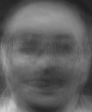

Image after NMF:


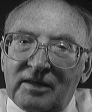

[[ 22.  19.  24. ...  12.   9.  18.]
 [ 22.  21.  21. ...  17.  16.  17.]
 [ 22.  22.  22. ...  17.  18.  18.]
 ...
 [188. 181. 171. ... 158. 153. 150.]
 [190. 181. 170. ... 153. 151. 157.]
 [194. 181. 170. ... 150. 158. 166.]]
Image Before NMF:
-------------------------------Number of image: 20
[[116. 116. 116. ... 115. 114. 114.]
 [116. 116. 116. ... 115. 115. 114.]
 [115. 116. 116. ... 115. 115. 115.]
 ...
 [140. 140. 142. ...  99.  97.  97.]
 [143. 143. 146. ... 101. 101. 101.]
 [144. 146. 150. ... 103. 102. 102.]]


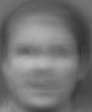

Image after NMF:


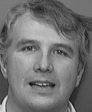

[[119. 123. 123. ... 116. 117. 113.]
 [117. 123. 123. ... 119. 113. 115.]
 [121. 125. 120. ... 115. 115. 112.]
 ...
 [193. 202. 211. ...  76.  75.  75.]
 [206. 206. 209. ...  79.  74.  72.]
 [203. 205. 211. ...  78.  72.  75.]]
Image Before NMF:
-------------------------------Number of image: 21
[[47. 47. 47. ... 43. 43. 43.]
 [47. 48. 47. ... 43. 43. 43.]
 [48. 48. 48. ... 43. 44. 43.]
 ...
 [38. 37. 38. ... 30. 27. 28.]
 [37. 38. 38. ... 30. 30. 28.]
 [38. 40. 40. ... 34. 33. 30.]]


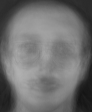

Image after NMF:


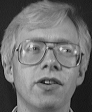

[[34. 36. 35. ... 32. 31. 31.]
 [36. 34. 38. ... 27. 32. 30.]
 [37. 37. 36. ... 29. 38. 27.]
 ...
 [42. 39. 39. ... 27. 25. 26.]
 [39. 41. 38. ... 26. 27. 26.]
 [38. 41. 34. ... 32. 25. 25.]]
Image Before NMF:
-------------------------------Number of image: 22
[[ 66.  65.  65. ...  62.  62.  61.]
 [ 66.  65.  66. ...  62.  62.  62.]
 [ 65.  66.  66. ...  62.  62.  62.]
 ...
 [144. 145. 146. ... 103. 102. 101.]
 [149. 151. 153. ... 108. 107. 105.]
 [151. 157. 160. ... 113. 111. 107.]]


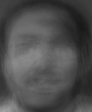

Image after NMF:


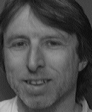

[[ 74.  74.  78. ...  67.  63.  67.]
 [ 75.  76.  74. ...  66.  66.  65.]
 [ 75.  77.  74. ...  66.  66.  64.]
 ...
 [173. 182. 187. ... 100.  84.  56.]
 [177. 184. 184. ... 103. 113. 106.]
 [177. 184. 186. ... 109. 113. 120.]]
Image Before NMF:
-------------------------------Number of image: 23
[[136. 136. 137. ... 132. 131. 131.]
 [136. 136. 136. ... 131. 131. 131.]
 [136. 136. 136. ... 131. 131. 131.]
 ...
 [ 78.  76.  79. ...  48.  48.  48.]
 [ 79.  75.  80. ...  45.  47.  50.]
 [ 78.  76.  80. ...  42.  45.  48.]]


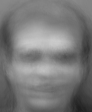

Image after NMF:


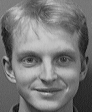

[[123. 121. 126. ... 120. 117. 120.]
 [128. 123. 125. ... 120. 119. 121.]
 [126. 124. 123. ... 118. 122. 121.]
 ...
 [ 84.  95.  90. ...  38.  37.  44.]
 [ 94.  88.  91. ...  35.  45.  39.]
 [ 89.  94.  89. ...  40.  35.  42.]]
Image Before NMF:
-------------------------------Number of image: 24
[[ 92.  93.  94. ...  94.  94.  94.]
 [ 92.  93.  93. ...  95.  95.  95.]
 [ 93.  93.  93. ...  94.  95.  95.]
 ...
 [111. 114. 115. ...  82.  84.  83.]
 [118. 121. 123. ...  85.  84.  85.]
 [123. 127. 128. ...  86.  85.  85.]]


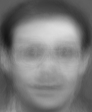

Image after NMF:


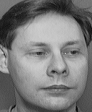

[[119. 121. 122. ... 117. 114. 121.]
 [120. 122. 122. ... 117. 117. 117.]
 [122. 122. 121. ... 116. 113. 116.]
 ...
 [ 89.  85.  96. ...  79.  80.  84.]
 [100. 108. 108. ...  79.  82.  84.]
 [107. 108. 106. ...  79.  80.  82.]]
Image Before NMF:
-------------------------------Number of image: 25
[[ 71.  71.  72. ...  68.  68.  68.]
 [ 72.  71.  72. ...  68.  68.  68.]
 [ 71.  72.  72. ...  68.  68.  68.]
 ...
 [165. 169. 170. ... 113. 113. 112.]
 [173. 176. 179. ... 118. 117. 117.]
 [176. 183. 186. ... 122. 120. 118.]]


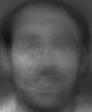

Image after NMF:


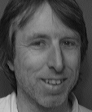

[[ 75.  77.  75. ...  65.  65.  63.]
 [ 75.  74.  77. ...  67.  67.  64.]
 [ 76.  74.  75. ...  66.  65.  65.]
 ...
 [192. 193. 192. ...  74.  64.  55.]
 [193. 194. 188. ... 108. 102.  88.]
 [191. 192. 187. ... 116. 114. 113.]]
Image Before NMF:
-------------------------------Number of image: 26
[[140. 140. 140. ... 136. 136. 135.]
 [140. 140. 140. ... 136. 136. 135.]
 [140. 140. 140. ... 136. 136. 136.]
 ...
 [ 91.  88.  90. ...  58.  57.  57.]
 [ 90.  87.  92. ...  57.  58.  60.]
 [ 89.  87.  91. ...  56.  57.  59.]]


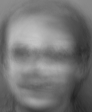

Image after NMF:


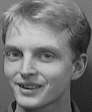

[[130. 123. 127. ... 120. 120. 124.]
 [126. 130. 123. ... 120. 120. 120.]
 [123. 125. 127. ... 122. 118. 119.]
 ...
 [ 88.  91.  96. ...  38.  37.  39.]
 [ 91.  90.  96. ...  38.  32.  42.]
 [ 91.  94.  88. ...  33.  37.  40.]]
Image Before NMF:
-------------------------------Number of image: 27
[[114. 116. 116. ... 111. 110. 110.]
 [115. 116. 115. ... 110. 111. 110.]
 [115. 115. 116. ... 111. 111. 110.]
 ...
 [164. 165. 167. ...  96.  93.  92.]
 [168. 170. 172. ...  98.  98.  97.]
 [169. 171. 174. ...  98.  98.  98.]]


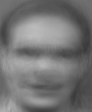

Image after NMF:


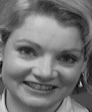

[[ 84.  96. 101. ...  91.  84.  86.]
 [ 94.  93.  93. ...  95.  90.  83.]
 [ 94.  96.  87. ...  97.  95.  91.]
 ...
 [193. 196. 202. ...  59.  64.  69.]
 [190. 195. 199. ...  40.  69.  58.]
 [191. 191. 197. ...  36.  57.  55.]]
Image Before NMF:
-------------------------------Number of image: 28
[[155. 154. 155. ... 158. 158. 158.]
 [155. 154. 153. ... 158. 158. 158.]
 [155. 154. 154. ... 158. 159. 158.]
 ...
 [145. 144. 147. ... 120. 121. 121.]
 [147. 146. 150. ... 121. 122. 124.]
 [149. 147. 152. ... 120. 120. 123.]]


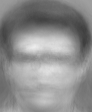

Image after NMF:


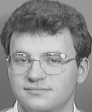

[[157. 152. 154. ... 152. 150. 151.]
 [155. 152. 156. ... 151. 151. 150.]
 [153. 153. 154. ... 152. 150. 151.]
 ...
 [105. 104. 115. ... 111. 113. 110.]
 [115. 122. 146. ... 109. 113. 110.]
 [135. 144. 157. ... 111. 108. 109.]]
Image Before NMF:
-------------------------------Number of image: 29
[[108. 107. 108. ... 109. 110. 109.]
 [108. 107. 108. ... 110. 110. 109.]
 [107. 107. 107. ... 109. 110. 111.]
 ...
 [ 88.  90.  91. ...  80.  84.  84.]
 [ 96.  94. 100. ...  81.  82.  84.]
 [100. 103. 106. ...  83.  82.  83.]]


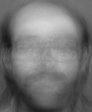

Image after NMF:


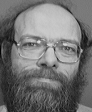

[[121. 122. 121. ... 121. 120. 119.]
 [122. 121. 125. ... 120. 118. 120.]
 [122. 124. 122. ... 122. 121. 121.]
 ...
 [142. 139. 148. ... 147. 154. 145.]
 [137. 139. 159. ... 142. 148. 149.]
 [140. 157. 162. ... 141. 140. 145.]]
Image Before NMF:
-------------------------------Number of image: 30
[[105. 105. 105. ... 106. 106. 106.]
 [105. 105. 105. ... 106. 106. 106.]
 [105. 105. 105. ... 106. 106. 106.]
 ...
 [115. 116. 119. ...  89.  90.  89.]
 [120. 121. 124. ...  90.  90.  92.]
 [123. 125. 128. ...  90.  90.  91.]]


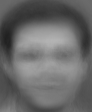

Image after NMF:


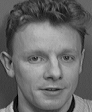

[[103. 104. 103. ... 102.  99. 100.]
 [104. 104. 104. ...  98. 103. 105.]
 [107. 104. 105. ... 103. 104. 101.]
 ...
 [128. 158. 171. ... 133. 164. 143.]
 [160. 165. 178. ... 131. 165. 147.]
 [155. 176. 177. ... 132. 165. 149.]]
Image Before NMF:
-------------------------------Number of image: 31
[[74. 73. 74. ... 76. 75. 76.]
 [74. 73. 74. ... 76. 75. 75.]
 [74. 73. 74. ... 76. 76. 76.]
 ...
 [56. 56. 59. ... 64. 63. 64.]
 [59. 57. 59. ... 62. 64. 64.]
 [60. 63. 65. ... 67. 68. 65.]]


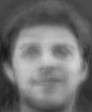

Image after NMF:


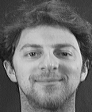

[[51. 49. 53. ... 61. 61. 54.]
 [52. 51. 50. ... 60. 61. 55.]
 [51. 49. 50. ... 59. 62. 59.]
 ...
 [52. 51. 49. ... 63. 59. 63.]
 [48. 50. 49. ... 64. 58. 61.]
 [49. 48. 48. ... 61. 61. 57.]]
Image Before NMF:
-------------------------------Number of image: 32
[[116. 116. 116. ... 114. 113. 113.]
 [116. 116. 116. ... 114. 114. 113.]
 [116. 116. 116. ... 113. 114. 114.]
 ...
 [ 82.  80.  82. ...  54.  53.  53.]
 [ 82.  80.  83. ...  53.  54.  55.]
 [ 81.  80.  83. ...  52.  54.  55.]]


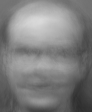

Image after NMF:


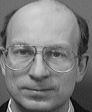

[[106. 109. 105. ... 111. 108. 113.]
 [108. 109. 108. ... 109. 113. 111.]
 [108. 111. 107. ... 112. 113. 113.]
 ...
 [ 22.  23.  23. ...  51.  46.  52.]
 [ 19.  19.  28. ...  45.  50.  46.]
 [ 17.  31.  16. ...  35.  45.  48.]]
Image Before NMF:
-------------------------------Number of image: 33
[[ 85.  85.  85. ...  80.  80.  80.]
 [ 85.  85.  85. ...  80.  80.  80.]
 [ 85.  86.  86. ...  80.  81.  80.]
 ...
 [171. 173. 175. ... 105. 102. 101.]
 [174. 176. 178. ... 109. 108. 107.]
 [174. 178. 180. ... 109. 108. 108.]]


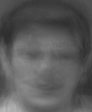

Image after NMF:


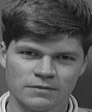

[[ 97.  96.  98. ... 103. 103. 102.]
 [ 95.  94.  94. ... 101.  98. 101.]
 [ 94.  95.  91. ... 101.  96. 100.]
 ...
 [207. 171. 182. ... 116. 108.  88.]
 [206. 188. 170. ... 109. 119. 124.]
 [204. 202. 171. ...  75. 104. 124.]]
Image Before NMF:
-------------------------------Number of image: 34
[[ 55.  54.  55. ...  48.  48.  48.]
 [ 55.  55.  56. ...  48.  48.  48.]
 [ 55.  55.  55. ...  48.  48.  48.]
 ...
 [103. 107. 108. ...  74.  76.  76.]
 [114. 116. 120. ...  79.  78.  76.]
 [119. 129. 130. ...  86.  84.  78.]]


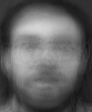

Image after NMF:


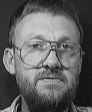

[[ 41.  42.  47. ...  34.  37.  37.]
 [ 41.  46.  43. ...  38.  36.  37.]
 [ 42.  45.  47. ...  35.  37.  38.]
 ...
 [ 43.  47.  47. ... 154. 137. 136.]
 [128. 128. 127. ... 151. 155. 138.]
 [135. 152. 190. ... 141. 156. 149.]]
Image Before NMF:
-------------------------------Number of image: 35
[[102. 102. 103. ... 105. 104. 104.]
 [102. 102. 103. ... 105. 105. 105.]
 [102. 102. 102. ... 105. 105. 105.]
 ...
 [133. 134. 136. ... 102. 103. 103.]
 [138. 139. 142. ... 105. 104. 105.]
 [141. 144. 147. ... 106. 105. 106.]]


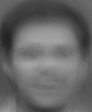

Image after NMF:


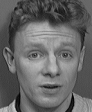

[[108. 105. 105. ... 105. 104. 103.]
 [107. 104. 107. ... 104. 103. 102.]
 [109. 105. 106. ... 104. 102. 100.]
 ...
 [182. 183. 176. ... 163. 143. 168.]
 [176. 182. 163. ... 166. 147. 164.]
 [179. 183. 156. ... 169. 147. 165.]]
Image Before NMF:
-------------------------------Number of image: 36
[[103. 102. 103. ... 106. 106. 106.]
 [103. 102. 102. ... 106. 106. 106.]
 [102. 102. 102. ... 106. 106. 106.]
 ...
 [ 84.  83.  85. ...  74.  75.  75.]
 [ 86.  85.  87. ...  75.  75.  77.]
 [ 87.  87.  90. ...  75.  75.  76.]]


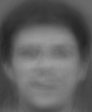

Image after NMF:


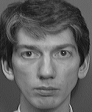

[[105. 107. 104. ... 105.  97. 105.]
 [107. 103. 107. ... 106. 101. 104.]
 [105. 105. 107. ... 103. 103. 100.]
 ...
 [ 75.  79.  75. ...  74.  77.  77.]
 [ 74.  80.  77. ...  72.  77.  77.]
 [ 77.  78.  77. ...  77.  76.  75.]]
Image Before NMF:
-------------------------------Number of image: 37
[[ 87.  87.  87. ...  82.  81.  81.]
 [ 87.  87.  88. ...  81.  82.  81.]
 [ 86.  88.  88. ...  82.  81.  81.]
 ...
 [176. 178. 180. ... 110. 108. 107.]
 [182. 184. 186. ... 115. 114. 113.]
 [183. 188. 191. ... 118. 116. 114.]]


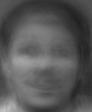

Image after NMF:


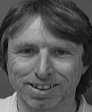

[[ 87.  93.  84. ...  78.  79.  77.]
 [ 91.  91.  91. ...  80.  80.  76.]
 [ 90.  88.  93. ...  81.  78.  80.]
 ...
 [201. 197. 198. ... 113. 122. 123.]
 [199. 196. 201. ... 119. 120. 125.]
 [199. 200. 201. ... 125. 117. 125.]]
Image Before NMF:
-------------------------------Number of image: 38
[[ 91.  92.  92. ...  93.  92.  92.]
 [ 92.  93.  92. ...  93.  93.  92.]
 [ 93.  92.  93. ...  93.  93.  93.]
 ...
 [ 94.  94.  95. ...  67.  66.  66.]
 [ 97.  99. 101. ...  69.  68.  67.]
 [100. 102. 103. ...  71.  69.  68.]]


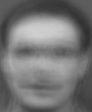

Image after NMF:


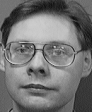

[[118. 114. 117. ... 112. 112. 105.]
 [115. 114. 114. ... 109. 112. 104.]
 [117. 115. 114. ... 110. 110. 112.]
 ...
 [ 97.  97.  95. ...  55.  53.  50.]
 [101.  97.  98. ...  60.  49.  54.]
 [ 96.  91.  98. ...  58.  54.  52.]]
Image Before NMF:
-------------------------------Number of image: 39
[[65. 64. 65. ... 70. 70. 71.]
 [64. 65. 64. ... 71. 70. 71.]
 [66. 64. 65. ... 70. 72. 71.]
 ...
 [23. 22. 23. ... 45. 45. 46.]
 [23. 24. 24. ... 45. 44. 45.]
 [27. 27. 27. ... 47. 46. 46.]]


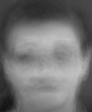

Image after NMF:


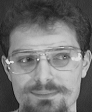

[[48. 45. 50. ... 57. 57. 54.]
 [46. 50. 47. ... 57. 52. 57.]
 [51. 47. 52. ... 54. 58. 52.]
 ...
 [46. 49. 47. ... 51. 47. 52.]
 [48. 48. 44. ... 45. 51. 46.]
 [50. 45. 45. ... 46. 50. 53.]]
Image Before NMF:
-------------------------------Number of image: 40
[[117. 118. 118. ... 113. 113. 112.]
 [117. 118. 118. ... 113. 113. 113.]
 [118. 117. 118. ... 113. 113. 113.]
 ...
 [135. 137. 138. ...  81.  80.  79.]
 [140. 142. 145. ...  83.  82.  83.]
 [143. 145. 147. ...  83.  83.  83.]]


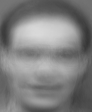

Image after NMF:


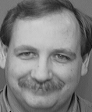

[[119. 120. 121. ... 114. 114. 115.]
 [122. 119. 121. ... 115. 113. 116.]
 [121. 120. 121. ... 113. 116. 112.]
 ...
 [142.  99. 118. ... 100. 101. 100.]
 [143.  97. 117. ... 101. 101. 104.]
 [141.  95. 111. ...  99. 100. 104.]]
Image Before NMF:
-------------------------------Number of image: 41
[[107. 108. 108. ... 106. 106. 105.]
 [108. 108. 108. ... 105. 106. 106.]
 [108. 108. 108. ... 106. 106. 106.]
 ...
 [153. 156. 158. ... 101. 101. 100.]
 [160. 161. 165. ... 104. 103. 104.]
 [163. 166. 169. ... 104. 104. 104.]]


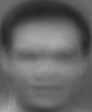

Image after NMF:


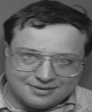

[[ 97.  99.  98. ...  87.  81.  86.]
 [101.  97. 100. ...  87.  80.  85.]
 [100. 100.  98. ...  85.  83.  84.]
 ...
 [ 56.  62.  66. ... 142. 143. 139.]
 [ 53.  68.  81. ... 138. 136. 139.]
 [ 68.  81.  91. ... 130. 119. 120.]]
Image Before NMF:
-------------------------------Number of image: 42
[[113. 113. 112. ... 116. 116. 116.]
 [113. 112. 112. ... 117. 117. 116.]
 [113. 113. 112. ... 116. 117. 117.]
 ...
 [ 82.  79.  81. ...  76.  76.  77.]
 [ 82.  80.  84. ...  77.  77.  77.]
 [ 83.  83.  86. ...  79.  78.  78.]]


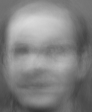

Image after NMF:


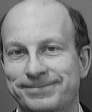

[[104. 105. 102. ... 113. 115. 113.]
 [102. 106. 100. ... 114. 114. 114.]
 [103. 104. 103. ... 117. 114. 113.]
 ...
 [ 77.  81.  87. ...  46.  53.  52.]
 [ 81.  80.  84. ...  17.  54.  51.]
 [ 85.  83.  83. ...  20.  28.  34.]]
Image Before NMF:
-------------------------------Number of image: 43
[[40. 39. 39. ... 36. 36. 37.]
 [40. 40. 40. ... 37. 37. 37.]
 [41. 41. 40. ... 36. 38. 37.]
 ...
 [74. 73. 74. ... 70. 67. 68.]
 [76. 77. 79. ... 74. 72. 68.]
 [78. 84. 85. ... 82. 79. 72.]]


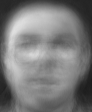

Image after NMF:


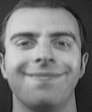

[[55. 52. 54. ... 39. 36. 37.]
 [54. 53. 48. ... 37. 38. 41.]
 [54. 53. 48. ... 36. 39. 38.]
 ...
 [41. 38. 36. ... 31. 34. 31.]
 [38. 35. 41. ... 35. 37. 30.]
 [40. 35. 38. ... 34. 35. 32.]]
Image Before NMF:
-------------------------------Number of image: 44
[[ 63.  64.  65. ...  55.  55.  55.]
 [ 64.  66.  65. ...  55.  55.  55.]
 [ 65.  65.  66. ...  56.  55.  54.]
 ...
 [ 99. 101. 102. ...  51.  48.  48.]
 [104. 108. 109. ...  55.  53.  50.]
 [108. 114. 113. ...  59.  57.  53.]]


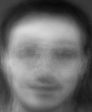

Image after NMF:


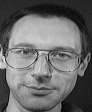

[[42. 40. 43. ... 34. 34. 37.]
 [39. 43. 36. ... 30. 40. 30.]
 [46. 35. 40. ... 33. 38. 35.]
 ...
 [52. 47. 34. ... 29. 19. 29.]
 [52. 49. 14. ... 23. 21. 22.]
 [63. 35. 14. ... 23. 23. 18.]]
Image Before NMF:
-------------------------------Number of image: 45
[[95. 94. 94. ... 90. 89. 89.]
 [95. 95. 95. ... 89. 89. 89.]
 [95. 95. 95. ... 90. 89. 89.]
 ...
 [59. 57. 57. ... 51. 51. 51.]
 [60. 60. 63. ... 54. 53. 51.]
 [62. 65. 67. ... 59. 57. 53.]]


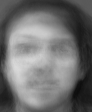

Image after NMF:


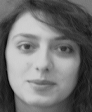

[[131. 128. 126. ... 118. 122. 119.]
 [127. 127. 127. ... 120. 117. 119.]
 [126. 125. 128. ... 122. 120. 119.]
 ...
 [ 57.  55.  51. ...  41.  43.  45.]
 [ 62.  57.  51. ...  44.  41.  39.]
 [ 57.  58.  55. ...  41.  40.  35.]]
Image Before NMF:
-------------------------------Number of image: 46
[[129. 130. 130. ... 124. 124. 123.]
 [129. 130. 129. ... 124. 124. 123.]
 [129. 130. 129. ... 124. 123. 123.]
 ...
 [121. 119. 121. ...  71.  68.  68.]
 [121. 120. 123. ...  70.  71.  72.]
 [121. 120. 124. ...  69.  71.  72.]]


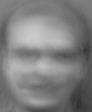

Image after NMF:


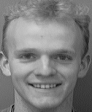

[[130. 132. 129. ... 119. 123. 124.]
 [132. 134. 131. ... 121. 121. 118.]
 [132. 131. 129. ... 121. 123. 123.]
 ...
 [106. 106. 111. ...  56.  49.  52.]
 [114. 116. 130. ...  54.  50.  54.]
 [109. 125. 129. ...  53.  50.  52.]]
Image Before NMF:
-------------------------------Number of image: 47
[[121. 122. 122. ... 126. 125. 125.]
 [122. 122. 122. ... 126. 126. 125.]
 [121. 121. 122. ... 125. 126. 126.]
 ...
 [ 70.  68.  70. ...  65.  65.  65.]
 [ 70.  68.  71. ...  64.  65.  66.]
 [ 70.  69.  72. ...  65.  65.  66.]]


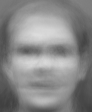

Image after NMF:


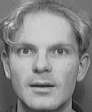

[[118. 123. 120. ... 113. 115. 113.]
 [120. 123. 119. ... 114. 114. 112.]
 [119. 124. 119. ... 115. 113. 114.]
 ...
 [ 94.  84.  90. ...  80.  85.  82.]
 [ 91.  88.  85. ...  81.  81.  82.]
 [ 75.  79.  83. ...  79.  81.  84.]]
Image Before NMF:
-------------------------------Number of image: 48
[[113. 114. 115. ... 108. 107. 106.]
 [114. 115. 114. ... 107. 107. 107.]
 [114. 114. 115. ... 107. 107. 107.]
 ...
 [148. 149. 150. ...  82.  79.  78.]
 [152. 153. 156. ...  83.  83.  83.]
 [153. 155. 158. ...  83.  84.  84.]]


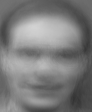

Image after NMF:


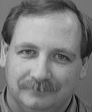

[[122. 124. 121. ... 116. 116. 116.]
 [118. 123. 122. ... 116. 115. 114.]
 [121. 125. 124. ... 116. 118. 115.]
 ...
 [ 68. 113. 131. ...  97.  85.  78.]
 [ 69. 106. 132. ...  91.  97.  88.]
 [ 64. 100. 126. ...  85.  98.  84.]]
Image Before NMF:
-------------------------------Number of image: 49
[[108. 106. 107. ... 106. 106. 105.]
 [108. 106. 108. ... 106. 106. 105.]
 [107. 107. 107. ... 106. 106. 106.]
 ...
 [ 98.  99. 100. ...  84.  88.  88.]
 [105. 104. 109. ...  86.  87.  88.]
 [109. 113. 117. ...  90.  89.  88.]]


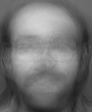

Image after NMF:


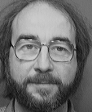

[[124. 121. 123. ... 111. 109. 112.]
 [126. 119. 125. ... 112. 109. 113.]
 [122. 122. 124. ... 112. 109. 113.]
 ...
 [119.  97. 130. ...  80.  80.  76.]
 [142.  95. 130. ...  78.  77.  77.]
 [132. 129. 132. ...  78.  76.  74.]]
Image Before NMF:
-------------------------------Number of image: 50
[[ 31.  32.  32. ...  26.  26.  26.]
 [ 31.  32.  32. ...  27.  27.  27.]
 [ 32.  32.  33. ...  27.  28.  27.]
 ...
 [199. 203. 205. ... 131. 126. 125.]
 [207. 213. 213. ... 138. 135. 131.]
 [210. 220. 221. ... 145. 141. 135.]]


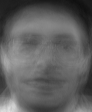

Image after NMF:


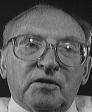

[[ 23.  24.  26. ...  18.  19.  19.]
 [ 25.  23.  25. ...  18.  21.  20.]
 [ 23.  24.  25. ...  18.  18.  22.]
 ...
 [203. 199. 203. ... 177. 182. 183.]
 [198. 193. 198. ... 182. 184. 186.]
 [200. 198. 195. ... 185. 187. 186.]]
Image Before NMF:
-------------------------------Number of image: 51
[[71. 72. 72. ... 77. 76. 77.]
 [71. 72. 72. ... 77. 77. 77.]
 [72. 71. 72. ... 77. 77. 77.]
 ...
 [48. 47. 50. ... 56. 54. 54.]
 [48. 48. 49. ... 54. 55. 54.]
 [50. 51. 52. ... 56. 58. 56.]]


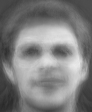

Image after NMF:


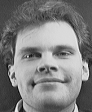

[[63. 67. 65. ... 78. 76. 79.]
 [68. 65. 65. ... 81. 72. 78.]
 [65. 63. 68. ... 77. 76. 76.]
 ...
 [53. 58. 51. ... 74. 65. 66.]
 [55. 56. 53. ... 68. 69. 81.]
 [62. 60. 66. ... 54. 61. 69.]]
Image Before NMF:
-------------------------------Number of image: 52
[[105. 104. 104. ... 103. 104. 103.]
 [105. 103. 105. ... 104. 104. 103.]
 [104. 104. 104. ... 103. 104. 104.]
 ...
 [ 94.  95.  96. ...  84.  88.  88.]
 [101.  99. 105. ...  86.  87.  88.]
 [104. 108. 112. ...  90.  89.  88.]]


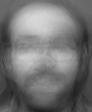

Image after NMF:


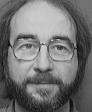

[[122. 122. 121. ... 117. 111. 113.]
 [125. 122. 124. ... 113. 112. 114.]
 [124. 122. 119. ... 116. 111. 114.]
 ...
 [107. 114. 129. ...  78.  83.  79.]
 [125.  93. 132. ...  81.  80.  80.]
 [125. 106. 112. ...  77.  77.  79.]]
Image Before NMF:
-------------------------------Number of image: 53
[[58. 59. 60. ... 51. 51. 51.]
 [59. 60. 60. ... 51. 51. 51.]
 [60. 60. 60. ... 51. 51. 51.]
 ...
 [67. 69. 69. ... 34. 32. 32.]
 [71. 74. 75. ... 36. 35. 33.]
 [74. 79. 78. ... 39. 38. 35.]]


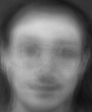

Image after NMF:


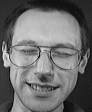

[[42. 44. 39. ... 39. 36. 36.]
 [42. 41. 42. ... 39. 40. 33.]
 [40. 47. 40. ... 42. 36. 33.]
 ...
 [71. 68. 65. ... 24. 20. 29.]
 [73. 70. 68. ... 21. 24. 28.]
 [74. 68. 70. ... 22. 28. 18.]]
Image Before NMF:
-------------------------------Number of image: 54
[[103. 103. 103. ... 105. 105. 105.]
 [103. 103. 103. ... 105. 105. 105.]
 [103. 103. 103. ... 105. 105. 105.]
 ...
 [126. 128. 130. ...  96.  97.  97.]
 [132. 133. 136. ...  98.  98.  99.]
 [135. 138. 141. ...  99.  99.  99.]]


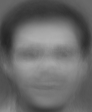

Image after NMF:


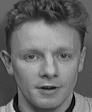

[[103. 102. 104. ... 103. 100. 101.]
 [105. 104. 106. ... 101. 102. 105.]
 [105. 101. 104. ... 101. 100. 104.]
 ...
 [157. 175. 177. ... 134. 152. 167.]
 [156. 177. 184. ... 137. 154. 173.]
 [149. 181. 187. ... 139. 152. 178.]]
Image Before NMF:
-------------------------------Number of image: 55
[[103. 102. 103. ...  97.  96.  96.]
 [103. 103. 103. ...  97.  96.  96.]
 [103. 103. 103. ...  97.  96.  96.]
 ...
 [ 75.  74.  75. ...  54.  53.  53.]
 [ 77.  76.  79. ...  57.  56.  54.]
 [ 77.  80.  82. ...  61.  59.  56.]]


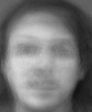

Image after NMF:


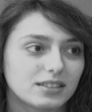

[[128. 125. 125. ... 115. 115. 118.]
 [125. 127. 124. ... 118. 116. 116.]
 [128. 126. 125. ... 116. 119. 115.]
 ...
 [ 47.  42.  37. ...  43.  27.  19.]
 [ 48.  44.  35. ...  36.  36.  20.]
 [ 47.  43.  41. ...  45.  31.  30.]]
Image Before NMF:
-------------------------------Number of image: 56
[[118. 118. 119. ... 118. 117. 117.]
 [118. 119. 119. ... 118. 117. 117.]
 [119. 118. 119. ... 117. 117. 117.]
 ...
 [ 61.  60.  61. ...  48.  49.  50.]
 [ 64.  63.  66. ...  48.  49.  50.]
 [ 66.  66.  69. ...  49.  49.  49.]]


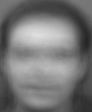

Image after NMF:


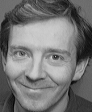

[[109. 111. 108. ... 110. 108. 109.]
 [111. 106. 110. ... 107. 107. 109.]
 [111. 108. 111. ... 110. 109. 111.]
 ...
 [ 72.  70.  79. ...  59.  60.  51.]
 [ 73.  70.  79. ...  57.  56.  52.]
 [ 71.  71.  84. ...  52.  55.  48.]]
Image Before NMF:
-------------------------------Number of image: 57
[[123. 124. 124. ... 118. 117. 117.]
 [124. 124. 124. ... 117. 117. 117.]
 [123. 124. 124. ... 117. 117. 116.]
 ...
 [116. 117. 119. ...  70.  70.  69.]
 [121. 120. 124. ...  71.  71.  72.]
 [122. 124. 126. ...  70.  71.  72.]]


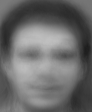

Image after NMF:


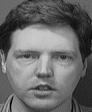

[[105. 109. 105. ... 104. 100. 101.]
 [108. 102. 105. ... 104.  98.  97.]
 [104. 106. 105. ... 101.  98. 101.]
 ...
 [148. 111.  83. ...  71.  64.  64.]
 [135.  86. 112. ...  49.  70.  73.]
 [113.  84. 125. ...  81.  57.  49.]]
Image Before NMF:
-------------------------------Number of image: 58
[[60. 59. 60. ... 70. 70. 72.]
 [59. 60. 59. ... 72. 71. 72.]
 [61. 59. 60. ... 70. 72. 72.]
 ...
 [33. 31. 33. ... 68. 69. 71.]
 [34. 35. 36. ... 70. 68. 68.]
 [39. 39. 40. ... 75. 72. 70.]]


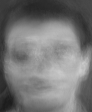

Image after NMF:


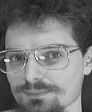

[[52. 41. 48. ... 55. 54. 54.]
 [49. 46. 48. ... 53. 56. 48.]
 [53. 46. 50. ... 54. 54. 53.]
 ...
 [47. 38. 48. ... 40. 53. 45.]
 [44. 43. 49. ... 43. 49. 47.]
 [51. 76. 83. ... 44. 43. 46.]]
Image Before NMF:
-------------------------------Number of image: 59
[[ 30.  31.  31. ...  25.  25.  25.]
 [ 30.  31.  31. ...  25.  25.  26.]
 [ 31.  32.  32. ...  25.  26.  25.]
 ...
 [207. 210. 212. ... 134. 129. 128.]
 [213. 219. 219. ... 141. 138. 134.]
 [216. 226. 227. ... 148. 145. 139.]]


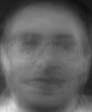

Image after NMF:


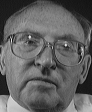

[[ 24.  26.  22. ...  19.  22.  17.]
 [ 27.  23.  27. ...  18.  24.  19.]
 [ 23.  28.  26. ...  23.  22.  21.]
 ...
 [198. 196. 192. ... 186. 189. 190.]
 [200. 198. 194. ... 185. 185. 181.]
 [201. 199. 196. ... 184. 180. 178.]]
Image Before NMF:
-------------------------------Number of image: 60
[[ 49.  49.  49. ...  42.  41.  41.]
 [ 49.  50.  49. ...  42.  41.  41.]
 [ 49.  50.  50. ...  42.  42.  41.]
 ...
 [ 94.  95.  96. ...  59.  55.  55.]
 [ 96.  98.  99. ...  61.  60.  58.]
 [ 97. 102. 102. ...  66.  65.  61.]]


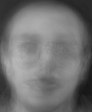

Image after NMF:


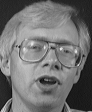

[[ 43.  39.  36. ...  37.  27.  36.]
 [ 38.  39.  40. ...  32.  32.  33.]
 [ 39.  34.  40. ...  30.  36.  33.]
 ...
 [ 22.  96. 164. ...  29.  26.  28.]
 [ 19. 186. 182. ...  38.  38.  31.]
 [112. 183. 208. ... 154. 155. 141.]]
Image Before NMF:
-------------------------------Number of image: 61
[[106. 106. 107. ... 101. 100. 101.]
 [106. 107. 106. ... 100.  99. 100.]
 [107. 106. 106. ... 100. 100.  99.]
 ...
 [ 22.  21.  22. ...  16.  17.  17.]
 [ 23.  22.  24. ...  15.  16.  17.]
 [ 24.  23.  25. ...  14.  15.  16.]]


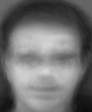

Image after NMF:


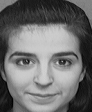

[[133. 135. 137. ... 129. 131. 134.]
 [136. 134. 134. ... 130. 130. 132.]
 [136. 135. 134. ... 130. 130. 129.]
 ...
 [ 18.  18.  24. ...  16.  17.  19.]
 [ 25.  21.  23. ...  17.  18.  19.]
 [ 22.  26.  24. ...  16.  19.  17.]]
Image Before NMF:
-------------------------------Number of image: 62
[[ 56.  56.  56. ...  48.  47.  47.]
 [ 56.  56.  58. ...  48.  48.  47.]
 [ 56.  56.  57. ...  48.  48.  47.]
 ...
 [130. 135. 135. ...  87.  87.  86.]
 [140. 144. 147. ...  93.  91.  89.]
 [145. 156. 156. ... 101.  98.  91.]]


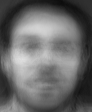

Image after NMF:


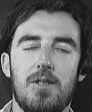

[[ 50.  46.  49. ...  43.  41.  36.]
 [ 46.  48.  52. ...  38.  44.  43.]
 [ 48.  49.  53. ...  37.  45.  38.]
 ...
 [ 62. 170. 224. ...  38.  34.  37.]
 [211. 214. 222. ...  31.  33.  32.]
 [210. 210. 218. ...  33.  33.  41.]]
Image Before NMF:
-------------------------------Number of image: 63
[[121. 120. 120. ... 115. 116. 116.]
 [121. 120. 120. ... 115. 115. 115.]
 [120. 120. 120. ... 115. 115. 115.]
 ...
 [126. 126. 129. ...  88.  89.  88.]
 [130. 128. 132. ...  88.  90.  91.]
 [130. 132. 136. ...  88.  89.  91.]]


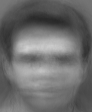

Image after NMF:


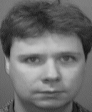

[[120. 119. 118. ... 128. 125. 124.]
 [119. 115. 119. ... 125. 125. 125.]
 [117. 120. 119. ... 123. 128. 124.]
 ...
 [110. 101. 106. ...  87.  91.  91.]
 [107.  98. 105. ...  82.  88.  88.]
 [119. 104. 111. ...  63.  73.  80.]]
Image Before NMF:
-------------------------------Number of image: 64
[[111. 112. 111. ... 112. 111. 111.]
 [112. 112. 112. ... 112. 112. 111.]
 [111. 112. 112. ... 112. 112. 112.]
 ...
 [133. 132. 134. ...  98.  96.  96.]
 [135. 135. 138. ... 100. 100.  99.]
 [136. 138. 141. ... 102. 101. 101.]]


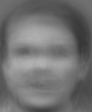

Image after NMF:


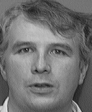

[[117. 122. 120. ... 114. 111. 118.]
 [117. 120. 121. ... 116. 113. 115.]
 [122. 123. 121. ... 116. 114. 114.]
 ...
 [207. 190. 193. ...  82.  75.  77.]
 [171. 190. 202. ...  78.  76.  77.]
 [157. 200. 203. ...  76.  78.  71.]]
Image Before NMF:
-------------------------------Number of image: 65
[[104. 105. 105. ... 103. 103. 102.]
 [105. 105. 105. ... 103. 103. 103.]
 [105. 105. 105. ... 103. 103. 103.]
 ...
 [ 75.  74.  75. ...  52.  51.  52.]
 [ 77.  76.  80. ...  52.  52.  53.]
 [ 79.  79.  81. ...  53.  53.  53.]]


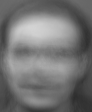

Image after NMF:


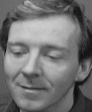

[[105. 102. 108. ... 105. 106. 105.]
 [101. 103.  99. ... 106. 108. 104.]
 [106. 101. 107. ... 103. 110. 107.]
 ...
 [ 79.  74.  70. ...  43.  36.  43.]
 [ 73.  69.  73. ...  37.  38.  41.]
 [ 68.  73.  71. ...  42.  35.  37.]]
Image Before NMF:
-------------------------------Number of image: 66
[[105. 104. 104. ... 104. 105. 104.]
 [104. 104. 105. ... 105. 105. 104.]
 [105. 104. 104. ... 104. 105. 105.]
 ...
 [ 85.  85.  86. ...  80.  82.  83.]
 [ 90.  89.  94. ...  82.  82.  82.]
 [ 94.  97. 101. ...  87.  86.  83.]]


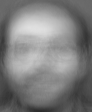

Image after NMF:


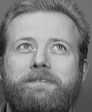

[[112. 109. 111. ... 112. 110. 113.]
 [109. 111. 112. ... 114. 112. 111.]
 [109. 111. 111. ... 110. 113. 110.]
 ...
 [ 93.  79.  72. ...  75.  75.  75.]
 [ 96.  78.  67. ...  71.  77.  73.]
 [ 96.  81.  60. ...  74.  75.  74.]]
Image Before NMF:
-------------------------------Number of image: 67
[[ 99.  99.  99. ...  94.  94.  94.]
 [ 99. 100.  99. ...  94.  94.  93.]
 [100.  99.  99. ...  94.  94.  93.]
 ...
 [ 54.  52.  52. ...  44.  44.  44.]
 [ 54.  54.  56. ...  46.  46.  44.]
 [ 55.  58.  59. ...  51.  49.  46.]]


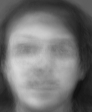

Image after NMF:


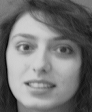

[[126. 130. 131. ... 121. 121. 121.]
 [128. 127. 132. ... 121. 120. 120.]
 [129. 127. 131. ... 120. 122. 120.]
 ...
 [ 47.  46.  48. ...  34.  44.  45.]
 [ 48.  46.  44. ...  40.  49.  41.]
 [ 52.  46.  48. ...  43.  51.  48.]]
Image Before NMF:
-------------------------------Number of image: 68
[[43. 43. 43. ... 50. 49. 51.]
 [43. 44. 43. ... 51. 51. 51.]
 [44. 43. 44. ... 50. 52. 51.]
 ...
 [26. 25. 25. ... 48. 47. 48.]
 [25. 28. 27. ... 50. 48. 47.]
 [29. 30. 30. ... 55. 52. 49.]]


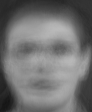

Image after NMF:


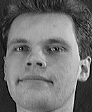

[[46. 41. 45. ... 49. 39. 51.]
 [47. 45. 47. ... 45. 50. 45.]
 [46. 48. 46. ... 50. 48. 49.]
 ...
 [40. 41. 38. ... 39. 37. 38.]
 [38. 43. 45. ... 41. 35. 40.]
 [36. 40. 38. ... 37. 34. 43.]]
Image Before NMF:
-------------------------------Number of image: 69
[[85. 85. 85. ... 81. 80. 81.]
 [85. 86. 86. ... 81. 81. 81.]
 [86. 86. 86. ... 81. 81. 80.]
 ...
 [78. 77. 77. ... 59. 56. 57.]
 [79. 81. 82. ... 62. 60. 58.]
 [81. 85. 85. ... 67. 65. 61.]]


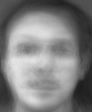

Image after NMF:


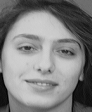

[[114. 115. 115. ... 110. 106. 109.]
 [114. 114. 112. ... 110. 111. 106.]
 [115. 112. 112. ... 110. 109. 107.]
 ...
 [ 54.  57.  59. ...  76.  72.  71.]
 [ 62.  68.  66. ...  78.  78.  72.]
 [ 68.  74.  76. ...  78.  85.  77.]]
Image Before NMF:
-------------------------------Number of image: 70
[[ 95.  96.  96. ...  95.  95.  95.]
 [ 95.  96.  96. ...  95.  95.  95.]
 [ 95.  95.  96. ...  95.  95.  95.]
 ...
 [129. 131. 132. ...  86.  85.  84.]
 [132. 135. 136. ...  89.  88.  88.]
 [134. 136. 138. ...  89.  88.  89.]]


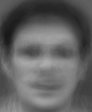

Image after NMF:


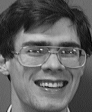

[[109. 110. 113. ... 108. 112. 107.]
 [111. 112. 112. ... 108. 108. 107.]
 [112. 111. 112. ... 108. 108. 108.]
 ...
 [ 94. 101. 101. ...  57.  51.  53.]
 [ 99.  97. 102. ...  49.  51.  57.]
 [ 97.  95. 101. ...  49.  52.  51.]]
Image Before NMF:
-------------------------------Number of image: 71
[[55. 55. 56. ... 62. 61. 62.]
 [55. 56. 55. ... 62. 62. 62.]
 [56. 55. 56. ... 62. 62. 62.]
 ...
 [17. 15. 17. ... 38. 37. 38.]
 [16. 16. 16. ... 37. 37. 36.]
 [18. 19. 19. ... 39. 40. 38.]]


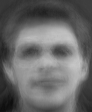

Image after NMF:


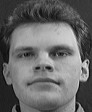

[[48. 42. 52. ... 58. 52. 54.]
 [46. 46. 47. ... 62. 50. 54.]
 [44. 49. 48. ... 55. 58. 55.]
 ...
 [34. 32. 31. ... 52. 51. 44.]
 [33. 36. 32. ... 48. 52. 49.]
 [32. 35. 29. ... 46. 51. 48.]]
Image Before NMF:
-------------------------------Number of image: 72
[[111. 111. 112. ... 115. 114. 114.]
 [111. 111. 111. ... 115. 115. 115.]
 [111. 111. 111. ... 114. 115. 115.]
 ...
 [ 88.  88.  90. ...  75.  76.  75.]
 [ 90.  90.  92. ...  75.  75.  77.]
 [ 92.  92.  95. ...  74.  75.  77.]]


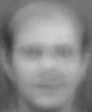

Image after NMF:


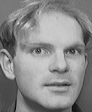

[[121. 119. 121. ... 112. 116. 111.]
 [118. 122. 121. ... 112. 116. 113.]
 [121. 120. 120. ... 113. 114. 114.]
 ...
 [ 87.  76.  74. ...  83.  83.  82.]
 [ 81.  71.  71. ...  83.  83.  82.]
 [ 82.  65.  66. ...  83.  80.  86.]]
Image Before NMF:
-------------------------------Number of image: 73
[[ 89.  89.  89. ...  83.  83.  83.]
 [ 89.  89.  88. ...  83.  83.  83.]
 [ 88.  89.  89. ...  83.  83.  82.]
 ...
 [173. 175. 177. ... 106. 103. 101.]
 [177. 178. 180. ... 109. 109. 108.]
 [176. 180. 183. ... 110. 109. 109.]]


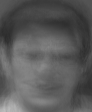

Image after NMF:


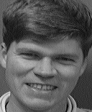

[[ 93.  92.  98. ... 101.  99. 102.]
 [ 96.  94.  92. ... 102.  99. 102.]
 [ 93.  92.  94. ...  99. 101. 100.]
 ...
 [205. 169. 187. ...  84.  56.  61.]
 [205. 186. 170. ... 118. 111. 113.]
 [203. 196. 179. ... 118. 119. 130.]]
Image Before NMF:
-------------------------------Number of image: 74
[[ 47.  47.  47. ...  46.  45.  46.]
 [ 47.  47.  48. ...  46.  46.  46.]
 [ 47.  48.  48. ...  46.  46.  46.]
 ...
 [133. 134. 136. ...  99.  96.  95.]
 [137. 140. 141. ... 104. 102.  99.]
 [139. 146. 147. ... 110. 108. 102.]]


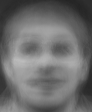

Image after NMF:


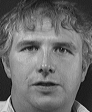

[[ 45.  38.  40. ...  38.  36.  42.]
 [ 44.  41.  40. ...  38.  37.  39.]
 [ 45.  35.  41. ...  37.  35.  40.]
 ...
 [201. 180. 199. ...  40.  41.  41.]
 [185. 188. 210. ...  21.  41.  41.]
 [184. 210. 194. ... 135.  24.  36.]]
Image Before NMF:
-------------------------------Number of image: 75
[[70. 70. 70. ... 73. 73. 73.]
 [70. 70. 69. ... 73. 73. 73.]
 [71. 70. 70. ... 73. 74. 73.]
 ...
 [37. 35. 36. ... 47. 46. 46.]
 [35. 35. 36. ... 47. 47. 46.]
 [37. 37. 37. ... 50. 49. 48.]]


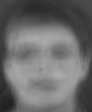

Image after NMF:


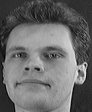

[[46. 45. 47. ... 47. 46. 48.]
 [45. 48. 42. ... 46. 46. 47.]
 [46. 48. 45. ... 49. 46. 49.]
 ...
 [42. 38. 42. ... 48. 46. 40.]
 [41. 43. 41. ... 51. 48. 44.]
 [40. 37. 43. ... 46. 50. 50.]]
Image Before NMF:
-------------------------------Number of image: 76
[[ 55.  55.  55. ...  50.  50.  50.]
 [ 55.  55.  56. ...  50.  50.  50.]
 [ 56.  56.  56. ...  50.  51.  51.]
 ...
 [ 98.  99. 100. ...  80.  81.  81.]
 [105. 107. 110. ...  85.  84.  81.]
 [110. 118. 120. ...  94.  91.  84.]]


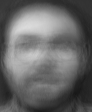

Image after NMF:


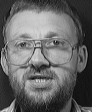

[[ 51.  46.  48. ...  33.  40.  39.]
 [ 46.  50.  44. ...  37.  43.  38.]
 [ 48.  47.  45. ...  38.  38.  37.]
 ...
 [ 46.  31.  72. ... 104. 114. 121.]
 [ 91. 100. 176. ... 145. 122. 121.]
 [148. 197. 197. ... 196. 173. 110.]]
Image Before NMF:
-------------------------------Number of image: 77
[[133. 133. 133. ... 130. 129. 129.]
 [133. 134. 133. ... 129. 129. 129.]
 [133. 133. 133. ... 129. 129. 129.]
 ...
 [114. 110. 113. ...  74.  71.  71.]
 [113. 110. 114. ...  73.  74.  74.]
 [112. 111. 115. ...  73.  74.  75.]]


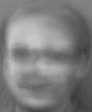

Image after NMF:


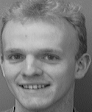

[[133. 132. 131. ... 124. 123. 120.]
 [133. 130. 130. ... 123. 123. 123.]
 [131. 132. 130. ... 123. 122. 125.]
 ...
 [105.  99. 106. ...  52.  53.  55.]
 [106. 101. 107. ...  51.  54.  52.]
 [108. 112. 116. ...  53.  48.  58.]]
Image Before NMF:
-------------------------------Number of image: 78
[[93. 92. 92. ... 90. 90. 90.]
 [92. 93. 93. ... 90. 90. 90.]
 [93. 92. 93. ... 90. 90. 90.]
 ...
 [44. 42. 43. ... 47. 47. 48.]
 [45. 45. 46. ... 50. 49. 47.]
 [47. 49. 51. ... 55. 53. 49.]]


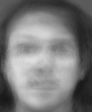

Image after NMF:


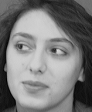

[[116. 116. 117. ... 115. 110. 114.]
 [116. 114. 116. ... 113. 110. 112.]
 [116. 112. 117. ... 114. 111. 110.]
 ...
 [ 23.  22.  28. ...  74.  69.  61.]
 [ 27.  29.  29. ...  76.  76.  66.]
 [ 28.  27.  38. ...  83.  76.  77.]]
Image Before NMF:
-------------------------------Number of image: 79
[[149. 148. 148. ... 151. 151. 151.]
 [149. 148. 147. ... 151. 151. 151.]
 [148. 148. 148. ... 151. 152. 151.]
 ...
 [156. 155. 159. ... 128. 129. 128.]
 [159. 157. 162. ... 129. 130. 132.]
 [160. 160. 165. ... 129. 129. 132.]]


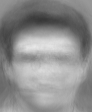

Image after NMF:


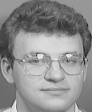

[[155. 154. 153. ... 150. 151. 150.]
 [152. 154. 151. ... 151. 150. 149.]
 [155. 154. 154. ... 151. 150. 151.]
 ...
 [133. 140. 150. ... 111. 111. 110.]
 [161. 145. 141. ... 115. 110. 111.]
 [165. 141. 156. ... 113. 110. 111.]]
Image Before NMF:
-------------------------------Number of image: 80
[[ 59.  58.  58. ...  53.  53.  53.]
 [ 59.  58.  59. ...  53.  53.  52.]
 [ 59.  59.  58. ...  53.  53.  53.]
 ...
 [107. 109. 110. ...  87.  88.  89.]
 [115. 115. 120. ...  90.  90.  89.]
 [119. 127. 129. ...  98.  96.  91.]]


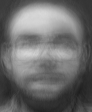

Image after NMF:


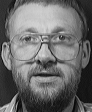

[[ 50.  49.  50. ...  41.  42.  38.]
 [ 55.  46.  50. ...  39.  39.  36.]
 [ 50.  49.  49. ...  37.  42.  38.]
 ...
 [183. 165. 145. ... 118. 114. 105.]
 [133. 148. 155. ... 120. 118. 116.]
 [144. 150. 169. ... 159. 111. 117.]]
Image Before NMF:
-------------------------------Number of image: 81
[[ 37.  38.  37. ...  37.  37.  37.]
 [ 38.  38.  38. ...  38.  38.  38.]
 [ 38.  39.  39. ...  37.  38.  38.]
 ...
 [162. 160. 163. ... 118. 111. 111.]
 [162. 165. 166. ... 122. 120. 116.]
 [163. 169. 171. ... 129. 127. 121.]]


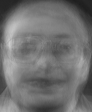

Image after NMF:


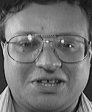

[[ 37.  36.  34. ...  30.  33.  34.]
 [ 44.  35.  40. ...  34.  31.  38.]
 [ 40.  35.  42. ...  30.  33.  35.]
 ...
 [215. 167. 154. ... 201. 211. 166.]
 [204. 159. 164. ... 186. 212. 189.]
 [189. 155. 179. ... 160. 207. 210.]]
Image Before NMF:
-------------------------------Number of image: 82
[[70. 69. 69. ... 76. 76. 77.]
 [69. 69. 68. ... 77. 76. 77.]
 [71. 69. 69. ... 76. 78. 77.]
 ...
 [27. 25. 26. ... 55. 56. 57.]
 [27. 27. 28. ... 56. 54. 55.]
 [31. 30. 31. ... 59. 57. 56.]]


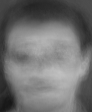

Image after NMF:


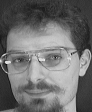

[[ 47.  43.  48. ...  50.  53.  55.]
 [ 47.  46.  48. ...  52.  51.  52.]
 [ 46.  49.  45. ...  54.  52.  55.]
 ...
 [ 47.  47.  42. ...  47.  48.  49.]
 [ 44.  57.  59. ...  49.  50.  50.]
 [102. 115. 122. ...  45.  49.  50.]]
Image Before NMF:
-------------------------------Number of image: 83
[[ 49.  47.  48. ...  41.  41.  41.]
 [ 48.  48.  49. ...  41.  41.  41.]
 [ 49.  49.  49. ...  41.  41.  41.]
 ...
 [100. 103. 103. ...  81.  82.  82.]
 [108. 110. 113. ...  86.  85.  82.]
 [113. 122. 124. ...  95.  92.  85.]]


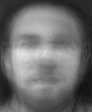

Image after NMF:


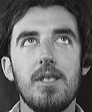

[[51. 48. 43. ... 43. 42. 38.]
 [44. 48. 46. ... 43. 42. 36.]
 [51. 45. 50. ... 40. 38. 43.]
 ...
 [60. 48. 56. ... 26. 28. 35.]
 [52. 50. 55. ... 31. 26. 32.]
 [47. 50. 47. ... 29. 28. 32.]]
Image Before NMF:
-------------------------------Number of image: 84
[[130. 130. 130. ... 127. 127. 126.]
 [130. 130. 129. ... 127. 127. 126.]
 [130. 130. 130. ... 127. 127. 127.]
 ...
 [116. 112. 115. ...  76.  73.  73.]
 [115. 113. 117. ...  75.  76.  76.]
 [115. 113. 117. ...  75.  76.  77.]]


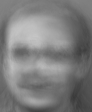

Image after NMF:


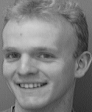

[[131. 133. 128. ... 124. 122. 126.]
 [130. 133. 131. ... 121. 123. 124.]
 [130. 134. 130. ... 122. 121. 121.]
 ...
 [104. 104. 102. ...  55.  50.  57.]
 [104. 102. 107. ...  57.  52.  59.]
 [111. 113. 117. ...  54.  53.  56.]]
Image Before NMF:
-------------------------------Number of image: 85
[[145. 144. 144. ... 145. 145. 145.]
 [144. 144. 143. ... 145. 145. 145.]
 [144. 144. 144. ... 145. 146. 145.]
 ...
 [165. 164. 167. ... 130. 130. 130.]
 [167. 167. 171. ... 132. 132. 134.]
 [169. 169. 174. ... 133. 132. 134.]]


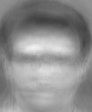

Image after NMF:


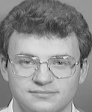

[[156. 158. 155. ... 153. 149. 152.]
 [156. 155. 156. ... 152. 152. 152.]
 [155. 156. 155. ... 150. 152. 148.]
 ...
 [133. 142. 151. ... 113. 113. 112.]
 [158. 198. 216. ... 111. 111. 112.]
 [219. 219. 217. ... 113. 110. 108.]]
Image Before NMF:
-------------------------------Number of image: 86
[[49. 49. 49. ... 42. 41. 42.]
 [49. 50. 49. ... 42. 42. 42.]
 [50. 50. 50. ... 42. 43. 42.]
 ...
 [89. 90. 91. ... 54. 50. 50.]
 [92. 94. 95. ... 57. 55. 53.]
 [94. 98. 98. ... 61. 60. 56.]]


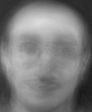

Image after NMF:


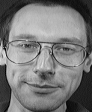

[[46. 42. 46. ... 36. 37. 43.]
 [43. 45. 44. ... 46. 35. 36.]
 [42. 40. 47. ... 39. 39. 39.]
 ...
 [62. 49. 53. ... 25. 26. 25.]
 [60. 55. 48. ... 22. 23. 27.]
 [62. 52. 52. ... 39. 22. 14.]]
Image Before NMF:
-------------------------------Number of image: 87
[[ 95.  96.  96. ...  95.  94.  95.]
 [ 95.  96.  96. ...  95.  95.  95.]
 [ 96.  96.  96. ...  95.  95.  95.]
 ...
 [121. 122. 124. ...  82.  80.  79.]
 [125. 127. 128. ...  84.  83.  83.]
 [127. 129. 130. ...  85.  83.  84.]]


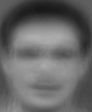

Image after NMF:


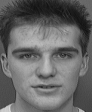

[[106. 106. 110. ... 104. 105. 103.]
 [107. 106. 108. ... 102. 104. 102.]
 [107. 107. 107. ... 101. 104. 103.]
 ...
 [132. 177. 200. ...  69.  69.  69.]
 [185. 198. 203. ...  69.  68.  68.]
 [188. 199. 204. ...  69.  69.  68.]]
Image Before NMF:
-------------------------------Number of image: 88
[[113. 112. 113. ... 114. 114. 114.]
 [113. 112. 112. ... 114. 114. 114.]
 [113. 112. 112. ... 114. 114. 114.]
 ...
 [ 81.  82.  84. ...  69.  71.  71.]
 [ 85.  84.  88. ...  68.  70.  72.]
 [ 88.  89.  91. ...  69.  69.  71.]]


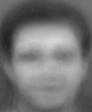

Image after NMF:


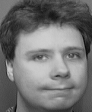

[[122. 121. 121. ... 119. 120. 121.]
 [122. 124. 124. ... 119. 120. 122.]
 [122. 123. 122. ... 118. 121. 122.]
 ...
 [ 73.  75.  75. ...  83.  83.  85.]
 [ 74.  72.  75. ...  78.  83.  79.]
 [ 74.  73.  72. ...  78.  78.  80.]]
Image Before NMF:
-------------------------------Number of image: 89
[[ 34.  35.  35. ...  30.  30.  30.]
 [ 34.  35.  35. ...  30.  31.  31.]
 [ 35.  35.  36. ...  30.  31.  30.]
 ...
 [198. 200. 203. ... 130. 124. 123.]
 [203. 208. 208. ... 136. 133. 129.]
 [204. 213. 214. ... 142. 139. 133.]]


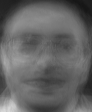

Image after NMF:


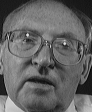

[[ 28.  25.  27. ...  20.  22.  23.]
 [ 24.  27.  27. ...  18.  24.  22.]
 [ 28.  26.  27. ...  24.  22.  23.]
 ...
 [188. 180. 171. ... 183. 188. 188.]
 [190. 185. 173. ... 185. 188. 190.]
 [194. 186. 178. ... 187. 187. 190.]]
Image Before NMF:
-------------------------------Number of image: 90
[[125. 125. 126. ... 120. 119. 119.]
 [125. 126. 126. ... 119. 119. 119.]
 [125. 125. 126. ... 120. 119. 119.]
 ...
 [118. 120. 122. ...  68.  68.  67.]
 [123. 123. 126. ...  69.  70.  71.]
 [124. 126. 129. ...  68.  69.  70.]]


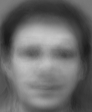

Image after NMF:


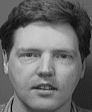

[[106. 104. 104. ... 100.  94. 102.]
 [108. 106. 105. ...  97.  98. 101.]
 [104. 106. 101. ... 101.  96. 101.]
 ...
 [126. 125. 151. ...  43.  40.  38.]
 [ 99. 119. 142. ...  61.  59.  54.]
 [115. 152. 106. ...  74.  66.  68.]]
Image Before NMF:
-------------------------------Number of image: 91
[[113. 112. 113. ... 113. 113. 113.]
 [113. 112. 113. ... 113. 113. 113.]
 [113. 112. 112. ... 113. 113. 113.]
 ...
 [101. 102. 105. ...  82.  85.  85.]
 [109. 107. 113. ...  81.  83.  85.]
 [113. 116. 119. ...  83.  84.  85.]]


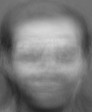

Image after NMF:


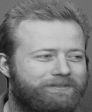

[[108. 108. 111. ... 107. 112. 108.]
 [111. 111. 111. ... 113. 110. 109.]
 [112. 111. 110. ... 112. 111. 109.]
 ...
 [ 98.  94.  88. ...  69.  67.  68.]
 [ 99.  92.  85. ...  63.  74.  73.]
 [101.  87.  97. ...  64.  71.  75.]]
Image Before NMF:
-------------------------------Number of image: 92
[[ 92.  92.  91. ...  89.  89.  89.]
 [ 92.  92.  91. ...  89.  89.  89.]
 [ 92.  92.  92. ...  89.  89.  89.]
 ...
 [119. 119. 120. ...  82.  81.  80.]
 [121. 121. 124. ...  84.  84.  84.]
 [122. 123. 126. ...  85.  84.  84.]]


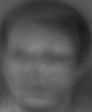

Image after NMF:


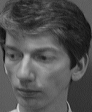

[[ 98. 103.  98. ...  93.  92.  95.]
 [104. 100. 104. ...  93.  95.  93.]
 [102. 100.  99. ...  97.  93.  93.]
 ...
 [ 95.  88.  94. ...  50.  50.  50.]
 [ 93.  91.  95. ...  55.  49.  54.]
 [ 94.  93.  96. ...  57.  50.  48.]]
Image Before NMF:
-------------------------------Number of image: 93
[[ 35.  36.  36. ...  30.  30.  30.]
 [ 36.  36.  36. ...  30.  31.  31.]
 [ 36.  37.  37. ...  30.  31.  31.]
 ...
 [190. 192. 194. ... 123. 118. 117.]
 [194. 198. 199. ... 129. 127. 123.]
 [195. 204. 205. ... 134. 132. 127.]]


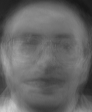

Image after NMF:


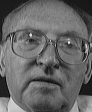

[[ 28.  25.  28. ...  23.  21.  24.]
 [ 29.  27.  25. ...  22.  22.  20.]
 [ 29.  27.  24. ...  24.  20.  23.]
 ...
 [202. 200. 190. ... 168. 171. 175.]
 [201. 201. 192. ... 178. 173. 176.]
 [193. 202. 189. ... 182. 183. 178.]]
Image Before NMF:
-------------------------------Number of image: 94
[[127. 127. 128. ... 126. 126. 126.]
 [127. 128. 127. ... 126. 126. 126.]
 [127. 127. 127. ... 126. 126. 126.]
 ...
 [106. 106. 108. ...  74.  75.  75.]
 [110. 111. 114. ...  75.  75.  76.]
 [114. 115. 117. ...  75.  75.  76.]]


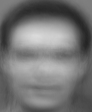

Image after NMF:


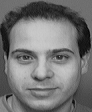

[[111. 114. 112. ... 112. 108. 110.]
 [112. 113. 111. ... 112. 111. 111.]
 [113. 109. 112. ... 109. 111. 108.]
 ...
 [141. 135. 133. ...  84.  84.  84.]
 [137. 135. 136. ...  89.  90.  88.]
 [138. 135. 138. ...  88.  86.  92.]]
Image Before NMF:
-------------------------------Number of image: 95
[[58. 58. 59. ... 63. 62. 63.]
 [58. 59. 58. ... 64. 63. 63.]
 [59. 58. 59. ... 63. 64. 63.]
 ...
 [19. 18. 19. ... 34. 33. 34.]
 [19. 21. 21. ... 34. 33. 32.]
 [23. 24. 23. ... 36. 36. 34.]]


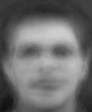

Image after NMF:


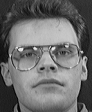

[[45. 45. 48. ... 53. 51. 54.]
 [46. 42. 49. ... 53. 52. 55.]
 [44. 48. 45. ... 48. 58. 48.]
 ...
 [34. 32. 33. ... 47. 42. 38.]
 [37. 29. 34. ... 59. 52. 47.]
 [37. 31. 36. ... 76. 79. 70.]]
Image Before NMF:
-------------------------------Number of image: 96
[[52. 52. 53. ... 61. 60. 61.]
 [52. 52. 53. ... 61. 61. 61.]
 [53. 52. 53. ... 61. 61. 62.]
 ...
 [23. 23. 25. ... 47. 47. 48.]
 [24. 24. 24. ... 46. 46. 46.]
 [27. 27. 27. ... 49. 49. 48.]]


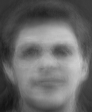

Image after NMF:


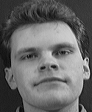

[[48. 43. 51. ... 55. 56. 58.]
 [46. 46. 44. ... 59. 58. 59.]
 [44. 44. 46. ... 58. 59. 59.]
 ...
 [30. 35. 34. ... 41. 39. 53.]
 [29. 37. 33. ... 41. 38. 44.]
 [33. 34. 35. ... 45. 42. 39.]]
Image Before NMF:
-------------------------------Number of image: 97
[[ 97.  98.  98. ...  95.  95.  95.]
 [ 98.  98.  97. ...  95.  95.  95.]
 [ 97.  98.  98. ...  95.  95.  95.]
 ...
 [107. 107. 109. ...  71.  70.  69.]
 [109. 108. 111. ...  72.  72.  73.]
 [108. 109. 112. ...  71.  72.  73.]]


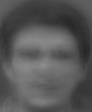

Image after NMF:


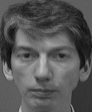

[[ 98. 100.  99. ...  93.  92.  96.]
 [ 97. 103.  99. ...  94.  93.  96.]
 [ 98.  97.  98. ...  92.  93.  95.]
 ...
 [ 85.  92.  91. ...  50.  56.  48.]
 [ 85.  94.  87. ...  52.  50.  50.]
 [ 90.  91.  92. ...  53.  48.  52.]]
Image Before NMF:
-------------------------------Number of image: 98
[[120. 119. 119. ... 128. 128. 129.]
 [120. 119. 119. ... 129. 129. 129.]
 [120. 119. 119. ... 128. 129. 130.]
 ...
 [ 63.  59.  61. ...  84.  86.  87.]
 [ 63.  61.  64. ...  85.  85.  86.]
 [ 66.  65.  68. ...  88.  86.  86.]]


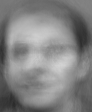

Image after NMF:


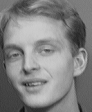

[[119. 120. 120. ... 129. 128. 124.]
 [118. 121. 120. ... 126. 124. 127.]
 [120. 119. 118. ... 121. 128. 127.]
 ...
 [ 64.  61.  64. ...  89.  92.  88.]
 [ 64.  63.  58. ...  93.  90.  92.]
 [ 65.  61.  63. ...  89.  94.  85.]]
Image Before NMF:
-------------------------------Number of image: 99
[[104. 104. 105. ... 103. 103. 103.]
 [104. 105. 105. ... 103. 103. 103.]
 [105. 104. 105. ... 103. 103. 103.]
 ...
 [140. 142. 144. ...  93.  93.  93.]
 [147. 148. 152. ...  96.  95.  96.]
 [150. 154. 156. ...  97.  96.  96.]]


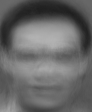

Image after NMF:


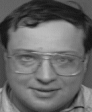

[[ 98.  98. 101. ...  89.  91.  92.]
 [ 96.  97.  98. ...  91.  89.  91.]
 [ 99.  98.  97. ...  92.  87.  90.]
 ...
 [134. 152. 140. ... 146. 140. 136.]
 [139. 152. 141. ... 144. 135. 141.]
 [144. 146. 146. ... 130. 150. 157.]]
Image Before NMF:
-------------------------------Number of image: 100
[[ 52.  53.  53. ...  45.  44.  44.]
 [ 52.  54.  53. ...  44.  44.  44.]
 [ 53.  53.  54. ...  44.  45.  44.]
 ...
 [ 91.  93.  93. ...  48.  45.  44.]
 [ 95.  98.  98. ...  51.  49.  47.]
 [ 96. 101. 101. ...  53.  53.  49.]]


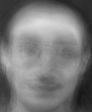

Image after NMF:


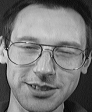

[[46. 45. 42. ... 36. 40. 36.]
 [37. 49. 45. ... 39. 42. 38.]
 [51. 39. 50. ... 37. 43. 32.]
 ...
 [58. 54. 50. ... 23. 25. 23.]
 [58. 53. 50. ... 21. 26. 26.]
 [61. 49. 55. ... 24. 21. 24.]]
Image Before NMF:
-------------------------------Number of image: 101
[[104. 104. 105. ... 105. 104. 104.]
 [104. 104. 104. ... 105. 105. 104.]
 [104. 104. 104. ... 105. 105. 105.]
 ...
 [ 75.  76.  78. ...  57.  58.  58.]
 [ 79.  79.  82. ...  56.  57.  59.]
 [ 82.  83.  85. ...  56.  57.  58.]]


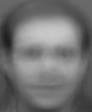

Image after NMF:


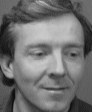

[[101. 106. 102. ... 108. 107. 108.]
 [101. 104. 102. ... 106. 108. 105.]
 [ 99. 104. 102. ... 108. 106. 111.]
 ...
 [ 64.  69.  75. ...  42.  48.  48.]
 [ 74.  81.  85. ...  46.  48.  44.]
 [ 77.  83.  84. ...  46.  50.  45.]]
Image Before NMF:
-------------------------------Number of image: 102
[[ 54.  53.  54. ...  48.  48.  48.]
 [ 54.  53.  55. ...  48.  48.  48.]
 [ 54.  54.  54. ...  48.  48.  48.]
 ...
 [109. 111. 113. ...  85.  86.  86.]
 [118. 118. 122. ...  88.  88.  87.]
 [121. 129. 132. ...  95.  94.  89.]]


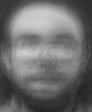

Image after NMF:


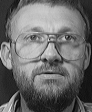

[[ 52.  39.  51. ...  41.  41.  42.]
 [ 53.  49.  49. ...  42.  40.  42.]
 [ 48.  49.  49. ...  41.  42.  35.]
 ...
 [145. 154. 117. ... 104. 104. 102.]
 [165. 153.  97. ... 120. 100. 107.]
 [147. 126. 169. ... 133. 138. 103.]]
Image Before NMF:
-------------------------------Number of image: 103
[[120. 120. 120. ... 114. 114. 114.]
 [120. 120. 119. ... 114. 113. 113.]
 [120. 120. 120. ... 114. 113. 113.]
 ...
 [ 22.  21.  22. ...  14.  16.  16.]
 [ 23.  20.  23. ...  11.  13.  16.]
 [ 23.  21.  23. ...   9.  11.  14.]]


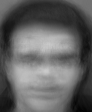

Image after NMF:


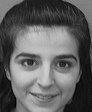

[[138. 135. 135. ... 128. 129. 126.]
 [136. 135. 136. ... 130. 128. 126.]
 [134. 135. 134. ... 132. 128. 128.]
 ...
 [ 43.  26.  28. ...  14.  22.  22.]
 [ 37.  27.  26. ...  16.  23.  25.]
 [ 39.  27.  26. ...  23.  18.  35.]]
Image Before NMF:
-------------------------------Number of image: 104
[[ 98.  99.  99. ...  96.  96.  95.]
 [ 99.  99.  99. ...  96.  96.  96.]
 [ 98.  99.  99. ...  96.  96.  96.]
 ...
 [158. 161. 162. ... 104. 103. 103.]
 [165. 166. 169. ... 107. 107. 107.]
 [166. 171. 174. ... 109. 108. 108.]]


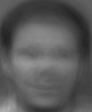

Image after NMF:


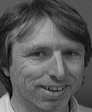

[[ 93.  93.  88. ...  84.  81.  82.]
 [ 91.  89.  92. ...  82.  82.  82.]
 [ 92.  90.  93. ...  83.  83.  77.]
 ...
 [205. 202. 202. ... 110. 106. 109.]
 [205. 204. 203. ... 108. 111. 109.]
 [203. 205. 204. ... 112. 111. 111.]]
Image Before NMF:
-------------------------------Number of image: 105
[[152. 151. 151. ... 154. 155. 155.]
 [152. 151. 150. ... 155. 154. 155.]
 [151. 151. 151. ... 154. 155. 155.]
 ...
 [146. 144. 148. ... 121. 122. 121.]
 [148. 147. 151. ... 122. 123. 125.]
 [149. 149. 154. ... 123. 122. 124.]]


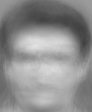

Image after NMF:


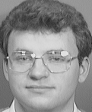

[[153. 152. 152. ... 151. 151. 149.]
 [153. 154. 155. ... 147. 148. 151.]
 [155. 151. 157. ... 150. 151. 150.]
 ...
 [134. 141. 146. ... 109. 112. 111.]
 [143. 135. 132. ... 109. 113. 109.]
 [139. 139. 184. ... 110. 108. 114.]]
Image Before NMF:
-------------------------------Number of image: 106
[[124. 124. 124. ... 121. 121. 120.]
 [124. 124. 124. ... 121. 121. 120.]
 [124. 124. 124. ... 121. 120. 120.]
 ...
 [107. 106. 107. ...  77.  77.  77.]
 [110. 109. 113. ...  79.  78.  78.]
 [112. 114. 117. ...  81.  80.  79.]]


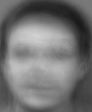

Image after NMF:


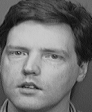

[[108. 112. 109. ... 105. 108. 103.]
 [113. 111. 111. ... 108. 105. 105.]
 [113. 109. 113. ... 106. 108. 105.]
 ...
 [ 94. 138. 115. ...  67.  70.  66.]
 [119. 148. 112. ...  76.  65.  70.]
 [130. 148. 101. ...  73.  64.  69.]]
Image Before NMF:
-------------------------------Number of image: 107
[[56. 56. 57. ... 61. 60. 61.]
 [56. 57. 57. ... 62. 61. 61.]
 [58. 56. 57. ... 61. 62. 62.]
 ...
 [51. 53. 54. ... 52. 52. 52.]
 [55. 57. 58. ... 52. 52. 52.]
 [60. 62. 62. ... 55. 54. 53.]]


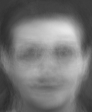

Image after NMF:


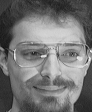

[[53. 58. 57. ... 56. 56. 58.]
 [56. 58. 55. ... 57. 55. 58.]
 [57. 55. 60. ... 59. 54. 57.]
 ...
 [55. 52. 51. ... 45. 43. 42.]
 [54. 57. 54. ... 44. 41. 42.]
 [57. 55. 52. ... 38. 47. 39.]]
Image Before NMF:
-------------------------------Number of image: 108
[[ 55.  56.  56. ...  54.  53.  53.]
 [ 56.  56.  56. ...  54.  54.  54.]
 [ 56.  56.  57. ...  54.  54.  54.]
 ...
 [125. 127. 128. ...  87.  86.  85.]
 [131. 134. 135. ...  92.  90.  88.]
 [134. 140. 141. ...  96.  94.  90.]]


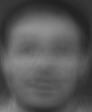

Image after NMF:


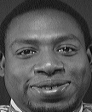

[[ 50.  54.  61. ...  50.  50.  54.]
 [ 58.  56.  60. ...  53.  57.  48.]
 [ 54.  56.  56. ...  53.  57.  54.]
 ...
 [129. 103. 119. ...  58.  73.  83.]
 [116. 207. 196. ... 116.  77.  91.]
 [102. 230. 209. ... 152. 165.  67.]]
Image Before NMF:
-------------------------------Number of image: 109
[[127. 127. 127. ... 126. 127. 126.]
 [127. 127. 127. ... 126. 126. 126.]
 [127. 127. 127. ... 126. 126. 126.]
 ...
 [116. 114. 116. ...  90.  90.  90.]
 [118. 116. 120. ...  91.  91.  92.]
 [119. 119. 123. ...  92.  92.  93.]]


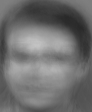

Image after NMF:


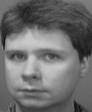

[[121. 118. 117. ... 127. 124. 127.]
 [117. 117. 117. ... 126. 123. 125.]
 [120. 120. 119. ... 122. 125. 124.]
 ...
 [ 90.  97.  89. ...  90.  90.  90.]
 [102. 105.  89. ...  86.  84.  89.]
 [ 99. 106. 101. ...  74.  84.  90.]]
Image Before NMF:
-------------------------------Number of image: 110
[[100. 100. 100. ...  97.  97.  96.]
 [101. 100. 101. ...  97.  97.  97.]
 [100. 101. 101. ...  97.  97.  97.]
 ...
 [169. 170. 172. ... 111. 109. 108.]
 [174. 175. 178. ... 115. 114. 113.]
 [174. 179. 182. ... 117. 115. 114.]]


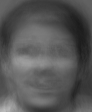

Image after NMF:


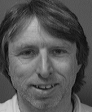

[[ 86.  90.  87. ...  84.  86.  85.]
 [ 85.  88.  90. ...  81.  86.  86.]
 [ 87.  88.  89. ...  83.  85.  83.]
 ...
 [199. 199. 196. ... 122. 122. 125.]
 [196. 190. 191. ... 127. 126. 124.]
 [192. 199. 201. ... 127. 124. 126.]]
Image Before NMF:
-------------------------------Number of image: 111
[[63. 62. 62. ... 66. 66. 67.]
 [62. 63. 61. ... 67. 67. 67.]
 [63. 62. 63. ... 66. 68. 67.]
 ...
 [42. 40. 41. ... 56. 55. 56.]
 [40. 41. 41. ... 58. 56. 55.]
 [42. 42. 43. ... 61. 59. 57.]]


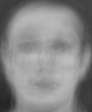

Image after NMF:


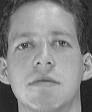

[[41. 47. 47. ... 52. 46. 49.]
 [44. 43. 43. ... 50. 49. 46.]
 [48. 47. 46. ... 50. 48. 47.]
 ...
 [43. 44. 44. ... 36. 37. 35.]
 [45. 44. 45. ... 37. 39. 33.]
 [46. 41. 47. ... 35. 37. 38.]]
Image Before NMF:
-------------------------------Number of image: 112
[[ 50.  50.  50. ...  48.  48.  48.]
 [ 50.  50.  51. ...  48.  48.  48.]
 [ 51.  51.  51. ...  48.  48.  48.]
 ...
 [124. 126. 127. ...  90.  88.  88.]
 [130. 132. 134. ...  94.  93.  90.]
 [133. 139. 140. ... 100.  97.  93.]]


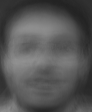

Image after NMF:


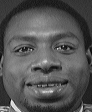

[[ 58.  55.  52. ...  48.  55.  46.]
 [ 51.  59.  55. ...  45.  49.  56.]
 [ 55.  52.  57. ...  51.  53.  52.]
 ...
 [201. 202. 209. ...  78.  82.  80.]
 [124. 106. 120. ...  74.  67.  80.]
 [111. 203. 195. ... 131. 115.  68.]]
Image Before NMF:
-------------------------------Number of image: 113
[[124. 125. 125. ... 119. 118. 118.]
 [125. 125. 125. ... 118. 118. 118.]
 [125. 125. 125. ... 119. 118. 117.]
 ...
 [126. 127. 129. ...  74.  73.  73.]
 [131. 131. 134. ...  76.  76.  76.]
 [132. 134. 137. ...  76.  76.  76.]]


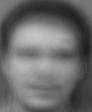

Image after NMF:


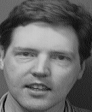

[[103. 109. 105. ... 100.  93. 100.]
 [104. 109. 103. ...  99.  98.  97.]
 [106. 108. 101. ...  98. 100.  96.]
 ...
 [170. 111. 116. ...  40.  32.  40.]
 [166.  93. 119. ...  56.  45.  36.]
 [161.  97. 122. ...  53.  58.  54.]]
Image Before NMF:
-------------------------------Number of image: 114
[[152. 151. 151. ... 153. 153. 153.]
 [152. 151. 150. ... 153. 153. 153.]
 [151. 151. 151. ... 153. 154. 153.]
 ...
 [154. 154. 157. ... 123. 123. 123.]
 [157. 156. 160. ... 124. 125. 127.]
 [158. 158. 163. ... 123. 123. 126.]]


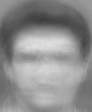

Image after NMF:


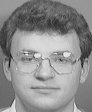

[[155. 154. 154. ... 148. 151. 149.]
 [154. 153. 152. ... 151. 151. 150.]
 [153. 153. 153. ... 151. 151. 150.]
 ...
 [147. 144. 145. ... 108. 113. 108.]
 [159. 142. 133. ... 109. 111. 110.]
 [150. 162. 206. ... 111. 111. 108.]]
Image Before NMF:
-------------------------------Number of image: 115
[[ 44.  43.  44. ...  37.  37.  37.]
 [ 44.  44.  45. ...  37.  37.  37.]
 [ 44.  44.  44. ...  37.  37.  37.]
 ...
 [102. 106. 106. ...  76.  77.  77.]
 [112. 114. 118. ...  80.  79.  77.]
 [117. 127. 128. ...  88.  86.  80.]]


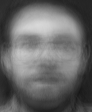

Image after NMF:


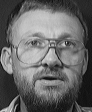

[[ 47.  46.  46. ...  38.  38.  39.]
 [ 47.  45.  47. ...  40.  42.  39.]
 [ 45.  47.  45. ...  39.  38.  43.]
 ...
 [ 39.  47. 132. ...  80.  83.  97.]
 [ 81. 164. 204. ... 105.  93. 102.]
 [185. 200. 162. ... 151. 143.  90.]]
Image Before NMF:
-------------------------------Number of image: 116
[[ 50.  50.  50. ...  51.  50.  51.]
 [ 49.  50.  49. ...  51.  51.  51.]
 [ 50.  50.  51. ...  51.  52.  51.]
 ...
 [ 98.  99. 100. ...  80.  77.  77.]
 [100. 103. 102. ...  84.  81.  80.]
 [102. 105. 105. ...  87.  84.  82.]]


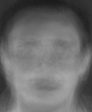

Image after NMF:


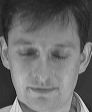

[[ 40.  42.  41. ...  48.  44.  46.]
 [ 41.  42.  42. ...  46.  45.  47.]
 [ 42.  40.  40. ...  48.  51.  46.]
 ...
 [154. 160. 161. ...  38.  45.  50.]
 [172. 174. 180. ...  29.  40.  45.]
 [171. 170. 168. ...  57.  37.  42.]]
Image Before NMF:
-------------------------------Number of image: 117
[[63. 63. 63. ... 64. 64. 64.]
 [63. 63. 64. ... 64. 64. 64.]
 [63. 63. 64. ... 64. 64. 64.]
 ...
 [70. 71. 73. ... 70. 70. 71.]
 [74. 74. 76. ... 71. 72. 71.]
 [77. 82. 83. ... 76. 77. 73.]]


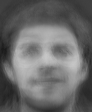

Image after NMF:


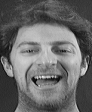

[[48. 52. 51. ... 56. 56. 49.]
 [48. 47. 52. ... 58. 59. 54.]
 [52. 50. 44. ... 60. 57. 57.]
 ...
 [49. 54. 48. ... 54. 50. 55.]
 [51. 50. 47. ... 55. 50. 56.]
 [53. 48. 53. ... 56. 56. 55.]]
Image Before NMF:
-------------------------------Number of image: 118
[[106. 106. 107. ... 105. 105. 104.]
 [107. 106. 106. ... 105. 105. 104.]
 [106. 106. 106. ... 105. 105. 105.]
 ...
 [121. 121. 123. ...  85.  84.  84.]
 [124. 124. 127. ...  85.  86.  87.]
 [125. 127. 130. ...  86.  86.  87.]]


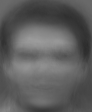

Image after NMF:


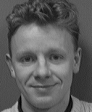

[[ 95.  95.  99. ...  89.  92.  91.]
 [ 98.  96.  95. ...  93.  89.  94.]
 [ 98.  97.  95. ...  90.  89.  92.]
 ...
 [ 74.  72.  71. ... 127. 139. 156.]
 [ 74.  78.  87. ... 126. 158. 149.]
 [ 79. 118. 145. ... 111. 165. 162.]]
Image Before NMF:
-------------------------------Number of image: 119
[[48. 48. 48. ... 45. 44. 45.]
 [48. 49. 48. ... 45. 44. 45.]
 [49. 49. 49. ... 44. 45. 44.]
 ...
 [35. 34. 35. ... 29. 27. 27.]
 [34. 35. 35. ... 30. 29. 27.]
 [35. 37. 37. ... 33. 33. 30.]]


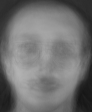

Image after NMF:


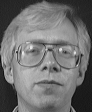

[[37. 35. 35. ... 34. 34. 36.]
 [36. 36. 37. ... 35. 31. 36.]
 [38. 36. 37. ... 35. 32. 33.]
 ...
 [42. 43. 39. ... 24. 29. 26.]
 [34. 44. 43. ... 26. 29. 27.]
 [36. 43. 36. ... 26. 28. 28.]]
Image Before NMF:
-------------------------------Number of image: 120
[[ 81.  82.  82. ...  78.  78.  78.]
 [ 81.  82.  81. ...  78.  78.  79.]
 [ 82.  82.  82. ...  79.  79.  78.]
 ...
 [159. 161. 163. ... 100.  96.  95.]
 [163. 166. 167. ... 104. 102. 101.]
 [165. 168. 170. ... 106. 104. 103.]]


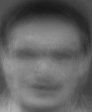

Image after NMF:


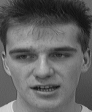

[[112. 110. 113. ... 102. 103. 103.]
 [110. 113. 109. ... 103. 101. 107.]
 [110. 111. 111. ... 104. 104. 104.]
 ...
 [203. 199. 200. ... 106.  67.  62.]
 [203. 198. 203. ... 159. 150. 103.]
 [202. 199. 202. ... 157. 159. 167.]]
Image Before NMF:
-------------------------------Number of image: 121
[[106. 105. 106. ... 110. 109. 109.]
 [106. 105. 105. ... 110. 110. 109.]
 [105. 105. 105. ... 109. 110. 110.]
 ...
 [ 81.  80.  82. ...  75.  77.  77.]
 [ 83.  82.  85. ...  77.  77.  78.]
 [ 85.  85.  88. ...  78.  77.  78.]]


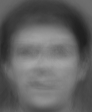

Image after NMF:


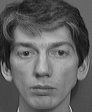

[[104. 101. 104. ... 104. 102. 103.]
 [104. 104. 103. ... 103. 101. 101.]
 [102. 106. 102. ... 101. 103. 102.]
 ...
 [ 73.  69.  70. ...  76.  78.  73.]
 [ 73.  74.  72. ...  75.  75.  79.]
 [ 75.  75.  73. ...  78.  73.  79.]]
Image Before NMF:
-------------------------------Number of image: 122
[[ 49.  49.  49. ...  44.  45.  44.]
 [ 49.  49.  50. ...  45.  45.  44.]
 [ 50.  50.  49. ...  44.  45.  45.]
 ...
 [ 89.  89.  91. ...  69.  68.  69.]
 [ 94.  94.  98. ...  71.  71.  69.]
 [ 97. 103. 105. ...  77.  76.  72.]]


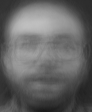

Image after NMF:


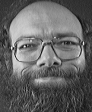

[[55. 47. 50. ... 47. 44. 49.]
 [47. 52. 47. ... 45. 46. 46.]
 [49. 53. 48. ... 42. 48. 46.]
 ...
 [71. 67. 72. ... 46. 59. 45.]
 [68. 71. 65. ... 49. 49. 67.]
 [64. 71. 62. ... 48. 46. 72.]]
Image Before NMF:
-------------------------------Number of image: 123
[[107. 107. 107. ... 105. 105. 105.]
 [107. 107. 107. ... 105. 105. 105.]
 [107. 107. 107. ... 105. 105. 106.]
 ...
 [113. 115. 118. ...  80.  82.  82.]
 [121. 121. 126. ...  80.  82.  83.]
 [125. 128. 131. ...  81.  82.  83.]]


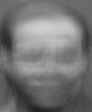

Image after NMF:


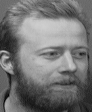

[[113. 105. 109. ... 102. 108. 108.]
 [109. 105. 111. ... 110. 103. 106.]
 [107. 108. 107. ... 110. 101. 107.]
 ...
 [110.  94.  95. ...  41.  55.  40.]
 [103. 106.  95. ...  47.  44.  47.]
 [104. 104.  95. ...  48.  37.  51.]]
Image Before NMF:
-------------------------------Number of image: 124
[[ 37.  36.  37. ...  34.  34.  34.]
 [ 37.  37.  38. ...  34.  34.  34.]
 [ 38.  37.  37. ...  34.  35.  35.]
 ...
 [ 96.  98.  99. ...  85.  84.  85.]
 [103. 105. 108. ...  88.  87.  84.]
 [108. 117. 118. ...  97.  95.  88.]]


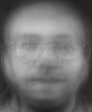

Image after NMF:


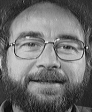

[[ 52.  52.  46. ...  41.  49.  45.]
 [ 48.  54.  50. ...  48.  47.  43.]
 [ 49.  54.  51. ...  45.  50.  52.]
 ...
 [142.  98.  87. ...  84.  65.  45.]
 [137. 105.  84. ...  84.  74.  44.]
 [138. 116.  90. ...  88.  82.  52.]]
Image Before NMF:
-------------------------------Number of image: 125
[[114. 114. 115. ... 116. 116. 116.]
 [114. 114. 114. ... 116. 115. 116.]
 [114. 114. 114. ... 116. 116. 116.]
 ...
 [ 79.  79.  82. ...  71.  73.  73.]
 [ 83.  82.  85. ...  70.  72.  74.]
 [ 86.  86.  89. ...  70.  71.  73.]]


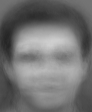

Image after NMF:


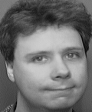

[[126. 124. 125. ... 119. 119. 122.]
 [122. 124. 123. ... 120. 122. 119.]
 [124. 124. 123. ... 123. 121. 122.]
 ...
 [ 78.  70.  75. ...  82.  79.  84.]
 [ 71.  77.  80. ...  76.  81.  78.]
 [ 73.  89.  97. ...  76.  81.  78.]]
Image Before NMF:
-------------------------------Number of image: 126
[[110. 110. 111. ... 106. 106. 105.]
 [110. 111. 110. ... 106. 106. 105.]
 [110. 110. 110. ... 106. 105. 105.]
 ...
 [ 43.  42.  43. ...  24.  24.  24.]
 [ 44.  42.  46. ...  21.  23.  24.]
 [ 45.  44.  46. ...  20.  22.  24.]]


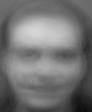

Image after NMF:


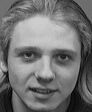

[[111. 110. 111. ... 113. 104. 110.]
 [112. 111. 114. ... 111. 109. 111.]
 [112. 109. 112. ... 109. 106. 111.]
 ...
 [ 40.  36.  35. ...  29.  34.  30.]
 [ 30.  36.  47. ...  36.  39.  36.]
 [ 44.  37.  39. ...  35.  40.  29.]]
Image Before NMF:
-------------------------------Number of image: 127
[[107. 106. 106. ... 111. 111. 111.]
 [107. 106. 106. ... 111. 111. 111.]
 [106. 106. 106. ... 111. 111. 111.]
 ...
 [ 82.  82.  83. ...  80.  82.  82.]
 [ 85.  84.  87. ...  82.  82.  83.]
 [ 87.  88.  91. ...  84.  82.  83.]]


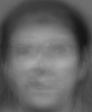

Image after NMF:


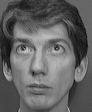

[[103. 104. 105. ... 102. 103. 103.]
 [104. 105. 105. ... 103. 102. 100.]
 [105. 102. 105. ... 102.  99. 101.]
 ...
 [ 73.  70.  71. ...  78.  73.  79.]
 [ 71.  72.  72. ...  79.  75.  78.]
 [ 72.  74.  72. ...  76.  76.  75.]]
Image Before NMF:
-------------------------------Number of image: 128
[[127. 127. 127. ... 125. 126. 125.]
 [127. 127. 126. ... 125. 125. 125.]
 [127. 127. 127. ... 125. 125. 125.]
 ...
 [120. 118. 121. ...  92.  92.  92.]
 [122. 120. 125. ...  92.  93.  94.]
 [123. 124. 128. ...  93.  93.  94.]]


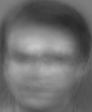

Image after NMF:


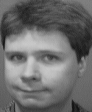

[[114. 120. 118. ... 123. 124. 124.]
 [116. 124. 121. ... 122. 128. 127.]
 [118. 120. 120. ... 128. 126. 124.]
 ...
 [101. 105.  88. ...  93.  91.  87.]
 [101. 112. 107. ...  87.  92.  87.]
 [103. 106. 106. ...  79.  92.  87.]]
Image Before NMF:
-------------------------------Number of image: 129
[[ 95.  96.  96. ...  91.  91.  91.]
 [ 95.  96.  96. ...  91.  91.  91.]
 [ 95.  96.  96. ...  91.  91.  91.]
 ...
 [154. 157. 158. ...  93.  91.  90.]
 [159. 162. 164. ...  96.  95.  95.]
 [161. 165. 167. ...  97.  96.  96.]]


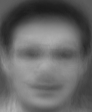

Image after NMF:


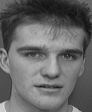

[[111. 107. 109. ... 102. 104. 101.]
 [107. 109. 106. ... 103. 100. 105.]
 [106. 108. 107. ... 103. 104.  99.]
 ...
 [205. 203. 203. ...  68.  68.  68.]
 [207. 201. 205. ...  67.  65.  67.]
 [209. 203. 203. ...  65.  68.  65.]]
Image Before NMF:
-------------------------------Number of image: 130
[[118. 117. 117. ... 121. 121. 120.]
 [117. 116. 117. ... 121. 121. 120.]
 [117. 116. 116. ... 120. 121. 122.]
 ...
 [ 71.  71.  73. ...  71.  76.  76.]
 [ 76.  74.  79. ...  72.  73.  76.]
 [ 80.  81.  84. ...  73.  72.  74.]]


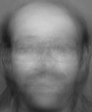

Image after NMF:


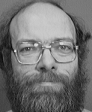

[[121. 119. 122. ... 120. 122. 121.]
 [122. 121. 122. ... 121. 120. 122.]
 [122. 121. 120. ... 119. 121. 121.]
 ...
 [ 72.  67.  70. ...  99.  97.  98.]
 [ 67.  69.  71. ... 109.  98.  98.]
 [ 65.  73.  67. ... 150. 135. 121.]]
Image Before NMF:
-------------------------------Number of image: 131
[[ 89.  90.  90. ...  90.  89.  90.]
 [ 89.  90.  90. ...  90.  90.  90.]
 [ 89.  90.  90. ...  90.  90.  90.]
 ...
 [115. 117. 118. ...  79.  78.  77.]
 [119. 121. 122. ...  82.  81.  81.]
 [121. 123. 124. ...  82.  80.  81.]]


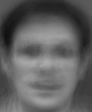

Image after NMF:


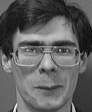

[[111. 110. 114. ... 114. 110. 114.]
 [113. 108. 109. ... 109. 114. 110.]
 [112. 112. 112. ... 113. 112. 112.]
 ...
 [100.  97.  98. ...  52.  54.  52.]
 [ 94.  98.  97. ...  47.  58.  47.]
 [101.  90. 104. ...  57.  53.  48.]]
Image Before NMF:
-------------------------------Number of image: 132
[[46. 46. 46. ... 50. 50. 51.]
 [45. 46. 45. ... 51. 50. 51.]
 [46. 46. 47. ... 50. 52. 51.]
 ...
 [57. 57. 58. ... 62. 61. 61.]
 [58. 61. 59. ... 65. 62. 61.]
 [60. 62. 62. ... 68. 65. 63.]]


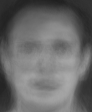

Image after NMF:


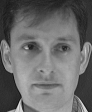

[[37. 36. 38. ... 45. 42. 45.]
 [36. 38. 38. ... 43. 46. 45.]
 [36. 39. 40. ... 50. 48. 50.]
 ...
 [45. 43. 41. ... 51. 46. 55.]
 [43. 44. 42. ... 49. 48. 50.]
 [37. 40. 40. ... 40. 50. 50.]]
Image Before NMF:
-------------------------------Number of image: 133
[[56. 55. 56. ... 63. 63. 64.]
 [56. 55. 55. ... 65. 64. 64.]
 [56. 55. 56. ... 63. 65. 65.]
 ...
 [20. 19. 20. ... 48. 50. 51.]
 [21. 21. 22. ... 49. 48. 49.]
 [24. 24. 25. ... 51. 49. 50.]]


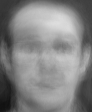

Image after NMF:


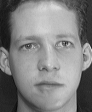

[[44. 43. 32. ... 52. 48. 52.]
 [44. 38. 33. ... 51. 51. 54.]
 [41. 42. 29. ... 50. 53. 53.]
 ...
 [39. 37. 39. ... 41. 37. 37.]
 [41. 41. 38. ... 44. 36. 32.]
 [40. 36. 42. ... 43. 43. 37.]]
Image Before NMF:
-------------------------------Number of image: 134
[[ 98.  98.  99. ... 101. 101. 101.]
 [ 98.  98.  98. ... 102. 102. 101.]
 [ 98.  98.  98. ... 101. 102. 102.]
 ...
 [127. 130. 132. ... 100. 101. 101.]
 [134. 135. 138. ... 102. 102. 103.]
 [138. 141. 143. ... 103. 102. 103.]]


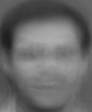

Image after NMF:


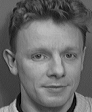

[[107. 103. 104. ...  99. 103.  99.]
 [103. 107. 101. ...  99. 101. 102.]
 [105. 105. 102. ... 102. 103. 103.]
 ...
 [168. 176. 183. ... 158. 129. 158.]
 [174. 170. 175. ... 156. 130. 163.]
 [176. 166. 183. ... 155. 133. 159.]]
Image Before NMF:
-------------------------------Number of image: 135
[[75. 75. 75. ... 78. 77. 78.]
 [75. 75. 76. ... 78. 78. 78.]
 [75. 75. 75. ... 78. 78. 78.]
 ...
 [59. 59. 62. ... 69. 69. 70.]
 [62. 61. 63. ... 69. 70. 69.]
 [64. 68. 69. ... 74. 74. 71.]]


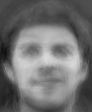

Image after NMF:


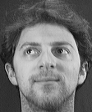

[[49. 48. 49. ... 62. 58. 62.]
 [48. 51. 50. ... 57. 60. 62.]
 [49. 49. 51. ... 59. 62. 59.]
 ...
 [50. 50. 48. ... 65. 57. 62.]
 [46. 54. 50. ... 67. 63. 54.]
 [47. 51. 51. ... 63. 63. 56.]]
Image Before NMF:
-------------------------------Number of image: 136
[[114. 114. 114. ... 116. 116. 116.]
 [114. 114. 113. ... 117. 117. 116.]
 [114. 114. 113. ... 116. 117. 117.]
 ...
 [ 55.  52.  54. ...  53.  53.  54.]
 [ 54.  52.  55. ...  52.  53.  54.]
 [ 55.  52.  55. ...  52.  52.  54.]]


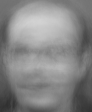

Image after NMF:


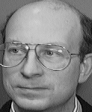

[[113. 110. 110. ... 120. 121. 118.]
 [112. 110. 111. ... 119. 119. 118.]
 [113. 111. 113. ... 120. 120. 120.]
 ...
 [ 28.  24.  21. ...  23.  20.  17.]
 [ 20.  23.  27. ...  20.  21.  16.]
 [ 24.  23.  21. ...  21.  21.  20.]]
Image Before NMF:
-------------------------------Number of image: 137
[[ 56.  56.  57. ...  54.  53.  54.]
 [ 56.  57.  56. ...  54.  54.  54.]
 [ 57.  57.  58. ...  54.  55.  54.]
 ...
 [ 93.  95.  96. ...  64.  62.  62.]
 [ 96.  99.  99. ...  67.  66.  65.]
 [ 98. 101. 101. ...  69.  67.  66.]]


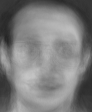

Image after NMF:


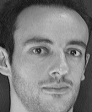

[[61. 58. 59. ... 60. 61. 62.]
 [61. 62. 54. ... 64. 56. 61.]
 [58. 64. 60. ... 65. 55. 59.]
 ...
 [56. 51. 52. ... 61. 63. 61.]
 [48. 53. 51. ... 61. 64. 59.]
 [48. 52. 51. ... 59. 64. 61.]]
Image Before NMF:
-------------------------------Number of image: 138
[[48. 48. 48. ... 51. 50. 52.]
 [48. 48. 47. ... 52. 51. 52.]
 [48. 48. 49. ... 51. 52. 52.]
 ...
 [54. 54. 55. ... 57. 56. 56.]
 [54. 57. 56. ... 60. 58. 57.]
 [57. 58. 58. ... 63. 60. 59.]]


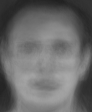

Image after NMF:


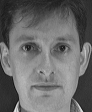

[[36. 39. 45. ... 47. 44. 43.]
 [37. 45. 40. ... 47. 44. 47.]
 [36. 40. 41. ... 47. 47. 45.]
 ...
 [48. 45. 46. ... 51. 47. 54.]
 [44. 44. 47. ... 52. 51. 52.]
 [42. 45. 41. ... 52. 51. 53.]]
Image Before NMF:
-------------------------------Number of image: 139
[[115. 115. 115. ... 115. 115. 115.]
 [115. 115. 115. ... 116. 115. 115.]
 [115. 115. 115. ... 115. 116. 116.]
 ...
 [ 96.  96.  99. ...  73.  74.  73.]
 [ 99.  98. 101. ...  73.  74.  75.]
 [100. 101. 104. ...  73.  73.  75.]]


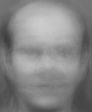

Image after NMF:


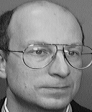

[[110. 110. 112. ... 119. 122. 117.]
 [109. 110. 111. ... 117. 119. 115.]
 [112. 111. 111. ... 122. 120. 117.]
 ...
 [  3.  78. 151. ...  40.  75.  75.]
 [  0.  87. 153. ...  15.  33.  44.]
 [  0.  93. 164. ...  20.  31.  16.]]
Image Before NMF:
-------------------------------Number of image: 140
[[112. 112. 112. ... 113. 113. 113.]
 [112. 112. 112. ... 113. 113. 113.]
 [112. 112. 112. ... 113. 113. 113.]
 ...
 [ 52.  52.  53. ...  49.  51.  52.]
 [ 55.  55.  58. ...  50.  50.  51.]
 [ 59.  59.  61. ...  51.  50.  51.]]


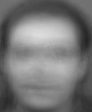

Image after NMF:


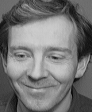

[[107. 104. 109. ... 110. 107. 109.]
 [107. 106. 107. ... 109. 108. 110.]
 [108. 107. 107. ... 109. 109. 108.]
 ...
 [ 71.  73.  72. ...  57.  58.  60.]
 [ 72.  75.  76. ...  58.  60.  56.]
 [ 74.  78.  75. ...  58.  56.  57.]]
Image Before NMF:
-------------------------------Number of image: 141
[[128. 128. 128. ... 131. 131. 131.]
 [128. 128. 127. ... 132. 131. 131.]
 [128. 128. 127. ... 131. 132. 132.]
 ...
 [ 87.  84.  86. ...  79.  79.  79.]
 [ 87.  85.  88. ...  78.  79.  80.]
 [ 88.  87.  90. ...  79.  79.  80.]]


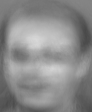

Image after NMF:


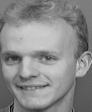

[[128. 125. 126. ... 125. 126. 123.]
 [127. 127. 124. ... 124. 124. 124.]
 [127. 127. 124. ... 125. 124. 127.]
 ...
 [ 87. 102.  94. ...  87.  86.  87.]
 [103. 105.  92. ...  88.  83.  87.]
 [ 92.  92.  89. ...  84.  85.  85.]]
Image Before NMF:
-------------------------------Number of image: 142
[[50. 50. 50. ... 49. 49. 49.]
 [50. 50. 50. ... 50. 49. 49.]
 [50. 50. 50. ... 49. 50. 49.]
 ...
 [40. 39. 40. ... 38. 35. 36.]
 [39. 40. 40. ... 38. 38. 36.]
 [40. 41. 42. ... 41. 41. 38.]]


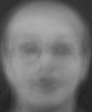

Image after NMF:


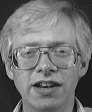

[[ 38.  35.  36. ...  34.  32.  36.]
 [ 35.  39.  39. ...  37.  33.  43.]
 [ 40.  34.  40. ...  35.  38.  35.]
 ...
 [ 39.  41.  35. ... 138. 132. 129.]
 [ 40.  36.  40. ... 132. 128. 135.]
 [ 37.  42.  39. ... 138. 142. 141.]]
Image Before NMF:
-------------------------------Number of image: 143
[[103. 103. 104. ...  99.  99.  98.]
 [103. 104. 103. ...  98.  98.  98.]
 [104. 104. 103. ...  98.  98.  98.]
 ...
 [ 34.  32.  34. ...  19.  19.  19.]
 [ 35.  32.  36. ...  15.  18.  19.]
 [ 35.  34.  36. ...  14.  18.  19.]]


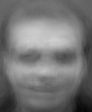

Image after NMF:


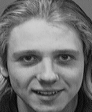

[[114. 109. 112. ... 117. 109. 111.]
 [113. 109. 112. ... 111. 111. 111.]
 [109. 110. 111. ... 113. 109. 113.]
 ...
 [ 38.  33.  30. ...  42.  32.  31.]
 [ 35.  26.  35. ...  34.  47.  42.]
 [ 24.  30.  38. ...  37.  35.  38.]]
Image Before NMF:
-------------------------------Number of image: 144
[[157. 156. 156. ... 156. 157. 157.]
 [157. 156. 155. ... 157. 156. 157.]
 [156. 156. 156. ... 156. 157. 157.]
 ...
 [167. 165. 169. ... 129. 129. 128.]
 [169. 168. 172. ... 130. 130. 133.]
 [170. 170. 175. ... 130. 129. 132.]]


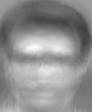

Image after NMF:


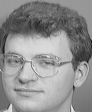

[[154. 155. 151. ... 148. 151. 148.]
 [156. 154. 154. ... 149. 151. 147.]
 [152. 155. 155. ... 148. 152. 150.]
 ...
 [102. 109. 109. ... 113. 111. 112.]
 [125. 123. 134. ... 114. 111. 113.]
 [141. 132. 124. ... 108. 113. 110.]]
Image Before NMF:
-------------------------------Number of image: 145
[[101. 102. 102. ...  99.  99.  98.]
 [101. 102. 102. ...  99.  99.  98.]
 [102. 101. 101. ...  99.  98.  99.]
 ...
 [ 32.  29.  31. ...  21.  20.  21.]
 [ 32.  29.  32. ...  18.  20.  21.]
 [ 32.  31.  33. ...  17.  20.  21.]]


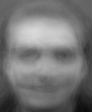

Image after NMF:


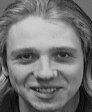

[[106. 110. 107. ... 107. 109. 112.]
 [105. 109. 107. ... 107. 111. 112.]
 [106. 107. 107. ... 110. 110. 107.]
 ...
 [ 40.  35.  30. ...  46.  35.  50.]
 [ 35.  30.  28. ...  41.  32.  41.]
 [ 32.  38.  23. ...  44.  49.  31.]]
Image Before NMF:
-------------------------------Number of image: 146
[[119. 118. 118. ... 114. 115. 115.]
 [119. 118. 117. ... 114. 114. 114.]
 [118. 118. 118. ... 114. 115. 114.]
 ...
 [122. 123. 125. ...  89.  90.  89.]
 [127. 125. 129. ...  89.  91.  92.]
 [128. 129. 133. ...  89.  90.  92.]]


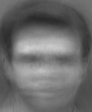

Image after NMF:


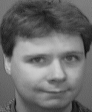

[[116. 119. 117. ... 124. 125. 125.]
 [122. 118. 120. ... 123. 123. 122.]
 [118. 120. 118. ... 130. 121. 128.]
 ...
 [104. 101. 104. ...  75.  84.  89.]
 [119. 102. 118. ...  60.  64.  84.]
 [ 94.  84. 107. ...  60.  54.  64.]]
Image Before NMF:
-------------------------------Number of image: 147
[[36. 36. 36. ... 37. 37. 37.]
 [36. 37. 36. ... 38. 37. 37.]
 [37. 36. 37. ... 37. 38. 37.]
 ...
 [34. 32. 34. ... 43. 41. 42.]
 [34. 35. 35. ... 44. 43. 41.]
 [36. 39. 39. ... 49. 48. 44.]]


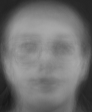

Image after NMF:


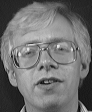

[[ 35.  36.  37. ...  36.  33.  37.]
 [ 35.  35.  39. ...  39.  33.  36.]
 [ 36.  36.  37. ...  39.  36.  32.]
 ...
 [ 39.  38.  41. ...  29.  28.  29.]
 [ 34.  36.  39. ...  52.  49.  35.]
 [ 36.  36.  40. ... 144. 147. 143.]]
Image Before NMF:
-------------------------------Number of image: 148
[[34. 33. 34. ... 31. 31. 31.]
 [34. 34. 34. ... 31. 31. 31.]
 [35. 35. 35. ... 31. 32. 31.]
 ...
 [75. 74. 75. ... 72. 70. 71.]
 [77. 79. 80. ... 76. 74. 71.]
 [80. 87. 87. ... 85. 82. 75.]]


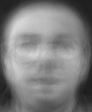

Image after NMF:


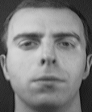

[[52. 51. 52. ... 40. 40. 37.]
 [49. 52. 53. ... 40. 34. 43.]
 [46. 58. 49. ... 37. 41. 39.]
 ...
 [37. 41. 38. ... 36. 31. 31.]
 [35. 39. 37. ... 34. 32. 31.]
 [41. 35. 39. ... 33. 34. 32.]]
Image Before NMF:
-------------------------------Number of image: 149
[[107. 107. 108. ... 108. 108. 108.]
 [107. 108. 108. ... 108. 108. 108.]
 [108. 107. 108. ... 108. 108. 108.]
 ...
 [151. 153. 155. ... 107. 108. 108.]
 [158. 160. 164. ... 111. 110. 111.]
 [163. 166. 169. ... 112. 111. 111.]]


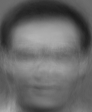

Image after NMF:


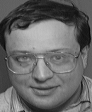

[[ 94.  98.  94. ...  92.  93.  95.]
 [ 97.  95.  98. ...  91.  91.  94.]
 [ 94.  96.  95. ...  96.  93.  96.]
 ...
 [172. 172. 169. ... 131. 132. 123.]
 [182. 166. 150. ... 137. 130. 115.]
 [172. 159. 138. ... 126. 148. 135.]]
Image Before NMF:
-------------------------------Number of image: 150
[[119. 119. 119. ... 115. 115. 114.]
 [119. 119. 119. ... 115. 115. 115.]
 [119. 119. 119. ... 115. 115. 115.]
 ...
 [ 95.  94.  96. ...  57.  56.  56.]
 [ 96.  94.  97. ...  56.  58.  59.]
 [ 95.  94.  97. ...  55.  57.  58.]]


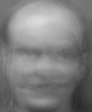

Image after NMF:


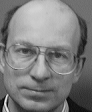

[[108. 109. 110. ... 112. 115. 108.]
 [107. 106. 105. ... 109. 114. 110.]
 [105. 108. 108. ... 110. 111. 112.]
 ...
 [ 23.   9.  78. ...  49.  48.  49.]
 [ 29.   6. 103. ...  33.  43.  48.]
 [ 29.   8. 101. ...  24.  23.  30.]]
Image Before NMF:
-------------------------------Number of image: 151
[[31. 30. 31. ... 42. 42. 44.]
 [30. 30. 30. ... 44. 43. 44.]
 [32. 30. 31. ... 42. 45. 45.]
 ...
 [23. 23. 23. ... 60. 62. 63.]
 [24. 26. 25. ... 64. 61. 61.]
 [28. 29. 29. ... 67. 63. 62.]]


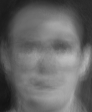

Image after NMF:


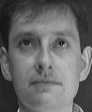

[[35. 35. 35. ... 47. 45. 47.]
 [36. 34. 39. ... 51. 45. 46.]
 [35. 36. 35. ... 48. 48. 48.]
 ...
 [37. 39. 37. ... 58. 58. 57.]
 [34. 40. 35. ... 54. 60. 54.]
 [35. 36. 39. ... 56. 58. 55.]]
Image Before NMF:
-------------------------------Number of image: 152
[[111. 110. 111. ... 105. 106. 106.]
 [111. 111. 110. ... 105. 104. 105.]
 [111. 110. 110. ... 105. 105. 104.]
 ...
 [ 23.  22.  23. ...  17.  19.  19.]
 [ 24.  22.  25. ...  15.  17.  19.]
 [ 25.  23.  25. ...  13.  15.  17.]]


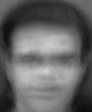

Image after NMF:


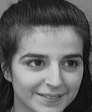

[[137. 135. 136. ... 129. 131. 128.]
 [137. 135. 133. ... 133. 128. 127.]
 [137. 134. 136. ... 130. 125. 127.]
 ...
 [ 26.  27.  28. ...  28.  21.  22.]
 [ 23.  25.  25. ...  19.  21.  26.]
 [ 24.  28.  24. ...  19.  24.  41.]]
Image Before NMF:
-------------------------------Number of image: 153
[[109. 108. 109. ... 106. 107. 106.]
 [109. 108. 109. ... 106. 107. 106.]
 [108. 109. 108. ... 106. 106. 107.]
 ...
 [ 98.  99. 101. ...  80.  84.  84.]
 [105. 104. 109. ...  82.  83.  84.]
 [108. 112. 116. ...  86.  85.  84.]]


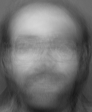

Image after NMF:


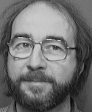

[[124. 123. 126. ... 115. 113. 116.]
 [123. 125. 123. ... 113. 114. 114.]
 [123. 125. 121. ... 112. 113. 113.]
 ...
 [114. 131. 117. ...  78.  77.  74.]
 [119. 105. 127. ...  76.  76.  73.]
 [143.  98. 132. ...  75.  72.  78.]]
Image Before NMF:
-------------------------------Number of image: 154
[[133. 133. 133. ... 129. 129. 128.]
 [133. 133. 132. ... 129. 129. 129.]
 [133. 133. 133. ... 129. 129. 129.]
 ...
 [119. 116. 118. ...  77.  74.  74.]
 [118. 116. 120. ...  76.  77.  77.]
 [118. 117. 121. ...  76.  77.  78.]]


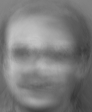

Image after NMF:


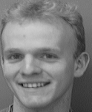

[[130. 133. 129. ... 121. 121. 124.]
 [131. 132. 135. ... 123. 122. 125.]
 [132. 130. 132. ... 124. 121. 123.]
 ...
 [108. 111. 114. ...  55.  56.  55.]
 [116. 129. 124. ...  52.  56.  56.]
 [129. 126. 112. ...  54.  54.  56.]]
Image Before NMF:
-------------------------------Number of image: 155
[[76. 75. 76. ... 73. 72. 73.]
 [76. 76. 75. ... 73. 73. 73.]
 [76. 76. 76. ... 72. 74. 73.]
 ...
 [29. 27. 28. ... 29. 27. 28.]
 [28. 27. 28. ... 29. 29. 28.]
 [28. 27. 28. ... 30. 30. 29.]]


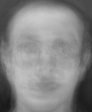

Image after NMF:


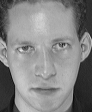

[[39. 44. 53. ... 47. 48. 47.]
 [44. 44. 61. ... 47. 45. 46.]
 [59. 39. 57. ... 46. 46. 44.]
 ...
 [49. 46. 42. ... 30. 32. 28.]
 [46. 35. 34. ... 30. 29. 27.]
 [32. 37. 27. ... 29. 26. 29.]]
Image Before NMF:
-------------------------------Number of image: 156
[[ 98.  99.  99. ...  96.  95.  95.]
 [ 99. 100.  99. ...  96.  96.  96.]
 [ 99.  99. 100. ...  96.  96.  96.]
 ...
 [127. 128. 130. ...  80.  78.  77.]
 [131. 133. 135. ...  82.  81.  81.]
 [133. 136. 137. ...  83.  82.  82.]]


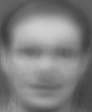

Image after NMF:


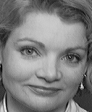

[[ 95.  89.  89. ... 103. 112.  91.]
 [ 95.  95.  93. ...  89. 107. 111.]
 [ 91.  95.  94. ...  80.  99. 100.]
 ...
 [173. 209. 208. ...  57.  54.  54.]
 [180. 209. 209. ...  54.  58.  54.]
 [184. 207. 208. ...  43.  55.  55.]]
Image Before NMF:
-------------------------------Number of image: 157
[[ 48.  47.  48. ...  41.  41.  41.]
 [ 48.  48.  49. ...  41.  41.  41.]
 [ 48.  49.  49. ...  41.  42.  41.]
 ...
 [ 96.  99.  99. ...  79.  79.  79.]
 [104. 106. 109. ...  84.  83.  80.]
 [108. 118. 119. ...  93.  90.  83.]]


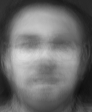

Image after NMF:


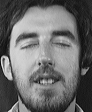

[[48. 45. 45. ... 41. 40. 39.]
 [52. 46. 46. ... 39. 43. 38.]
 [49. 46. 47. ... 45. 38. 46.]
 ...
 [59. 45. 57. ... 30. 30. 35.]
 [53. 52. 53. ... 28. 30. 37.]
 [45. 49. 52. ... 28. 37. 29.]]
Image Before NMF:
-------------------------------Number of image: 158
[[ 57.  56.  57. ...  52.  52.  51.]
 [ 57.  56.  58. ...  52.  52.  51.]
 [ 57.  57.  57. ...  52.  52.  52.]
 ...
 [101. 103. 103. ...  81.  82.  83.]
 [109. 110. 114. ...  86.  85.  83.]
 [114. 122. 124. ...  94.  92.  86.]]


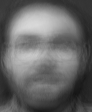

Image after NMF:


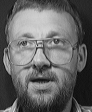

[[ 44.  44.  47. ...  37.  41.  34.]
 [ 43.  46.  50. ...  41.  41.  37.]
 [ 48.  44.  48. ...  40.  43.  35.]
 ...
 [ 43.  49.  47. ... 117. 121. 112.]
 [115. 128. 129. ... 185. 124. 111.]
 [127. 134. 142. ... 188. 165. 106.]]
Image Before NMF:
-------------------------------Number of image: 159
[[104. 105. 105. ... 106. 106. 106.]
 [104. 105. 105. ... 107. 107. 106.]
 [105. 104. 105. ... 106. 107. 107.]
 ...
 [103. 106. 107. ...  77.  78.  78.]
 [109. 111. 114. ...  80.  79.  80.]
 [113. 116. 118. ...  81.  79.  80.]]


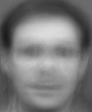

Image after NMF:


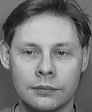

[[119. 121. 123. ... 117. 117. 114.]
 [119. 120. 123. ... 117. 118. 116.]
 [122. 121. 117. ... 115. 115. 118.]
 ...
 [ 82.  86.  89. ...  80.  79.  77.]
 [ 90. 100.  98. ...  78.  82.  82.]
 [104. 103. 104. ...  75.  79.  78.]]
Image Before NMF:
-------------------------------Number of image: 160
[[89. 88. 89. ... 88. 88. 88.]
 [89. 88. 89. ... 88. 88. 88.]
 [88. 88. 88. ... 88. 88. 88.]
 ...
 [52. 51. 54. ... 56. 56. 57.]
 [54. 52. 55. ... 55. 57. 57.]
 [55. 57. 59. ... 58. 59. 58.]]


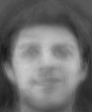

Image after NMF:


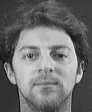

[[48. 47. 53. ... 61. 59. 60.]
 [50. 48. 52. ... 56. 61. 58.]
 [53. 47. 53. ... 54. 64. 60.]
 ...
 [50. 55. 49. ... 64. 67. 59.]
 [52. 50. 49. ... 63. 65. 60.]
 [52. 49. 50. ... 61. 66. 67.]]
Image Before NMF:
-------------------------------Number of image: 161
[[72. 70. 71. ... 79. 79. 80.]
 [71. 70. 69. ... 80. 80. 80.]
 [71. 70. 70. ... 78. 81. 81.]
 ...
 [32. 30. 33. ... 64. 66. 66.]
 [32. 31. 33. ... 63. 64. 65.]
 [35. 34. 36. ... 65. 65. 66.]]


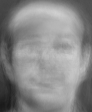

Image after NMF:


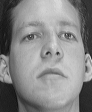

[[42. 41. 44. ... 50. 49. 57.]
 [41. 41. 43. ... 51. 53. 53.]
 [54. 40. 43. ... 49. 52. 53.]
 ...
 [38. 37. 36. ... 40. 43. 40.]
 [38. 36. 37. ... 44. 42. 39.]
 [37. 39. 37. ... 42. 43. 41.]]
Image Before NMF:
-------------------------------Number of image: 162
[[ 72.  71.  71. ...  68.  68.  67.]
 [ 72.  71.  72. ...  67.  68.  68.]
 [ 72.  72.  72. ...  68.  68.  67.]
 ...
 [151. 152. 153. ... 106. 105. 104.]
 [156. 157. 160. ... 111. 109. 108.]
 [157. 163. 166. ... 115. 113. 110.]]


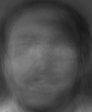

Image after NMF:


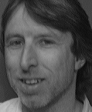

[[ 74.  74.  76. ...  67.  65.  67.]
 [ 72.  75.  75. ...  68.  65.  68.]
 [ 81.  72.  77. ...  66.  68.  65.]
 ...
 [183. 186. 186. ... 118. 121. 113.]
 [185. 190. 189. ... 128. 125. 114.]
 [186. 190. 190. ... 135. 127. 118.]]
Image Before NMF:
-------------------------------Number of image: 163
[[ 70.  70.  70. ...  73.  73.  73.]
 [ 70.  70.  70. ...  73.  73.  74.]
 [ 70.  70.  71. ...  73.  74.  74.]
 ...
 [151. 153. 155. ... 117. 115. 114.]
 [156. 158. 159. ... 121. 119. 119.]
 [158. 163. 165. ... 124. 121. 120.]]


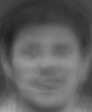

Image after NMF:


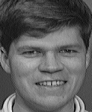

[[101.  86.  71. ... 101. 101. 102.]
 [ 92.  73.  69. ... 100. 102. 103.]
 [ 85.  69.  77. ... 101. 103. 103.]
 ...
 [ 78.  85. 161. ...  76.  72.  79.]
 [144. 155. 180. ...  72.  77.  75.]
 [171. 167. 186. ...  81. 105.  87.]]
Image Before NMF:
-------------------------------Number of image: 164
[[115. 115. 114. ... 118. 117. 117.]
 [115. 115. 114. ... 118. 118. 117.]
 [115. 115. 115. ... 117. 118. 118.]
 ...
 [ 92.  90.  92. ...  82.  82.  82.]
 [ 93.  91.  95. ...  83.  83.  83.]
 [ 94.  94.  98. ...  85.  84.  84.]]


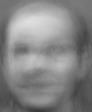

Image after NMF:


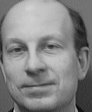

[[108. 111. 110. ... 113. 114. 115.]
 [110. 108. 110. ... 114. 116. 116.]
 [105. 110. 107. ... 113. 115. 113.]
 ...
 [ 81.  84.  90. ...  48.  57.  47.]
 [ 83.  93.  83. ...  54.  52.  53.]
 [ 85.  90.  88. ...  53.  48.  56.]]
Image Before NMF:
-------------------------------Number of image: 165
[[94. 94. 94. ... 92. 91. 91.]
 [94. 94. 94. ... 92. 91. 91.]
 [94. 94. 94. ... 92. 91. 91.]
 ...
 [51. 51. 51. ... 46. 45. 46.]
 [53. 54. 55. ... 48. 47. 46.]
 [55. 58. 59. ... 52. 50. 47.]]


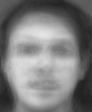

Image after NMF:


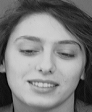

[[117. 114. 116. ... 111. 108. 113.]
 [112. 116. 112. ... 109. 110. 109.]
 [116. 113. 114. ... 111. 111. 111.]
 ...
 [ 65.  65.  56. ...  81.  82.  79.]
 [ 67.  68.  65. ...  80.  87.  87.]
 [ 67.  68.  73. ...  85.  89.  91.]]
Image Before NMF:
-------------------------------Number of image: 166
[[106. 106. 107. ... 100. 100. 100.]
 [106. 107. 107. ... 100. 100. 100.]
 [107. 107. 107. ... 100. 100. 100.]
 ...
 [129. 132. 133. ...  76.  76.  76.]
 [136. 138. 142. ...  77.  77.  79.]
 [140. 143. 145. ...  77.  77.  78.]]


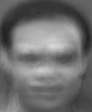

Image after NMF:


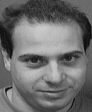

[[ 97. 105. 107. ... 106. 105. 108.]
 [104. 102. 106. ... 103. 108. 107.]
 [107. 106. 103. ... 106. 106. 106.]
 ...
 [138. 138. 139. ...  66.  68.  65.]
 [138. 139. 138. ...  66.  68.  67.]
 [135. 143. 144. ...  76.  67.  74.]]
Image Before NMF:
-------------------------------Number of image: 167
[[92. 92. 92. ... 94. 94. 94.]
 [92. 91. 93. ... 95. 95. 94.]
 [92. 92. 92. ... 94. 95. 95.]
 ...
 [81. 83. 85. ... 76. 80. 80.]
 [89. 88. 92. ... 77. 78. 80.]
 [93. 96. 99. ... 80. 80. 79.]]


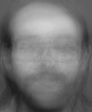

Image after NMF:


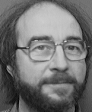

[[122. 125. 123. ... 116. 113. 113.]
 [123. 124. 123. ... 112. 115. 116.]
 [124. 124. 124. ... 112. 115. 113.]
 ...
 [ 73.  73.  69. ...  78.  76.  76.]
 [ 72.  74.  78. ...  76.  73.  78.]
 [ 86.  96. 116. ...  75.  74.  74.]]
Image Before NMF:
-------------------------------Number of image: 168
[[ 91.  93.  93. ...  87.  86.  86.]
 [ 92.  93.  92. ...  86.  86.  86.]
 [ 92.  93.  93. ...  87.  86.  86.]
 ...
 [163. 165. 167. ...  94.  90.  89.]
 [167. 170. 171. ...  97.  96.  95.]
 [168. 172. 173. ...  97.  96.  96.]]


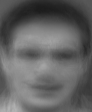

Image after NMF:


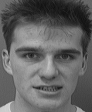

[[110. 111. 110. ... 103. 102. 100.]
 [110. 110. 112. ... 101. 104. 100.]
 [111. 109. 111. ... 100. 102. 104.]
 ...
 [198. 201. 203. ...  62.  65.  62.]
 [201. 201. 203. ...  64.  60.  62.]
 [202. 203. 203. ...  63.  59.  60.]]
Image Before NMF:
-------------------------------Number of image: 169
[[ 92.  93.  94. ... 101. 101. 101.]
 [ 93.  93.  93. ... 102. 102. 102.]
 [ 93.  92.  93. ... 101. 102. 102.]
 ...
 [ 78.  80.  81. ...  78.  80.  80.]
 [ 83.  85.  87. ...  80.  79.  80.]
 [ 88.  89.  90. ...  82.  79.  80.]]


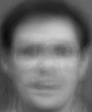

Image after NMF:


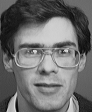

[[108. 110. 111. ... 105. 106. 107.]
 [108. 110. 109. ... 108. 105. 106.]
 [109. 108. 109. ... 107. 104. 106.]
 ...
 [ 46.  41.  46. ...  30.  35.  32.]
 [ 46.  42.  50. ...  38.  38.  35.]
 [ 55.  49.  43. ...  26.  37.  37.]]
Image Before NMF:
-------------------------------Number of image: 170
[[49. 49. 49. ... 49. 48. 48.]
 [49. 49. 50. ... 49. 49. 49.]
 [50. 49. 50. ... 49. 49. 49.]
 ...
 [75. 76. 77. ... 64. 63. 64.]
 [80. 81. 83. ... 66. 66. 64.]
 [83. 88. 89. ... 72. 71. 67.]]


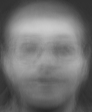

Image after NMF:


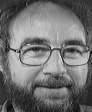

[[ 48.  50.  51. ...  50.  50.  52.]
 [ 49.  54.  50. ...  50.  48.  49.]
 [ 60.  50.  52. ...  52.  48.  47.]
 ...
 [ 81.  47. 135. ...  92.  93. 103.]
 [ 58.  84. 147. ...  90.  90. 105.]
 [ 62. 135. 144. ...  87.  90.  99.]]
Image Before NMF:
-------------------------------Number of image: 171
[[ 76.  76.  76. ...  72.  72.  71.]
 [ 77.  76.  77. ...  71.  72.  72.]
 [ 76.  77.  77. ...  72.  72.  72.]
 ...
 [192. 196. 197. ... 132. 131. 130.]
 [201. 204. 207. ... 139. 137. 136.]
 [204. 212. 215. ... 144. 141. 137.]]


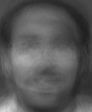

Image after NMF:


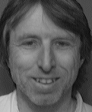

[[ 83.  86.  84. ...  74.  72.  75.]
 [ 84.  84.  84. ...  75.  74.  75.]
 [ 83.  85.  82. ...  73.  76.  74.]
 ...
 [194. 193. 193. ... 137. 134. 133.]
 [193. 195. 192. ... 135. 135. 134.]
 [194. 194. 194. ... 136. 138. 134.]]
Image Before NMF:
-------------------------------Number of image: 172
[[111. 111. 112. ... 109. 109. 109.]
 [111. 112. 111. ... 109. 109. 109.]
 [112. 111. 111. ... 109. 109. 109.]
 ...
 [ 71.  71.  72. ...  53.  54.  54.]
 [ 74.  74.  78. ...  53.  53.  54.]
 [ 78.  79.  80. ...  54.  54.  54.]]


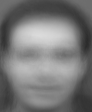

Image after NMF:


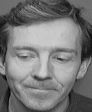

[[110. 106. 109. ... 108. 112. 109.]
 [109. 107. 110. ... 108. 110. 110.]
 [108. 107. 110. ... 109. 110. 108.]
 ...
 [ 68.  71.  61. ...  59.  53.  55.]
 [ 72.  68.  60. ...  54.  53.  60.]
 [ 68.  65.  60. ...  49.  53.  53.]]
Image Before NMF:
-------------------------------Number of image: 173
[[107. 107. 107. ... 106. 106. 106.]
 [107. 107. 107. ... 107. 107. 106.]
 [107. 107. 107. ... 106. 106. 107.]
 ...
 [ 86.  84.  85. ...  64.  63.  64.]
 [ 87.  86.  89. ...  66.  65.  65.]
 [ 88.  89.  91. ...  67.  66.  66.]]


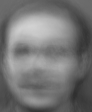

Image after NMF:


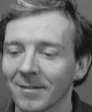

[[101. 104. 104. ... 109. 111. 108.]
 [101. 101. 104. ... 108. 109. 106.]
 [102. 103.  99. ... 108. 109. 109.]
 ...
 [ 68.  71.  72. ...  47.  45.  45.]
 [ 72.  78.  74. ...  50.  45.  44.]
 [ 71.  66.  72. ...  42.  46.  43.]]
Image Before NMF:
-------------------------------Number of image: 174
[[ 78.  78.  78. ...  79.  79.  79.]
 [ 78.  77.  78. ...  79.  79.  79.]
 [ 77.  78.  78. ...  79.  80.  79.]
 ...
 [157. 160. 162. ... 117. 116. 115.]
 [162. 164. 166. ... 122. 120. 120.]
 [164. 168. 171. ... 124. 122. 121.]]


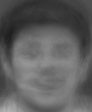

Image after NMF:


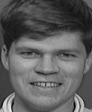

[[ 98.  94. 100. ... 102.  98. 102.]
 [ 94.  97.  99. ...  98. 102. 104.]
 [ 94.  97.  97. ... 100. 103. 100.]
 ...
 [135. 168. 160. ... 105. 122. 127.]
 [166. 175. 173. ... 165. 151. 153.]
 [183. 173. 190. ... 164. 167. 164.]]
Image Before NMF:
-------------------------------Number of image: 175
[[ 77.  78.  78. ...  75.  75.  75.]
 [ 78.  78.  77. ...  75.  75.  75.]
 [ 77.  78.  78. ...  75.  76.  75.]
 ...
 [139. 140. 142. ...  96.  93.  92.]
 [141. 143. 144. ...  99.  98.  97.]
 [142. 145. 147. ... 100.  99.  98.]]


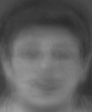

Image after NMF:


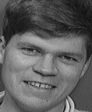

[[104. 100. 101. ...  54.  61.  46.]
 [103. 103. 102. ...  49.  64.  54.]
 [102. 102. 102. ...  48.  63.  58.]
 ...
 [135. 132. 132. ...  77.  76.  75.]
 [144. 134. 131. ...  75.  78.  72.]
 [140. 134. 132. ...  89.  79.  77.]]
Image Before NMF:
-------------------------------Number of image: 176
[[118. 117. 118. ... 122. 122. 121.]
 [118. 117. 118. ... 122. 122. 122.]
 [117. 117. 117. ... 121. 122. 123.]
 ...
 [ 70.  69.  71. ...  73.  78.  78.]
 [ 74.  72.  77. ...  74.  75.  78.]
 [ 77.  78.  82. ...  75.  75.  76.]]


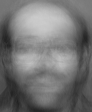

Image after NMF:


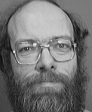

[[118. 120. 118. ... 122. 121. 119.]
 [121. 120. 121. ... 121. 121. 122.]
 [121. 119. 121. ... 122. 122. 120.]
 ...
 [ 63.  68.  65. ...  95.  98.  99.]
 [ 67.  65.  67. ...  98.  98. 100.]
 [ 66.  67.  66. ... 131. 113. 102.]]
Image Before NMF:
-------------------------------Number of image: 177
[[59. 59. 59. ... 64. 63. 64.]
 [59. 59. 59. ... 64. 64. 64.]
 [59. 58. 59. ... 64. 64. 64.]
 ...
 [22. 21. 23. ... 36. 35. 36.]
 [22. 23. 23. ... 35. 35. 35.]
 [25. 26. 25. ... 37. 38. 37.]]


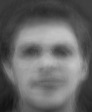

Image after NMF:


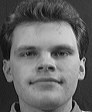

[[ 48.  47.  47. ...  60.  57.  59.]
 [ 46.  46.  51. ...  59.  59.  63.]
 [ 50.  47.  49. ...  59.  59.  61.]
 ...
 [ 37.  35.  37. ...  51.  46.  47.]
 [ 37.  36.  38. ...  48.  45.  46.]
 [ 37.  41.  40. ... 120. 104.  66.]]
Image Before NMF:
-------------------------------Number of image: 178
[[ 93.  94.  95. ...  91.  91.  91.]
 [ 93.  94.  94. ...  91.  91.  91.]
 [ 94.  94.  94. ...  91.  92.  91.]
 ...
 [122. 125. 126. ...  73.  73.  72.]
 [128. 131. 133. ...  76.  75.  76.]
 [132. 135. 136. ...  76.  75.  76.]]


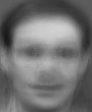

Image after NMF:


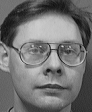

[[116. 112. 115. ... 107. 109. 113.]
 [116. 117. 114. ... 112. 106. 114.]
 [117. 113. 118. ... 112. 111. 111.]
 ...
 [ 98. 101.  97. ...  49.  56.  49.]
 [100.  99.  98. ...  57.  53.  52.]
 [102. 100. 110. ...  51.  55.  54.]]
Image Before NMF:
-------------------------------Number of image: 179
[[126. 125. 126. ... 121. 121. 121.]
 [126. 126. 125. ... 120. 119. 120.]
 [126. 126. 125. ... 120. 120. 119.]
 ...
 [ 32.  29.  31. ...  25.  27.  27.]
 [ 32.  29.  33. ...  23.  25.  27.]
 [ 32.  30.  33. ...  21.  23.  25.]]


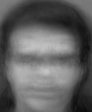

Image after NMF:


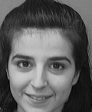

[[140. 134. 135. ... 129. 126. 128.]
 [140. 136. 135. ... 127. 126. 128.]
 [142. 132. 137. ... 126. 128. 128.]
 ...
 [ 63.  48.  47. ...  15.  26.  27.]
 [ 42.  45.  48. ...  23.  24.  36.]
 [ 43.  55.  43. ...  25.  26.  49.]]
Image Before NMF:
-------------------------------Number of image: 180
[[122. 122. 123. ... 119. 119. 119.]
 [122. 123. 122. ... 118. 118. 118.]
 [123. 123. 123. ... 119. 118. 118.]
 ...
 [117. 119. 121. ...  77.  78.  78.]
 [124. 124. 128. ...  78.  78.  80.]
 [127. 129. 132. ...  77.  78.  79.]]


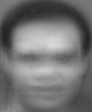

Image after NMF:


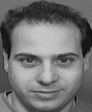

[[110. 112. 113. ... 112. 109. 115.]
 [108. 116. 113. ... 109. 114. 111.]
 [114. 110. 112. ... 111. 113. 110.]
 ...
 [141. 142. 141. ...  86.  91.  83.]
 [141. 141. 139. ...  86.  87.  88.]
 [137. 143. 137. ...  92.  87.  90.]]
Image Before NMF:
-------------------------------Number of image: 181
[[43. 43. 43. ... 42. 41. 42.]
 [43. 43. 42. ... 42. 42. 42.]
 [44. 43. 43. ... 41. 43. 42.]
 ...
 [34. 32. 33. ... 35. 32. 33.]
 [32. 33. 33. ... 36. 35. 33.]
 [33. 35. 34. ... 39. 39. 35.]]


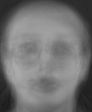

Image after NMF:


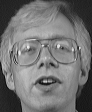

[[35. 32. 36. ... 36. 31. 35.]
 [38. 30. 35. ... 34. 33. 34.]
 [38. 34. 35. ... 30. 33. 33.]
 ...
 [35. 37. 41. ... 26. 25. 26.]
 [40. 38. 42. ... 26. 27. 27.]
 [42. 40. 40. ... 25. 28. 29.]]
Image Before NMF:
-------------------------------Number of image: 182
[[ 45.  45.  45. ...  40.  41.  40.]
 [ 45.  45.  45. ...  41.  41.  40.]
 [ 46.  46.  45. ...  41.  41.  41.]
 ...
 [ 90.  89.  91. ...  72.  70.  71.]
 [ 93.  93.  96. ...  74.  74.  71.]
 [ 95. 101. 103. ...  81.  81.  75.]]


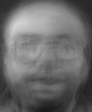

Image after NMF:


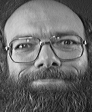

[[58. 48. 47. ... 46. 53. 42.]
 [56. 54. 50. ... 47. 48. 45.]
 [50. 50. 53. ... 47. 50. 47.]
 ...
 [61. 59. 82. ... 51. 39. 36.]
 [65. 63. 70. ... 34. 43. 38.]
 [76. 77. 81. ... 31. 43. 41.]]
Image Before NMF:
-------------------------------Number of image: 183
[[112. 112. 113. ... 111. 112. 112.]
 [112. 112. 112. ... 112. 112. 112.]
 [112. 112. 112. ... 112. 112. 112.]
 ...
 [121. 124. 126. ...  87.  89.  88.]
 [129. 130. 134. ...  88.  88.  90.]
 [134. 136. 138. ...  88.  87.  89.]]


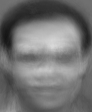

Image after NMF:


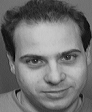

[[110. 109. 111. ... 111. 113. 116.]
 [108. 111. 109. ... 113. 112. 113.]
 [108. 109. 111. ... 110. 114. 115.]
 ...
 [137. 137. 141. ...  95.  89.  90.]
 [140. 133. 144. ...  96.  86.  90.]
 [142. 136. 138. ...  94.  88.  90.]]
Image Before NMF:
-------------------------------Number of image: 184
[[64. 64. 64. ... 65. 64. 65.]
 [64. 64. 63. ... 66. 65. 65.]
 [65. 64. 65. ... 65. 66. 65.]
 ...
 [37. 37. 37. ... 43. 42. 43.]
 [37. 39. 39. ... 45. 43. 42.]
 [40. 41. 41. ... 48. 45. 44.]]


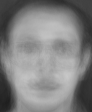

Image after NMF:


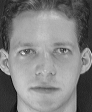

[[48. 49. 45. ... 56. 56. 54.]
 [45. 52. 39. ... 52. 50. 51.]
 [45. 50. 42. ... 48. 53. 50.]
 ...
 [50. 48. 50. ... 45. 46. 46.]
 [45. 54. 49. ... 46. 47. 47.]
 [51. 51. 51. ... 47. 46. 46.]]
Image Before NMF:
-------------------------------Number of image: 185
[[126. 125. 126. ... 132. 131. 131.]
 [126. 125. 126. ... 132. 132. 132.]
 [125. 125. 125. ... 132. 132. 133.]
 ...
 [ 78.  77.  79. ...  76.  79.  79.]
 [ 81.  79.  83. ...  76.  77.  79.]
 [ 83.  83.  86. ...  76.  76.  78.]]


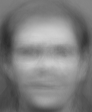

Image after NMF:


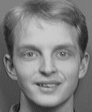

[[127. 131. 128. ... 123. 127. 122.]
 [132. 126. 127. ... 124. 126. 122.]
 [128. 127. 122. ... 123. 126. 124.]
 ...
 [ 95.  89.  86. ...  89.  91.  93.]
 [ 99.  91.  84. ...  93.  87.  90.]
 [ 96.  94.  88. ...  94.  84.  89.]]
Image Before NMF:
-------------------------------Number of image: 186
[[ 95.  95.  95. ... 100. 100. 100.]
 [ 95.  95.  95. ... 101. 101. 100.]
 [ 96.  95.  95. ... 100. 101. 101.]
 ...
 [ 40.  39.  40. ...  52.  53.  54.]
 [ 42.  41.  43. ...  51.  51.  52.]
 [ 45.  45.  46. ...  53.  53.  53.]]


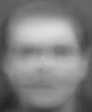

Image after NMF:


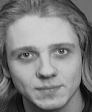

[[ 95. 101.  99. ... 109. 109. 110.]
 [ 98.  97.  99. ... 110. 108. 111.]
 [ 98.  98.  95. ... 111. 110. 109.]
 ...
 [ 62.  53.  61. ...  25.  42.  39.]
 [ 48.  69.  62. ...  31.  45.  43.]
 [ 55.  65.  46. ...  40.  42.  53.]]
Image Before NMF:
-------------------------------Number of image: 187
[[111. 111. 112. ... 113. 112. 112.]
 [112. 112. 111. ... 113. 113. 112.]
 [111. 111. 111. ... 112. 113. 113.]
 ...
 [ 62.  61.  63. ...  50.  51.  51.]
 [ 64.  62.  65. ...  49.  50.  52.]
 [ 65.  63.  66. ...  48.  49.  51.]]


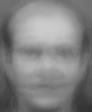

Image after NMF:


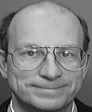

[[110. 106. 106. ... 117. 117. 122.]
 [109. 103. 109. ... 119. 119. 121.]
 [107. 104. 108. ... 119. 117. 120.]
 ...
 [ 24.  21.  28. ...  23.  19.  24.]
 [ 22.  22.  24. ...  20.  18.  21.]
 [ 20.  30.  25. ...  19.  21.  19.]]
Image Before NMF:
-------------------------------Number of image: 188
[[ 71.  72.  73. ...  80.  79.  80.]
 [ 71.  72.  72. ...  81.  80.  80.]
 [ 72.  71.  73. ...  80.  81.  81.]
 ...
 [ 88.  92.  92. ...  84.  85.  85.]
 [ 94.  98.  99. ...  88.  85.  86.]
 [100. 104. 104. ...  90.  87.  87.]]


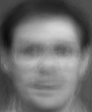

Image after NMF:


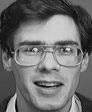

[[108. 110. 108. ... 107. 105. 105.]
 [110. 110. 110. ... 108. 104. 106.]
 [111. 107. 111. ... 107. 108. 107.]
 ...
 [ 40.  40.  44. ...  40.  36.  32.]
 [ 44.  48.  52. ...  26.  37.  36.]
 [ 41.  47.  54. ...  36.  35.  34.]]
Image Before NMF:
-------------------------------Number of image: 189
[[ 51.  51.  51. ...  48.  48.  48.]
 [ 51.  51.  52. ...  49.  49.  48.]
 [ 51.  52.  52. ...  49.  49.  49.]
 ...
 [120. 121. 122. ...  89.  87.  87.]
 [125. 127. 129. ...  93.  92.  90.]
 [128. 134. 136. ...  99.  96.  92.]]


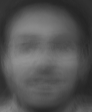

Image after NMF:


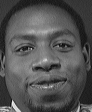

[[ 55.  56.  56. ...  55.  54.  50.]
 [ 56.  51.  60. ...  55.  47.  55.]
 [ 57.  54.  57. ...  51.  54.  52.]
 ...
 [183. 201. 201. ... 152. 149. 169.]
 [112. 148. 136. ... 107. 170. 192.]
 [125. 144. 128. ...  69. 144. 193.]]
Image Before NMF:
-------------------------------Number of image: 190
[[116. 117. 117. ... 112. 111. 111.]
 [116. 117. 117. ... 112. 112. 112.]
 [116. 117. 117. ... 112. 112. 111.]
 ...
 [159. 160. 162. ...  92.  89.  89.]
 [163. 164. 167. ...  94.  94.  94.]
 [164. 166. 169. ...  93.  94.  94.]]


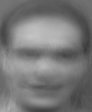

Image after NMF:


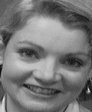

[[ 86.  89.  90. ... 143. 129. 125.]
 [ 83.  90.  89. ... 138. 140. 135.]
 [ 89.  89.  88. ... 136. 128. 131.]
 ...
 [201. 206. 209. ...  79.  75.  76.]
 [201. 206. 207. ... 112.  85.  66.]
 [201. 205. 208. ... 124. 116.  83.]]
Image Before NMF:
-------------------------------Number of image: 191
[[104. 104. 104. ... 108. 109. 109.]
 [104. 104. 104. ... 109. 109. 109.]
 [104. 104. 104. ... 109. 109. 109.]
 ...
 [117. 118. 120. ... 100. 101. 101.]
 [121. 122. 125. ... 102. 101. 103.]
 [124. 126. 129. ... 103. 102. 103.]]


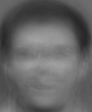

Image after NMF:


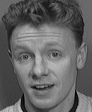

[[104. 108. 105. ... 104. 105. 108.]
 [104. 106. 105. ... 105. 106. 103.]
 [105. 105. 108. ... 102. 103. 106.]
 ...
 [ 83.  83.  99. ... 163. 176. 141.]
 [103. 124. 147. ... 179. 164. 148.]
 [160. 180. 156. ... 173. 175. 155.]]
Image Before NMF:
-------------------------------Number of image: 192
[[33. 32. 32. ... 30. 30. 30.]
 [33. 33. 32. ... 30. 30. 30.]
 [34. 33. 33. ... 30. 31. 30.]
 ...
 [83. 82. 83. ... 78. 75. 76.]
 [85. 87. 88. ... 82. 80. 76.]
 [88. 95. 95. ... 91. 88. 81.]]


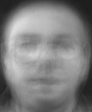

Image after NMF:


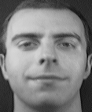

[[54. 52. 49. ... 44. 39. 36.]
 [53. 55. 47. ... 40. 40. 37.]
 [50. 53. 54. ... 40. 40. 35.]
 ...
 [43. 42. 40. ... 37. 28. 37.]
 [38. 40. 39. ... 34. 35. 31.]
 [42. 37. 36. ... 33. 33. 32.]]
Image Before NMF:
-------------------------------Number of image: 193
[[ 55.  56.  56. ...  53.  53.  53.]
 [ 56.  56.  56. ...  53.  53.  53.]
 [ 56.  56.  56. ...  53.  53.  53.]
 ...
 [132. 135. 135. ...  94.  93.  92.]
 [138. 141. 143. ...  99.  97.  95.]
 [141. 148. 150. ... 104. 101.  98.]]


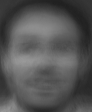

Image after NMF:


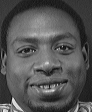

[[ 53.  58.  53. ...  48.  53.  53.]
 [ 54.  55.  64. ...  50.  50.  49.]
 [ 56.  57.  56. ...  52.  48.  54.]
 ...
 [123. 132. 109. ... 199. 140. 101.]
 [122. 146.  71. ... 202. 140.  81.]
 [105. 148.  77. ... 195. 122.  76.]]
Image Before NMF:
-------------------------------Number of image: 194
[[ 34.  35.  35. ...  34.  33.  33.]
 [ 34.  36.  35. ...  34.  34.  34.]
 [ 36.  36.  36. ...  34.  35.  34.]
 ...
 [158. 158. 160. ... 108. 101. 101.]
 [160. 164. 164. ... 113. 110. 106.]
 [162. 168. 168. ... 119. 117. 111.]]


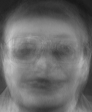

Image after NMF:


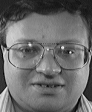

[[ 37.  36.  35. ...  33.  27.  29.]
 [ 36.  34.  35. ...  31.  29.  27.]
 [ 36.  34.  35. ...  30.  33.  28.]
 ...
 [184. 154. 188. ... 211. 192. 159.]
 [172. 152. 204. ... 215. 208. 149.]
 [163. 167. 213. ... 210. 212. 157.]]
Image Before NMF:
-------------------------------Number of image: 195
[[102. 103. 104. ... 105. 104. 105.]
 [103. 103. 104. ... 105. 105. 105.]
 [103. 103. 104. ... 105. 105. 105.]
 ...
 [104. 107. 108. ...  78.  79.  79.]
 [111. 113. 115. ...  81.  80.  81.]
 [115. 118. 119. ...  82.  80.  81.]]


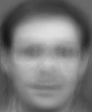

Image after NMF:


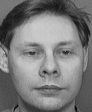

[[119. 121. 119. ... 118. 118. 119.]
 [118. 120. 121. ... 119. 119. 120.]
 [120. 120. 124. ... 116. 116. 116.]
 ...
 [ 84.  86.  83. ...  80.  79.  87.]
 [ 87.  82.  89. ...  78.  85.  76.]
 [ 85.  88. 105. ...  82.  78.  80.]]
Image Before NMF:
-------------------------------Number of image: 196
[[116. 116. 116. ... 118. 118. 118.]
 [116. 116. 116. ... 119. 118. 118.]
 [116. 116. 116. ... 118. 119. 118.]
 ...
 [ 60.  58.  60. ...  52.  53.  53.]
 [ 60.  58.  61. ...  51.  52.  54.]
 [ 61.  59.  62. ...  50.  51.  53.]]


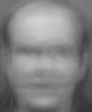

Image after NMF:


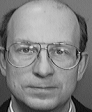

[[108. 112. 110. ... 119. 119. 122.]
 [111. 110. 113. ... 121. 120. 120.]
 [111. 111. 111. ... 119. 119. 120.]
 ...
 [ 23.  23.  20. ...  23.  35.  62.]
 [ 27.  28.  23. ...  24.  20.  27.]
 [ 25.  25.  19. ...  22.  30.  20.]]
Image Before NMF:
-------------------------------Number of image: 197
[[104. 104. 105. ... 110. 110. 110.]
 [104. 104. 104. ... 111. 111. 111.]
 [104. 103. 104. ... 110. 111. 111.]
 ...
 [ 86.  88.  89. ...  77.  78.  78.]
 [ 91.  92.  94. ...  78.  77.  79.]
 [ 94.  95.  97. ...  78.  77.  79.]]


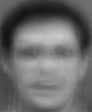

Image after NMF:


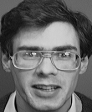

[[102. 103. 103. ... 103. 100. 101.]
 [102. 103. 103. ... 101.  97. 101.]
 [104. 102. 102. ... 101. 102. 101.]
 ...
 [ 43.  41.  42. ...  37.  36.  27.]
 [ 36.  41.  48. ...  37.  43.  35.]
 [ 42.  40.  31. ...  36.  37.  31.]]
Image Before NMF:
-------------------------------Number of image: 198
[[105. 105. 106. ... 108. 107. 107.]
 [105. 106. 106. ... 108. 108. 107.]
 [106. 105. 106. ... 107. 108. 108.]
 ...
 [ 63.  65.  66. ...  55.  58.  58.]
 [ 68.  68.  71. ...  56.  56.  58.]
 [ 72.  73.  75. ...  56.  56.  57.]]


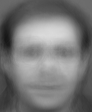

Image after NMF:


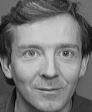

[[104. 109. 104. ... 110. 111. 109.]
 [104. 108. 106. ... 107. 112. 110.]
 [106. 103. 106. ... 109. 111. 112.]
 ...
 [ 73.  77.  78. ...  59.  56.  63.]
 [ 72.  84.  82. ...  56.  57.  60.]
 [ 78.  77.  77. ...  52.  59.  56.]]
Image Before NMF:
-------------------------------Number of image: 199
[[117. 117. 118. ... 115. 115. 115.]
 [117. 117. 118. ... 115. 115. 115.]
 [117. 117. 117. ... 115. 115. 115.]
 ...
 [ 86.  86.  89. ...  66.  68.  68.]
 [ 92.  90.  96. ...  65.  67.  68.]
 [ 96.  98. 101. ...  66.  68.  68.]]


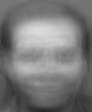

Image after NMF:


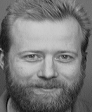

[[112. 109. 110. ... 112. 110. 111.]
 [108. 112. 110. ... 113. 112. 111.]
 [110. 110. 112. ... 114. 107. 116.]
 ...
 [107. 107. 107. ...  71.  77.  78.]
 [110. 108. 104. ...  59.  77.  77.]
 [109. 108. 104. ...  65.  69.  83.]]
Image Before NMF:
-------------------------------Number of image: 200
[[ 87.  87.  87. ...  84.  83.  83.]
 [ 87.  87.  87. ...  84.  84.  84.]
 [ 86.  87.  88. ...  84.  84.  83.]
 ...
 [175. 177. 179. ... 111. 108. 107.]
 [179. 181. 182. ... 115. 114. 113.]
 [179. 182. 185. ... 115. 114. 114.]]


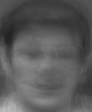

Image after NMF:


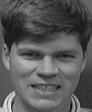

[[ 93.  92.  97. ... 102. 100.  98.]
 [ 92.  95.  90. ... 100.  99.  99.]
 [ 90.  95.  98. ...  96. 101. 102.]
 ...
 [187. 198. 196. ... 105. 102.  92.]
 [193. 202. 197. ... 107. 117. 117.]
 [197. 203. 196. ...  94.  90.  94.]]
Image Before NMF:
-------------------------------Number of image: 201
[[107. 107. 108. ... 103. 102. 102.]
 [108. 108. 108. ... 102. 102. 102.]
 [108. 108. 108. ... 102. 102. 101.]
 ...
 [ 58.  56.  57. ...  44.  43.  44.]
 [ 59.  58.  60. ...  46.  45.  44.]
 [ 59.  61.  63. ...  49.  48.  46.]]


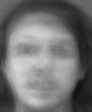

Image after NMF:


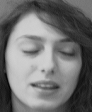

[[129. 127. 128. ... 117. 118. 115.]
 [130. 125. 129. ... 118. 118. 114.]
 [124. 128. 124. ... 118. 119. 115.]
 ...
 [ 39.  40.  40. ...  35.  39.  46.]
 [ 42.  39.  41. ...  32.  37.  41.]
 [ 45.  42.  42. ...  32.  35.  40.]]
Image Before NMF:
-------------------------------Number of image: 202
[[41. 39. 40. ... 36. 36. 37.]
 [40. 40. 40. ... 37. 36. 36.]
 [41. 41. 40. ... 36. 37. 37.]
 ...
 [65. 64. 65. ... 65. 64. 65.]
 [67. 68. 69. ... 68. 67. 64.]
 [69. 75. 76. ... 76. 74. 68.]]


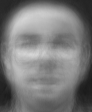

Image after NMF:


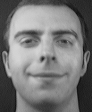

[[53. 50. 52. ... 39. 37. 42.]
 [52. 53. 52. ... 42. 33. 41.]
 [54. 57. 53. ... 40. 39. 44.]
 ...
 [42. 40. 42. ... 36. 28. 35.]
 [40. 40. 39. ... 32. 37. 33.]
 [40. 35. 41. ... 35. 34. 33.]]
Image Before NMF:
-------------------------------Number of image: 203
[[135. 135. 135. ... 131. 131. 130.]
 [135. 135. 135. ... 130. 130. 130.]
 [135. 135. 135. ... 131. 130. 130.]
 ...
 [106. 106. 108. ...  73.  74.  74.]
 [110. 109. 113. ...  74.  75.  76.]
 [112. 113. 116. ...  75.  75.  75.]]


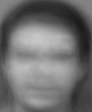

Image after NMF:


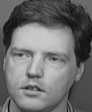

[[109. 112. 114. ... 104. 108. 109.]
 [113. 112. 112. ... 105. 107. 105.]
 [111. 112. 112. ... 108. 105. 103.]
 ...
 [120.  84. 113. ...  71.  71.  68.]
 [101.  90. 123. ...  72.  71.  71.]
 [ 80. 108. 124. ...  69.  72.  69.]]
Image Before NMF:
-------------------------------Number of image: 204
[[131. 130. 131. ... 130. 131. 130.]
 [131. 131. 130. ... 130. 130. 130.]
 [131. 131. 130. ... 130. 130. 130.]
 ...
 [ 79.  77.  79. ...  69.  70.  70.]
 [ 81.  79.  83. ...  69.  69.  71.]
 [ 83.  83.  86. ...  70.  70.  71.]]


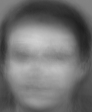

Image after NMF:


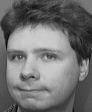

[[124. 126. 124. ... 120. 120. 119.]
 [124. 122. 126. ... 121. 117. 120.]
 [125. 125. 123. ... 120. 117. 121.]
 ...
 [ 74.  74.  68. ...  81.  79.  79.]
 [ 74.  71.  69. ...  79.  78.  82.]
 [ 72.  72.  68. ...  78.  78.  77.]]
Image Before NMF:
-------------------------------Number of image: 205
[[122. 122. 122. ... 122. 122. 122.]
 [122. 122. 121. ... 122. 122. 122.]
 [123. 122. 122. ... 122. 122. 122.]
 ...
 [ 84.  81.  84. ...  70.  70.  71.]
 [ 85.  83.  87. ...  69.  70.  71.]
 [ 87.  86.  89. ...  69.  69.  71.]]


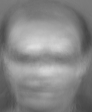

Image after NMF:


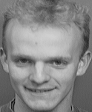

[[132. 127. 128. ... 127. 124. 125.]
 [129. 126. 129. ... 124. 127. 126.]
 [129. 128. 125. ... 125. 127. 128.]
 ...
 [118.  86.  96. ...  89.  86.  84.]
 [122.  81.  97. ...  85.  84.  84.]
 [118.  79.  93. ...  85.  83.  85.]]
Image Before NMF:
-------------------------------Number of image: 206
[[ 44.  44.  44. ...  42.  41.  41.]
 [ 44.  44.  44. ...  42.  43.  42.]
 [ 44.  45.  45. ...  42.  43.  43.]
 ...
 [181. 183. 185. ... 118. 113. 112.]
 [185. 188. 189. ... 123. 121. 118.]
 [186. 192. 193. ... 126. 124. 121.]]


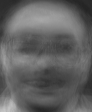

Image after NMF:


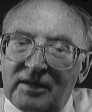

[[ 19.  23.  20. ...  17.  16.  15.]
 [ 22.  22.  19. ...  17.  18.  18.]
 [ 22.  24.  18. ...  18.  17.  17.]
 ...
 [169. 160. 157. ... 156. 167. 177.]
 [169. 158. 154. ... 164. 171. 176.]
 [168. 160. 154. ... 169. 173. 175.]]
Image Before NMF:
-------------------------------Number of image: 207
[[ 47.  47.  47. ...  45.  45.  45.]
 [ 47.  47.  47. ...  46.  46.  46.]
 [ 47.  48.  48. ...  45.  46.  46.]
 ...
 [123. 124. 125. ...  93.  91.  91.]
 [127. 130. 132. ...  97.  96.  93.]
 [130. 136. 138. ... 103. 100.  96.]]


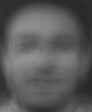

Image after NMF:


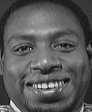

[[ 49.  65.  53. ...  54.  50.  56.]
 [ 62.  55.  59. ...  51.  52.  54.]
 [ 57.  63.  51. ...  54.  51.  56.]
 ...
 [146. 134. 158. ...  82.  72.  78.]
 [125. 159. 151. ... 142.  84.  65.]
 [104. 221. 209. ... 134. 130. 145.]]
Image Before NMF:
-------------------------------Number of image: 208
[[71. 70. 71. ... 75. 75. 76.]
 [71. 70. 70. ... 76. 76. 76.]
 [71. 70. 71. ... 75. 77. 76.]
 ...
 [63. 61. 64. ... 71. 71. 71.]
 [63. 63. 64. ... 71. 71. 71.]
 [65. 66. 67. ... 74. 74. 73.]]


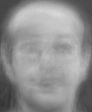

Image after NMF:


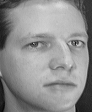

[[64. 76. 80. ... 52. 54. 52.]
 [60. 61. 60. ... 52. 53. 51.]
 [63. 80. 79. ... 53. 52. 59.]
 ...
 [21. 22. 12. ... 37. 42. 35.]
 [19. 20.  7. ... 42. 35. 42.]
 [24. 14. 11. ... 35. 37. 39.]]
Image Before NMF:
-------------------------------Number of image: 209
[[113. 112. 112. ... 115. 115. 115.]
 [113. 113. 112. ... 116. 115. 115.]
 [113. 112. 112. ... 115. 116. 116.]
 ...
 [ 51.  49.  50. ...  50.  51.  52.]
 [ 51.  49.  52. ...  50.  50.  52.]
 [ 52.  49.  52. ...  49.  50.  51.]]


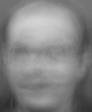

Image after NMF:


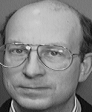

[[111. 112. 110. ... 118. 121. 119.]
 [108. 114. 110. ... 120. 122. 121.]
 [113. 109. 112. ... 118. 121. 122.]
 ...
 [ 21.  23.  23. ...  24.  17.  20.]
 [ 24.  23.  21. ...  21.  21.  19.]
 [ 24.  20.  22. ...  21.  20.  17.]]
Image Before NMF:
-------------------------------Number of image: 210
[[51. 51. 52. ... 55. 55. 56.]
 [51. 52. 52. ... 56. 56. 56.]
 [52. 51. 52. ... 55. 56. 56.]
 ...
 [51. 54. 55. ... 52. 52. 53.]
 [56. 59. 59. ... 53. 52. 52.]
 [61. 64. 63. ... 56. 55. 53.]]


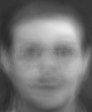

Image after NMF:


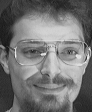

[[52. 56. 60. ... 48. 55. 57.]
 [51. 59. 54. ... 53. 62. 56.]
 [57. 54. 59. ... 55. 54. 58.]
 ...
 [55. 52. 58. ... 38. 44. 42.]
 [50. 49. 55. ... 49. 40. 42.]
 [49. 51. 51. ... 39. 41. 44.]]
Image Before NMF:
-------------------------------Number of image: 211
[[109. 110. 110. ... 107. 106. 106.]
 [110. 110. 110. ... 107. 107. 106.]
 [110. 110. 110. ... 107. 106. 106.]
 ...
 [ 32.  31.  33. ...  18.  18.  19.]
 [ 33.  30.  34. ...  14.  17.  18.]
 [ 34.  32.  34. ...  13.  16.  18.]]


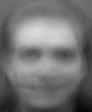

Image after NMF:


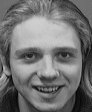

[[111. 106. 106. ... 111. 108. 107.]
 [108. 107. 108. ... 113. 110. 105.]
 [108. 109. 108. ... 111. 111. 112.]
 ...
 [ 50.  31.  36. ...  37.  39.  29.]
 [ 40.  31.  32. ...  41.  36.  31.]
 [ 39.  39.  33. ...  43.  34.  43.]]
Image Before NMF:
-------------------------------Number of image: 212
[[118. 119. 119. ... 113. 113. 112.]
 [118. 119. 119. ... 113. 113. 113.]
 [118. 119. 119. ... 113. 113. 113.]
 ...
 [152. 155. 157. ...  87.  86.  85.]
 [158. 160. 163. ...  89.  89.  90.]
 [160. 163. 165. ...  88.  89.  90.]]


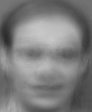

Image after NMF:


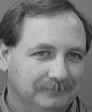

[[123. 122. 121. ... 117. 116. 115.]
 [124. 123. 121. ... 115. 116. 117.]
 [123. 123. 123. ... 116. 116. 116.]
 ...
 [ 88. 100. 129. ...  94.  85.  79.]
 [ 86.  95. 129. ...  84.  92.  95.]
 [ 78.  95. 125. ...  84.  92.  94.]]
Image Before NMF:
-------------------------------Number of image: 213
[[101. 100. 101. ... 104. 104. 105.]
 [100. 100. 100. ... 105. 104. 104.]
 [101. 100. 100. ... 104. 105. 105.]
 ...
 [ 86.  86.  87. ...  81.  82.  83.]
 [ 89.  89.  93. ...  82.  82.  83.]
 [ 93.  94.  97. ...  84.  82.  83.]]


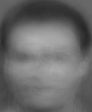

Image after NMF:


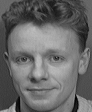

[[104. 106. 105. ... 101. 104. 102.]
 [101. 107. 102. ... 103. 102. 103.]
 [106. 104. 106. ... 101. 102. 103.]
 ...
 [ 63.  64.  63. ... 165. 156. 155.]
 [ 85. 110. 126. ... 161. 159. 160.]
 [149. 167. 165. ... 148. 155. 168.]]
Image Before NMF:
-------------------------------Number of image: 214
[[113. 113. 113. ... 114. 114. 113.]
 [113. 113. 113. ... 114. 114. 114.]
 [114. 113. 113. ... 113. 114. 114.]
 ...
 [112. 111. 112. ...  89.  89.  90.]
 [115. 115. 118. ...  92.  91.  91.]
 [118. 119. 122. ...  95.  93.  92.]]


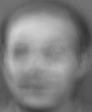

Image after NMF:


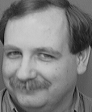

[[119. 123. 121. ... 115. 117. 116.]
 [119. 121. 122. ... 118. 114. 119.]
 [121. 121. 121. ... 115. 114. 115.]
 ...
 [139.  77.  90. ...  94. 106.  91.]
 [141.  81.  87. ...  95. 107.  91.]
 [140.  82.  89. ...  93. 106.  90.]]
Image Before NMF:
-------------------------------Number of image: 215
[[ 98.  98.  99. ...  99.  98.  98.]
 [ 98.  98.  98. ...  98.  98.  98.]
 [ 98.  98.  99. ...  99.  99.  98.]
 ...
 [120. 122. 124. ...  82.  81.  80.]
 [123. 125. 126. ...  84.  84.  84.]
 [124. 126. 128. ...  84.  83.  84.]]


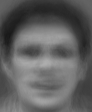

Image after NMF:


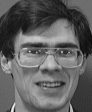

[[113. 111. 112. ... 112. 110. 109.]
 [113. 112. 111. ... 111. 112. 110.]
 [108. 112. 110. ... 111. 108. 111.]
 ...
 [ 99. 100.  97. ...  49.  54.  47.]
 [ 98. 101.  96. ...  48.  53.  53.]
 [ 97.  96.  95. ...  47.  57.  55.]]
Image Before NMF:
-------------------------------Number of image: 216
[[119. 120. 121. ... 112. 112. 112.]
 [120. 121. 120. ... 112. 112. 112.]
 [120. 120. 120. ... 112. 112. 112.]
 ...
 [135. 138. 139. ...  74.  74.  73.]
 [142. 143. 147. ...  75.  75.  77.]
 [145. 148. 150. ...  73.  75.  76.]]


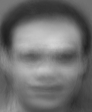

Image after NMF:


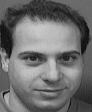

[[100. 110. 107. ... 102. 105. 107.]
 [105. 108. 105. ... 104. 102. 105.]
 [107. 106. 105. ... 105. 108. 103.]
 ...
 [129. 127. 132. ...  70.  63.  63.]
 [138. 130. 134. ...  65.  68.  56.]
 [138. 130. 131. ...  64.  71.  59.]]
Image Before NMF:
-------------------------------Number of image: 217
[[149. 149. 149. ... 144. 144. 144.]
 [149. 149. 148. ... 143. 143. 143.]
 [148. 149. 149. ... 144. 144. 143.]
 ...
 [188. 188. 192. ... 123. 121. 120.]
 [192. 191. 195. ... 124. 125. 126.]
 [191. 192. 197. ... 122. 123. 126.]]


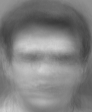

Image after NMF:


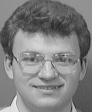

[[144. 144. 145. ... 145. 145. 145.]
 [144. 145. 144. ... 143. 146. 145.]
 [145. 145. 145. ... 145. 147. 143.]
 ...
 [153. 158. 186. ...  81.  81.  79.]
 [192. 216. 224. ...  85.  80.  79.]
 [226. 222. 223. ...  76.  78.  82.]]
Image Before NMF:
-------------------------------Number of image: 218
[[ 62.  63.  63. ...  57.  57.  57.]
 [ 63.  63.  64. ...  57.  57.  57.]
 [ 63.  63.  64. ...  58.  57.  57.]
 ...
 [106. 109. 109. ...  77.  76.  76.]
 [114. 117. 119. ...  82.  80.  77.]
 [118. 127. 127. ...  89.  86.  80.]]


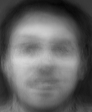

Image after NMF:


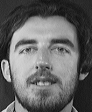

[[ 48.  46.  49. ...  37.  39.  40.]
 [ 43.  53.  46. ...  36.  40.  41.]
 [ 52.  43.  53. ...  40.  39.  41.]
 ...
 [ 62.  48.  49. ...  30.  33.  32.]
 [ 56.  25.  92. ...  32.  31.  30.]
 [ 43. 110. 215. ...  31.  31.  36.]]
Image Before NMF:
-------------------------------Number of image: 219
[[72. 72. 73. ... 68. 67. 67.]
 [72. 73. 74. ... 67. 67. 67.]
 [73. 73. 73. ... 68. 67. 67.]
 ...
 [83. 83. 84. ... 61. 60. 60.]
 [87. 89. 91. ... 65. 64. 61.]
 [90. 96. 97. ... 72. 69. 64.]]


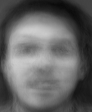

Image after NMF:


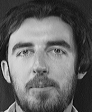

[[45. 49. 47. ... 40. 39. 42.]
 [46. 51. 50. ... 41. 39. 37.]
 [48. 48. 51. ... 41. 38. 38.]
 ...
 [53. 62. 59. ... 36. 33. 36.]
 [56. 56. 54. ... 37. 39. 36.]
 [67. 84. 88. ... 40. 30. 44.]]
Image Before NMF:
-------------------------------Number of image: 220
[[82. 83. 83. ... 77. 77. 77.]
 [82. 83. 83. ... 77. 77. 77.]
 [83. 83. 83. ... 77. 77. 76.]
 ...
 [69. 69. 71. ... 42. 41. 41.]
 [72. 73. 75. ... 42. 42. 42.]
 [75. 77. 78. ... 43. 45. 43.]]


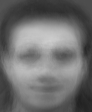

Image after NMF:


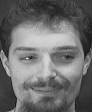

[[50. 57. 56. ... 58. 56. 57.]
 [52. 56. 60. ... 58. 57. 55.]
 [52. 56. 58. ... 59. 56. 57.]
 ...
 [52. 56. 56. ... 41. 46. 43.]
 [59. 53. 54. ... 40. 46. 42.]
 [58. 56. 53. ... 39. 46. 43.]]
Image Before NMF:
-------------------------------Number of image: 221
[[110. 109. 110. ... 107. 108. 107.]
 [110. 110. 110. ... 107. 108. 107.]
 [110. 110. 109. ... 107. 107. 108.]
 ...
 [105. 107. 109. ...  76.  78.  78.]
 [112. 111. 116. ...  75.  77.  79.]
 [116. 119. 122. ...  77.  78.  78.]]


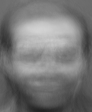

Image after NMF:


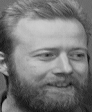

[[112. 107. 111. ... 106. 110. 104.]
 [107. 110. 102. ... 109. 106. 107.]
 [109. 106. 112. ... 105. 109. 108.]
 ...
 [ 61.  81. 170. ...  47.  48.  48.]
 [ 70.  71. 168. ...  46.  44.  50.]
 [ 80.  59. 153. ...  39.  45.  57.]]
Image Before NMF:
-------------------------------Number of image: 222
[[112. 111. 112. ... 109. 109. 109.]
 [112. 112. 111. ... 109. 109. 109.]
 [112. 112. 112. ... 109. 109. 109.]
 ...
 [110. 108. 111. ...  81.  79.  79.]
 [112. 110. 114. ...  81.  81.  82.]
 [112. 113. 116. ...  82.  82.  82.]]


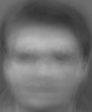

Image after NMF:


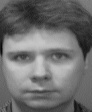

[[118. 122. 118. ... 119. 126. 126.]
 [122. 118. 117. ... 122. 125. 125.]
 [119. 121. 116. ... 122. 124. 124.]
 ...
 [ 90. 101. 104. ...  80.  90.  88.]
 [ 93.  83. 110. ...  76.  79.  80.]
 [103.  68. 103. ...  78.  62.  62.]]
Image Before NMF:
-------------------------------Number of image: 223
[[ 82.  83.  83. ...  79.  79.  79.]
 [ 82.  83.  82. ...  79.  79.  80.]
 [ 83.  83.  83. ...  79.  80.  79.]
 ...
 [145. 145. 146. ...  93.  89.  89.]
 [147. 149. 151. ...  96.  94.  93.]
 [149. 151. 153. ...  98.  96.  95.]]


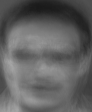

Image after NMF:


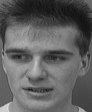

[[110. 113. 108. ... 105. 100. 105.]
 [108. 113. 107. ... 105. 102. 106.]
 [109. 111. 112. ... 103. 102. 104.]
 ...
 [202. 201. 204. ...  65.  65.  67.]
 [204. 202. 203. ...  66.  61.  66.]
 [204. 203. 204. ...  63.  63.  61.]]
Image Before NMF:
-------------------------------Number of image: 224
[[ 79.  78.  78. ...  88.  87.  89.]
 [ 79.  79.  77. ...  89.  89.  89.]
 [ 80.  79.  79. ...  87.  90.  90.]
 ...
 [ 77.  74.  76. ...  93.  92.  92.]
 [ 76.  76.  77. ...  95.  93.  92.]
 [ 78.  78.  80. ... 100.  96.  95.]]


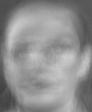

Image after NMF:


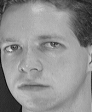

[[ 43.  50.  41. ...  55.  55.  56.]
 [ 45.  53.  44. ...  67.  62.  52.]
 [ 57.  47.  47. ...  45.  59.  55.]
 ...
 [ 49.  49.  46. ... 154. 152. 175.]
 [ 46.  48.  47. ... 157. 150. 174.]
 [ 49.  50.  43. ... 158. 153. 169.]]
Image Before NMF:
-------------------------------Number of image: 225
[[130. 130. 130. ... 129. 129. 129.]
 [130. 130. 130. ... 129. 129. 129.]
 [130. 130. 129. ... 129. 129. 129.]
 ...
 [ 77.  76.  79. ...  55.  56.  56.]
 [ 79.  76.  80. ...  52.  55.  58.]
 [ 80.  78.  81. ...  49.  52.  56.]]


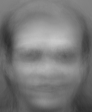

Image after NMF:


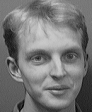

[[119. 121. 123. ... 122. 118. 119.]
 [122. 123. 123. ... 122. 120. 120.]
 [120. 125. 121. ... 123. 121. 120.]
 ...
 [ 85.  88.  88. ...  38.  36.  43.]
 [ 84.  84.  87. ...  37.  34.  45.]
 [ 80.  89.  85. ...  36.  40.  36.]]
Image Before NMF:
-------------------------------Number of image: 226
[[44. 44. 45. ... 43. 42. 43.]
 [44. 45. 44. ... 43. 43. 43.]
 [45. 45. 45. ... 43. 44. 43.]
 ...
 [34. 33. 34. ... 33. 30. 31.]
 [34. 34. 34. ... 33. 33. 31.]
 [34. 36. 36. ... 37. 36. 33.]]


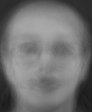

Image after NMF:


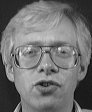

[[ 34.  39.  35. ...  36.  35.  35.]
 [ 35.  35.  36. ...  34.  35.  35.]
 [ 35.  42.  34. ...  34.  37.  36.]
 ...
 [ 38.  36.  39. ...  58.  43.  34.]
 [ 41.  34.  43. ... 129. 129. 121.]
 [ 39.  36.  35. ... 135. 138. 148.]]
Image Before NMF:
-------------------------------Number of image: 227
[[148. 148. 148. ... 144. 144. 143.]
 [148. 148. 148. ... 143. 144. 144.]
 [147. 148. 148. ... 144. 144. 143.]
 ...
 [184. 184. 187. ... 122. 120. 119.]
 [187. 186. 190. ... 123. 124. 125.]
 [186. 188. 193. ... 122. 123. 125.]]


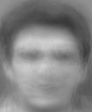

Image after NMF:


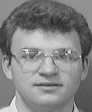

[[139. 143. 146. ... 145. 146. 146.]
 [141. 148. 141. ... 143. 143. 144.]
 [145. 142. 141. ... 143. 146. 145.]
 ...
 [170. 203. 218. ...  80.  77.  80.]
 [222. 224. 223. ...  84.  75.  84.]
 [222. 223. 221. ...  83.  81.  74.]]
Image Before NMF:
-------------------------------Number of image: 228
[[ 95.  95.  95. ...  94.  93.  93.]
 [ 95.  95.  95. ...  93.  93.  93.]
 [ 95.  95.  95. ...  93.  94.  93.]
 ...
 [111. 111. 113. ...  76.  75.  74.]
 [113. 113. 115. ...  77.  77.  78.]
 [113. 114. 117. ...  77.  77.  78.]]


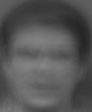

Image after NMF:


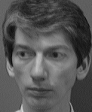

[[104.  98. 100. ...  93.  96.  93.]
 [ 97. 101. 101. ...  93.  94.  93.]
 [ 99. 100. 100. ...  97.  98.  91.]
 ...
 [ 92.  92.  89. ...  56.  52.  51.]
 [ 88.  88.  93. ...  51.  53.  50.]
 [ 84.  92.  90. ...  52.  49.  53.]]
Image Before NMF:
-------------------------------Number of image: 229
[[57. 57. 58. ... 59. 58. 59.]
 [57. 58. 57. ... 59. 59. 59.]
 [58. 58. 58. ... 58. 60. 59.]
 ...
 [63. 65. 65. ... 54. 54. 54.]
 [66. 69. 69. ... 58. 55. 55.]
 [69. 71. 71. ... 59. 57. 56.]]


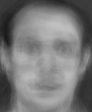

Image after NMF:


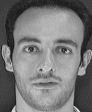

[[60. 57. 59. ... 61. 61. 63.]
 [58. 60. 59. ... 66. 60. 63.]
 [59. 59. 60. ... 64. 60. 61.]
 ...
 [54. 51. 54. ... 57. 57. 57.]
 [54. 53. 50. ... 56. 54. 61.]
 [54. 52. 46. ... 49. 55. 54.]]
Image Before NMF:
-------------------------------Number of image: 230
[[ 51.  51.  51. ...  48.  48.  48.]
 [ 51.  51.  51. ...  48.  48.  48.]
 [ 51.  52.  51. ...  48.  49.  48.]
 ...
 [104. 105. 106. ...  79.  78.  78.]
 [108. 110. 112. ...  82.  81.  80.]
 [111. 116. 118. ...  87.  85.  82.]]


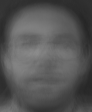

Image after NMF:


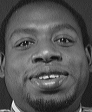

[[ 58.  54.  57. ...  53.  50.  54.]
 [ 57.  50.  57. ...  51.  54.  47.]
 [ 59.  52.  60. ...  52.  53.  53.]
 ...
 [ 76.  97. 104. ... 119. 113. 106.]
 [160. 191. 205. ... 119. 137. 142.]
 [136. 136. 149. ...  97. 115. 128.]]
Image Before NMF:
-------------------------------Number of image: 231
[[81. 80. 81. ... 81. 81. 81.]
 [81. 80. 81. ... 81. 81. 81.]
 [80. 80. 81. ... 81. 81. 81.]
 ...
 [54. 53. 56. ... 60. 59. 60.]
 [55. 54. 56. ... 58. 60. 60.]
 [56. 59. 61. ... 63. 64. 61.]]


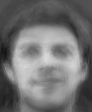

Image after NMF:


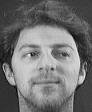

[[54. 51. 49. ... 58. 56. 57.]
 [54. 49. 52. ... 58. 60. 56.]
 [51. 51. 55. ... 62. 59. 57.]
 ...
 [48. 49. 46. ... 57. 66. 61.]
 [49. 47. 52. ... 62. 60. 62.]
 [47. 48. 51. ... 61. 59. 63.]]
Image Before NMF:
-------------------------------Number of image: 232
[[120. 121. 121. ... 117. 116. 116.]
 [120. 121. 121. ... 117. 117. 116.]
 [121. 121. 121. ... 117. 117. 116.]
 ...
 [130. 132. 134. ...  78.  78.  77.]
 [136. 137. 141. ...  80.  80.  81.]
 [139. 141. 143. ...  79.  79.  80.]]


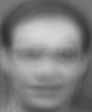

Image after NMF:


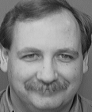

[[120. 123. 119. ... 114. 113. 115.]
 [122. 122. 121. ... 117. 114. 114.]
 [121. 121. 120. ... 114. 115. 114.]
 ...
 [121. 131. 138. ...  98.  96. 101.]
 [119. 131. 138. ...  96.  94. 102.]
 [115. 130. 132. ...  96.  95. 103.]]
Image Before NMF:
-------------------------------Number of image: 233
[[51. 50. 51. ... 49. 48. 49.]
 [51. 51. 51. ... 49. 49. 49.]
 [51. 51. 51. ... 49. 49. 49.]
 ...
 [63. 64. 65. ... 60. 60. 60.]
 [68. 70. 72. ... 63. 62. 60.]
 [72. 78. 79. ... 70. 67. 63.]]


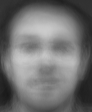

Image after NMF:


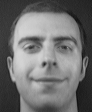

[[46. 48. 51. ... 37. 36. 31.]
 [53. 47. 51. ... 37. 32. 35.]
 [54. 51. 50. ... 36. 37. 34.]
 ...
 [42. 41. 43. ... 32. 35. 31.]
 [46. 36. 45. ... 29. 35. 32.]
 [41. 43. 37. ... 34. 30. 32.]]
Image Before NMF:
-------------------------------Number of image: 234
[[ 57.  58.  58. ...  56.  56.  56.]
 [ 58.  58.  58. ...  56.  56.  56.]
 [ 58.  58.  58. ...  56.  57.  56.]
 ...
 [123. 125. 126. ...  90.  89.  88.]
 [129. 132. 134. ...  94.  93.  91.]
 [132. 138. 140. ...  99.  96.  93.]]


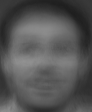

Image after NMF:


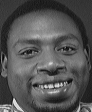

[[ 56.  58.  50. ...  55.  48.  54.]
 [ 56.  49.  59. ...  51.  53.  47.]
 [ 52.  55.  57. ...  54.  47.  55.]
 ...
 [126. 136. 140. ...  73. 139. 200.]
 [128. 134. 112. ...  86.  86. 202.]
 [155. 122. 110. ...  63.  75. 189.]]
Image Before NMF:
-------------------------------Number of image: 235
[[ 92.  93.  93. ...  91.  90.  90.]
 [ 93.  93.  93. ...  90.  90.  90.]
 [ 93.  93.  93. ...  91.  90.  90.]
 ...
 [116. 117. 119. ...  77.  76.  76.]
 [120. 120. 123. ...  78.  78.  79.]
 [121. 124. 126. ...  78.  79.  79.]]


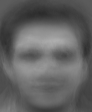

Image after NMF:


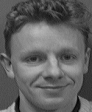

[[ 93.  98.  95. ...  87.  92.  89.]
 [ 96.  95.  97. ...  89.  88.  90.]
 [ 99.  98.  94. ...  87.  90.  88.]
 ...
 [ 83.  81.  91. ... 122. 120. 133.]
 [121. 132. 155. ... 126. 126. 142.]
 [168. 163. 177. ... 131. 131. 132.]]
Image Before NMF:
-------------------------------Number of image: 236
[[126. 126. 127. ... 120. 120. 120.]
 [126. 127. 127. ... 120. 120. 120.]
 [126. 126. 126. ... 120. 119. 119.]
 ...
 [116. 116. 118. ...  68.  68.  67.]
 [120. 119. 122. ...  69.  70.  71.]
 [120. 122. 124. ...  68.  69.  70.]]


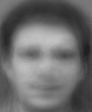

Image after NMF:


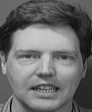

[[104. 106. 107. ...  99. 100.  97.]
 [106. 106. 102. ...  96. 100.  99.]
 [105. 104. 104. ... 101.  95.  94.]
 ...
 [152. 107.  93. ...  59.  52.  42.]
 [144.  83. 107. ...  72.  63.  67.]
 [115.  84. 128. ...  65.  59.  73.]]
Image Before NMF:
-------------------------------Number of image: 237
[[ 76.  76.  76. ...  80.  80.  80.]
 [ 76.  76.  76. ...  81.  81.  81.]
 [ 76.  76.  77. ...  80.  81.  81.]
 ...
 [150. 152. 154. ... 120. 119. 119.]
 [155. 158. 159. ... 125. 123. 123.]
 [158. 162. 165. ... 128. 125. 124.]]


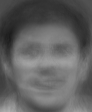

Image after NMF:


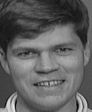

[[ 54.  49.  56. ... 103. 102. 104.]
 [ 54.  47.  49. ... 102. 105. 102.]
 [ 42.  43.  67. ... 100. 102. 104.]
 ...
 [168. 174. 157. ... 151. 124.  82.]
 [161. 166. 172. ... 161. 168. 161.]
 [175. 189. 175. ... 154. 154. 162.]]
Image Before NMF:
-------------------------------Number of image: 238
[[110. 110. 111. ... 109. 108. 108.]
 [110. 111. 111. ... 109. 109. 108.]
 [110. 110. 111. ... 109. 109. 108.]
 ...
 [135. 136. 138. ...  89.  88.  87.]
 [140. 141. 144. ...  91.  91.  91.]
 [142. 145. 147. ...  92.  92.  92.]]


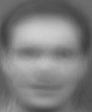

Image after NMF:


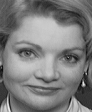

[[ 92.  93.  96. ...  92.  89.  90.]
 [ 94.  96.  91. ...  93.  95.  92.]
 [ 91.  90.  89. ...  94.  90.  96.]
 ...
 [148. 197. 171. ... 121. 112.  54.]
 [154. 198. 165. ... 174. 162. 156.]
 [159. 195. 161. ... 192. 163. 157.]]
Image Before NMF:
-------------------------------Number of image: 239
[[103. 103. 103. ... 107. 107. 107.]
 [103. 103. 103. ... 108. 108. 107.]
 [103. 103. 103. ... 107. 108. 108.]
 ...
 [ 81.  81.  82. ...  79.  81.  81.]
 [ 84.  84.  86. ...  81.  81.  82.]
 [ 86.  87.  90. ...  84.  82.  82.]]


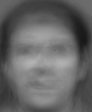

Image after NMF:


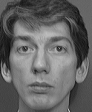

[[102. 105. 104. ... 101. 101. 105.]
 [106. 102. 101. ... 102. 102. 101.]
 [105. 100. 103. ... 101. 101. 104.]
 ...
 [ 69.  70.  68. ...  78.  72.  78.]
 [ 69.  69.  71. ...  73.  77.  75.]
 [ 69.  69.  72. ...  74.  74.  75.]]
Image Before NMF:
-------------------------------Number of image: 240
[[ 35.  36.  36. ...  33.  33.  33.]
 [ 36.  36.  36. ...  34.  34.  34.]
 [ 36.  37.  37. ...  34.  35.  34.]
 ...
 [193. 195. 198. ... 128. 123. 122.]
 [198. 203. 203. ... 134. 132. 128.]
 [200. 208. 209. ... 140. 137. 132.]]


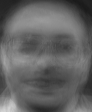

Image after NMF:


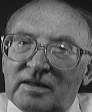

[[ 25.  25.  23. ...  19.  22.  22.]
 [ 25.  27.  24. ...  20.  21.  24.]
 [ 26.  26.  24. ...  21.  20.  23.]
 ...
 [189. 181. 181. ... 184. 188. 188.]
 [190. 186. 182. ... 188. 189. 189.]
 [191. 188. 182. ... 187. 190. 192.]]
Image Before NMF:
-------------------------------Number of image: 241
[[ 56.  55.  55. ...  49.  50.  49.]
 [ 56.  55.  56. ...  49.  49.  49.]
 [ 56.  56.  55. ...  49.  50.  50.]
 ...
 [109. 111. 112. ...  85.  86.  86.]
 [117. 118. 122. ...  88.  88.  87.]
 [121. 129. 132. ...  95.  94.  89.]]


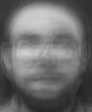

Image after NMF:


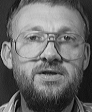

[[ 44.  50.  46. ...  44.  41.  44.]
 [ 51.  46.  48. ...  39.  41.  43.]
 [ 48.  46.  48. ...  38.  37.  42.]
 ...
 [145. 148. 144. ... 106. 102. 104.]
 [151. 167. 100. ... 100. 105. 103.]
 [150. 155. 138. ... 140. 104.  95.]]
Image Before NMF:
-------------------------------Number of image: 242
[[ 96.  94.  94. ... 103. 103. 103.]
 [ 95.  94.  94. ... 104. 104. 103.]
 [ 95.  95.  95. ... 103. 104. 105.]
 ...
 [107. 105. 107. ... 118. 120. 121.]
 [111. 110. 114. ... 121. 120. 120.]
 [115. 118. 122. ... 127. 124. 122.]]


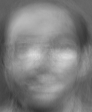

Image after NMF:


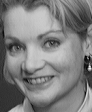

[[ 67.  62.  88. ... 158. 141. 151.]
 [ 66.  57.  75. ... 156. 149. 140.]
 [ 65.  71.  74. ... 150. 155. 142.]
 ...
 [ 51.  47.  50. ... 176. 166. 147.]
 [ 52.  50.  50. ... 170. 161. 140.]
 [ 48.  53.  55. ... 167. 157. 145.]]
Image Before NMF:
-------------------------------Number of image: 243
[[55. 54. 55. ... 55. 54. 55.]
 [55. 54. 55. ... 56. 55. 55.]
 [55. 55. 55. ... 55. 56. 56.]
 ...
 [80. 82. 84. ... 75. 75. 75.]
 [85. 86. 88. ... 77. 77. 76.]
 [88. 93. 94. ... 82. 81. 78.]]


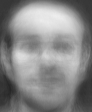

Image after NMF:


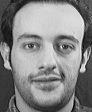

[[ 72.  73.  77. ...  87.  86.  91.]
 [ 73.  71.  69. ...  88.  88.  87.]
 [ 72.  70.  70. ...  84.  88.  90.]
 ...
 [ 54.  55.  49. ...  93.  90.  93.]
 [ 48.  52.  49. ...  87.  90.  88.]
 [ 49.  57.  48. ... 100.  86.  76.]]
Image Before NMF:
-------------------------------Number of image: 244
[[ 34.  34.  34. ...  29.  28.  29.]
 [ 34.  35.  35. ...  29.  29.  29.]
 [ 34.  35.  36. ...  29.  30.  29.]
 ...
 [194. 196. 198. ... 125. 119. 118.]
 [199. 203. 203. ... 131. 129. 125.]
 [200. 208. 209. ... 137. 134. 129.]]


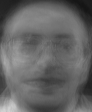

Image after NMF:


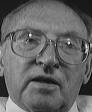

[[ 24.  26.  27. ...  25.  16.  28.]
 [ 27.  26.  27. ...  26.  16.  26.]
 [ 23.  28.  27. ...  26.  20.  25.]
 ...
 [195. 185. 189. ... 173. 176. 175.]
 [192. 184. 188. ... 183. 178. 179.]
 [195. 186. 181. ... 183. 181. 181.]]
Image Before NMF:
-------------------------------Number of image: 245
[[118. 118. 119. ... 117. 116. 116.]
 [118. 119. 119. ... 117. 117. 116.]
 [118. 118. 119. ... 117. 117. 117.]
 ...
 [104. 107. 108. ...  72.  74.  73.]
 [111. 112. 115. ...  74.  74.  75.]
 [114. 116. 118. ...  75.  74.  75.]]


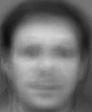

Image after NMF:


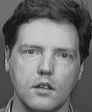

[[110. 111. 114. ... 106. 107. 105.]
 [109. 112. 110. ... 104. 104. 106.]
 [109. 112. 109. ... 101. 106. 102.]
 ...
 [123. 128. 128. ...  70.  69.  68.]
 [139. 126. 125. ...  70.  67.  65.]
 [123. 100. 131. ...  65.  72.  65.]]
Image Before NMF:
-------------------------------Number of image: 246
[[76. 74. 74. ... 90. 90. 91.]
 [75. 74. 73. ... 92. 91. 91.]
 [76. 74. 75. ... 89. 93. 93.]
 ...
 [32. 28. 30. ... 81. 83. 84.]
 [30. 30. 31. ... 82. 81. 82.]
 [34. 32. 35. ... 85. 82. 83.]]


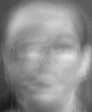

Image after NMF:


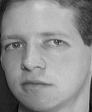

[[63. 53. 35. ... 36. 44. 45.]
 [56. 48. 31. ... 57. 50. 50.]
 [52. 29. 35. ... 54. 55. 61.]
 ...
 [35. 37. 36. ... 44.  9. 25.]
 [36. 35. 37. ... 40.  7. 28.]
 [35. 38. 34. ... 41. 10. 24.]]
Image Before NMF:
-------------------------------Number of image: 247
[[46. 46. 46. ... 50. 49. 51.]
 [46. 46. 45. ... 51. 50. 51.]
 [47. 46. 47. ... 50. 52. 51.]
 ...
 [84. 85. 85. ... 78. 76. 76.]
 [85. 89. 88. ... 83. 80. 78.]
 [88. 91. 91. ... 87. 82. 80.]]


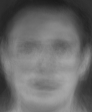

Image after NMF:


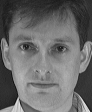

[[ 35.  40.  38. ...  46.  45.  46.]
 [ 39.  40.  38. ...  47.  46.  46.]
 [ 39.  39.  38. ...  47.  48.  44.]
 ...
 [ 46.  86. 131. ...  37.  39.  46.]
 [138. 154. 161. ... 130.  27.  43.]
 [169. 174. 176. ... 222.  55.  34.]]
Image Before NMF:
-------------------------------Number of image: 248
[[129. 130. 130. ... 125. 124. 124.]
 [129. 130. 130. ... 124. 125. 124.]
 [129. 129. 130. ... 125. 124. 124.]
 ...
 [149. 152. 154. ...  89.  88.  88.]
 [156. 157. 161. ...  91.  91.  92.]
 [159. 161. 164. ...  90.  90.  91.]]


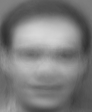

Image after NMF:


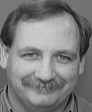

[[118. 119. 122. ... 111. 115. 112.]
 [119. 120. 121. ... 112. 115. 112.]
 [122. 120. 123. ... 113. 114. 114.]
 ...
 [129. 135.  92. ...  97.  98. 102.]
 [132. 137.  91. ...  97. 101. 100.]
 [128. 139.  95. ...  97. 102. 101.]]
Image Before NMF:
-------------------------------Number of image: 249
[[107. 107. 108. ... 103. 103. 102.]
 [107. 108. 108. ... 103. 103. 102.]
 [108. 108. 107. ... 103. 103. 103.]
 ...
 [ 73.  72.  74. ...  45.  45.  45.]
 [ 76.  74.  78. ...  43.  45.  46.]
 [ 77.  78.  80. ...  44.  46.  46.]]


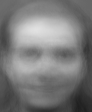

Image after NMF:


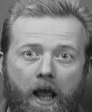

[[108. 107. 106. ... 111. 109. 106.]
 [108. 110. 109. ... 107. 108. 103.]
 [107. 111. 106. ... 102. 108. 107.]
 ...
 [111. 104. 102. ...  35.  44.  45.]
 [105. 105.  96. ...  44.  36.  44.]
 [104. 106.  94. ...  43.  43.  40.]]
Image Before NMF:
-------------------------------Number of image: 250
[[118. 117. 117. ... 112. 112. 112.]
 [117. 117. 116. ... 111. 110. 111.]
 [117. 117. 117. ... 111. 111. 110.]
 ...
 [ 20.  19.  20. ...  17.  19.  19.]
 [ 21.  19.  22. ...  15.  17.  19.]
 [ 22.  19.  22. ...  13.  15.  17.]]


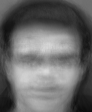

Image after NMF:


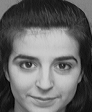

[[135. 133. 136. ... 129. 131. 129.]
 [135. 139. 132. ... 131. 133. 129.]
 [137. 134. 137. ... 131. 131. 130.]
 ...
 [ 26.  23.  29. ...  14.  21.  17.]
 [ 31.  20.  30. ...  17.  20.  17.]
 [ 29.  21.  27. ...  18.  21.  24.]]
Image Before NMF:
-------------------------------Number of image: 251
[[112. 113. 113. ... 111. 111. 111.]
 [113. 113. 113. ... 111. 111. 111.]
 [113. 113. 113. ... 111. 111. 111.]
 ...
 [114. 117. 118. ...  80.  81.  81.]
 [121. 122. 126. ...  82.  81.  83.]
 [126. 128. 130. ...  82.  81.  82.]]


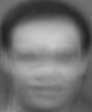

Image after NMF:


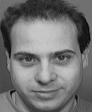

[[114. 110. 112. ... 113. 108. 112.]
 [112. 109. 110. ... 112. 109. 112.]
 [113. 109. 111. ... 110. 112. 110.]
 ...
 [136. 136. 136. ...  90.  89.  91.]
 [137. 137. 139. ...  94.  87.  91.]
 [138. 135. 139. ...  93.  89.  86.]]
Image Before NMF:
-------------------------------Number of image: 252
[[97. 98. 98. ... 94. 93. 93.]
 [97. 99. 98. ... 94. 93. 93.]
 [98. 98. 98. ... 93. 93. 93.]
 ...
 [52. 51. 52. ... 33. 31. 32.]
 [53. 52. 55. ... 31. 32. 32.]
 [55. 55. 56. ... 32. 33. 33.]]


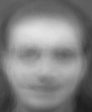

Image after NMF:


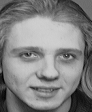

[[106. 105. 106. ... 109. 108. 113.]
 [107. 108. 106. ... 113. 105. 110.]
 [109. 109. 106. ... 107. 112. 106.]
 ...
 [ 31.  37.  39. ...  29.  34.  36.]
 [ 27.  36.  39. ...  31.  36.  36.]
 [ 23.  40.  33. ...  32.  31.  28.]]
Image Before NMF:
-------------------------------Number of image: 253
[[91. 91. 92. ... 92. 92. 92.]
 [91. 92. 91. ... 93. 92. 92.]
 [92. 91. 92. ... 92. 92. 92.]
 ...
 [25. 22. 24. ... 29. 28. 29.]
 [24. 23. 25. ... 27. 28. 28.]
 [26. 25. 26. ... 28. 29. 29.]]


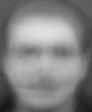

Image after NMF:


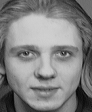

[[104. 101. 105. ... 113. 107. 109.]
 [104. 103. 105. ... 108. 115. 109.]
 [102. 102. 107. ... 109. 112. 109.]
 ...
 [ 41.  35.  56. ...  35.  48.  38.]
 [ 49.  41.  43. ...  37.  31.  43.]
 [ 39.  38.  55. ...  49.  43.  36.]]
Image Before NMF:
-------------------------------Number of image: 254
[[63. 63. 64. ... 62. 61. 62.]
 [63. 64. 63. ... 63. 62. 62.]
 [64. 63. 64. ... 62. 63. 62.]
 ...
 [74. 76. 77. ... 56. 55. 54.]
 [77. 80. 80. ... 59. 57. 56.]
 [80. 82. 82. ... 60. 58. 57.]]


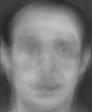

Image after NMF:


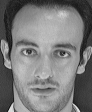

[[61. 62. 64. ... 59. 66. 63.]
 [59. 63. 61. ... 66. 67. 64.]
 [60. 63. 63. ... 64. 61. 69.]
 ...
 [55. 54. 53. ... 56. 56. 60.]
 [55. 55. 54. ... 56. 54. 60.]
 [54. 49. 55. ... 51. 55. 53.]]
Image Before NMF:
-------------------------------Number of image: 255
[[ 90.  91.  91. ...  86.  85.  85.]
 [ 91.  91.  90. ...  86.  86.  86.]
 [ 91.  91.  91. ...  85.  87.  86.]
 ...
 [157. 156. 159. ... 102.  96.  95.]
 [157. 158. 159. ... 104. 103. 101.]
 [156. 159. 161. ... 105. 105. 104.]]


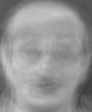

Image after NMF:


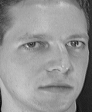

[[ 60.  60.  62. ...  40.  53.  46.]
 [ 58.  73.  54. ...  34.  50.  51.]
 [ 68.  77.  80. ...  36.  50.  49.]
 ...
 [ 24. 143. 160. ...  34.  33.  33.]
 [ 18. 136. 161. ...  36.  36.  31.]
 [  9. 111. 168. ...  32.  34.  34.]]
Image Before NMF:
-------------------------------Number of image: 256
[[142. 141. 142. ... 136. 137. 136.]
 [142. 142. 141. ... 136. 136. 136.]
 [142. 142. 141. ... 136. 136. 136.]
 ...
 [113. 112. 114. ...  77.  78.  78.]
 [116. 114. 119. ...  78.  79.  80.]
 [117. 118. 122. ...  78.  78.  79.]]


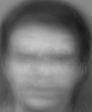

Image after NMF:


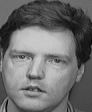

[[114. 112. 110. ... 107. 105. 103.]
 [109. 115. 113. ... 107. 104. 107.]
 [110. 112. 111. ... 109. 104. 104.]
 ...
 [136. 155.  95. ...  69.  70.  72.]
 [144. 140. 106. ...  70.  70.  68.]
 [148. 129. 107. ...  67.  70.  68.]]
Image Before NMF:
-------------------------------Number of image: 257
[[65. 64. 65. ... 63. 63. 64.]
 [65. 65. 64. ... 64. 63. 64.]
 [65. 65. 65. ... 63. 65. 64.]
 ...
 [82. 83. 83. ... 67. 67. 66.]
 [84. 86. 86. ... 71. 69. 68.]
 [86. 88. 89. ... 73. 70. 69.]]


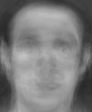

Image after NMF:


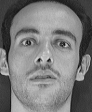

[[63. 54. 58. ... 61. 61. 59.]
 [59. 59. 59. ... 59. 61. 61.]
 [59. 58. 57. ... 60. 65. 63.]
 ...
 [54. 57. 52. ... 64. 61. 65.]
 [59. 52. 54. ... 68. 61. 62.]
 [52. 54. 54. ... 63. 63. 64.]]
Image Before NMF:
-------------------------------Number of image: 258
[[35. 35. 35. ... 45. 45. 46.]
 [34. 35. 34. ... 47. 46. 46.]
 [36. 34. 35. ... 45. 47. 47.]
 ...
 [37. 38. 39. ... 61. 62. 63.]
 [39. 42. 41. ... 64. 62. 62.]
 [43. 44. 44. ... 67. 63. 63.]]


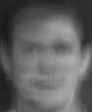

Image after NMF:


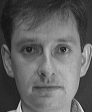

[[35. 36. 37. ... 46. 46. 46.]
 [37. 36. 38. ... 48. 50. 47.]
 [38. 36. 38. ... 47. 48. 50.]
 ...
 [39. 40. 43. ... 61. 58. 62.]
 [42. 39. 40. ... 56. 57. 54.]
 [39. 37. 41. ... 59. 57. 58.]]
Image Before NMF:
-------------------------------Number of image: 259
[[101. 101. 101. ...  97.  96.  96.]
 [101. 101. 101. ...  96.  96.  96.]
 [101. 101. 101. ...  96.  96.  96.]
 ...
 [ 73.  72.  74. ...  51.  50.  51.]
 [ 76.  74.  79. ...  49.  51.  51.]
 [ 78.  80.  82. ...  51.  53.  52.]]


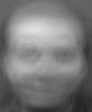

Image after NMF:


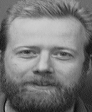

[[109. 105. 112. ... 109. 107. 108.]
 [106. 113. 105. ... 107. 107. 107.]
 [105. 111. 108. ... 108. 107. 104.]
 ...
 [101.  92.  95. ...  48.  48.  44.]
 [ 99.  91.  97. ...  56.  49.  44.]
 [101.  88.  90. ...  55.  50.  51.]]
Image Before NMF:
-------------------------------Number of image: 260
[[ 80.  80.  80. ...  85.  85.  85.]
 [ 80.  79.  80. ...  86.  86.  86.]
 [ 80.  80.  80. ...  85.  86.  86.]
 ...
 [154. 155. 158. ... 129. 128. 128.]
 [159. 161. 163. ... 133. 132. 131.]
 [162. 167. 169. ... 138. 134. 133.]]


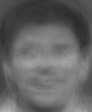

Image after NMF:


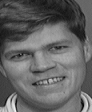

[[ 40.  42.  53. ... 104. 102. 102.]
 [ 50.  65.  61. ... 104. 104. 103.]
 [ 64.  62.  67. ... 104. 104. 102.]
 ...
 [168. 179. 176. ... 169. 189. 193.]
 [193. 173. 180. ... 185. 193. 190.]
 [188. 157. 188. ... 190. 195. 182.]]
Image Before NMF:
-------------------------------Number of image: 261
[[127. 127. 127. ... 125. 125. 125.]
 [127. 127. 127. ... 125. 125. 125.]
 [127. 127. 127. ... 125. 125. 125.]
 ...
 [116. 115. 117. ...  86.  86.  87.]
 [120. 120. 125. ...  88.  87.  88.]
 [124. 125. 128. ...  89.  89.  88.]]


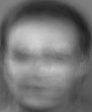

Image after NMF:


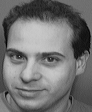

[[112. 109. 116. ... 110. 112. 110.]
 [112. 112. 113. ... 114. 110. 113.]
 [111. 111. 113. ... 113. 110. 110.]
 ...
 [139. 141. 136. ...  93.  87.  93.]
 [138. 137. 139. ...  94.  90.  94.]
 [136. 136. 139. ...  93.  88.  92.]]
Image Before NMF:
-------------------------------Number of image: 262
[[129. 129. 129. ... 131. 131. 130.]
 [129. 129. 129. ... 131. 132. 131.]
 [129. 129. 129. ... 131. 131. 131.]
 ...
 [ 94.  91.  94. ...  74.  73.  73.]
 [ 94.  92.  95. ...  73.  74.  75.]
 [ 94.  92.  96. ...  73.  74.  75.]]


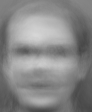

Image after NMF:


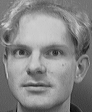

[[117. 120. 122. ... 115. 114. 115.]
 [123. 118. 124. ... 115. 114. 113.]
 [121. 122. 122. ... 113. 114. 115.]
 ...
 [ 89.  86.  94. ...  63.  67.  64.]
 [ 93.  89.  88. ...  64.  64.  61.]
 [ 83.  89.  85. ...  66.  59.  65.]]
Image Before NMF:
-------------------------------Number of image: 263
[[ 93.  94.  93. ...  91.  91.  91.]
 [ 93.  94.  93. ...  91.  91.  91.]
 [ 94.  94.  94. ...  91.  91.  91.]
 ...
 [156. 156. 157. ... 102.  98.  98.]
 [158. 160. 162. ... 106. 104. 103.]
 [159. 162. 164. ... 107. 105. 104.]]


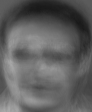

Image after NMF:


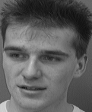

[[112. 109. 112. ... 103. 103. 101.]
 [111. 112. 111. ... 102. 101. 101.]
 [112. 111. 113. ... 103. 102. 105.]
 ...
 [204. 207. 204. ...  64.  61.  62.]
 [205. 205. 205. ...  63.  62.  62.]
 [203. 204. 209. ...  61.  62.  62.]]
Image Before NMF:
-------------------------------Number of image: 264
[[ 42.  42.  42. ...  38.  38.  38.]
 [ 42.  42.  42. ...  38.  38.  38.]
 [ 43.  43.  43. ...  38.  39.  38.]
 ...
 [126. 127. 129. ...  93.  90.  90.]
 [131. 134. 135. ...  97.  95.  92.]
 [134. 141. 142. ... 103. 101.  96.]]


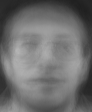

Image after NMF:


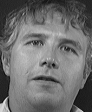

[[ 39.  41.  37. ...  36.  37.  37.]
 [ 38.  36.  40. ...  41.  35.  40.]
 [ 37.  43.  35. ...  35.  37.  36.]
 ...
 [209. 210. 211. ...  30.  34.  39.]
 [209. 213. 204. ...  34.  31.  36.]
 [209. 213. 195. ...  33.  33.  40.]]
Image Before NMF:
-------------------------------Number of image: 265
[[109. 109. 110. ... 109. 109. 108.]
 [109. 109. 109. ... 109. 109. 109.]
 [109. 109. 109. ... 109. 109. 109.]
 ...
 [ 99. 101. 103. ...  72.  74.  73.]
 [105. 105. 108. ...  73.  73.  75.]
 [108. 110. 112. ...  73.  73.  74.]]


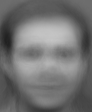

Image after NMF:


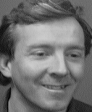

[[100.  99. 108. ... 109. 110. 111.]
 [104. 100. 105. ... 112. 106. 109.]
 [100. 102. 100. ... 110. 107. 110.]
 ...
 [ 78.  84.  80. ...  42.  47.  47.]
 [ 74.  83.  74. ...  43.  45.  44.]
 [ 79.  78.  76. ...  44.  42.  44.]]
Image Before NMF:
-------------------------------Number of image: 266
[[127. 127. 127. ... 129. 129. 129.]
 [127. 127. 126. ... 129. 129. 129.]
 [128. 127. 127. ... 128. 129. 129.]
 ...
 [ 79.  77.  80. ...  69.  69.  70.]
 [ 80.  78.  82. ...  68.  69.  70.]
 [ 82.  80.  84. ...  67.  68.  70.]]


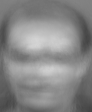

Image after NMF:


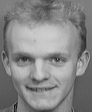

[[126. 127. 126. ... 125. 126. 125.]
 [126. 129. 126. ... 125. 127. 125.]
 [128. 124. 129. ... 124. 126. 124.]
 ...
 [ 86.  89.  91. ...  87.  87.  86.]
 [101.  98.  97. ...  86.  86.  86.]
 [100.  98.  99. ...  87.  85.  89.]]
Image Before NMF:
-------------------------------Number of image: 267
[[105. 105. 105. ... 105. 104. 104.]
 [105. 106. 105. ... 105. 105. 104.]
 [106. 105. 105. ... 104. 104. 105.]
 ...
 [ 30.  26.  28. ...  27.  26.  27.]
 [ 28.  25.  28. ...  24.  26.  26.]
 [ 28.  26.  29. ...  24.  26.  27.]]


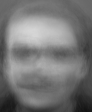

Image after NMF:


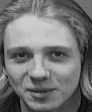

[[107. 108. 107. ... 107. 114. 106.]
 [112. 107. 110. ... 111. 111. 110.]
 [112. 102. 109. ... 112. 113. 110.]
 ...
 [ 39.  35.  37. ...  35.  34.  23.]
 [ 40.  48.  38. ...  42.  36.  40.]
 [ 54.  40.  35. ...  28.  39.  43.]]
Image Before NMF:
-------------------------------Number of image: 268
[[112. 113. 112. ... 109. 109. 109.]
 [112. 113. 112. ... 109. 110. 109.]
 [113. 113. 113. ... 109. 110. 110.]
 ...
 [132. 130. 132. ...  88.  86.  86.]
 [133. 133. 137. ...  90.  90.  89.]
 [134. 136. 139. ...  92.  91.  90.]]


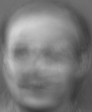

Image after NMF:


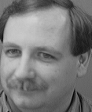

[[123. 124. 122. ... 118. 121. 116.]
 [124. 122. 122. ... 118. 121. 119.]
 [125. 124. 122. ... 118. 122. 114.]
 ...
 [144. 106.  69. ...  75.  70. 107.]
 [143. 100.  67. ...  74.  68. 103.]
 [140.  96.  67. ...  69.  71. 101.]]
Image Before NMF:
-------------------------------Number of image: 269
[[128. 128. 128. ... 123. 123. 122.]
 [128. 129. 128. ... 123. 123. 123.]
 [128. 129. 128. ... 123. 123. 122.]
 ...
 [139. 137. 141. ...  84.  81.  81.]
 [140. 138. 142. ...  83.  85.  85.]
 [139. 139. 143. ...  81.  84.  86.]]


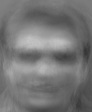

Image after NMF:


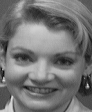

[[ 86.  90.  87. ...  84.  85.  87.]
 [ 93.  86.  87. ...  88.  84.  88.]
 [ 89.  86.  88. ...  88.  84.  87.]
 ...
 [ 97. 103. 126. ... 109.  94.  81.]
 [177. 182. 191. ... 135. 127. 133.]
 [203. 203. 203. ... 153. 142. 139.]]
Image Before NMF:
-------------------------------Number of image: 270
[[127. 127. 127. ... 129. 129. 129.]
 [127. 127. 126. ... 130. 130. 129.]
 [128. 127. 127. ... 129. 130. 130.]
 ...
 [ 87.  84.  86. ...  75.  76.  76.]
 [ 87.  85.  89. ...  75.  76.  77.]
 [ 89.  87.  91. ...  76.  75.  77.]]


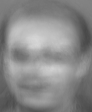

Image after NMF:


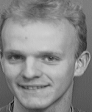

[[128. 128. 128. ... 124. 124. 124.]
 [128. 127. 126. ... 125. 125. 126.]
 [128. 128. 125. ... 126. 125. 128.]
 ...
 [112.  91.  92. ...  84.  88.  86.]
 [102.  83.  91. ...  85.  84.  87.]
 [ 89.  90.  86. ...  87.  83.  86.]]
Image Before NMF:
-------------------------------Number of image: 271
[[134. 134. 134. ... 131. 131. 130.]
 [134. 134. 134. ... 130. 130. 130.]
 [134. 134. 134. ... 130. 130. 130.]
 ...
 [ 78.  77.  80. ...  49.  49.  49.]
 [ 80.  77.  81. ...  46.  48.  51.]
 [ 80.  78.  81. ...  43.  46.  49.]]


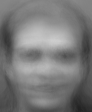

Image after NMF:


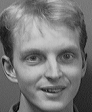

[[125. 119. 124. ... 122. 120. 116.]
 [121. 124. 118. ... 119. 120. 120.]
 [122. 125. 122. ... 121. 118. 121.]
 ...
 [ 85.  93.  82. ...  48.  35.  43.]
 [ 87.  92.  85. ...  40.  39.  35.]
 [ 79.  93.  89. ...  36.  39.  40.]]
Image Before NMF:
-------------------------------Number of image: 272
[[107. 107. 108. ... 105. 105. 105.]
 [107. 107. 108. ... 105. 105. 105.]
 [108. 107. 107. ... 105. 105. 105.]
 ...
 [ 76.  76.  78. ...  60.  62.  62.]
 [ 81.  80.  85. ...  59.  61.  62.]
 [ 85.  87.  90. ...  62.  63.  62.]]


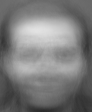

Image after NMF:


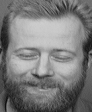

[[111. 111. 108. ... 111. 112. 111.]
 [109. 110. 110. ... 111. 109. 110.]
 [110. 108. 112. ... 109. 108. 113.]
 ...
 [110. 104.  94. ...  58.  64.  66.]
 [108. 101.  98. ...  62.  59.  61.]
 [107. 105. 105. ...  66.  64.  59.]]
Image Before NMF:
-------------------------------Number of image: 273
[[ 45.  44.  45. ...  40.  40.  40.]
 [ 45.  45.  45. ...  41.  40.  40.]
 [ 46.  46.  45. ...  40.  41.  41.]
 ...
 [ 94.  94.  95. ...  74.  72.  73.]
 [ 98. 100. 102. ...  78.  76.  73.]
 [101. 107. 108. ...  85.  82.  77.]]


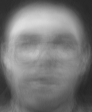

Image after NMF:


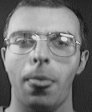

[[ 48.  44.  49. ...  38.  38.  34.]
 [ 50.  47.  51. ...  42.  38.  35.]
 [ 46.  50.  54. ...  40.  39.  39.]
 ...
 [131. 130. 112. ...  38.  41.  40.]
 [130. 133. 113. ...  37.  41.  37.]
 [136. 135. 126. ...  41.  45.  35.]]
Image Before NMF:
-------------------------------Number of image: 274
[[109. 109. 110. ... 103. 103. 103.]
 [109. 110. 109. ... 103. 103. 103.]
 [109. 110. 110. ... 103. 103. 103.]
 ...
 [156. 159. 160. ...  92.  90.  89.]
 [161. 163. 165. ...  95.  94.  94.]
 [162. 165. 168. ...  94.  94.  95.]]


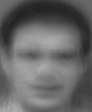

Image after NMF:


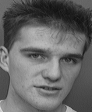

[[110. 108. 109. ... 100.  98. 104.]
 [110. 110. 110. ... 102.  99. 102.]
 [110. 108. 108. ... 102. 100. 102.]
 ...
 [212. 193. 150. ...  65.  66.  64.]
 [199. 215. 163. ...  66.  63.  67.]
 [200. 206. 206. ...  66.  64.  63.]]
Image Before NMF:
-------------------------------Number of image: 275
[[ 77.  78.  78. ...  77.  77.  77.]
 [ 78.  78.  78. ...  78.  78.  78.]
 [ 79.  78.  79. ...  78.  78.  78.]
 ...
 [141. 143. 144. ...  98.  97.  97.]
 [147. 151. 153. ... 103. 101. 100.]
 [152. 157. 158. ... 106. 104. 102.]]


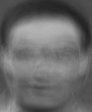

Image after NMF:


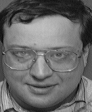

[[ 99. 103.  98. ...  92.  92.  92.]
 [100. 102. 101. ...  93.  92.  90.]
 [101. 102. 102. ...  92.  92.  90.]
 ...
 [104. 154. 139. ... 143. 148. 157.]
 [101. 147. 154. ... 155. 139. 149.]
 [104. 148. 160. ... 162. 122. 122.]]
Image Before NMF:
-------------------------------Number of image: 276
[[ 89.  89.  89. ...  95.  95.  95.]
 [ 90.  89.  90. ...  95.  95.  95.]
 [ 89.  89.  90. ...  95.  96.  96.]
 ...
 [104. 106. 107. ...  96.  97.  97.]
 [109. 110. 112. ...  99.  98.  98.]
 [111. 115. 117. ... 102.  99.  99.]]


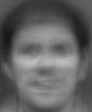

Image after NMF:


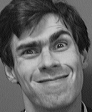

[[115. 118. 117. ... 117. 114. 116.]
 [114. 116. 117. ... 113. 119. 113.]
 [118. 114. 117. ... 115. 116. 112.]
 ...
 [ 98. 102. 100. ...  25.  23.  25.]
 [ 99.  98.  98. ...  21.  26.  21.]
 [101. 100.  95. ...  22.  25.  28.]]
Image Before NMF:
-------------------------------Number of image: 277
[[100. 100. 101. ... 108. 107. 108.]
 [100. 100. 100. ... 109. 108. 108.]
 [101. 100. 101. ... 108. 109. 109.]
 ...
 [ 87.  89.  90. ...  81.  83.  83.]
 [ 92.  94.  96. ...  83.  82.  84.]
 [ 97.  98.  99. ...  84.  82.  83.]]


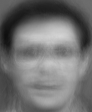

Image after NMF:


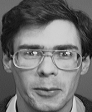

[[109. 107. 110. ... 106. 108. 105.]
 [108. 110. 108. ... 106. 107. 108.]
 [109. 109. 108. ... 106. 108. 108.]
 ...
 [ 38.  51.  43. ...  37.  42.  35.]
 [ 47.  49.  33. ...  38.  40.  31.]
 [ 47.  40.  44. ...  42.  40.  35.]]
Image Before NMF:
-------------------------------Number of image: 278
[[112. 112. 113. ... 106. 106. 106.]
 [112. 113. 112. ... 106. 105. 106.]
 [113. 113. 113. ... 106. 106. 105.]
 ...
 [127. 130. 132. ...  76.  77.  76.]
 [135. 136. 140. ...  77.  78.  79.]
 [138. 141. 143. ...  76.  77.  78.]]


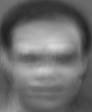

Image after NMF:


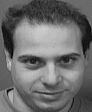

[[105. 102. 106. ... 105. 105. 107.]
 [105. 105. 104. ... 106. 107. 108.]
 [100. 105. 104. ... 108. 106. 101.]
 ...
 [140. 139. 140. ...  66.  65.  65.]
 [144. 138. 142. ...  70.  70.  67.]
 [144. 141. 137. ...  72.  62.  75.]]
Image Before NMF:
-------------------------------Number of image: 279
[[ 46.  45.  46. ...  41.  42.  41.]
 [ 46.  45.  46. ...  42.  42.  41.]
 [ 46.  46.  46. ...  41.  42.  42.]
 ...
 [ 90.  90.  92. ...  73.  73.  73.]
 [ 95.  95.  99. ...  75.  75.  73.]
 [ 98. 105. 106. ...  82.  81.  76.]]


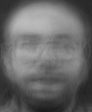

Image after NMF:


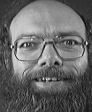

[[47. 50. 52. ... 48. 45. 48.]
 [49. 52. 51. ... 45. 46. 42.]
 [51. 50. 48. ... 44. 46. 47.]
 ...
 [70. 63. 68. ... 44. 39. 45.]
 [69. 62. 68. ... 37. 42. 37.]
 [69. 66. 62. ... 33. 45. 36.]]
Image Before NMF:
-------------------------------Number of image: 280
[[ 38.  37.  37. ...  34.  35.  34.]
 [ 37.  37.  38. ...  35.  35.  35.]
 [ 38.  38.  38. ...  35.  35.  35.]
 ...
 [103. 104. 105. ...  91.  90.  91.]
 [109. 111. 114. ...  95.  94.  91.]
 [114. 123. 124. ... 104. 103.  95.]]


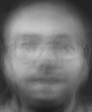

Image after NMF:


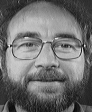

[[ 48.  48.  55. ...  44.  46.  47.]
 [ 51.  47.  54. ...  48.  47.  47.]
 [ 49.  56.  50. ...  48.  46.  48.]
 ...
 [107.  96.  59. ...  94.  94. 108.]
 [110.  89.  59. ...  90.  98. 104.]
 [110.  79. 116. ...  88.  93.  99.]]
Image Before NMF:
-------------------------------Number of image: 281
[[73. 72. 73. ... 78. 78. 79.]
 [73. 72. 73. ... 79. 79. 79.]
 [73. 72. 73. ... 79. 79. 79.]
 ...
 [51. 51. 54. ... 67. 67. 68.]
 [53. 52. 54. ... 65. 67. 67.]
 [56. 58. 59. ... 69. 70. 69.]]


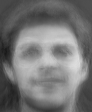

Image after NMF:


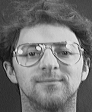

[[67. 64. 67. ... 69. 69. 77.]
 [70. 66. 69. ... 67. 73. 71.]
 [67. 66. 62. ... 71. 71. 71.]
 ...
 [48. 46. 50. ... 65. 72. 82.]
 [50. 50. 49. ... 72. 67. 71.]
 [49. 48. 52. ... 73. 69. 72.]]
Image Before NMF:
-------------------------------Number of image: 282
[[86. 86. 86. ... 91. 90. 91.]
 [86. 86. 86. ... 91. 91. 91.]
 [87. 86. 86. ... 91. 92. 92.]
 ...
 [78. 77. 78. ... 78. 78. 79.]
 [81. 82. 85. ... 82. 80. 79.]
 [86. 88. 89. ... 86. 83. 81.]]


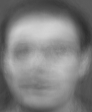

Image after NMF:


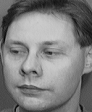

[[121. 123. 121. ... 113. 118. 118.]
 [120. 123. 123. ... 115. 116. 116.]
 [116. 121. 120. ... 118. 112. 115.]
 ...
 [ 76.  68.  75. ...  82.  78.  81.]
 [ 77.  77.  91. ...  81.  78.  86.]
 [ 85.  97. 105. ...  88.  83.  78.]]
Image Before NMF:
-------------------------------Number of image: 283
[[ 96.  95.  95. ... 105. 105. 105.]
 [ 95.  95.  95. ... 106. 106. 106.]
 [ 96.  95.  95. ... 105. 106. 107.]
 ...
 [ 73.  70.  72. ...  94.  96.  97.]
 [ 74.  73.  76. ...  96.  95.  95.]
 [ 77.  78.  81. ... 101.  98.  97.]]


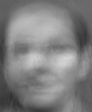

Image after NMF:


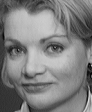

[[ 91.  83.  70. ... 162. 161. 157.]
 [ 82.  81.  72. ... 148. 165. 162.]
 [ 86.  74.  70. ... 138. 164. 168.]
 ...
 [ 54.  50.  52. ... 156. 181. 193.]
 [ 52.  51.  51. ... 165. 186. 195.]
 [ 48.  56.  45. ... 171. 188. 190.]]
Image Before NMF:
-------------------------------Number of image: 284
[[100. 100. 100. ...  99.  99.  99.]
 [100. 100. 100. ...  99.  99.  99.]
 [100. 100. 100. ...  99.  99.  99.]
 ...
 [113. 113. 115. ...  82.  82.  82.]
 [116. 116. 119. ...  84.  84.  84.]
 [118. 120. 123. ...  85.  85.  85.]]


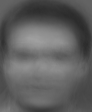

Image after NMF:


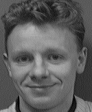

[[ 99.  90.  97. ...  88.  94.  88.]
 [ 99.  94.  96. ...  94.  87.  89.]
 [ 95.  97.  97. ...  89.  89.  91.]
 ...
 [ 84.  97.  97. ... 115. 130. 150.]
 [122. 154. 153. ... 123. 117. 156.]
 [165. 176. 164. ... 135. 113. 158.]]
Image Before NMF:
-------------------------------Number of image: 285
[[89. 89. 89. ... 87. 86. 87.]
 [89. 90. 89. ... 87. 87. 87.]
 [90. 89. 90. ... 87. 87. 87.]
 ...
 [71. 70. 71. ... 58. 56. 56.]
 [72. 74. 75. ... 61. 59. 57.]
 [75. 77. 78. ... 66. 63. 59.]]


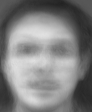

Image after NMF:


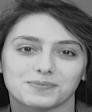

[[117. 113. 118. ... 111. 107. 113.]
 [116. 117. 112. ... 111. 111. 113.]
 [116. 116. 116. ... 112. 109. 111.]
 ...
 [ 54.  51.  60. ...  76.  78.  75.]
 [ 64.  64.  67. ...  76.  79.  82.]
 [ 70.  70.  75. ...  78.  85.  82.]]
Image Before NMF:
-------------------------------Number of image: 286
[[ 98.  99.  99. ...  97.  97.  97.]
 [ 99.  98.  99. ...  97.  98.  97.]
 [ 98.  99.  99. ...  98.  98.  98.]
 ...
 [163. 166. 168. ... 112. 112. 111.]
 [170. 172. 175. ... 116. 115. 116.]
 [173. 177. 180. ... 118. 116. 116.]]


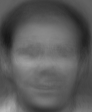

Image after NMF:


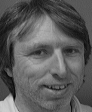

[[ 88.  85.  89. ...  89.  87.  84.]
 [ 87.  88.  84. ...  86.  89.  87.]
 [ 85.  88.  88. ...  85.  90.  83.]
 ...
 [199. 201. 201. ... 116. 120. 114.]
 [199. 200. 202. ... 118. 119. 117.]
 [192. 195. 203. ... 117. 117. 116.]]
Image Before NMF:
-------------------------------Number of image: 287
[[119. 119. 119. ... 120. 119. 119.]
 [119. 119. 119. ... 120. 120. 120.]
 [118. 119. 119. ... 120. 120. 120.]
 ...
 [ 97.  95.  98. ...  71.  70.  69.]
 [ 97.  95.  98. ...  70.  71.  72.]
 [ 97.  96.  99. ...  70.  71.  72.]]


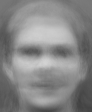

Image after NMF:


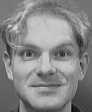

[[122. 120. 121. ... 113. 116. 112.]
 [122. 120. 117. ... 115. 114. 113.]
 [121. 123. 122. ... 112. 118. 114.]
 ...
 [ 92.  85.  89. ...  69.  64.  68.]
 [ 87.  90.  88. ...  62.  67.  59.]
 [ 88.  85.  91. ...  59.  67.  58.]]
Image Before NMF:
-------------------------------Number of image: 288
[[51. 52. 52. ... 44. 43. 43.]
 [51. 53. 52. ... 44. 44. 43.]
 [52. 52. 53. ... 44. 44. 43.]
 ...
 [89. 90. 91. ... 49. 45. 45.]
 [91. 94. 94. ... 51. 50. 47.]
 [93. 97. 97. ... 54. 54. 50.]]


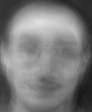

Image after NMF:


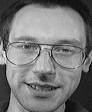

[[39. 46. 42. ... 39. 39. 36.]
 [48. 44. 45. ... 37. 40. 42.]
 [42. 47. 43. ... 37. 38. 47.]
 ...
 [60. 53. 48. ... 20. 28. 26.]
 [65. 45. 48. ... 19. 24. 27.]
 [52. 55. 54. ... 19. 19. 25.]]
Image Before NMF:
-------------------------------Number of image: 289
[[120. 120. 120. ... 123. 122. 122.]
 [120. 120. 120. ... 123. 123. 123.]
 [119. 119. 120. ... 122. 123. 123.]
 ...
 [ 83.  83.  85. ...  70.  70.  70.]
 [ 85.  84.  86. ...  70.  70.  72.]
 [ 86.  85.  88. ...  69.  69.  71.]]


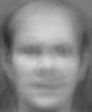

Image after NMF:


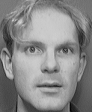

[[120. 120. 120. ... 113. 113. 109.]
 [121. 121. 121. ... 112. 114. 111.]
 [120. 124. 123. ... 112. 114. 114.]
 ...
 [ 94.  85.  82. ...  85.  86.  85.]
 [ 94.  93.  82. ...  82.  83.  84.]
 [ 94.  93.  86. ...  82.  87.  79.]]
Image Before NMF:
-------------------------------Number of image: 290
[[ 67.  67.  67. ...  66.  66.  66.]
 [ 67.  68.  66. ...  67.  66.  67.]
 [ 68.  67.  68. ...  66.  68.  67.]
 ...
 [ 97.  97.  98. ...  75.  73.  73.]
 [ 99. 101. 101. ...  79.  77.  75.]
 [101. 103. 104. ...  82.  79.  77.]]


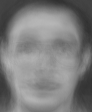

Image after NMF:


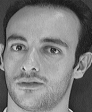

[[63. 60. 63. ... 62. 61. 66.]
 [58. 60. 65. ... 68. 61. 63.]
 [61. 61. 60. ... 62. 65. 57.]
 ...
 [60. 51. 60. ... 63. 62. 68.]
 [52. 50. 46. ... 64. 64. 61.]
 [55. 50. 24. ... 63. 69. 58.]]
Image Before NMF:
-------------------------------Number of image: 291
[[ 61.  60.  60. ...  54.  55.  54.]
 [ 61.  60.  61. ...  54.  55.  54.]
 [ 61.  61.  60. ...  54.  55.  55.]
 ...
 [107. 108. 109. ...  86.  87.  88.]
 [115. 115. 119. ...  90.  90.  88.]
 [118. 126. 129. ...  98.  96.  90.]]


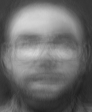

Image after NMF:


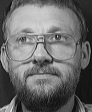

[[ 44.  48.  51. ...  41.  41.  43.]
 [ 46.  50.  45. ...  38.  41.  44.]
 [ 50.  51.  43. ...  36.  42.  41.]
 ...
 [186. 198. 164. ... 106. 113. 111.]
 [174. 149. 144. ... 116. 130. 123.]
 [136. 150. 154. ... 129. 131. 125.]]
Image Before NMF:
-------------------------------Number of image: 292
[[ 66.  65.  65. ...  59.  60.  59.]
 [ 66.  65.  66. ...  60.  60.  59.]
 [ 66.  66.  65. ...  60.  60.  60.]
 ...
 [130. 131. 132. ...  99. 100. 100.]
 [138. 138. 143. ... 103. 103. 101.]
 [142. 150. 153. ... 110. 108. 103.]]


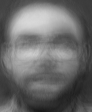

Image after NMF:


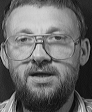

[[ 46.  50.  45. ...  38.  44.  40.]
 [ 49.  45.  51. ...  40.  42.  40.]
 [ 50.  50.  49. ...  42.  43.  40.]
 ...
 [188. 166. 188. ... 137. 128. 153.]
 [148. 152. 220. ... 128. 135. 112.]
 [126. 197. 188. ... 136. 144.  98.]]
Image Before NMF:
-------------------------------Number of image: 293
[[115. 115. 115. ... 117. 116. 116.]
 [115. 115. 115. ... 117. 117. 117.]
 [115. 115. 115. ... 117. 117. 117.]
 ...
 [103. 103. 105. ...  76.  76.  75.]
 [105. 104. 106. ...  75.  76.  78.]
 [105. 105. 108. ...  74.  75.  78.]]


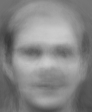

Image after NMF:


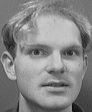

[[122. 120. 125. ... 118. 112. 113.]
 [125. 121. 121. ... 113. 115. 112.]
 [120. 119. 120. ... 117. 112. 115.]
 ...
 [ 89.  86.  88. ...  65.  67.  63.]
 [ 91.  88.  85. ...  67.  66.  62.]
 [ 92.  91.  87. ...  65.  62.  66.]]
Image Before NMF:
-------------------------------Number of image: 294
[[ 49.  49.  50. ...  42.  41.  42.]
 [ 49.  50.  49. ...  42.  42.  42.]
 [ 50.  50.  50. ...  42.  43.  42.]
 ...
 [ 95.  96.  97. ...  56.  52.  51.]
 [ 98. 100. 100. ...  58.  57.  54.]
 [ 99. 103. 103. ...  61.  61.  57.]]


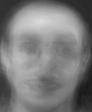

Image after NMF:


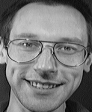

[[52. 42. 42. ... 37. 39. 38.]
 [45. 48. 39. ... 34. 37. 40.]
 [47. 44. 42. ... 35. 41. 39.]
 ...
 [58. 47. 49. ... 27. 19. 25.]
 [59. 44. 55. ... 16. 23. 23.]
 [56. 48. 61. ... 37. 19. 24.]]
Image Before NMF:
-------------------------------Number of image: 295
[[ 39.  38.  39. ...  37.  37.  37.]
 [ 39.  39.  39. ...  38.  37.  37.]
 [ 40.  39.  39. ...  37.  38.  38.]
 ...
 [ 88.  88.  89. ...  82.  80.  81.]
 [ 92.  94.  96. ...  85.  84.  81.]
 [ 96. 104. 105. ...  94.  92.  85.]]


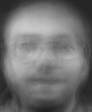

Image after NMF:


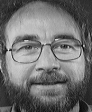

[[ 63.  56.  51. ...  43.  44.  44.]
 [ 54.  56.  49. ...  44.  49.  50.]
 [ 50.  54.  47. ...  47.  47.  44.]
 ...
 [106. 124. 120. ... 110. 126.  88.]
 [ 96. 120. 125. ... 111. 137.  97.]
 [ 86. 117. 124. ... 118. 127. 137.]]
Image Before NMF:
-------------------------------Number of image: 296
[[77. 77. 77. ... 82. 81. 82.]
 [77. 77. 77. ... 82. 82. 82.]
 [77. 77. 77. ... 82. 82. 82.]
 ...
 [55. 54. 56. ... 62. 62. 62.]
 [56. 55. 57. ... 62. 62. 62.]
 [58. 60. 60. ... 65. 65. 64.]]


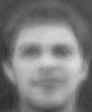

Image after NMF:


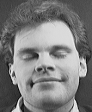

[[62. 64. 64. ... 80. 77. 79.]
 [63. 66. 67. ... 76. 77. 81.]
 [67. 66. 67. ... 77. 77. 84.]
 ...
 [65. 63. 57. ... 49. 51. 58.]
 [60. 56. 46. ... 45. 50. 50.]
 [54. 53. 46. ... 45. 44. 52.]]
Image Before NMF:
-------------------------------Number of image: 297
[[114. 114. 114. ... 111. 111. 111.]
 [114. 115. 114. ... 111. 111. 111.]
 [115. 114. 114. ... 111. 111. 111.]
 ...
 [ 32.  30.  32. ...  25.  25.  26.]
 [ 33.  31.  34. ...  22.  24.  25.]
 [ 34.  33.  35. ...  22.  24.  25.]]


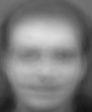

Image after NMF:


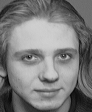

[[100. 105. 103. ... 110. 109. 113.]
 [103. 103. 103. ... 110. 110. 109.]
 [103. 105. 107. ... 111. 110. 109.]
 ...
 [ 59.  54.  44. ...  40.  32.  45.]
 [ 45.  49.  44. ...  34.  36.  44.]
 [ 53.  59.  38. ...  41.  37.  37.]]
Image Before NMF:
-------------------------------Number of image: 298
[[ 32.  32.  32. ...  30.  30.  30.]
 [ 32.  33.  32. ...  31.  30.  30.]
 [ 34.  33.  33. ...  30.  31.  31.]
 ...
 [ 91.  90.  91. ...  73.  69.  70.]
 [ 93.  96.  96. ...  77.  74.  71.]
 [ 96. 102. 102. ...  84.  81.  75.]]


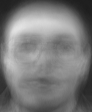

Image after NMF:


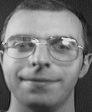

[[51. 41. 56. ... 41. 33. 48.]
 [52. 50. 47. ... 36. 38. 39.]
 [48. 49. 51. ... 37. 41. 33.]
 ...
 [43. 41. 49. ... 38. 46. 47.]
 [73. 61. 65. ... 43. 43. 44.]
 [85. 48. 49. ... 43. 49. 36.]]
Image Before NMF:
-------------------------------Number of image: 299
[[ 96.  96.  97. ...  97.  97.  97.]
 [ 96.  97.  96. ...  97.  97.  97.]
 [ 96.  96.  97. ...  97.  98.  97.]
 ...
 [109. 110. 112. ...  81.  80.  80.]
 [113. 114. 116. ...  82.  82.  83.]
 [115. 116. 118. ...  82.  81.  83.]]


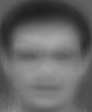

Image after NMF:


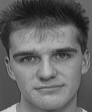

[[108. 108. 106. ... 103. 106. 105.]
 [110. 104. 110. ... 104. 102. 109.]
 [108. 106. 109. ... 103. 105. 104.]
 ...
 [ 77.  79.  74. ...  73.  71.  69.]
 [ 75.  90. 128. ...  70.  71.  70.]
 [132. 176. 193. ...  69.  69.  70.]]
Image Before NMF:
-------------------------------Number of image: 300
[[ 52.  52.  52. ...  50.  50.  50.]
 [ 52.  52.  53. ...  50.  50.  50.]
 [ 53.  53.  53. ...  50.  50.  50.]
 ...
 [130. 131. 132. ...  94.  92.  92.]
 [135. 137. 139. ...  99.  97.  95.]
 [138. 144. 145. ... 105. 102.  98.]]


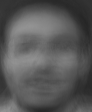

Image after NMF:


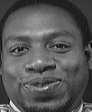

[[ 54.  55.  60. ...  57.  50.  56.]
 [ 54.  57.  59. ...  51.  52.  55.]
 [ 58.  60.  57. ...  54.  55.  57.]
 ...
 [128. 169. 153. ... 113.  71.  78.]
 [ 99. 223. 209. ... 143. 154. 124.]
 [106. 227. 217. ... 156. 181. 217.]]
Image Before NMF:
-------------------------------Number of image: 301
[[ 49.  48.  49. ...  47.  48.  48.]
 [ 49.  49.  49. ...  48.  48.  48.]
 [ 50.  50.  49. ...  48.  48.  49.]
 ...
 [101. 100. 102. ...  94.  94.  95.]
 [106. 107. 111. ...  98.  97.  94.]
 [111. 118. 120. ... 108. 105.  98.]]


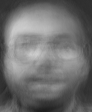

Image after NMF:


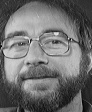

[[ 49.  50.  48. ...  44.  47.  43.]
 [ 50.  50.  55. ...  48.  45.  44.]
 [ 52.  62.  56. ...  47.  47.  48.]
 ...
 [115. 115. 108. ...  58.  70.  68.]
 [117. 121. 120. ...  66.  70.  73.]
 [125. 119. 122. ...  73.  77.  71.]]
Image Before NMF:
-------------------------------Number of image: 302
[[ 92.  93.  93. ...  89.  89.  89.]
 [ 92.  93.  92. ...  89.  89.  89.]
 [ 93.  93.  93. ...  89.  90.  89.]
 ...
 [149. 150. 152. ...  96.  93.  93.]
 [152. 154. 155. ...  99.  98.  97.]
 [153. 155. 157. ...  99.  98.  98.]]


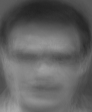

Image after NMF:


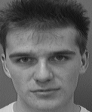

[[110. 110. 112. ... 104. 105. 102.]
 [109. 110. 113. ... 103. 104. 104.]
 [108. 113. 107. ... 105. 105. 103.]
 ...
 [194. 200. 198. ...  68.  66.  64.]
 [203. 202. 199. ...  65.  65.  65.]
 [203. 201. 198. ... 141.  88.  64.]]
Image Before NMF:
-------------------------------Number of image: 303
[[ 51.  51.  52. ...  44.  43.  43.]
 [ 51.  53.  52. ...  44.  43.  43.]
 [ 52.  52.  53. ...  43.  44.  43.]
 ...
 [ 90.  92.  92. ...  50.  47.  47.]
 [ 93.  96.  97. ...  53.  52.  49.]
 [ 95. 100. 100. ...  57.  56.  52.]]


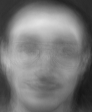

Image after NMF:


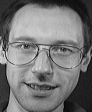

[[41. 49. 45. ... 39. 40. 42.]
 [38. 49. 44. ... 37. 41. 40.]
 [48. 45. 48. ... 42. 37. 40.]
 ...
 [51. 55. 40. ... 24. 24. 24.]
 [53. 53. 27. ... 23. 24. 25.]
 [52. 56. 11. ... 18. 28. 21.]]
Image Before NMF:
-------------------------------Number of image: 304
[[126. 126. 126. ... 133. 132. 133.]
 [126. 125. 126. ... 133. 133. 133.]
 [126. 125. 125. ... 132. 133. 134.]
 ...
 [ 73.  73.  75. ...  74.  76.  77.]
 [ 76.  75.  78. ...  72.  74.  77.]
 [ 79.  77.  81. ...  71.  72.  75.]]


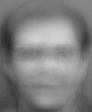

Image after NMF:


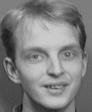

[[131. 125. 126. ... 125. 127. 124.]
 [131. 128. 124. ... 125. 125. 125.]
 [127. 127. 125. ... 122. 125. 127.]
 ...
 [ 99. 100.  99. ...  90.  93.  91.]
 [101.  97.  99. ...  90.  92.  89.]
 [ 98.  94. 103. ...  89.  93.  91.]]
Image Before NMF:
-------------------------------Number of image: 305
[[33. 34. 34. ... 32. 31. 32.]
 [33. 34. 34. ... 32. 32. 32.]
 [35. 34. 35. ... 32. 33. 32.]
 ...
 [82. 81. 82. ... 67. 64. 65.]
 [84. 87. 87. ... 71. 69. 65.]
 [87. 93. 93. ... 78. 75. 69.]]


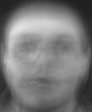

Image after NMF:


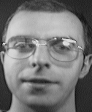

[[ 42.  47.  48. ...  38.  40.  35.]
 [ 45.  40.  45. ...  36.  36.  38.]
 [ 46.  53.  48. ...  42.  36.  38.]
 ...
 [ 59.  50.  46. ...  40.  41.  41.]
 [112.  82.  66. ...  35.  47.  37.]
 [124.  97.  57. ...  34.  43.  45.]]
Image Before NMF:
-------------------------------Number of image: 306
[[ 39.  39.  39. ...  35.  35.  36.]
 [ 39.  39.  39. ...  36.  35.  36.]
 [ 40.  39.  40. ...  36.  36.  36.]
 ...
 [117. 118. 120. ...  91.  88.  88.]
 [122. 124. 126. ...  94.  93.  90.]
 [125. 132. 133. ... 101.  99.  94.]]


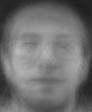

Image after NMF:


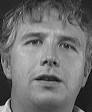

[[ 38.  35.  40. ...  34.  36.  36.]
 [ 37.  41.  37. ...  38.  36.  39.]
 [ 37.  40.  39. ...  34.  38.  36.]
 ...
 [192. 197. 198. ...  36.  34.  36.]
 [184. 193. 204. ...  36.  35.  37.]
 [190. 202. 208. ...  36.  35.  39.]]
Image Before NMF:
-------------------------------Number of image: 307
[[122. 121. 121. ... 120. 120. 121.]
 [121. 121. 120. ... 120. 119. 120.]
 [121. 121. 121. ... 120. 120. 119.]
 ...
 [ 22.  20.  22. ...  30.  32.  33.]
 [ 22.  19.  23. ...  27.  29.  32.]
 [ 23.  20.  23. ...  25.  27.  30.]]


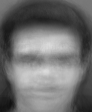

Image after NMF:


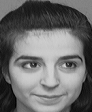

[[133. 135. 135. ... 133. 131. 132.]
 [133. 133. 134. ... 131. 129. 130.]
 [130. 134. 132. ... 129. 131. 129.]
 ...
 [ 26.  20.  32. ...  19.  22.  16.]
 [ 25.  21.  28. ...  18.  18.  16.]
 [ 23.  25.  27. ...  18.  17.  15.]]
Image Before NMF:
-------------------------------Number of image: 308
[[149. 149. 149. ... 144. 144. 144.]
 [150. 149. 149. ... 144. 144. 144.]
 [148. 149. 149. ... 144. 144. 143.]
 ...
 [189. 189. 193. ... 123. 122. 120.]
 [193. 192. 196. ... 124. 126. 127.]
 [192. 194. 198. ... 123. 124. 127.]]


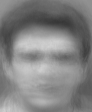

Image after NMF:


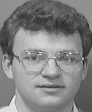

[[143. 144. 142. ... 147. 144. 141.]
 [145. 141. 144. ... 146. 145. 142.]
 [144. 143. 143. ... 147. 143. 144.]
 ...
 [213. 223. 222. ...  83.  78.  75.]
 [223. 222. 221. ...  79.  79.  80.]
 [222. 222. 220. ...  79.  79.  80.]]
Image Before NMF:
-------------------------------Number of image: 309
[[ 85.  85.  85. ...  86.  86.  86.]
 [ 85.  85.  85. ...  86.  86.  86.]
 [ 84.  85.  86. ...  86.  87.  86.]
 ...
 [170. 172. 174. ... 120. 118. 116.]
 [174. 176. 177. ... 124. 122. 122.]
 [175. 179. 181. ... 125. 123. 123.]]


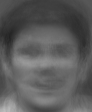

Image after NMF:


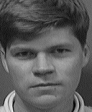

[[ 88.  79.  77. ... 100. 102. 103.]
 [ 80.  69.  86. ... 102. 100. 100.]
 [ 64.  71.  86. ...  99. 104. 101.]
 ...
 [192. 191. 200. ... 144. 140. 133.]
 [194. 199. 200. ... 137. 143. 145.]
 [189. 202. 200. ... 137. 138. 148.]]
Image Before NMF:
-------------------------------Number of image: 310
[[105. 105. 105. ... 106. 105. 105.]
 [106. 105. 106. ... 106. 106. 106.]
 [105. 106. 106. ... 106. 106. 106.]
 ...
 [143. 143. 145. ... 107. 107. 106.]
 [147. 148. 151. ... 111. 110. 110.]
 [149. 152. 156. ... 114. 112. 111.]]


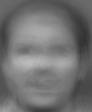

Image after NMF:


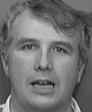

[[120. 119. 121. ... 113. 117. 117.]
 [121. 122. 121. ... 115. 113. 117.]
 [121. 119. 122. ... 115. 117. 117.]
 ...
 [116.  90. 132. ...  77.  76.  78.]
 [101.  92. 153. ...  79.  74.  79.]
 [ 95. 105. 175. ...  74.  74.  80.]]
Image Before NMF:
-------------------------------Number of image: 311
[[ 53.  53.  54. ...  45.  44.  44.]
 [ 53.  53.  55. ...  44.  44.  44.]
 [ 53.  54.  54. ...  45.  44.  44.]
 ...
 [135. 140. 141. ...  87.  86.  86.]
 [146. 150. 152. ...  92.  91.  88.]
 [151. 161. 161. ...  98.  97.  91.]]


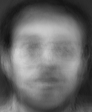

Image after NMF:


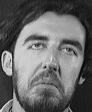

[[ 47.  49.  46. ...  39.  39.  39.]
 [ 45.  45.  51. ...  38.  37.  41.]
 [ 47.  45.  48. ...  42.  33.  46.]
 ...
 [109. 226. 192. ...  29.  34.  31.]
 [220. 220. 145. ...  28.  29.  35.]
 [212. 215. 137. ...  31.  32.  34.]]
Image Before NMF:
-------------------------------Number of image: 312
[[ 96.  97.  97. ...  97.  96.  96.]
 [ 96.  97.  97. ...  97.  97.  97.]
 [ 97.  97.  97. ...  97.  97.  97.]
 ...
 [ 91.  91.  92. ...  66.  65.  65.]
 [ 94.  95.  97. ...  68.  67.  67.]
 [ 97.  98. 100. ...  70.  69.  68.]]


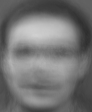

Image after NMF:


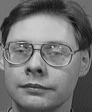

[[112. 115. 120. ... 109. 114. 105.]
 [118. 112. 115. ... 109. 111. 109.]
 [116. 116. 115. ... 109. 111. 112.]
 ...
 [ 96.  98. 100. ...  52.  53.  43.]
 [ 97.  96. 104. ...  54.  50.  54.]
 [107. 110. 109. ...  53.  53.  54.]]
Image Before NMF:
-------------------------------Number of image: 313
[[ 37.  36.  37. ...  36.  36.  37.]
 [ 36.  37.  36. ...  37.  37.  37.]
 [ 37.  37.  37. ...  36.  38.  37.]
 ...
 [ 92.  94.  95. ...  77.  75.  75.]
 [ 96.  99.  99. ...  80.  79.  77.]
 [ 99. 104. 104. ...  85.  83.  80.]]


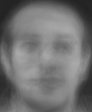

Image after NMF:


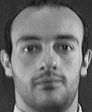

[[46. 45. 49. ... 45. 45. 44.]
 [47. 49. 49. ... 44. 46. 45.]
 [50. 49. 49. ... 42. 47. 47.]
 ...
 [61. 56. 59. ... 59. 55. 58.]
 [57. 57. 56. ... 56. 57. 59.]
 [57. 55. 54. ... 56. 60. 58.]]
Image Before NMF:
-------------------------------Number of image: 314
[[49. 49. 50. ... 53. 52. 53.]
 [49. 50. 50. ... 54. 53. 53.]
 [50. 49. 50. ... 53. 54. 54.]
 ...
 [69. 71. 72. ... 64. 64. 65.]
 [74. 77. 78. ... 66. 65. 64.]
 [79. 83. 83. ... 71. 69. 66.]]


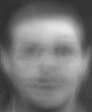

Image after NMF:


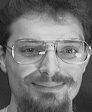

[[ 56.  61.  54. ...  54.  55.  54.]
 [ 53.  61.  56. ...  55.  54.  59.]
 [ 60.  59.  57. ...  59.  54.  60.]
 ...
 [ 72. 105. 134. ...  39.  44.  41.]
 [142. 145. 146. ...  39.  41.  41.]
 [155. 142. 159. ...  40.  43.  45.]]
Image Before NMF:
-------------------------------Number of image: 315
[[ 31.  32.  31. ...  31.  31.  31.]
 [ 31.  32.  32. ...  32.  32.  32.]
 [ 33.  33.  33. ...  31.  33.  32.]
 ...
 [164. 163. 166. ... 118. 111. 111.]
 [165. 169. 168. ... 122. 120. 115.]
 [166. 173. 173. ... 129. 127. 121.]]


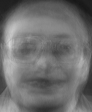

Image after NMF:


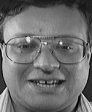

[[ 35.  39.  38. ...  27.  33.  31.]
 [ 38.  37.  38. ...  33.  32.  32.]
 [ 40.  37.  38. ...  34.  33.  34.]
 ...
 [198. 157. 171. ... 211. 163. 190.]
 [185. 155. 188. ... 210. 180. 169.]
 [170. 154. 202. ... 212. 202. 145.]]
Image Before NMF:
-------------------------------Number of image: 316
[[ 31.  30.  30. ...  27.  27.  27.]
 [ 30.  31.  30. ...  28.  28.  28.]
 [ 32.  31.  31. ...  27.  28.  28.]
 ...
 [ 96.  95.  96. ...  77.  73.  73.]
 [ 98. 100. 101. ...  80.  78.  74.]
 [100. 106. 106. ...  87.  85.  79.]]


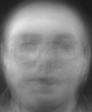

Image after NMF:


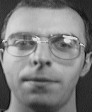

[[50. 49. 49. ... 42. 37. 41.]
 [54. 50. 47. ... 44. 40. 39.]
 [60. 44. 54. ... 43. 40. 41.]
 ...
 [69. 67. 61. ... 42. 40. 43.]
 [81. 50. 44. ... 41. 39. 46.]
 [81. 33. 15. ... 41. 40. 45.]]
Image Before NMF:
-------------------------------Number of image: 317
[[121. 121. 122. ... 125. 124. 124.]
 [121. 121. 121. ... 125. 125. 124.]
 [121. 121. 121. ... 124. 125. 125.]
 ...
 [ 75.  75.  77. ...  63.  64.  64.]
 [ 77.  75.  78. ...  62.  63.  65.]
 [ 78.  77.  79. ...  61.  62.  65.]]


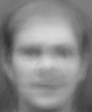

Image after NMF:


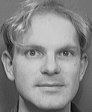

[[119. 118. 119. ... 116. 112. 114.]
 [121. 119. 119. ... 114. 115. 113.]
 [117. 121. 118. ... 114. 115. 110.]
 ...
 [ 92.  88.  87. ...  83.  84.  83.]
 [ 94.  90.  88. ...  83.  82.  84.]
 [ 93.  89.  81. ...  83.  83.  82.]]
Image Before NMF:
-------------------------------Number of image: 318
[[123. 124. 124. ... 125. 124. 124.]
 [124. 124. 124. ... 125. 125. 124.]
 [123. 123. 124. ... 124. 125. 125.]
 ...
 [ 97.  95.  98. ...  73.  71.  71.]
 [ 97.  95.  98. ...  73.  73.  74.]
 [ 96.  96.  99. ...  73.  73.  74.]]


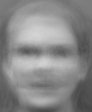

Image after NMF:


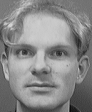

[[121. 120. 122. ... 116. 113. 112.]
 [120. 121. 119. ... 115. 115. 114.]
 [120. 122. 120. ... 115. 114. 115.]
 ...
 [ 87.  94.  94. ...  67.  67.  66.]
 [ 91.  89.  92. ...  64.  65.  67.]
 [ 89.  94.  90. ...  66.  62.  68.]]
Image Before NMF:
-------------------------------Number of image: 319
[[59. 60. 61. ... 52. 51. 51.]
 [59. 61. 60. ... 51. 51. 51.]
 [60. 60. 61. ... 52. 51. 51.]
 ...
 [59. 62. 62. ... 28. 27. 27.]
 [65. 68. 69. ... 30. 29. 28.]
 [68. 73. 72. ... 32. 32. 29.]]


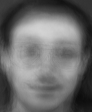

Image after NMF:


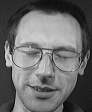

[[38. 46. 38. ... 39. 32. 39.]
 [41. 43. 42. ... 40. 35. 34.]
 [45. 37. 43. ... 39. 35. 42.]
 ...
 [71. 74. 69. ... 26. 27. 16.]
 [71. 77. 68. ... 24. 21. 27.]
 [75. 70. 72. ... 27. 23. 26.]]
Image Before NMF:
-------------------------------Number of image: 320
[[118. 116. 117. ... 118. 118. 119.]
 [117. 117. 116. ... 118. 117. 118.]
 [117. 116. 116. ... 118. 119. 118.]
 ...
 [ 21.  20.  21. ...  35.  39.  39.]
 [ 22.  20.  23. ...  34.  35.  38.]
 [ 24.  21.  23. ...  32.  32.  36.]]


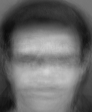

Image after NMF:


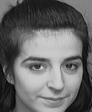

[[134. 138. 136. ... 129. 131. 127.]
 [134. 135. 135. ... 130. 130. 129.]
 [133. 134. 135. ... 127. 132. 133.]
 ...
 [ 25.  19.  21. ...  27.  57.  81.]
 [ 26.  22.  19. ...  30.  71.  81.]
 [ 21.  25.  22. ...  55.  79.  81.]]
Image Before NMF:
-------------------------------Number of image: 321
[[86. 86. 86. ... 84. 83. 83.]
 [86. 86. 86. ... 84. 83. 83.]
 [86. 86. 86. ... 84. 84. 83.]
 ...
 [41. 41. 41. ... 42. 42. 43.]
 [43. 44. 45. ... 45. 44. 42.]
 [45. 48. 49. ... 49. 47. 44.]]


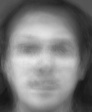

Image after NMF:


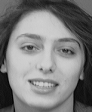

[[117. 112. 115. ... 108. 112. 109.]
 [114. 115. 116. ... 111. 109. 111.]
 [115. 114. 114. ... 110. 111. 109.]
 ...
 [ 46.  53.  59. ...  82.  76.  72.]
 [ 55.  59.  67. ...  80.  78.  76.]
 [ 57.  61.  69. ...  82.  82.  80.]]
Image Before NMF:
-------------------------------Number of image: 322
[[109. 110. 110. ... 107. 106. 106.]
 [109. 110. 110. ... 106. 107. 106.]
 [109. 109. 110. ... 107. 106. 106.]
 ...
 [ 90.  91.  93. ...  55.  55.  55.]
 [ 94.  94.  97. ...  55.  56.  57.]
 [ 96.  98.  99. ...  54.  55.  56.]]


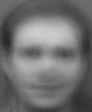

Image after NMF:


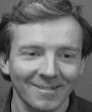

[[103. 105. 104. ... 111. 107. 106.]
 [102. 106. 107. ... 110. 106. 106.]
 [103. 106. 104. ... 111. 108. 107.]
 ...
 [ 80.  82.  85. ...  44.  47.  43.]
 [ 79.  87.  78. ...  48.  41.  44.]
 [ 76.  88.  82. ...  44.  38.  43.]]
Image Before NMF:
-------------------------------Number of image: 323
[[ 88.  89.  90. ...  86.  85.  85.]
 [ 89.  90.  90. ...  86.  86.  86.]
 [ 89.  89.  90. ...  86.  86.  86.]
 ...
 [153. 156. 157. ...  99.  97.  96.]
 [159. 162. 164. ... 103. 102. 100.]
 [161. 166. 168. ... 105. 104. 102.]]


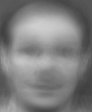

Image after NMF:


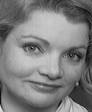

[[ 88.  97.  95. ... 104.  87.  80.]
 [ 94.  95.  96. ... 109. 105.  84.]
 [ 93. 101. 101. ... 109. 105. 104.]
 ...
 [224. 208. 115. ...  71.  64.  62.]
 [222. 215. 180. ...  80.  73.  77.]
 [200. 216. 204. ...  67.  68.  69.]]
Image Before NMF:
-------------------------------Number of image: 324
[[78. 79. 79. ... 74. 73. 73.]
 [78. 80. 79. ... 73. 73. 73.]
 [79. 79. 79. ... 74. 73. 73.]
 ...
 [70. 70. 72. ... 43. 42. 42.]
 [74. 75. 77. ... 43. 44. 43.]
 [76. 79. 80. ... 45. 46. 44.]]


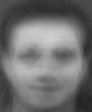

Image after NMF:


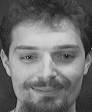

[[53. 52. 61. ... 56. 62. 59.]
 [53. 57. 59. ... 57. 56. 57.]
 [58. 57. 58. ... 61. 57. 57.]
 ...
 [54. 55. 54. ... 38. 44. 40.]
 [62. 51. 53. ... 46. 39. 44.]
 [57. 56. 51. ... 46. 45. 45.]]
Image Before NMF:
-------------------------------Number of image: 325
[[108. 109. 109. ... 107. 107. 107.]
 [108. 109. 109. ... 107. 107. 107.]
 [109. 108. 109. ... 107. 107. 107.]
 ...
 [ 99.  99. 100. ...  65.  64.  64.]
 [102. 103. 105. ...  67.  66.  66.]
 [104. 105. 107. ...  67.  66.  66.]]


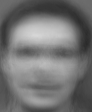

Image after NMF:


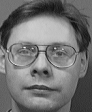

[[115. 113. 113. ... 111. 110. 110.]
 [114. 117. 114. ... 108. 112. 109.]
 [116. 116. 117. ... 106. 113. 112.]
 ...
 [ 99.  96. 101. ...  52.  58.  49.]
 [ 93. 101.  94. ...  52.  51.  57.]
 [ 99.  93. 101. ...  56.  52.  55.]]
Image Before NMF:
-------------------------------Number of image: 326
[[100. 100. 100. ...  99.  99.  98.]
 [100. 100. 100. ...  98.  98.  98.]
 [ 99. 100. 100. ...  99.  99.  98.]
 ...
 [101. 101. 103. ...  69.  68.  67.]
 [103. 102. 104. ...  69.  69.  70.]
 [102. 103. 105. ...  68.  68.  70.]]


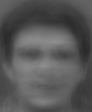

Image after NMF:


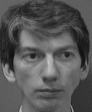

[[101. 100.  99. ...  87.  94.  90.]
 [ 98. 100. 101. ...  92.  94.  92.]
 [103.  97.  97. ...  89.  97.  92.]
 ...
 [ 90.  88.  93. ...  51.  52.  52.]
 [ 93.  89.  93. ...  50.  52.  51.]
 [ 86.  93.  92. ...  49.  52.  52.]]
Image Before NMF:
-------------------------------Number of image: 327
[[51. 52. 52. ... 46. 45. 45.]
 [52. 53. 52. ... 46. 45. 45.]
 [52. 52. 53. ... 45. 46. 45.]
 ...
 [72. 72. 73. ... 45. 41. 41.]
 [73. 75. 75. ... 47. 46. 43.]
 [74. 77. 77. ... 50. 49. 46.]]


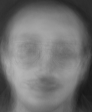

Image after NMF:


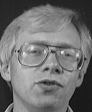

[[34. 35. 35. ... 27. 36. 33.]
 [36. 35. 37. ... 36. 30. 31.]
 [37. 35. 38. ... 32. 35. 31.]
 ...
 [40. 37. 39. ... 29. 27. 28.]
 [37. 38. 44. ... 26. 28. 25.]
 [40. 38. 43. ... 31. 24. 24.]]
Image Before NMF:
-------------------------------Number of image: 328
[[ 28.  29.  29. ...  28.  28.  28.]
 [ 29.  30.  29. ...  28.  29.  29.]
 [ 30.  30.  30. ...  28.  29.  29.]
 ...
 [163. 162. 165. ... 118. 111. 111.]
 [164. 168. 168. ... 123. 120. 115.]
 [166. 173. 174. ... 130. 128. 121.]]


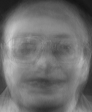

Image after NMF:


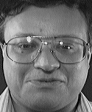

[[ 36.  36.  38. ...  29.  31.  35.]
 [ 37.  40.  35. ...  35.  31.  28.]
 [ 35.  38.  35. ...  33.  33.  25.]
 ...
 [219. 173. 155. ... 213. 166. 188.]
 [210. 162. 163. ... 211. 185. 164.]
 [194. 156. 176. ... 210. 205. 144.]]
Image Before NMF:
-------------------------------Number of image: 329
[[119. 120. 120. ... 113. 113. 112.]
 [119. 120. 120. ... 113. 113. 113.]
 [119. 120. 120. ... 113. 113. 112.]
 ...
 [146. 148. 150. ...  79.  77.  76.]
 [151. 153. 156. ...  81.  81.  81.]
 [153. 155. 157. ...  79.  80.  81.]]


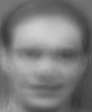

Image after NMF:


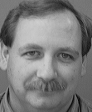

[[122. 123. 122. ... 118. 114. 118.]
 [124. 122. 122. ... 117. 116. 114.]
 [122. 123. 122. ... 116. 115. 115.]
 ...
 [132. 110. 131. ...  98.  92.  93.]
 [128. 116. 137. ...  99.  93.  90.]
 [126. 121. 146. ...  98. 101.  85.]]
Image Before NMF:
-------------------------------Number of image: 330
[[80. 80. 81. ... 85. 85. 85.]
 [80. 80. 81. ... 85. 85. 85.]
 [80. 80. 80. ... 85. 85. 85.]
 ...
 [51. 50. 54. ... 62. 62. 62.]
 [53. 51. 54. ... 59. 61. 62.]
 [54. 56. 58. ... 62. 64. 63.]]


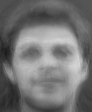

Image after NMF:


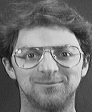

[[68. 68. 69. ... 69. 70. 75.]
 [68. 69. 73. ... 70. 78. 76.]
 [69. 67. 67. ... 73. 73. 75.]
 ...
 [52. 56. 52. ... 69. 73. 72.]
 [52. 55. 55. ... 73. 67. 71.]
 [58. 54. 59. ... 73. 67. 69.]]
Image Before NMF:
-------------------------------Number of image: 331
[[ 40.  40.  40. ...  37.  36.  37.]
 [ 40.  41.  40. ...  37.  37.  37.]
 [ 41.  41.  41. ...  37.  37.  37.]
 ...
 [111. 112. 114. ...  87.  85.  85.]
 [116. 118. 119. ...  91.  90.  87.]
 [118. 125. 126. ...  98.  96.  90.]]


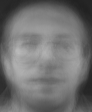

Image after NMF:


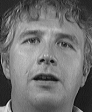

[[ 38.  41.  37. ...  42.  38.  34.]
 [ 42.  39.  39. ...  37.  34.  41.]
 [ 39.  43.  40. ...  42.  36.  39.]
 ...
 [197. 197. 200. ...  37.  38.  36.]
 [188. 186. 199. ...  39.  39.  37.]
 [182. 182. 195. ...  39.  38.  40.]]
Image Before NMF:
-------------------------------Number of image: 332
[[ 58.  58.  58. ...  58.  57.  57.]
 [ 59.  58.  59. ...  58.  58.  58.]
 [ 59.  59.  59. ...  58.  58.  58.]
 ...
 [106. 107. 108. ...  83.  82.  82.]
 [110. 112. 114. ...  87.  86.  84.]
 [113. 117. 119. ...  92.  90.  86.]]


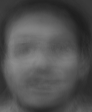

Image after NMF:


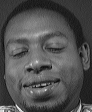

[[ 54.  53.  53. ...  46.  56.  50.]
 [ 54.  49.  57. ...  54.  45.  52.]
 [ 52.  55.  54. ...  59.  44.  55.]
 ...
 [157. 179. 159. ... 101. 110. 147.]
 [208. 211. 210. ... 116. 116.  93.]
 [213. 212. 209. ... 227. 104. 125.]]
Image Before NMF:
-------------------------------Number of image: 333
[[136. 136. 136. ... 140. 139. 139.]
 [136. 136. 136. ... 140. 140. 139.]
 [136. 136. 136. ... 139. 140. 140.]
 ...
 [ 79.  77.  79. ...  72.  73.  73.]
 [ 80.  78.  82. ...  72.  72.  74.]
 [ 81.  80.  84. ...  72.  72.  74.]]


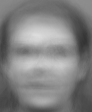

Image after NMF:


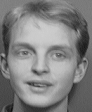

[[128. 125. 125. ... 121. 122. 121.]
 [129. 127. 128. ... 125. 121. 125.]
 [126. 126. 131. ... 124. 124. 125.]
 ...
 [ 71.  65.  90. ...  90.  86.  90.]
 [ 72.  75.  99. ...  86.  88.  91.]
 [ 63.  87. 100. ...  85.  90.  84.]]
Image Before NMF:
-------------------------------Number of image: 334
[[ 39.  39.  39. ...  35.  35.  35.]
 [ 39.  39.  39. ...  35.  35.  35.]
 [ 39.  39.  40. ...  35.  36.  35.]
 ...
 [115. 116. 118. ...  89.  86.  86.]
 [120. 122. 124. ...  93.  91.  88.]
 [123. 130. 131. ... 100.  98.  92.]]


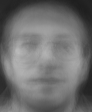

Image after NMF:


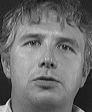

[[ 39.  40.  38. ...  34.  41.  31.]
 [ 36.  39.  39. ...  33.  39.  33.]
 [ 39.  40.  36. ...  38.  38.  34.]
 ...
 [184. 187. 194. ...  39.  37.  39.]
 [183. 186. 197. ...  35.  39.  37.]
 [191. 194. 207. ...  36.  38.  40.]]
Image Before NMF:
-------------------------------Number of image: 335
[[ 92.  92.  92. ...  97.  96.  96.]
 [ 92.  92.  92. ...  97.  97.  97.]
 [ 92.  92.  93. ...  96.  97.  98.]
 ...
 [115. 113. 115. ...  96.  95.  95.]
 [116. 116. 118. ...  99.  97.  97.]
 [117. 119. 121. ... 102.  99.  98.]]


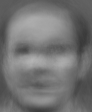

Image after NMF:


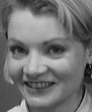

[[ 89.  95.  95. ... 152. 144. 134.]
 [ 87.  97.  88. ... 155. 145. 140.]
 [ 92.  98.  91. ... 144. 151. 142.]
 ...
 [ 76.  74.  79. ... 143. 139. 148.]
 [ 76.  75.  78. ... 137. 146. 151.]
 [ 77.  76.  74. ... 147. 152. 159.]]
Image Before NMF:
-------------------------------Number of image: 336
[[35. 34. 35. ... 34. 34. 35.]
 [34. 34. 34. ... 35. 35. 35.]
 [35. 35. 35. ... 34. 36. 35.]
 ...
 [71. 73. 74. ... 65. 65. 65.]
 [76. 79. 79. ... 69. 67. 66.]
 [80. 84. 85. ... 73. 70. 67.]]


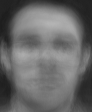

Image after NMF:


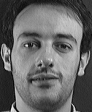

[[41. 43. 43. ... 57. 56. 61.]
 [41. 39. 38. ... 53. 59. 56.]
 [37. 38. 39. ... 51. 59. 52.]
 ...
 [37. 33. 30. ... 49. 49. 48.]
 [31. 33. 30. ... 50. 42. 48.]
 [38. 56. 77. ... 45. 47. 46.]]
Image Before NMF:
-------------------------------Number of image: 337
[[118. 118. 118. ... 119. 119. 118.]
 [118. 118. 118. ... 119. 119. 119.]
 [117. 118. 118. ... 119. 119. 119.]
 ...
 [129. 127. 130. ...  99.  98.  98.]
 [131. 130. 133. ... 101. 101. 101.]
 [131. 133. 137. ... 103. 102. 102.]]


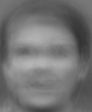

Image after NMF:


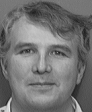

[[121. 120. 120. ... 117. 116. 118.]
 [120. 120. 120. ... 116. 122. 119.]
 [119. 119. 121. ... 119. 116. 123.]
 ...
 [199. 179. 184. ...  80.  74.  80.]
 [179. 119. 119. ...  80.  79.  77.]
 [181. 136.  95. ...  79.  76.  78.]]
Image Before NMF:
-------------------------------Number of image: 338
[[ 92.  92.  93. ...  92.  92.  92.]
 [ 92.  93.  93. ...  93.  93.  93.]
 [ 93.  93.  93. ...  93.  93.  93.]
 ...
 [153. 156. 158. ... 108. 108. 108.]
 [161. 164. 168. ... 113. 111. 111.]
 [167. 172. 173. ... 115. 113. 112.]]


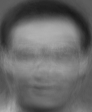

Image after NMF:


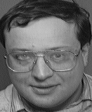

[[ 96.  94.  98. ...  94.  94.  93.]
 [ 96.  96. 102. ...  94.  94.  93.]
 [ 96.  97.  99. ...  94.  95.  94.]
 ...
 [169. 162. 142. ... 131. 137. 133.]
 [141. 137. 165. ... 120. 127. 153.]
 [153. 162. 171. ... 131. 136. 152.]]
Image Before NMF:
-------------------------------Number of image: 339
[[62. 62. 62. ... 69. 69. 70.]
 [62. 63. 61. ... 70. 70. 70.]
 [64. 62. 63. ... 69. 71. 71.]
 ...
 [39. 37. 39. ... 60. 60. 61.]
 [39. 40. 41. ... 61. 60. 59.]
 [43. 43. 44. ... 65. 63. 61.]]


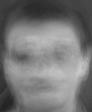

Image after NMF:


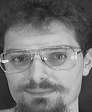

[[ 45.  52.  48. ...  53.  52.  56.]
 [ 44.  48.  48. ...  55.  53.  55.]
 [ 48.  47.  55. ...  56.  57.  52.]
 ...
 [ 48.  51.  57. ...  47.  49.  45.]
 [106. 111. 119. ...  44.  52.  43.]
 [125. 126. 124. ...  48.  43.  47.]]
Image Before NMF:
-------------------------------Number of image: 340
[[131. 132. 132. ... 126. 126. 125.]
 [132. 132. 131. ... 126. 126. 125.]
 [131. 132. 131. ... 126. 125. 125.]
 ...
 [116. 114. 117. ...  69.  67.  66.]
 [117. 115. 119. ...  67.  69.  70.]
 [116. 116. 119. ...  66.  68.  70.]]


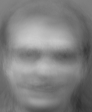

Image after NMF:


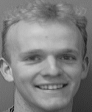

[[131. 129. 130. ... 123. 119. 119.]
 [129. 132. 129. ... 120. 119. 123.]
 [130. 130. 131. ... 119. 119. 121.]
 ...
 [100. 104. 101. ...  54.  50.  54.]
 [ 97. 103.  99. ...  51.  49.  50.]
 [100. 102. 107. ...  51.  48.  55.]]
Image Before NMF:
-------------------------------Number of image: 341
[[ 56.  56.  57. ...  52.  52.  52.]
 [ 56.  57.  58. ...  52.  52.  52.]
 [ 57.  57.  57. ...  52.  52.  52.]
 ...
 [ 93.  95.  95. ...  74.  73.  73.]
 [ 99. 102. 104. ...  79.  77.  74.]
 [104. 112. 112. ...  88.  84.  77.]]


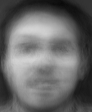

Image after NMF:


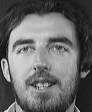

[[52. 48. 47. ... 40. 40. 41.]
 [51. 45. 54. ... 44. 39. 48.]
 [52. 48. 48. ... 42. 43. 38.]
 ...
 [62. 60. 57. ... 29. 31. 30.]
 [60. 56. 56. ... 32. 28. 35.]
 [59. 71. 61. ... 32. 31. 37.]]
Image Before NMF:
-------------------------------Number of image: 342
[[43. 43. 43. ... 48. 48. 49.]
 [43. 43. 42. ... 49. 49. 49.]
 [44. 43. 44. ... 48. 50. 49.]
 ...
 [51. 50. 50. ... 62. 61. 61.]
 [50. 53. 51. ... 66. 63. 62.]
 [53. 54. 54. ... 70. 66. 64.]]


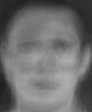

Image after NMF:


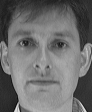

[[36. 38. 37. ... 45. 46. 45.]
 [36. 41. 40. ... 46. 46. 47.]
 [37. 40. 41. ... 43. 47. 44.]
 ...
 [41. 47. 41. ... 51. 53. 50.]
 [45. 40. 46. ... 52. 53. 47.]
 [43. 42. 42. ... 48. 51. 50.]]
Image Before NMF:
-------------------------------Number of image: 343
[[64. 64. 64. ... 61. 61. 61.]
 [64. 64. 65. ... 61. 61. 61.]
 [65. 65. 65. ... 61. 61. 61.]
 ...
 [77. 75. 76. ... 67. 65. 66.]
 [79. 81. 83. ... 71. 69. 65.]
 [82. 88. 89. ... 80. 76. 69.]]


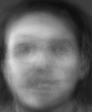

Image after NMF:


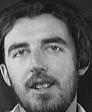

[[44. 48. 45. ... 39. 40. 40.]
 [47. 49. 46. ... 40. 42. 38.]
 [44. 47. 51. ... 39. 42. 41.]
 ...
 [51. 58. 52. ... 36. 30. 39.]
 [54. 49. 56. ... 32. 34. 37.]
 [62. 46. 49. ... 33. 36. 37.]]
Image Before NMF:
-------------------------------Number of image: 344
[[133. 133. 133. ... 132. 132. 131.]
 [133. 133. 133. ... 131. 131. 131.]
 [133. 133. 133. ... 132. 131. 131.]
 ...
 [ 81.  80.  82. ...  64.  65.  65.]
 [ 83.  81.  85. ...  63.  64.  66.]
 [ 85.  85.  88. ...  64.  64.  65.]]


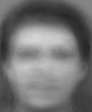

Image after NMF:


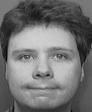

[[122. 124. 121. ... 124. 121. 120.]
 [124. 122. 124. ... 118. 121. 119.]
 [122. 123. 125. ... 122. 116. 122.]
 ...
 [ 75.  74.  75. ...  88.  81.  86.]
 [ 75.  71.  74. ...  83.  83.  84.]
 [ 72.  74.  74. ...  86.  84.  84.]]
Image Before NMF:
-------------------------------Number of image: 345
[[109. 108. 109. ... 105. 105. 105.]
 [109. 109. 108. ... 105. 104. 105.]
 [109. 109. 109. ... 105. 105. 104.]
 ...
 [ 35.  35.  36. ...  27.  29.  29.]
 [ 37.  36.  39. ...  26.  27.  29.]
 [ 39.  37.  39. ...  24.  25.  28.]]


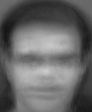

Image after NMF:


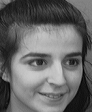

[[132. 118. 124. ... 132. 129. 129.]
 [130. 122. 110. ... 129. 129. 129.]
 [115. 120. 108. ... 126. 131. 132.]
 ...
 [ 21.  27.  31. ...  62.  64.  68.]
 [ 27.  32.  36. ...  58.  65.  71.]
 [ 32.  38.  39. ...  56.  67.  62.]]
Image Before NMF:
-------------------------------Number of image: 346
[[75. 74. 75. ... 77. 76. 76.]
 [75. 74. 75. ... 77. 76. 76.]
 [74. 74. 75. ... 77. 76. 76.]
 ...
 [58. 57. 60. ... 64. 63. 63.]
 [60. 59. 60. ... 63. 64. 64.]
 [60. 64. 65. ... 68. 69. 66.]]


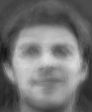

Image after NMF:


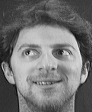

[[48. 52. 48. ... 61. 61. 59.]
 [54. 51. 53. ... 63. 59. 63.]
 [51. 53. 55. ... 60. 58. 62.]
 ...
 [49. 51. 48. ... 63. 61. 69.]
 [52. 51. 47. ... 65. 63. 65.]
 [50. 50. 50. ... 65. 61. 63.]]
Image Before NMF:
-------------------------------Number of image: 347
[[78. 78. 78. ... 79. 78. 78.]
 [79. 78. 79. ... 79. 78. 78.]
 [78. 78. 78. ... 79. 78. 78.]
 ...
 [65. 65. 68. ... 67. 67. 67.]
 [68. 68. 70. ... 67. 68. 67.]
 [70. 74. 76. ... 72. 72. 69.]]


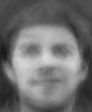

Image after NMF:


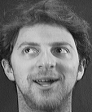

[[53. 51. 49. ... 60. 58. 59.]
 [53. 55. 51. ... 59. 60. 61.]
 [49. 56. 50. ... 62. 57. 65.]
 ...
 [48. 51. 56. ... 57. 65. 61.]
 [50. 55. 50. ... 58. 61. 64.]
 [48. 55. 53. ... 58. 64. 60.]]
Image Before NMF:
-------------------------------Number of image: 348
[[110. 111. 111. ... 113. 112. 112.]
 [110. 110. 111. ... 113. 113. 112.]
 [110. 110. 110. ... 112. 113. 113.]
 ...
 [100. 100. 103. ...  75.  74.  73.]
 [102. 101. 103. ...  74.  75.  76.]
 [102. 102. 105. ...  73.  74.  76.]]


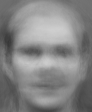

Image after NMF:


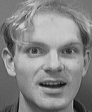

[[123. 121. 121. ... 114. 114. 113.]
 [118. 121. 122. ... 114. 115. 114.]
 [120. 119. 122. ... 116. 113. 118.]
 ...
 [ 90.  93.  83. ...  71.  60.  63.]
 [ 80.  82.  77. ...  70.  67.  61.]
 [ 69.  78.  67. ...  78.  79.  67.]]
Image Before NMF:
-------------------------------Number of image: 349
[[44. 43. 44. ... 42. 42. 42.]
 [43. 44. 43. ... 42. 42. 42.]
 [44. 44. 44. ... 42. 43. 42.]
 ...
 [23. 21. 22. ... 28. 25. 26.]
 [22. 23. 23. ... 28. 27. 26.]
 [23. 25. 25. ... 31. 31. 28.]]


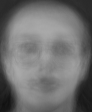

Image after NMF:


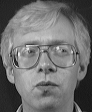

[[30. 37. 35. ... 36. 32. 32.]
 [31. 38. 30. ... 37. 34. 37.]
 [36. 37. 30. ... 33. 33. 38.]
 ...
 [42. 37. 39. ... 24. 30. 28.]
 [40. 35. 36. ... 25. 25. 29.]
 [36. 39. 34. ... 26. 27. 32.]]
Image Before NMF:
-------------------------------Number of image: 350
[[54. 53. 54. ... 55. 54. 55.]
 [54. 53. 54. ... 56. 55. 55.]
 [54. 54. 54. ... 54. 56. 56.]
 ...
 [73. 74. 76. ... 73. 74. 74.]
 [78. 79. 81. ... 75. 75. 74.]
 [81. 86. 87. ... 80. 78. 76.]]


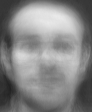

Image after NMF:


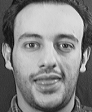

[[ 69.  76.  69. ...  85.  86.  92.]
 [ 69.  72.  70. ...  86.  88.  89.]
 [ 66.  71.  69. ...  86.  91.  88.]
 ...
 [ 46.  50.  53. ...  92.  90.  95.]
 [ 51.  50.  50. ...  90.  91.  77.]
 [ 54.  47.  52. ... 104. 121.  93.]]
Image Before NMF:


In [63]:
m=convertMatrixtoImageMinMax(m, min, max)
print(m)
compareAndTest(m,w,h, min, max, 1)

/usr/local/lib/python3.9/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


[[ 39.  43.  39. ...  24.  24.  23.]
 [115. 108. 109. ...  48.  47.  48.]
 [116. 116. 117. ...  19.  24.  16.]
 ...
 [123. 121. 121. ...  78.  79.  67.]
 [ 30.  37.  35. ...  26.  27.  32.]
 [ 69.  76.  69. ... 104. 121.  93.]]
-------------------------------Number of image: 0
[[65. 66. 67. ... 57. 57. 57.]
 [65. 67. 67. ... 57. 57. 57.]
 [66. 66. 67. ... 58. 57. 57.]
 ...
 [73. 79. 81. ... 25. 26. 26.]
 [79. 83. 83. ... 26. 27. 26.]
 [80. 87. 86. ... 30. 30. 29.]]


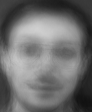

Image after NMF:


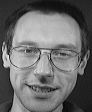

[[39. 43. 39. ... 33. 42. 29.]
 [45. 39. 46. ... 39. 33. 37.]
 [41. 40. 42. ... 37. 39. 33.]
 ...
 [69. 73. 64. ... 23. 21. 26.]
 [71. 70. 71. ... 25. 26. 22.]
 [69. 70. 77. ... 24. 24. 23.]]
Image Before NMF:
-------------------------------Number of image: 1
[[118. 118. 118. ... 115. 115. 114.]
 [118. 118. 118. ... 115. 115. 115.]
 [118. 118. 118. ... 115. 115. 115.]
 ...
 [ 82.  80.  82. ...  64.  64.  64.]
 [ 83.  81.  86. ...  63.  64.  65.]
 [ 84.  85.  88. ...  64.  66.  65.]]


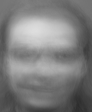

Image after NMF:


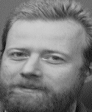

[[115. 108. 109. ... 106. 108. 109.]
 [108. 107. 111. ... 107. 107. 107.]
 [106. 109. 106. ... 110. 107. 108.]
 ...
 [ 96.  84.  73. ...  48.  40.  47.]
 [ 91.  87.  75. ...  49.  50.  51.]
 [100.  80.  84. ...  48.  47.  48.]]
Image Before NMF:
-------------------------------Number of image: 2
[[ 84.  84.  85. ...  89.  89.  89.]
 [ 84.  85.  85. ...  90.  89.  89.]
 [ 85.  84.  85. ...  89.  90.  90.]
 ...
 [ 91.  92.  93. ...  76.  76.  76.]
 [ 95.  95.  97. ...  79.  78.  78.]
 [ 97. 101. 102. ...  81.  78.  79.]]


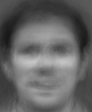

Image after NMF:


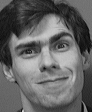

[[116. 116. 117. ... 114. 117. 114.]
 [115. 118. 117. ... 113. 120. 115.]
 [111. 121. 111. ... 113. 116. 116.]
 ...
 [101.  96. 101. ...  21.  25.  24.]
 [103.  93. 100. ...  17.  27.  19.]
 [ 98.  96.  98. ...  19.  24.  16.]]
Image Before NMF:
-------------------------------Number of image: 3
[[47. 46. 46. ... 45. 44. 44.]
 [47. 47. 47. ... 45. 45. 44.]
 [47. 47. 47. ... 45. 45. 45.]
 ...
 [84. 82. 84. ... 74. 74. 74.]
 [86. 86. 89. ... 77. 76. 75.]
 [88. 92. 94. ... 83. 82. 76.]]


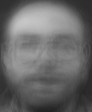

Image after NMF:


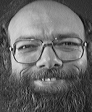

[[52. 47. 51. ... 45. 48. 45.]
 [52. 50. 53. ... 46. 46. 47.]
 [55. 44. 58. ... 45. 48. 44.]
 ...
 [67. 68. 73. ... 44. 35. 46.]
 [72. 62. 68. ... 35. 39. 49.]
 [73. 68. 63. ... 30. 34. 42.]]
Image Before NMF:
-------------------------------Number of image: 4
[[114. 114. 114. ... 112. 112. 111.]
 [114. 114. 114. ... 112. 112. 112.]
 [114. 114. 114. ... 112. 112. 112.]
 ...
 [141. 139. 142. ... 103. 102. 102.]
 [143. 143. 147. ... 105. 104. 105.]
 [145. 147. 151. ... 106. 105. 104.]]


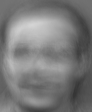

Image after NMF:


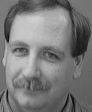

[[124. 124. 123. ... 115. 114. 117.]
 [124. 124. 122. ... 118. 116. 114.]
 [124. 121. 124. ... 116. 118. 112.]
 ...
 [130. 111. 143. ...  97. 101.  86.]
 [128. 118. 145. ...  99.  85. 101.]
 [128. 129. 145. ...  99. 102.  95.]]
Image Before NMF:
-------------------------------Number of image: 5
[[53. 53. 53. ... 66. 66. 67.]
 [53. 53. 53. ... 67. 67. 67.]
 [54. 52. 53. ... 66. 68. 68.]
 ...
 [44. 43. 44. ... 71. 71. 71.]
 [45. 45. 47. ... 73. 72. 72.]
 [46. 47. 49. ... 74. 71. 72.]]


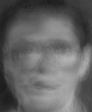

Image after NMF:


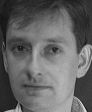

[[34. 38. 36. ... 46. 45. 46.]
 [33. 37. 38. ... 46. 46. 47.]
 [34. 37. 42. ... 46. 48. 48.]
 ...
 [36. 36. 37. ... 56. 57. 53.]
 [38. 39. 36. ... 57. 63. 55.]
 [34. 35. 33. ... 55. 58. 55.]]
Image Before NMF:
-------------------------------Number of image: 6
[[133. 133. 133. ... 136. 136. 136.]
 [133. 133. 133. ... 137. 136. 136.]
 [133. 132. 132. ... 136. 136. 136.]
 ...
 [ 82.  79.  81. ...  81.  82.  81.]
 [ 84.  81.  86. ...  83.  82.  83.]
 [ 86.  86.  89. ...  84.  83.  83.]]


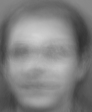

Image after NMF:


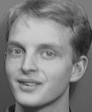

[[129. 127. 133. ... 122. 124. 124.]
 [130. 128. 126. ... 123. 124. 122.]
 [127. 126. 132. ... 123. 123. 126.]
 ...
 [ 69.  72.  71. ...  90.  90.  95.]
 [ 70.  69.  71. ...  92.  93.  92.]
 [ 74.  69.  72. ...  93.  93.  93.]]
Image Before NMF:
-------------------------------Number of image: 7
[[ 65.  65.  65. ...  62.  62.  62.]
 [ 65.  65.  65. ...  62.  62.  62.]
 [ 65.  65.  66. ...  62.  62.  62.]
 ...
 [171. 171. 171. ... 119. 116. 116.]
 [177. 178. 179. ... 124. 122. 120.]
 [180. 183. 186. ... 127. 124. 122.]]


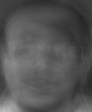

Image after NMF:


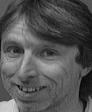

[[ 97.  94.  92. ...  85.  84.  80.]
 [ 89.  92.  94. ...  82.  83.  85.]
 [ 90.  93.  92. ...  79.  85.  82.]
 ...
 [187. 194. 198. ... 138. 142. 134.]
 [197. 200. 201. ... 138. 146. 132.]
 [199. 199. 199. ... 144. 143. 129.]]
Image Before NMF:
-------------------------------Number of image: 8
[[128. 128. 129. ... 125. 126. 125.]
 [129. 128. 130. ... 126. 125. 125.]
 [129. 128. 128. ... 126. 125. 125.]
 ...
 [136. 132. 133. ... 110. 109. 108.]
 [140. 136. 141. ... 112. 111. 112.]
 [143. 143. 147. ... 114. 113. 113.]]


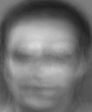

Image after NMF:


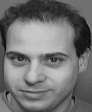

[[113. 112. 111. ... 111. 116. 109.]
 [114. 114. 113. ... 111. 111. 112.]
 [113. 114. 113. ... 112. 108. 114.]
 ...
 [137. 140. 137. ...  89.  87.  87.]
 [139. 136. 142. ...  89.  88.  87.]
 [137. 137. 141. ...  87.  87.  89.]]
Image Before NMF:
-------------------------------Number of image: 9
[[ 26.  27.  27. ...  23.  22.  23.]
 [ 27.  27.  28. ...  23.  23.  23.]
 [ 27.  28.  28. ...  23.  24.  23.]
 ...
 [207. 208. 210. ... 140. 137. 137.]
 [213. 217. 218. ... 146. 144. 141.]
 [216. 223. 226. ... 151. 148. 144.]]


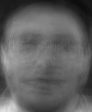

Image after NMF:


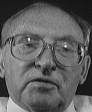

[[ 25.  24.  26. ...  21.  20.  18.]
 [ 23.  27.  24. ...  19.  19.  19.]
 [ 23.  24.  28. ...  20.  23.  16.]
 ...
 [202. 196. 186. ... 188. 184. 195.]
 [195. 197. 184. ... 186. 187. 194.]
 [198. 193. 190. ... 186. 189. 187.]]
Image Before NMF:
-------------------------------Number of image: 10
[[123. 122. 122. ... 115. 116. 116.]
 [122. 122. 122. ... 115. 115. 115.]
 [122. 122. 122. ... 116. 115. 114.]
 ...
 [ 49.  49.  49. ...  40.  40.  40.]
 [ 57.  55.  56. ...  43.  43.  41.]
 [ 62.  60.  61. ...  48.  46.  45.]]


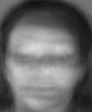

Image after NMF:


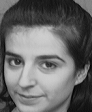

[[136. 136. 136. ... 128. 133. 133.]
 [137. 137. 138. ... 130. 133. 127.]
 [134. 140. 137. ... 134. 133. 128.]
 ...
 [ 59.  60.  55. ...  16.  22.  22.]
 [ 65.  61.  48. ...  17.  22.  19.]
 [ 60.  48.  56. ...  19.  20.  21.]]
Image Before NMF:
-------------------------------Number of image: 11
[[54. 54. 55. ... 59. 59. 60.]
 [54. 54. 55. ... 60. 60. 60.]
 [55. 54. 55. ... 59. 60. 60.]
 ...
 [48. 48. 48. ... 51. 51. 51.]
 [50. 50. 51. ... 52. 52. 52.]
 [52. 55. 55. ... 55. 53. 54.]]


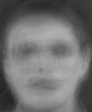

Image after NMF:


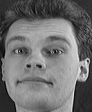

[[46. 48. 41. ... 46. 51. 52.]
 [51. 46. 47. ... 52. 47. 53.]
 [46. 48. 46. ... 51. 53. 45.]
 ...
 [43. 44. 37. ... 37. 39. 40.]
 [44. 39. 42. ... 34. 39. 40.]
 [38. 41. 41. ... 35. 36. 37.]]
Image Before NMF:
-------------------------------Number of image: 12
[[106. 107. 108. ... 103. 103. 102.]
 [106. 108. 107. ... 103. 103. 103.]
 [107. 107. 107. ... 103. 103. 103.]
 ...
 [101. 107. 111. ...  47.  48.  48.]
 [103. 109. 110. ...  46.  47.  48.]
 [103. 108. 109. ...  45.  47.  47.]]


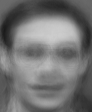

Image after NMF:


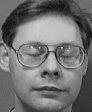

[[114. 118. 114. ... 109. 112. 112.]
 [113. 115. 117. ... 113. 108. 114.]
 [118. 111. 118. ... 113. 111. 108.]
 ...
 [103.  93. 110. ...  51.  55.  52.]
 [ 98. 101.  98. ...  49.  54.  55.]
 [ 96. 101.  98. ...  54.  55.  52.]]
Image Before NMF:
-------------------------------Number of image: 13
[[55. 55. 55. ... 55. 54. 55.]
 [55. 56. 55. ... 55. 55. 55.]
 [56. 55. 56. ... 54. 56. 55.]
 ...
 [63. 68. 68. ... 39. 39. 39.]
 [69. 73. 72. ... 42. 41. 40.]
 [71. 76. 75. ... 47. 44. 42.]]


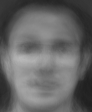

Image after NMF:


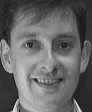

[[40. 41. 43. ... 43. 42. 41.]
 [44. 47. 49. ... 46. 40. 42.]
 [44. 45. 44. ... 39. 41. 42.]
 ...
 [43. 49. 48. ... 38. 37. 36.]
 [48. 47. 49. ... 40. 39. 38.]
 [48. 51. 45. ... 40. 37. 36.]]
Image Before NMF:
-------------------------------Number of image: 14
[[114. 113. 114. ... 116. 116. 116.]
 [114. 113. 114. ... 116. 116. 116.]
 [114. 113. 114. ... 116. 116. 116.]
 ...
 [ 89.  88.  88. ...  81.  81.  80.]
 [ 94.  91.  94. ...  85.  84.  83.]
 [ 97.  96.  99. ...  86.  83.  84.]]


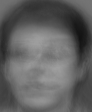

Image after NMF:


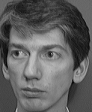

[[105. 106. 100. ...  98. 106. 103.]
 [105. 105. 105. ... 103. 103. 101.]
 [105. 105. 108. ... 104. 103. 102.]
 ...
 [ 76.  67.  69. ...  74.  78.  77.]
 [ 71.  71.  68. ...  77.  77.  79.]
 [ 73.  71.  66. ...  76.  76.  76.]]
Image Before NMF:
-------------------------------Number of image: 15
[[111. 111. 111. ... 116. 115. 115.]
 [111. 110. 110. ... 117. 116. 116.]
 [111. 111. 110. ... 115. 116. 117.]
 ...
 [ 50.  47.  51. ...  70.  71.  72.]
 [ 49.  48.  54. ...  70.  70.  71.]
 [ 50.  52.  55. ...  73.  73.  70.]]


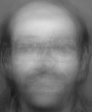

Image after NMF:


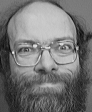

[[121. 121. 122. ... 121. 120. 120.]
 [121. 120. 118. ... 123. 120. 122.]
 [119. 122. 121. ... 121. 120. 121.]
 ...
 [ 64.  71.  69. ...  97. 104. 101.]
 [ 70.  71.  66. ...  99.  97. 102.]
 [ 65.  69.  72. ...  96.  98. 100.]]
Image Before NMF:
-------------------------------Number of image: 16
[[ 59.  60.  60. ...  50.  50.  50.]
 [ 59.  61.  61. ...  50.  50.  50.]
 [ 60.  60.  61. ...  51.  50.  50.]
 ...
 [ 98. 103. 104. ...  42.  43.  43.]
 [105. 109. 109. ...  46.  46.  44.]
 [108. 117. 116. ...  52.  51.  48.]]


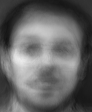

Image after NMF:


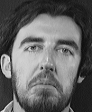

[[ 47.  47.  47. ...  40.  38.  39.]
 [ 50.  45.  47. ...  38.  39.  36.]
 [ 46.  49.  47. ...  40.  39.  36.]
 ...
 [ 54.  51.  30. ...  33.  34.  30.]
 [ 37.  65. 170. ...  35.  33.  27.]
 [104. 212. 213. ...  30.  35.  33.]]
Image Before NMF:
-------------------------------Number of image: 17
[[128. 129. 129. ... 122. 122. 122.]
 [129. 129. 129. ... 122. 122. 122.]
 [129. 129. 129. ... 122. 122. 122.]
 ...
 [107. 110. 111. ...  58.  58.  58.]
 [113. 114. 116. ...  60.  60.  60.]
 [115. 117. 119. ...  61.  61.  61.]]


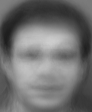

Image after NMF:


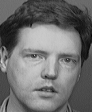

[[113. 109. 113. ... 105. 107. 106.]
 [110. 111. 112. ... 108. 104. 107.]
 [110. 112. 111. ... 105. 105. 106.]
 ...
 [137. 151. 105. ...  68.  72.  68.]
 [149. 135. 106. ...  70.  69.  68.]
 [152. 126. 120. ...  72.  66.  71.]]
Image Before NMF:
-------------------------------Number of image: 18
[[49. 49. 49. ... 47. 47. 46.]
 [50. 49. 50. ... 47. 47. 47.]
 [50. 50. 50. ... 47. 47. 47.]
 ...
 [80. 78. 80. ... 69. 69. 69.]
 [82. 82. 85. ... 71. 71. 70.]
 [84. 88. 90. ... 77. 76. 72.]]


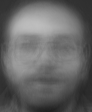

Image after NMF:


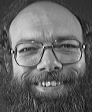

[[45. 54. 48. ... 42. 50. 37.]
 [50. 53. 49. ... 49. 48. 44.]
 [52. 50. 48. ... 47. 43. 47.]
 ...
 [67. 67. 67. ... 40. 42. 32.]
 [60. 65. 68. ... 50. 55. 39.]
 [65. 63. 76. ... 46. 67. 33.]]
Image Before NMF:
-------------------------------Number of image: 19
[[ 37.  37.  37. ...  35.  35.  35.]
 [ 37.  37.  37. ...  36.  36.  36.]
 [ 37.  38.  38. ...  36.  37.  36.]
 ...
 [214. 213. 215. ... 157. 153. 153.]
 [218. 221. 223. ... 162. 160. 158.]
 [221. 227. 230. ... 167. 165. 159.]]


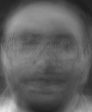

Image after NMF:


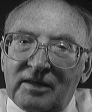

[[ 22.  19.  24. ...  12.   9.  18.]
 [ 22.  21.  21. ...  17.  16.  17.]
 [ 22.  22.  22. ...  17.  18.  18.]
 ...
 [188. 181. 171. ... 158. 153. 150.]
 [190. 181. 170. ... 153. 151. 157.]
 [194. 181. 170. ... 150. 158. 166.]]
Image Before NMF:
-------------------------------Number of image: 20
[[107. 107. 107. ... 106. 106. 106.]
 [107. 107. 107. ... 106. 106. 106.]
 [107. 107. 107. ... 106. 107. 106.]
 ...
 [134. 133. 135. ...  96.  95.  94.]
 [137. 137. 140. ...  99.  98.  98.]
 [140. 143. 146. ... 100.  98.  99.]]


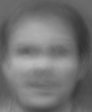

Image after NMF:


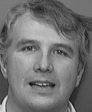

[[119. 123. 123. ... 116. 117. 113.]
 [117. 123. 123. ... 119. 113. 115.]
 [121. 125. 120. ... 115. 115. 112.]
 ...
 [193. 202. 211. ...  76.  75.  75.]
 [206. 206. 209. ...  79.  74.  72.]
 [203. 205. 211. ...  78.  72.  75.]]
Image Before NMF:
-------------------------------Number of image: 21
[[46. 46. 46. ... 44. 43. 44.]
 [46. 46. 46. ... 44. 44. 44.]
 [47. 46. 47. ... 43. 44. 44.]
 ...
 [36. 40. 41. ... 24. 23. 24.]
 [41. 44. 43. ... 25. 25. 24.]
 [43. 47. 46. ... 30. 29. 27.]]


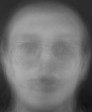

Image after NMF:


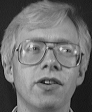

[[34. 36. 35. ... 32. 31. 31.]
 [36. 34. 38. ... 27. 32. 30.]
 [37. 37. 36. ... 29. 38. 27.]
 ...
 [42. 39. 39. ... 27. 25. 26.]
 [39. 41. 38. ... 26. 27. 26.]
 [38. 41. 34. ... 32. 25. 25.]]
Image Before NMF:
-------------------------------Number of image: 22
[[ 59.  59.  59. ...  56.  56.  56.]
 [ 59.  59.  60. ...  56.  56.  56.]
 [ 59.  59.  60. ...  56.  56.  56.]
 ...
 [144. 142. 142. ... 111. 109. 109.]
 [149. 148. 151. ... 117. 115. 113.]
 [153. 156. 159. ... 121. 118. 115.]]


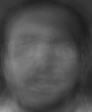

Image after NMF:


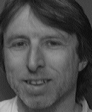

[[ 74.  74.  78. ...  67.  63.  67.]
 [ 75.  76.  74. ...  66.  66.  65.]
 [ 75.  77.  74. ...  66.  66.  64.]
 ...
 [173. 182. 187. ... 100.  84.  56.]
 [177. 184. 184. ... 103. 113. 106.]
 [177. 184. 186. ... 109. 113. 120.]]
Image Before NMF:
-------------------------------Number of image: 23
[[135. 135. 135. ... 131. 130. 130.]
 [135. 135. 134. ... 130. 130. 130.]
 [135. 135. 134. ... 130. 130. 130.]
 ...
 [ 64.  64.  67. ...  40.  40.  40.]
 [ 66.  67.  69. ...  38.  39.  40.]
 [ 67.  66.  68. ...  38.  40.  40.]]


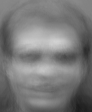

Image after NMF:


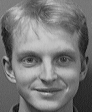

[[123. 121. 126. ... 120. 117. 120.]
 [128. 123. 125. ... 120. 119. 121.]
 [126. 124. 123. ... 118. 122. 121.]
 ...
 [ 84.  95.  90. ...  38.  37.  44.]
 [ 94.  88.  91. ...  35.  45.  39.]
 [ 89.  94.  89. ...  40.  35.  42.]]
Image Before NMF:
-------------------------------Number of image: 24
[[102. 102. 103. ... 103. 102. 102.]
 [102. 103. 102. ... 103. 103. 103.]
 [102. 102. 102. ... 102. 103. 103.]
 ...
 [105. 109. 113. ...  69.  70.  70.]
 [107. 112. 114. ...  69.  69.  70.]
 [107. 112. 113. ...  69.  70.  70.]]


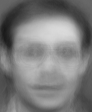

Image after NMF:


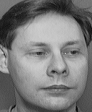

[[119. 121. 122. ... 117. 114. 121.]
 [120. 122. 122. ... 117. 117. 117.]
 [122. 122. 121. ... 116. 113. 116.]
 ...
 [ 89.  85.  96. ...  79.  80.  84.]
 [100. 108. 108. ...  79.  82.  84.]
 [107. 108. 106. ...  79.  80.  82.]]
Image Before NMF:
-------------------------------Number of image: 25
[[ 66.  66.  66. ...  65.  65.  65.]
 [ 66.  66.  67. ...  65.  65.  65.]
 [ 67.  67.  67. ...  65.  65.  65.]
 ...
 [144. 144. 146. ... 107. 105. 105.]
 [148. 149. 151. ... 111. 109. 108.]
 [150. 154. 156. ... 114. 111. 109.]]


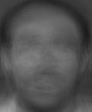

Image after NMF:


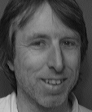

[[ 75.  77.  75. ...  65.  65.  63.]
 [ 75.  74.  77. ...  67.  67.  64.]
 [ 76.  74.  75. ...  66.  65.  65.]
 ...
 [192. 193. 192. ...  74.  64.  55.]
 [193. 194. 188. ... 108. 102.  88.]
 [191. 192. 187. ... 116. 114. 113.]]
Image Before NMF:
-------------------------------Number of image: 26
[[136. 135. 136. ... 133. 133. 132.]
 [136. 136. 135. ... 133. 133. 132.]
 [136. 136. 135. ... 133. 133. 133.]
 ...
 [ 86.  84.  86. ...  63.  63.  63.]
 [ 88.  86.  90. ...  65.  64.  65.]
 [ 90.  89.  93. ...  65.  64.  65.]]


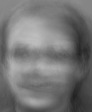

Image after NMF:


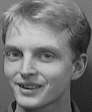

[[130. 123. 127. ... 120. 120. 124.]
 [126. 130. 123. ... 120. 120. 120.]
 [123. 125. 127. ... 122. 118. 119.]
 ...
 [ 88.  91.  96. ...  38.  37.  39.]
 [ 91.  90.  96. ...  38.  32.  42.]
 [ 91.  94.  88. ...  33.  37.  40.]]
Image Before NMF:
-------------------------------Number of image: 27
[[111. 112. 112. ... 109. 108. 108.]
 [111. 112. 112. ... 108. 109. 108.]
 [111. 112. 112. ... 109. 108. 109.]
 ...
 [155. 157. 160. ...  91.  91.  90.]
 [157. 159. 163. ...  93.  92.  93.]
 [158. 163. 165. ...  90.  91.  93.]]


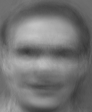

Image after NMF:


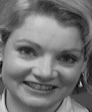

[[ 84.  96. 101. ...  91.  84.  86.]
 [ 94.  93.  93. ...  95.  90.  83.]
 [ 94.  96.  87. ...  97.  95.  91.]
 ...
 [193. 196. 202. ...  59.  64.  69.]
 [190. 195. 199. ...  40.  69.  58.]
 [191. 191. 197. ...  36.  57.  55.]]
Image Before NMF:
-------------------------------Number of image: 28
[[157. 156. 157. ... 160. 160. 160.]
 [157. 156. 155. ... 160. 160. 160.]
 [157. 156. 156. ... 159. 161. 160.]
 ...
 [150. 149. 150. ... 127. 125. 124.]
 [157. 156. 158. ... 130. 129. 128.]
 [161. 158. 163. ... 131. 129. 129.]]


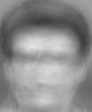

Image after NMF:


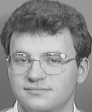

[[157. 152. 154. ... 152. 150. 151.]
 [155. 152. 156. ... 151. 151. 150.]
 [153. 153. 154. ... 152. 150. 151.]
 ...
 [105. 104. 115. ... 111. 113. 110.]
 [115. 122. 146. ... 109. 113. 110.]
 [135. 144. 157. ... 111. 108. 109.]]
Image Before NMF:
-------------------------------Number of image: 29
[[107. 106. 107. ... 110. 110. 110.]
 [107. 106. 106. ... 111. 111. 110.]
 [107. 107. 106. ... 110. 110. 111.]
 ...
 [ 76.  73.  78. ...  83.  83.  84.]
 [ 75.  74.  80. ...  83.  82.  84.]
 [ 75.  77.  80. ...  85.  86.  82.]]


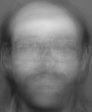

Image after NMF:


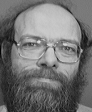

[[121. 122. 121. ... 121. 120. 119.]
 [122. 121. 125. ... 120. 118. 120.]
 [122. 124. 122. ... 122. 121. 121.]
 ...
 [142. 139. 148. ... 147. 154. 145.]
 [137. 139. 159. ... 142. 148. 149.]
 [140. 157. 162. ... 141. 140. 145.]]
Image Before NMF:
-------------------------------Number of image: 30
[[104. 104. 104. ... 104. 104. 104.]
 [104. 104. 104. ... 104. 104. 104.]
 [104. 104. 104. ... 104. 104. 104.]
 ...
 [127. 125. 126. ... 101. 100. 100.]
 [130. 128. 132. ... 103. 102. 103.]
 [132. 133. 136. ... 104. 103. 104.]]


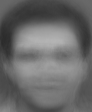

Image after NMF:


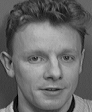

[[103. 104. 103. ... 102.  99. 100.]
 [104. 104. 104. ...  98. 103. 105.]
 [107. 104. 105. ... 103. 104. 101.]
 ...
 [128. 158. 171. ... 133. 164. 143.]
 [160. 165. 178. ... 131. 165. 147.]
 [155. 176. 177. ... 132. 165. 149.]]
Image Before NMF:
-------------------------------Number of image: 31
[[64. 63. 63. ... 64. 63. 64.]
 [64. 64. 64. ... 64. 64. 64.]
 [64. 64. 64. ... 64. 65. 64.]
 ...
 [57. 56. 55. ... 54. 53. 53.]
 [61. 59. 61. ... 55. 56. 55.]
 [64. 68. 68. ... 61. 59. 60.]]


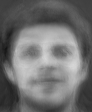

Image after NMF:


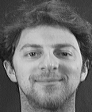

[[51. 49. 53. ... 61. 61. 54.]
 [52. 51. 50. ... 60. 61. 55.]
 [51. 49. 50. ... 59. 62. 59.]
 ...
 [52. 51. 49. ... 63. 59. 63.]
 [48. 50. 49. ... 64. 58. 61.]
 [49. 48. 48. ... 61. 61. 57.]]
Image Before NMF:
-------------------------------Number of image: 32
[[113. 112. 113. ... 113. 112. 112.]
 [113. 113. 111. ... 113. 113. 112.]
 [113. 113. 112. ... 112. 113. 113.]
 ...
 [ 63.  63.  67. ...  46.  47.  47.]
 [ 63.  65.  68. ...  45.  45.  47.]
 [ 63.  65.  67. ...  46.  47.  45.]]


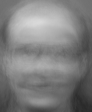

Image after NMF:


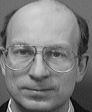

[[106. 109. 105. ... 111. 108. 113.]
 [108. 109. 108. ... 109. 113. 111.]
 [108. 111. 107. ... 112. 113. 113.]
 ...
 [ 22.  23.  23. ...  51.  46.  52.]
 [ 19.  19.  28. ...  45.  50.  46.]
 [ 17.  31.  16. ...  35.  45.  48.]]
Image Before NMF:
-------------------------------Number of image: 33
[[ 83.  83.  83. ...  79.  79.  79.]
 [ 83.  84.  83. ...  79.  79.  79.]
 [ 83.  84.  84. ...  79.  80.  79.]
 ...
 [153. 158. 159. ...  88.  86.  86.]
 [160. 164. 163. ...  92.  90.  89.]
 [163. 166. 167. ...  93.  91.  90.]]


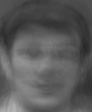

Image after NMF:


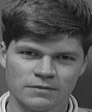

[[ 97.  96.  98. ... 103. 103. 102.]
 [ 95.  94.  94. ... 101.  98. 101.]
 [ 94.  95.  91. ... 101.  96. 100.]
 ...
 [207. 171. 182. ... 116. 108.  88.]
 [206. 188. 170. ... 109. 119. 124.]
 [204. 202. 171. ...  75. 104. 124.]]
Image Before NMF:
-------------------------------Number of image: 34
[[ 62.  63.  63. ...  57.  57.  56.]
 [ 63.  63.  64. ...  57.  56.  56.]
 [ 64.  63.  63. ...  57.  56.  56.]
 ...
 [ 86.  86.  88. ...  65.  65.  66.]
 [ 90.  90.  94. ...  68.  68.  66.]
 [ 92.  98. 100. ...  75.  74.  69.]]


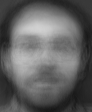

Image after NMF:


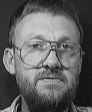

[[ 41.  42.  47. ...  34.  37.  37.]
 [ 41.  46.  43. ...  38.  36.  37.]
 [ 42.  45.  47. ...  35.  37.  38.]
 ...
 [ 43.  47.  47. ... 154. 137. 136.]
 [128. 128. 127. ... 151. 155. 138.]
 [135. 152. 190. ... 141. 156. 149.]]
Image Before NMF:
-------------------------------Number of image: 35
[[ 99.  99.  99. ... 101. 101. 101.]
 [ 99.  99. 100. ... 102. 101. 101.]
 [ 99.  99. 100. ... 101. 102. 102.]
 ...
 [142. 140. 142. ... 113. 112. 111.]
 [144. 143. 147. ... 115. 114. 115.]
 [146. 149. 152. ... 116. 114. 115.]]


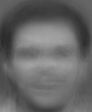

Image after NMF:


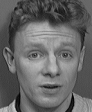

[[108. 105. 105. ... 105. 104. 103.]
 [107. 104. 107. ... 104. 103. 102.]
 [109. 105. 106. ... 104. 102. 100.]
 ...
 [182. 183. 176. ... 163. 143. 168.]
 [176. 182. 163. ... 166. 147. 164.]
 [179. 183. 156. ... 169. 147. 165.]]
Image Before NMF:
-------------------------------Number of image: 36
[[100.  99. 100. ... 102. 102. 102.]
 [100. 100.  99. ... 102. 102. 102.]
 [100.  99. 100. ... 102. 103. 102.]
 ...
 [ 86.  86.  86. ...  71.  71.  71.]
 [ 89.  89.  91. ...  73.  73.  73.]
 [ 92.  93.  94. ...  75.  73.  74.]]


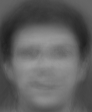

Image after NMF:


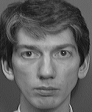

[[105. 107. 104. ... 105.  97. 105.]
 [107. 103. 107. ... 106. 101. 104.]
 [105. 105. 107. ... 103. 103. 100.]
 ...
 [ 75.  79.  75. ...  74.  77.  77.]
 [ 74.  80.  77. ...  72.  77.  77.]
 [ 77.  78.  77. ...  77.  76.  75.]]
Image Before NMF:
-------------------------------Number of image: 37
[[ 76.  76.  76. ...  71.  71.  71.]
 [ 76.  77.  77. ...  71.  71.  71.]
 [ 76.  77.  77. ...  72.  72.  71.]
 ...
 [171. 171. 172. ... 111. 109. 108.]
 [176. 177. 179. ... 116. 114. 113.]
 [180. 185. 187. ... 118. 115. 115.]]


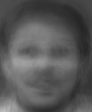

Image after NMF:


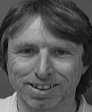

[[ 87.  93.  84. ...  78.  79.  77.]
 [ 91.  91.  91. ...  80.  80.  76.]
 [ 90.  88.  93. ...  81.  78.  80.]
 ...
 [201. 197. 198. ... 113. 122. 123.]
 [199. 196. 201. ... 119. 120. 125.]
 [199. 200. 201. ... 125. 117. 125.]]
Image Before NMF:
-------------------------------Number of image: 38
[[100. 101. 102. ... 101. 101. 101.]
 [101. 102. 102. ... 102. 101. 101.]
 [101. 101. 101. ... 101. 101. 101.]
 ...
 [ 94.  96.  98. ...  65.  66.  65.]
 [ 96.  97. 101. ...  65.  65.  67.]
 [ 96. 100. 102. ...  65.  65.  66.]]


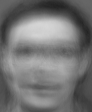

Image after NMF:


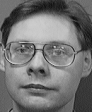

[[118. 114. 117. ... 112. 112. 105.]
 [115. 114. 114. ... 109. 112. 104.]
 [117. 115. 114. ... 110. 110. 112.]
 ...
 [ 97.  97.  95. ...  55.  53.  50.]
 [101.  97.  98. ...  60.  49.  54.]
 [ 96.  91.  98. ...  58.  54.  52.]]
Image Before NMF:
-------------------------------Number of image: 39
[[67. 67. 67. ... 70. 70. 70.]
 [67. 67. 68. ... 70. 70. 70.]
 [68. 67. 68. ... 70. 70. 70.]
 ...
 [54. 53. 53. ... 59. 58. 58.]
 [58. 56. 58. ... 59. 60. 60.]
 [60. 61. 62. ... 63. 62. 63.]]


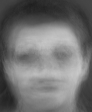

Image after NMF:


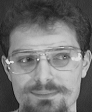

[[48. 45. 50. ... 57. 57. 54.]
 [46. 50. 47. ... 57. 52. 57.]
 [51. 47. 52. ... 54. 58. 52.]
 ...
 [46. 49. 47. ... 51. 47. 52.]
 [48. 48. 44. ... 45. 51. 46.]
 [50. 45. 45. ... 46. 50. 53.]]
Image Before NMF:
-------------------------------Number of image: 40
[[118. 119. 119. ... 114. 114. 114.]
 [118. 119. 119. ... 114. 114. 114.]
 [119. 119. 119. ... 114. 114. 114.]
 ...
 [134. 136. 139. ...  82.  82.  82.]
 [137. 139. 142. ...  83.  83.  84.]
 [138. 142. 144. ...  83.  84.  83.]]


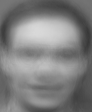

Image after NMF:


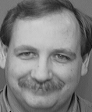

[[119. 120. 121. ... 114. 114. 115.]
 [122. 119. 121. ... 115. 113. 116.]
 [121. 120. 121. ... 113. 116. 112.]
 ...
 [142.  99. 118. ... 100. 101. 100.]
 [143.  97. 117. ... 101. 101. 104.]
 [141.  95. 111. ...  99. 100. 104.]]
Image Before NMF:
-------------------------------Number of image: 41
[[104. 105. 105. ... 100. 101. 100.]
 [105. 105. 106. ... 101. 100. 101.]
 [105. 105. 106. ... 101. 100. 100.]
 ...
 [178. 177. 178. ... 125. 123. 122.]
 [182. 181. 185. ... 128. 127. 127.]
 [185. 188. 192. ... 128. 128. 128.]]


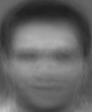

Image after NMF:


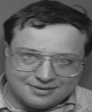

[[ 97.  99.  98. ...  87.  81.  86.]
 [101.  97. 100. ...  87.  80.  85.]
 [100. 100.  98. ...  85.  83.  84.]
 ...
 [ 56.  62.  66. ... 142. 143. 139.]
 [ 53.  68.  81. ... 138. 136. 139.]
 [ 68.  81.  91. ... 130. 119. 120.]]
Image Before NMF:
-------------------------------Number of image: 42
[[109. 109. 109. ... 116. 115. 115.]
 [110. 109. 108. ... 116. 116. 116.]
 [109. 109. 109. ... 115. 117. 117.]
 ...
 [ 72.  69.  71. ...  79.  80.  80.]
 [ 72.  70.  75. ...  81.  80.  81.]
 [ 73.  74.  77. ...  83.  81.  80.]]


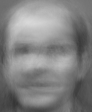

Image after NMF:


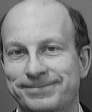

[[104. 105. 102. ... 113. 115. 113.]
 [102. 106. 100. ... 114. 114. 114.]
 [103. 104. 103. ... 117. 114. 113.]
 ...
 [ 77.  81.  87. ...  46.  53.  52.]
 [ 81.  80.  84. ...  17.  54.  51.]
 [ 85.  83.  83. ...  20.  28.  34.]]
Image Before NMF:
-------------------------------Number of image: 43
[[48. 47. 48. ... 46. 46. 46.]
 [48. 48. 48. ... 46. 46. 46.]
 [48. 48. 48. ... 46. 47. 46.]
 ...
 [72. 72. 74. ... 64. 64. 64.]
 [77. 79. 79. ... 68. 67. 65.]
 [80. 84. 85. ... 76. 73. 68.]]


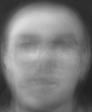

Image after NMF:


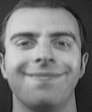

[[55. 52. 54. ... 39. 36. 37.]
 [54. 53. 48. ... 37. 38. 41.]
 [54. 53. 48. ... 36. 39. 38.]
 ...
 [41. 38. 36. ... 31. 34. 31.]
 [38. 35. 41. ... 35. 37. 30.]
 [40. 35. 38. ... 34. 35. 32.]]
Image Before NMF:
-------------------------------Number of image: 44
[[ 71.  72.  72. ...  62.  62.  62.]
 [ 71.  73.  73. ...  62.  62.  61.]
 [ 72.  72.  73. ...  63.  61.  61.]
 ...
 [ 87.  92.  93. ...  31.  31.  31.]
 [ 92.  95.  96. ...  32.  33.  32.]
 [ 94. 101. 100. ...  35.  35.  35.]]


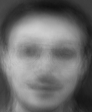

Image after NMF:


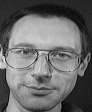

[[42. 40. 43. ... 34. 34. 37.]
 [39. 43. 36. ... 30. 40. 30.]
 [46. 35. 40. ... 33. 38. 35.]
 ...
 [52. 47. 34. ... 29. 19. 29.]
 [52. 49. 14. ... 23. 21. 22.]
 [63. 35. 14. ... 23. 23. 18.]]
Image Before NMF:
-------------------------------Number of image: 45
[[86. 85. 86. ... 80. 80. 80.]
 [86. 86. 87. ... 80. 80. 80.]
 [86. 86. 86. ... 80. 81. 80.]
 ...
 [33. 34. 32. ... 26. 27. 27.]
 [40. 38. 40. ... 30. 30. 28.]
 [45. 48. 48. ... 37. 34. 33.]]


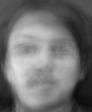

Image after NMF:


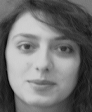

[[131. 128. 126. ... 118. 122. 119.]
 [127. 127. 127. ... 120. 117. 119.]
 [126. 125. 128. ... 122. 120. 119.]
 ...
 [ 57.  55.  51. ...  41.  43.  45.]
 [ 62.  57.  51. ...  44.  41.  39.]
 [ 57.  58.  55. ...  41.  40.  35.]]
Image Before NMF:
-------------------------------Number of image: 46
[[126. 126. 126. ... 121. 120. 120.]
 [126. 126. 126. ... 120. 120. 120.]
 [126. 126. 126. ... 120. 120. 120.]
 ...
 [112. 113. 116. ...  65.  64.  64.]
 [115. 116. 119. ...  65.  65.  66.]
 [117. 118. 121. ...  65.  66.  66.]]


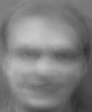

Image after NMF:


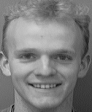

[[130. 132. 129. ... 119. 123. 124.]
 [132. 134. 131. ... 121. 121. 118.]
 [132. 131. 129. ... 121. 123. 123.]
 ...
 [106. 106. 111. ...  56.  49.  52.]
 [114. 116. 130. ...  54.  50.  54.]
 [109. 125. 129. ...  53.  50.  52.]]
Image Before NMF:
-------------------------------Number of image: 47
[[115. 115. 115. ... 120. 119. 120.]
 [115. 115. 114. ... 121. 121. 120.]
 [115. 115. 115. ... 119. 121. 121.]
 ...
 [ 60.  60.  62. ...  56.  57.  57.]
 [ 60.  60.  64. ...  56.  56.  58.]
 [ 61.  64.  65. ...  57.  56.  57.]]


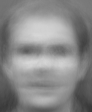

Image after NMF:


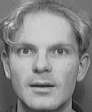

[[118. 123. 120. ... 113. 115. 113.]
 [120. 123. 119. ... 114. 114. 112.]
 [119. 124. 119. ... 115. 113. 114.]
 ...
 [ 94.  84.  90. ...  80.  85.  82.]
 [ 91.  88.  85. ...  81.  81.  82.]
 [ 75.  79.  83. ...  79.  81.  84.]]
Image Before NMF:
-------------------------------Number of image: 48
[[112. 113. 113. ... 106. 106. 105.]
 [112. 113. 113. ... 106. 106. 106.]
 [112. 113. 113. ... 106. 106. 106.]
 ...
 [138. 141. 144. ...  77.  77.  76.]
 [142. 145. 148. ...  78.  78.  78.]
 [143. 147. 150. ...  78.  79.  78.]]


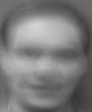

Image after NMF:


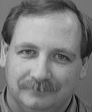

[[122. 124. 121. ... 116. 116. 116.]
 [118. 123. 122. ... 116. 115. 114.]
 [121. 125. 124. ... 116. 118. 115.]
 ...
 [ 68. 113. 131. ...  97.  85.  78.]
 [ 69. 106. 132. ...  91.  97.  88.]
 [ 64. 100. 126. ...  85.  98.  84.]]
Image Before NMF:
-------------------------------Number of image: 49
[[ 99.  99.  99. ...  99.  99.  99.]
 [ 99.  99.  99. ... 100.  99.  99.]
 [100.  99.  99. ...  99.  99. 100.]
 ...
 [ 90.  86.  90. ...  90.  91.  91.]
 [ 91.  90.  96. ...  93.  92.  92.]
 [ 93.  97. 100. ...  98.  97.  92.]]


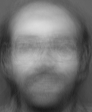

Image after NMF:


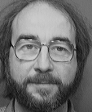

[[124. 121. 123. ... 111. 109. 112.]
 [126. 119. 125. ... 112. 109. 113.]
 [122. 122. 124. ... 112. 109. 113.]
 ...
 [119.  97. 130. ...  80.  80.  76.]
 [142.  95. 130. ...  78.  77.  77.]
 [132. 129. 132. ...  78.  76.  74.]]
Image Before NMF:
-------------------------------Number of image: 50
[[ 26.  26.  26. ...  22.  22.  22.]
 [ 26.  27.  27. ...  22.  22.  22.]
 [ 27.  27.  28. ...  22.  23.  22.]
 ...
 [204. 205. 207. ... 135. 132. 132.]
 [210. 214. 214. ... 141. 139. 137.]
 [213. 220. 222. ... 146. 143. 139.]]


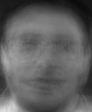

Image after NMF:


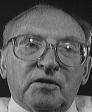

[[ 23.  24.  26. ...  18.  19.  19.]
 [ 25.  23.  25. ...  18.  21.  20.]
 [ 23.  24.  25. ...  18.  18.  22.]
 ...
 [203. 199. 203. ... 177. 182. 183.]
 [198. 193. 198. ... 182. 184. 186.]
 [200. 198. 195. ... 185. 187. 186.]]
Image Before NMF:
-------------------------------Number of image: 51
[[63. 64. 64. ... 68. 67. 67.]
 [64. 64. 64. ... 68. 68. 67.]
 [64. 64. 64. ... 67. 69. 68.]
 ...
 [56. 56. 56. ... 54. 54. 54.]
 [58. 57. 60. ... 54. 55. 55.]
 [60. 64. 64. ... 57. 57. 58.]]


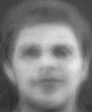

Image after NMF:


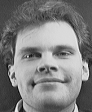

[[63. 67. 65. ... 78. 76. 79.]
 [68. 65. 65. ... 81. 72. 78.]
 [65. 63. 68. ... 77. 76. 76.]
 ...
 [53. 58. 51. ... 74. 65. 66.]
 [55. 56. 53. ... 68. 69. 81.]
 [62. 60. 66. ... 54. 61. 69.]]
Image Before NMF:
-------------------------------Number of image: 52
[[96. 95. 96. ... 96. 96. 96.]
 [96. 95. 96. ... 97. 96. 96.]
 [97. 96. 95. ... 96. 96. 97.]
 ...
 [87. 83. 86. ... 88. 89. 89.]
 [88. 86. 92. ... 91. 90. 90.]
 [89. 93. 96. ... 97. 95. 90.]]


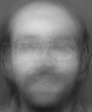

Image after NMF:


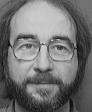

[[122. 122. 121. ... 117. 111. 113.]
 [125. 122. 124. ... 113. 112. 114.]
 [124. 122. 119. ... 116. 111. 114.]
 ...
 [107. 114. 129. ...  78.  83.  79.]
 [125.  93. 132. ...  81.  80.  80.]
 [125. 106. 112. ...  77.  77.  79.]]
Image Before NMF:
-------------------------------Number of image: 53
[[60. 61. 61. ... 54. 53. 53.]
 [60. 61. 61. ... 53. 53. 53.]
 [61. 61. 61. ... 54. 53. 53.]
 ...
 [71. 76. 78. ... 29. 30. 31.]
 [76. 80. 81. ... 31. 31. 30.]
 [78. 84. 84. ... 36. 36. 33.]]


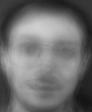

Image after NMF:


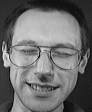

[[42. 44. 39. ... 39. 36. 36.]
 [42. 41. 42. ... 39. 40. 33.]
 [40. 47. 40. ... 42. 36. 33.]
 ...
 [71. 68. 65. ... 24. 20. 29.]
 [73. 70. 68. ... 21. 24. 28.]
 [74. 68. 70. ... 22. 28. 18.]]
Image Before NMF:
-------------------------------Number of image: 54
[[101. 101. 102. ... 102. 102. 102.]
 [101. 101. 102. ... 103. 102. 102.]
 [102. 101. 102. ... 102. 102. 102.]
 ...
 [142. 139. 141. ... 113. 112. 111.]
 [144. 142. 147. ... 115. 114. 115.]
 [146. 148. 152. ... 115. 115. 115.]]


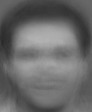

Image after NMF:


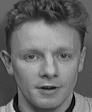

[[103. 102. 104. ... 103. 100. 101.]
 [105. 104. 106. ... 101. 102. 105.]
 [105. 101. 104. ... 101. 100. 104.]
 ...
 [157. 175. 177. ... 134. 152. 167.]
 [156. 177. 184. ... 137. 154. 173.]
 [149. 181. 187. ... 139. 152. 178.]]
Image Before NMF:
-------------------------------Number of image: 55
[[98. 98. 98. ... 91. 90. 90.]
 [98. 99. 99. ... 90. 90. 90.]
 [98. 98. 99. ... 91. 90. 90.]
 ...
 [50. 53. 53. ... 22. 22. 22.]
 [57. 58. 58. ... 25. 25. 23.]
 [61. 64. 64. ... 30. 28. 27.]]


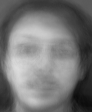

Image after NMF:


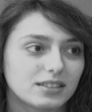

[[128. 125. 125. ... 115. 115. 118.]
 [125. 127. 124. ... 118. 116. 116.]
 [128. 126. 125. ... 116. 119. 115.]
 ...
 [ 47.  42.  37. ...  43.  27.  19.]
 [ 48.  44.  35. ...  36.  36.  20.]
 [ 47.  43.  41. ...  45.  31.  30.]]
Image Before NMF:
-------------------------------Number of image: 56
[[126. 126. 127. ... 124. 124. 124.]
 [126. 126. 127. ... 124. 124. 124.]
 [126. 126. 126. ... 124. 124. 124.]
 ...
 [ 65.  65.  66. ...  53.  55.  54.]
 [ 68.  66.  70. ...  54.  54.  55.]
 [ 69.  71.  73. ...  55.  55.  56.]]


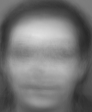

Image after NMF:


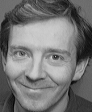

[[109. 111. 108. ... 110. 108. 109.]
 [111. 106. 110. ... 107. 107. 109.]
 [111. 108. 111. ... 110. 109. 111.]
 ...
 [ 72.  70.  79. ...  59.  60.  51.]
 [ 73.  70.  79. ...  57.  56.  52.]
 [ 71.  71.  84. ...  52.  55.  48.]]
Image Before NMF:
-------------------------------Number of image: 57
[[122. 123. 123. ... 115. 115. 114.]
 [123. 123. 123. ... 114. 114. 114.]
 [123. 123. 123. ... 115. 114. 114.]
 ...
 [107. 110. 110. ...  57.  57.  57.]
 [113. 114. 116. ...  59.  59.  59.]
 [116. 118. 120. ...  61.  60.  61.]]


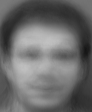

Image after NMF:


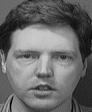

[[105. 109. 105. ... 104. 100. 101.]
 [108. 102. 105. ... 104.  98.  97.]
 [104. 106. 105. ... 101.  98. 101.]
 ...
 [148. 111.  83. ...  71.  64.  64.]
 [135.  86. 112. ...  49.  70.  73.]
 [113.  84. 125. ...  81.  57.  49.]]
Image Before NMF:
-------------------------------Number of image: 58
[[65. 65. 65. ... 72. 72. 72.]
 [65. 65. 65. ... 73. 72. 72.]
 [65. 64. 65. ... 72. 73. 72.]
 ...
 [77. 76. 76. ... 85. 84. 84.]
 [80. 78. 81. ... 86. 86. 87.]
 [82. 84. 85. ... 89. 87. 89.]]


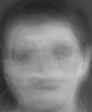

Image after NMF:


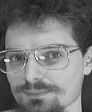

[[52. 41. 48. ... 55. 54. 54.]
 [49. 46. 48. ... 53. 56. 48.]
 [53. 46. 50. ... 54. 54. 53.]
 ...
 [47. 38. 48. ... 40. 53. 45.]
 [44. 43. 49. ... 43. 49. 47.]
 [51. 76. 83. ... 44. 43. 46.]]
Image Before NMF:
-------------------------------Number of image: 59
[[ 29.  29.  29. ...  25.  25.  25.]
 [ 29.  29.  30. ...  26.  26.  26.]
 [ 29.  30.  30. ...  26.  26.  26.]
 ...
 [214. 215. 217. ... 146. 143. 143.]
 [220. 224. 225. ... 152. 150. 147.]
 [223. 231. 233. ... 157. 155. 150.]]


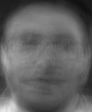

Image after NMF:


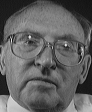

[[ 24.  26.  22. ...  19.  22.  17.]
 [ 27.  23.  27. ...  18.  24.  19.]
 [ 23.  28.  26. ...  23.  22.  21.]
 ...
 [198. 196. 192. ... 186. 189. 190.]
 [200. 198. 194. ... 185. 185. 181.]
 [201. 199. 196. ... 184. 180. 178.]]
Image Before NMF:
-------------------------------Number of image: 60
[[52. 52. 53. ... 45. 45. 45.]
 [52. 53. 52. ... 45. 45. 45.]
 [53. 53. 53. ... 45. 45. 45.]
 ...
 [79. 85. 86. ... 37. 36. 37.]
 [86. 90. 89. ... 39. 39. 37.]
 [88. 93. 93. ... 45. 44. 40.]]


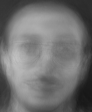

Image after NMF:


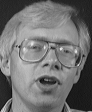

[[ 43.  39.  36. ...  37.  27.  36.]
 [ 38.  39.  40. ...  32.  32.  33.]
 [ 39.  34.  40. ...  30.  36.  33.]
 ...
 [ 22.  96. 164. ...  29.  26.  28.]
 [ 19. 186. 182. ...  38.  38.  31.]
 [112. 183. 208. ... 154. 155. 141.]]
Image Before NMF:
-------------------------------Number of image: 61
[[112. 111. 112. ... 105. 105. 105.]
 [112. 112. 112. ... 105. 104. 104.]
 [112. 111. 112. ... 105. 104. 104.]
 ...
 [ 18.  20.  19. ...  12.  12.  12.]
 [ 25.  23.  24. ...  12.  13.  13.]
 [ 28.  26.  27. ...  16.  16.  16.]]


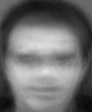

Image after NMF:


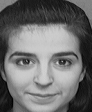

[[133. 135. 137. ... 129. 131. 134.]
 [136. 134. 134. ... 130. 130. 132.]
 [136. 135. 134. ... 130. 130. 129.]
 ...
 [ 18.  18.  24. ...  16.  17.  19.]
 [ 25.  21.  23. ...  17.  18.  19.]
 [ 22.  26.  24. ...  16.  19.  17.]]
Image Before NMF:
-------------------------------Number of image: 62
[[ 59.  60.  60. ...  51.  51.  51.]
 [ 60.  61.  61. ...  51.  51.  51.]
 [ 61.  61.  61. ...  51.  51.  50.]
 ...
 [108. 112. 114. ...  59.  59.  59.]
 [115. 119. 120. ...  63.  62.  60.]
 [118. 127. 127. ...  71.  69.  64.]]


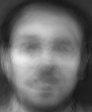

Image after NMF:


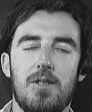

[[ 50.  46.  49. ...  43.  41.  36.]
 [ 46.  48.  52. ...  38.  44.  43.]
 [ 48.  49.  53. ...  37.  45.  38.]
 ...
 [ 62. 170. 224. ...  38.  34.  37.]
 [211. 214. 222. ...  31.  33.  32.]
 [210. 210. 218. ...  33.  33.  41.]]
Image Before NMF:
-------------------------------Number of image: 63
[[117. 116. 116. ... 111. 111. 111.]
 [117. 117. 116. ... 111. 111. 111.]
 [116. 117. 117. ... 111. 111. 111.]
 ...
 [122. 123. 123. ...  83.  81.  81.]
 [129. 129. 130. ...  85.  84.  83.]
 [132. 131. 134. ...  87.  86.  85.]]


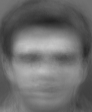

Image after NMF:


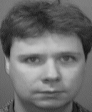

[[120. 119. 118. ... 128. 125. 124.]
 [119. 115. 119. ... 125. 125. 125.]
 [117. 120. 119. ... 123. 128. 124.]
 ...
 [110. 101. 106. ...  87.  91.  91.]
 [107.  98. 105. ...  82.  88.  88.]
 [119. 104. 111. ...  63.  73.  80.]]
Image Before NMF:
-------------------------------Number of image: 64
[[105. 105. 105. ... 105. 105. 105.]
 [105. 105. 105. ... 105. 105. 105.]
 [105. 105. 105. ... 105. 106. 105.]
 ...
 [136. 135. 136. ... 103. 102. 101.]
 [140. 138. 142. ... 106. 105. 105.]
 [142. 145. 148. ... 107. 105. 106.]]


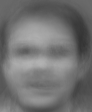

Image after NMF:


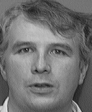

[[117. 122. 120. ... 114. 111. 118.]
 [117. 120. 121. ... 116. 113. 115.]
 [122. 123. 121. ... 116. 114. 114.]
 ...
 [207. 190. 193. ...  82.  75.  77.]
 [171. 190. 202. ...  78.  76.  77.]
 [157. 200. 203. ...  76.  78.  71.]]
Image Before NMF:
-------------------------------Number of image: 65
[[110. 111. 111. ... 109. 109. 109.]
 [111. 111. 111. ... 109. 109. 109.]
 [111. 111. 111. ... 109. 109. 109.]
 ...
 [ 72.  72.  75. ...  53.  54.  54.]
 [ 73.  73.  77. ...  53.  53.  54.]
 [ 74.  76.  78. ...  54.  54.  54.]]


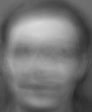

Image after NMF:


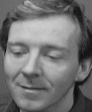

[[105. 102. 108. ... 105. 106. 105.]
 [101. 103.  99. ... 106. 108. 104.]
 [106. 101. 107. ... 103. 110. 107.]
 ...
 [ 79.  74.  70. ...  43.  36.  43.]
 [ 73.  69.  73. ...  37.  38.  41.]
 [ 68.  73.  71. ...  42.  35.  37.]]
Image Before NMF:
-------------------------------Number of image: 66
[[101. 101. 102. ... 101. 101. 101.]
 [102. 101. 102. ... 102. 101. 101.]
 [102. 102. 101. ... 102. 102. 102.]
 ...
 [ 85.  82.  85. ...  84.  85.  85.]
 [ 87.  85.  91. ...  86.  86.  86.]
 [ 89.  93.  95. ...  91.  90.  87.]]


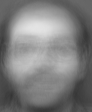

Image after NMF:


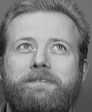

[[112. 109. 111. ... 112. 110. 113.]
 [109. 111. 112. ... 114. 112. 111.]
 [109. 111. 111. ... 110. 113. 110.]
 ...
 [ 93.  79.  72. ...  75.  75.  75.]
 [ 96.  78.  67. ...  71.  77.  73.]
 [ 96.  81.  60. ...  74.  75.  74.]]
Image Before NMF:
-------------------------------Number of image: 67
[[92. 91. 92. ... 88. 88. 88.]
 [92. 92. 93. ... 88. 87. 87.]
 [92. 92. 92. ... 88. 88. 87.]
 ...
 [27. 28. 26. ... 22. 23. 23.]
 [34. 32. 33. ... 26. 26. 24.]
 [38. 41. 41. ... 32. 29. 29.]]


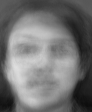

Image after NMF:


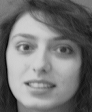

[[126. 130. 131. ... 121. 121. 121.]
 [128. 127. 132. ... 121. 120. 120.]
 [129. 127. 131. ... 120. 122. 120.]
 ...
 [ 47.  46.  48. ...  34.  44.  45.]
 [ 48.  46.  44. ...  40.  49.  41.]
 [ 52.  46.  48. ...  43.  51.  48.]]
Image Before NMF:
-------------------------------Number of image: 68
[[48. 48. 48. ... 55. 54. 55.]
 [48. 48. 48. ... 56. 55. 55.]
 [48. 48. 49. ... 55. 56. 56.]
 ...
 [31. 32. 33. ... 41. 42. 42.]
 [32. 33. 34. ... 42. 42. 42.]
 [33. 37. 37. ... 44. 43. 44.]]


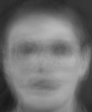

Image after NMF:


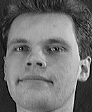

[[46. 41. 45. ... 49. 39. 51.]
 [47. 45. 47. ... 45. 50. 45.]
 [46. 48. 46. ... 50. 48. 49.]
 ...
 [40. 41. 38. ... 39. 37. 38.]
 [38. 43. 45. ... 41. 35. 40.]
 [36. 40. 38. ... 37. 34. 43.]]
Image Before NMF:
-------------------------------Number of image: 69
[[85. 85. 86. ... 82. 81. 81.]
 [85. 86. 86. ... 82. 81. 81.]
 [86. 85. 86. ... 82. 82. 81.]
 ...
 [57. 61. 61. ... 33. 34. 34.]
 [64. 66. 66. ... 37. 36. 35.]
 [67. 73. 72. ... 42. 39. 39.]]


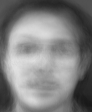

Image after NMF:


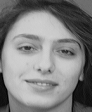

[[114. 115. 115. ... 110. 106. 109.]
 [114. 114. 112. ... 110. 111. 106.]
 [115. 112. 112. ... 110. 109. 107.]
 ...
 [ 54.  57.  59. ...  76.  72.  71.]
 [ 62.  68.  66. ...  78.  78.  72.]
 [ 68.  74.  76. ...  78.  85.  77.]]
Image Before NMF:
-------------------------------Number of image: 70
[[ 97.  97.  98. ...  96.  96.  96.]
 [ 97.  98.  97. ...  96.  96.  96.]
 [ 97.  97.  98. ...  96.  97.  96.]
 ...
 [108. 114. 116. ...  58.  58.  58.]
 [113. 118. 117. ...  60.  59.  59.]
 [114. 118. 118. ...  59.  58.  59.]]


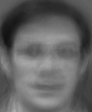

Image after NMF:


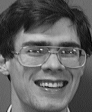

[[109. 110. 113. ... 108. 112. 107.]
 [111. 112. 112. ... 108. 108. 107.]
 [112. 111. 112. ... 108. 108. 108.]
 ...
 [ 94. 101. 101. ...  57.  51.  53.]
 [ 99.  97. 102. ...  49.  51.  57.]
 [ 97.  95. 101. ...  49.  52.  51.]]
Image Before NMF:
-------------------------------Number of image: 71
[[50. 50. 50. ... 54. 54. 54.]
 [50. 50. 51. ... 55. 54. 54.]
 [51. 50. 51. ... 54. 55. 55.]
 ...
 [40. 39. 38. ... 48. 48. 48.]
 [41. 39. 42. ... 48. 49. 49.]
 [43. 46. 46. ... 51. 51. 52.]]


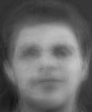

Image after NMF:


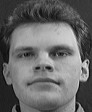

[[48. 42. 52. ... 58. 52. 54.]
 [46. 46. 47. ... 62. 50. 54.]
 [44. 49. 48. ... 55. 58. 55.]
 ...
 [34. 32. 31. ... 52. 51. 44.]
 [33. 36. 32. ... 48. 52. 49.]
 [32. 35. 29. ... 46. 51. 48.]]
Image Before NMF:
-------------------------------Number of image: 72
[[112. 112. 112. ... 116. 115. 115.]
 [111. 112. 110. ... 116. 117. 116.]
 [112. 112. 112. ... 115. 117. 117.]
 ...
 [ 72.  75.  79. ...  57.  58.  58.]
 [ 74.  77.  79. ...  56.  56.  58.]
 [ 73.  76.  78. ...  57.  57.  57.]]


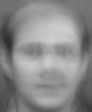

Image after NMF:


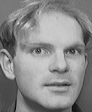

[[121. 119. 121. ... 112. 116. 111.]
 [118. 122. 121. ... 112. 116. 113.]
 [121. 120. 120. ... 113. 114. 114.]
 ...
 [ 87.  76.  74. ...  83.  83.  82.]
 [ 81.  71.  71. ...  83.  83.  82.]
 [ 82.  65.  66. ...  83.  80.  86.]]
Image Before NMF:
-------------------------------Number of image: 73
[[ 88.  88.  88. ...  84.  84.  84.]
 [ 88.  89.  88. ...  84.  84.  84.]
 [ 88.  89.  89. ...  84.  85.  84.]
 ...
 [152. 156. 157. ...  86.  85.  84.]
 [158. 163. 162. ...  90.  89.  87.]
 [161. 164. 165. ...  91.  89.  88.]]


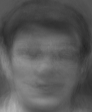

Image after NMF:


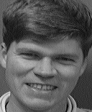

[[ 93.  92.  98. ... 101.  99. 102.]
 [ 96.  94.  92. ... 102.  99. 102.]
 [ 93.  92.  94. ...  99. 101. 100.]
 ...
 [205. 169. 187. ...  84.  56.  61.]
 [205. 186. 170. ... 118. 111. 113.]
 [203. 196. 179. ... 118. 119. 130.]]
Image Before NMF:
-------------------------------Number of image: 74
[[ 40.  41.  41. ...  40.  39.  39.]
 [ 40.  41.  41. ...  40.  40.  40.]
 [ 41.  41.  42. ...  40.  41.  40.]
 ...
 [130. 132. 132. ...  91.  89.  89.]
 [135. 138. 139. ...  95.  94.  92.]
 [138. 145. 146. ... 100.  97.  96.]]


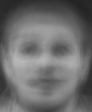

Image after NMF:


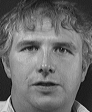

[[ 45.  38.  40. ...  38.  36.  42.]
 [ 44.  41.  40. ...  38.  37.  39.]
 [ 45.  35.  41. ...  37.  35.  40.]
 ...
 [201. 180. 199. ...  40.  41.  41.]
 [185. 188. 210. ...  21.  41.  41.]
 [184. 210. 194. ... 135.  24.  36.]]
Image Before NMF:
-------------------------------Number of image: 75
[[71. 71. 71. ... 73. 73. 74.]
 [71. 71. 71. ... 74. 73. 73.]
 [71. 71. 71. ... 73. 74. 73.]
 ...
 [48. 48. 47. ... 51. 50. 50.]
 [52. 51. 52. ... 52. 52. 52.]
 [55. 56. 56. ... 56. 54. 54.]]


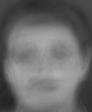

Image after NMF:


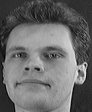

[[46. 45. 47. ... 47. 46. 48.]
 [45. 48. 42. ... 46. 46. 47.]
 [46. 48. 45. ... 49. 46. 49.]
 ...
 [42. 38. 42. ... 48. 46. 40.]
 [41. 43. 41. ... 51. 48. 44.]
 [40. 37. 43. ... 46. 50. 50.]]
Image Before NMF:
-------------------------------Number of image: 76
[[ 57.  56.  57. ...  52.  53.  52.]
 [ 57.  57.  58. ...  53.  52.  53.]
 [ 58.  57.  57. ...  53.  53.  52.]
 ...
 [ 92.  89.  91. ...  84.  84.  84.]
 [ 96.  95.  99. ...  88.  87.  85.]
 [ 99. 104. 106. ...  97.  94.  88.]]


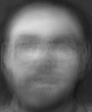

Image after NMF:


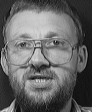

[[ 51.  46.  48. ...  33.  40.  39.]
 [ 46.  50.  44. ...  37.  43.  38.]
 [ 48.  47.  45. ...  38.  38.  37.]
 ...
 [ 46.  31.  72. ... 104. 114. 121.]
 [ 91. 100. 176. ... 145. 122. 121.]
 [148. 197. 197. ... 196. 173. 110.]]
Image Before NMF:
-------------------------------Number of image: 77
[[130. 130. 130. ... 128. 128. 127.]
 [131. 130. 130. ... 128. 128. 127.]
 [130. 131. 130. ... 128. 128. 128.]
 ...
 [116. 114. 116. ...  84.  83.  82.]
 [118. 117. 121. ...  85.  85.  85.]
 [120. 120. 124. ...  85.  85.  85.]]


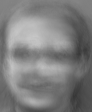

Image after NMF:


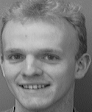

[[133. 132. 131. ... 124. 123. 120.]
 [133. 130. 130. ... 123. 123. 123.]
 [131. 132. 130. ... 123. 122. 125.]
 ...
 [105.  99. 106. ...  52.  53.  55.]
 [106. 101. 107. ...  51.  54.  52.]
 [108. 112. 116. ...  53.  48.  58.]]
Image Before NMF:
-------------------------------Number of image: 78
[[93. 92. 93. ... 91. 91. 92.]
 [93. 93. 93. ... 92. 91. 91.]
 [93. 92. 93. ... 91. 92. 91.]
 ...
 [21. 21. 20. ... 31. 32. 32.]
 [27. 25. 27. ... 35. 34. 33.]
 [31. 34. 34. ... 42. 38. 37.]]


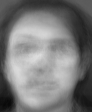

Image after NMF:


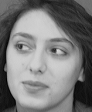

[[116. 116. 117. ... 115. 110. 114.]
 [116. 114. 116. ... 113. 110. 112.]
 [116. 112. 117. ... 114. 111. 110.]
 ...
 [ 23.  22.  28. ...  74.  69.  61.]
 [ 27.  29.  29. ...  76.  76.  66.]
 [ 28.  27.  38. ...  83.  76.  77.]]
Image Before NMF:
-------------------------------Number of image: 79
[[147. 146. 146. ... 148. 148. 149.]
 [147. 146. 145. ... 148. 149. 149.]
 [146. 146. 146. ... 148. 149. 149.]
 ...
 [161. 160. 161. ... 132. 129. 129.]
 [168. 167. 169. ... 135. 133. 133.]
 [171. 170. 174. ... 136. 134. 134.]]


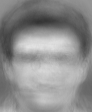

Image after NMF:


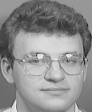

[[155. 154. 153. ... 150. 151. 150.]
 [152. 154. 151. ... 151. 150. 149.]
 [155. 154. 154. ... 151. 150. 151.]
 ...
 [133. 140. 150. ... 111. 111. 110.]
 [161. 145. 141. ... 115. 110. 111.]
 [165. 141. 156. ... 113. 110. 111.]]
Image Before NMF:
-------------------------------Number of image: 80
[[ 60.  59.  59. ...  57.  57.  56.]
 [ 60.  59.  59. ...  57.  57.  57.]
 [ 61.  60.  59. ...  57.  57.  57.]
 ...
 [111. 107. 111. ... 106. 104. 105.]
 [114. 115. 118. ... 110. 108. 106.]
 [117. 121. 124. ... 119. 117. 108.]]


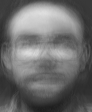

Image after NMF:


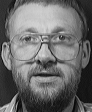

[[ 50.  49.  50. ...  41.  42.  38.]
 [ 55.  46.  50. ...  39.  39.  36.]
 [ 50.  49.  49. ...  37.  42.  38.]
 ...
 [183. 165. 145. ... 118. 114. 105.]
 [133. 148. 155. ... 120. 118. 116.]
 [144. 150. 169. ... 159. 111. 117.]]
Image Before NMF:
-------------------------------Number of image: 81
[[ 31.  31.  31. ...  32.  31.  32.]
 [ 32.  31.  31. ...  32.  32.  32.]
 [ 31.  32.  32. ...  32.  33.  33.]
 ...
 [177. 176. 176. ... 134. 131. 131.]
 [181. 182. 184. ... 138. 137. 135.]
 [184. 189. 191. ... 142. 140. 138.]]


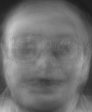

Image after NMF:


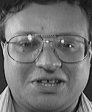

[[ 37.  36.  34. ...  30.  33.  34.]
 [ 44.  35.  40. ...  34.  31.  38.]
 [ 40.  35.  42. ...  30.  33.  35.]
 ...
 [215. 167. 154. ... 201. 211. 166.]
 [204. 159. 164. ... 186. 212. 189.]
 [189. 155. 179. ... 160. 207. 210.]]
Image Before NMF:
-------------------------------Number of image: 82
[[73. 73. 73. ... 76. 76. 77.]
 [73. 73. 73. ... 77. 76. 77.]
 [73. 72. 73. ... 76. 77. 77.]
 ...
 [61. 60. 59. ... 66. 65. 66.]
 [65. 63. 65. ... 68. 68. 67.]
 [68. 68. 69. ... 71. 69. 70.]]


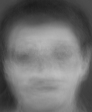

Image after NMF:


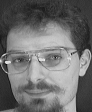

[[ 47.  43.  48. ...  50.  53.  55.]
 [ 47.  46.  48. ...  52.  51.  52.]
 [ 46.  49.  45. ...  54.  52.  55.]
 ...
 [ 47.  47.  42. ...  47.  48.  49.]
 [ 44.  57.  59. ...  49.  50.  50.]
 [102. 115. 122. ...  45.  49.  50.]]
Image Before NMF:
-------------------------------Number of image: 83
[[ 52.  51.  51. ...  45.  45.  45.]
 [ 52.  52.  52. ...  45.  45.  45.]
 [ 52.  52.  52. ...  46.  46.  45.]
 ...
 [ 82.  83.  84. ...  67.  66.  67.]
 [ 89.  91.  92. ...  72.  71.  67.]
 [ 93.  99. 100. ...  83.  79.  72.]]


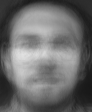

Image after NMF:


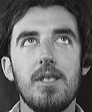

[[51. 48. 43. ... 43. 42. 38.]
 [44. 48. 46. ... 43. 42. 36.]
 [51. 45. 50. ... 40. 38. 43.]
 ...
 [60. 48. 56. ... 26. 28. 35.]
 [52. 50. 55. ... 31. 26. 32.]
 [47. 50. 47. ... 29. 28. 32.]]
Image Before NMF:
-------------------------------Number of image: 84
[[127. 127. 127. ... 125. 125. 125.]
 [127. 127. 127. ... 125. 125. 125.]
 [127. 127. 127. ... 125. 125. 125.]
 ...
 [115. 113. 116. ...  82.  82.  82.]
 [117. 116. 120. ...  84.  83.  84.]
 [119. 119. 123. ...  84.  83.  83.]]


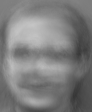

Image after NMF:


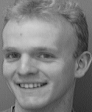

[[131. 133. 128. ... 124. 122. 126.]
 [130. 133. 131. ... 121. 123. 124.]
 [130. 134. 130. ... 122. 121. 121.]
 ...
 [104. 104. 102. ...  55.  50.  57.]
 [104. 102. 107. ...  57.  52.  59.]
 [111. 113. 117. ...  54.  53.  56.]]
Image Before NMF:
-------------------------------Number of image: 85
[[147. 146. 146. ... 148. 148. 148.]
 [147. 146. 145. ... 147. 148. 148.]
 [146. 146. 146. ... 147. 149. 148.]
 ...
 [169. 168. 169. ... 136. 133. 133.]
 [176. 176. 177. ... 140. 138. 137.]
 [181. 179. 183. ... 142. 139. 138.]]


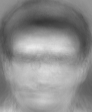

Image after NMF:


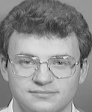

[[156. 158. 155. ... 153. 149. 152.]
 [156. 155. 156. ... 152. 152. 152.]
 [155. 156. 155. ... 150. 152. 148.]
 ...
 [133. 142. 151. ... 113. 113. 112.]
 [158. 198. 216. ... 111. 111. 112.]
 [219. 219. 217. ... 113. 110. 108.]]
Image Before NMF:
-------------------------------Number of image: 86
[[38. 38. 39. ... 33. 32. 32.]
 [38. 39. 38. ... 33. 33. 33.]
 [39. 39. 39. ... 33. 33. 33.]
 ...
 [67. 73. 76. ... 29. 29. 30.]
 [72. 79. 78. ... 31. 31. 29.]
 [74. 81. 80. ... 37. 37. 32.]]


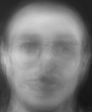

Image after NMF:


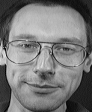

[[46. 42. 46. ... 36. 37. 43.]
 [43. 45. 44. ... 46. 35. 36.]
 [42. 40. 47. ... 39. 39. 39.]
 ...
 [62. 49. 53. ... 25. 26. 25.]
 [60. 55. 48. ... 22. 23. 27.]
 [62. 52. 52. ... 39. 22. 14.]]
Image Before NMF:
-------------------------------Number of image: 87
[[ 95.  96.  96. ...  93.  93.  93.]
 [ 96.  96.  96. ...  93.  93.  93.]
 [ 96.  96.  96. ...  94.  93.  93.]
 ...
 [131. 133. 134. ...  86.  86.  85.]
 [136. 137. 139. ...  89.  88.  88.]
 [138. 141. 143. ...  89.  88.  89.]]


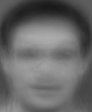

Image after NMF:


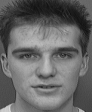

[[106. 106. 110. ... 104. 105. 103.]
 [107. 106. 108. ... 102. 104. 102.]
 [107. 107. 107. ... 101. 104. 103.]
 ...
 [132. 177. 200. ...  69.  69.  69.]
 [185. 198. 203. ...  69.  68.  68.]
 [188. 199. 204. ...  69.  69.  68.]]
Image Before NMF:
-------------------------------Number of image: 88
[[113. 113. 113. ... 111. 111. 111.]
 [113. 113. 113. ... 112. 111. 111.]
 [113. 112. 113. ... 111. 111. 111.]
 ...
 [ 89.  89.  90. ...  68.  67.  67.]
 [ 92.  92.  94. ...  67.  68.  69.]
 [ 94.  95.  97. ...  69.  69.  70.]]


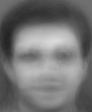

Image after NMF:


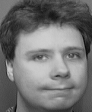

[[122. 121. 121. ... 119. 120. 121.]
 [122. 124. 124. ... 119. 120. 122.]
 [122. 123. 122. ... 118. 121. 122.]
 ...
 [ 73.  75.  75. ...  83.  83.  85.]
 [ 74.  72.  75. ...  78.  83.  79.]
 [ 74.  73.  72. ...  78.  78.  80.]]
Image Before NMF:
-------------------------------Number of image: 89
[[ 32.  32.  32. ...  30.  29.  30.]
 [ 32.  32.  32. ...  30.  30.  30.]
 [ 32.  33.  33. ...  30.  31.  30.]
 ...
 [208. 208. 210. ... 146. 142. 142.]
 [213. 217. 218. ... 151. 149. 147.]
 [216. 223. 225. ... 156. 153. 149.]]


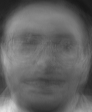

Image after NMF:


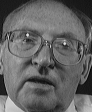

[[ 28.  25.  27. ...  20.  22.  23.]
 [ 24.  27.  27. ...  18.  24.  22.]
 [ 28.  26.  27. ...  24.  22.  23.]
 ...
 [188. 180. 171. ... 183. 188. 188.]
 [190. 185. 173. ... 185. 188. 190.]
 [194. 186. 178. ... 187. 187. 190.]]
Image Before NMF:
-------------------------------Number of image: 90
[[122. 123. 123. ... 115. 115. 115.]
 [123. 124. 123. ... 115. 115. 115.]
 [123. 123. 123. ... 116. 115. 115.]
 ...
 [105. 109. 110. ...  52.  53.  52.]
 [111. 112. 114. ...  54.  54.  54.]
 [113. 117. 118. ...  55.  55.  56.]]


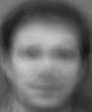

Image after NMF:


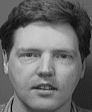

[[106. 104. 104. ... 100.  94. 102.]
 [108. 106. 105. ...  97.  98. 101.]
 [104. 106. 101. ... 101.  96. 101.]
 ...
 [126. 125. 151. ...  43.  40.  38.]
 [ 99. 119. 142. ...  61.  59.  54.]
 [115. 152. 106. ...  74.  66.  68.]]
Image Before NMF:
-------------------------------Number of image: 91
[[113. 113. 114. ... 113. 113. 112.]
 [114. 113. 114. ... 113. 113. 113.]
 [114. 114. 113. ... 113. 112. 113.]
 ...
 [111. 107. 111. ...  96.  96.  96.]
 [111. 109. 116. ...  95.  95.  97.]
 [112. 114. 118. ...  97.  98.  97.]]


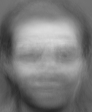

Image after NMF:


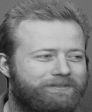

[[108. 108. 111. ... 107. 112. 108.]
 [111. 111. 111. ... 113. 110. 109.]
 [112. 111. 110. ... 112. 111. 109.]
 ...
 [ 98.  94.  88. ...  69.  67.  68.]
 [ 99.  92.  85. ...  63.  74.  73.]
 [101.  87.  97. ...  64.  71.  75.]]
Image Before NMF:
-------------------------------Number of image: 92
[[ 91.  91.  91. ...  89.  89.  89.]
 [ 91.  91.  91. ...  88.  89.  89.]
 [ 91.  91.  91. ...  89.  89.  88.]
 ...
 [115. 115. 116. ...  79.  78.  77.]
 [120. 120. 121. ...  83.  81.  80.]
 [123. 123. 125. ...  83.  82.  81.]]


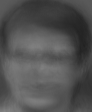

Image after NMF:


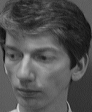

[[ 98. 103.  98. ...  93.  92.  95.]
 [104. 100. 104. ...  93.  95.  93.]
 [102. 100.  99. ...  97.  93.  93.]
 ...
 [ 95.  88.  94. ...  50.  50.  50.]
 [ 93.  91.  95. ...  55.  49.  54.]
 [ 94.  93.  96. ...  57.  50.  48.]]
Image Before NMF:
-------------------------------Number of image: 93
[[ 35.  36.  35. ...  33.  32.  32.]
 [ 36.  36.  36. ...  33.  33.  33.]
 [ 36.  37.  37. ...  33.  34.  33.]
 ...
 [194. 195. 197. ... 133. 130. 130.]
 [199. 203. 204. ... 137. 136. 133.]
 [202. 208. 210. ... 142. 140. 135.]]


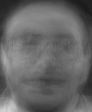

Image after NMF:


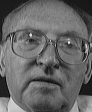

[[ 28.  25.  28. ...  23.  21.  24.]
 [ 29.  27.  25. ...  22.  22.  20.]
 [ 29.  27.  24. ...  24.  20.  23.]
 ...
 [202. 200. 190. ... 168. 171. 175.]
 [201. 201. 192. ... 178. 173. 176.]
 [193. 202. 189. ... 182. 183. 178.]]
Image Before NMF:
-------------------------------Number of image: 94
[[128. 128. 129. ... 125. 126. 125.]
 [128. 129. 129. ... 126. 125. 125.]
 [128. 128. 128. ... 126. 125. 125.]
 ...
 [117. 116. 117. ...  85.  85.  84.]
 [120. 118. 123. ...  86.  86.  87.]
 [122. 124. 127. ...  86.  86.  87.]]


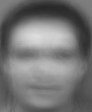

Image after NMF:


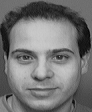

[[111. 114. 112. ... 112. 108. 110.]
 [112. 113. 111. ... 112. 111. 111.]
 [113. 109. 112. ... 109. 111. 108.]
 ...
 [141. 135. 133. ...  84.  84.  84.]
 [137. 135. 136. ...  89.  90.  88.]
 [138. 135. 138. ...  88.  86.  92.]]
Image Before NMF:
-------------------------------Number of image: 95
[[60. 60. 61. ... 64. 63. 64.]
 [60. 60. 61. ... 64. 64. 64.]
 [60. 60. 61. ... 64. 64. 64.]
 ...
 [30. 30. 30. ... 35. 36. 36.]
 [31. 30. 33. ... 35. 36. 37.]
 [32. 35. 36. ... 37. 37. 39.]]


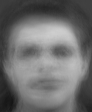

Image after NMF:


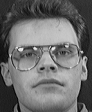

[[45. 45. 48. ... 53. 51. 54.]
 [46. 42. 49. ... 53. 52. 55.]
 [44. 48. 45. ... 48. 58. 48.]
 ...
 [34. 32. 33. ... 47. 42. 38.]
 [37. 29. 34. ... 59. 52. 47.]
 [37. 31. 36. ... 76. 79. 70.]]
Image Before NMF:
-------------------------------Number of image: 96
[[48. 49. 49. ... 54. 54. 54.]
 [49. 49. 49. ... 55. 54. 54.]
 [49. 48. 49. ... 54. 55. 55.]
 ...
 [41. 40. 39. ... 52. 52. 52.]
 [42. 40. 43. ... 52. 52. 53.]
 [43. 46. 47. ... 54. 54. 56.]]


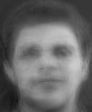

Image after NMF:


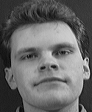

[[48. 43. 51. ... 55. 56. 58.]
 [46. 46. 44. ... 59. 58. 59.]
 [44. 44. 46. ... 58. 59. 59.]
 ...
 [30. 35. 34. ... 41. 39. 53.]
 [29. 37. 33. ... 41. 38. 44.]
 [33. 34. 35. ... 45. 42. 39.]]
Image Before NMF:
-------------------------------Number of image: 97
[[ 94.  94.  94. ...  92.  92.  92.]
 [ 94.  94.  94. ...  92.  92.  92.]
 [ 94.  94.  95. ...  92.  92.  92.]
 ...
 [ 99. 101. 101. ...  65.  65.  64.]
 [104. 105. 106. ...  68.  67.  67.]
 [107. 107. 109. ...  69.  67.  68.]]


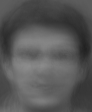

Image after NMF:


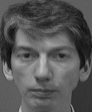

[[ 98. 100.  99. ...  93.  92.  96.]
 [ 97. 103.  99. ...  94.  93.  96.]
 [ 98.  97.  98. ...  92.  93.  95.]
 ...
 [ 85.  92.  91. ...  50.  56.  48.]
 [ 85.  94.  87. ...  52.  50.  50.]
 [ 90.  91.  92. ...  53.  48.  52.]]
Image Before NMF:
-------------------------------Number of image: 98
[[119. 119. 119. ... 126. 126. 126.]
 [119. 119. 119. ... 127. 127. 126.]
 [120. 119. 119. ... 126. 127. 127.]
 ...
 [ 84.  81.  83. ...  92.  92.  92.]
 [ 86.  83.  88. ...  94.  93.  94.]
 [ 87.  88.  91. ...  95.  93.  94.]]


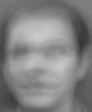

Image after NMF:


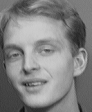

[[119. 120. 120. ... 129. 128. 124.]
 [118. 121. 120. ... 126. 124. 127.]
 [120. 119. 118. ... 121. 128. 127.]
 ...
 [ 64.  61.  64. ...  89.  92.  88.]
 [ 64.  63.  58. ...  93.  90.  92.]
 [ 65.  61.  63. ...  89.  94.  85.]]
Image Before NMF:
-------------------------------Number of image: 99
[[106. 107. 107. ... 103. 103. 103.]
 [107. 107. 108. ... 103. 103. 103.]
 [107. 107. 107. ... 104. 103. 103.]
 ...
 [165. 163. 165. ... 117. 116. 115.]
 [168. 167. 171. ... 119. 119. 119.]
 [171. 173. 176. ... 120. 120. 120.]]


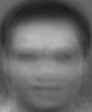

Image after NMF:


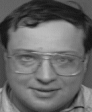

[[ 98.  98. 101. ...  89.  91.  92.]
 [ 96.  97.  98. ...  91.  89.  91.]
 [ 99.  98.  97. ...  92.  87.  90.]
 ...
 [134. 152. 140. ... 146. 140. 136.]
 [139. 152. 141. ... 144. 135. 141.]
 [144. 146. 146. ... 130. 150. 157.]]
Image Before NMF:
-------------------------------Number of image: 100
[[44. 44. 45. ... 36. 36. 35.]
 [44. 45. 44. ... 35. 36. 36.]
 [45. 45. 45. ... 36. 36. 36.]
 ...
 [78. 86. 89. ... 27. 27. 28.]
 [84. 91. 90. ... 28. 29. 27.]
 [85. 92. 91. ... 34. 35. 30.]]


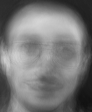

Image after NMF:


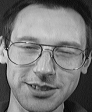

[[46. 45. 42. ... 36. 40. 36.]
 [37. 49. 45. ... 39. 42. 38.]
 [51. 39. 50. ... 37. 43. 32.]
 ...
 [58. 54. 50. ... 23. 25. 23.]
 [58. 53. 50. ... 21. 26. 26.]
 [61. 49. 55. ... 24. 21. 24.]]
Image Before NMF:
-------------------------------Number of image: 101
[[110. 110. 111. ... 111. 110. 110.]
 [110. 110. 110. ... 111. 111. 110.]
 [110. 110. 110. ... 110. 110. 111.]
 ...
 [ 67.  69.  73. ...  47.  49.  49.]
 [ 68.  70.  73. ...  46.  47.  49.]
 [ 68.  70.  72. ...  46.  48.  47.]]


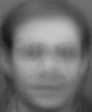

Image after NMF:


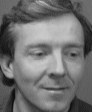

[[101. 106. 102. ... 108. 107. 108.]
 [101. 104. 102. ... 106. 108. 105.]
 [ 99. 104. 102. ... 108. 106. 111.]
 ...
 [ 64.  69.  75. ...  42.  48.  48.]
 [ 74.  81.  85. ...  46.  48.  44.]
 [ 77.  83.  84. ...  46.  50.  45.]]
Image Before NMF:
-------------------------------Number of image: 102
[[ 57.  56.  56. ...  53.  53.  52.]
 [ 57.  56.  56. ...  53.  53.  53.]
 [ 57.  57.  56. ...  53.  53.  53.]
 ...
 [113. 111. 115. ... 102. 100. 101.]
 [117. 118. 121. ... 105. 103. 101.]
 [119. 123. 126. ... 114. 112. 103.]]


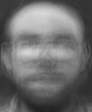

Image after NMF:


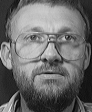

[[ 52.  39.  51. ...  41.  41.  42.]
 [ 53.  49.  49. ...  42.  40.  42.]
 [ 48.  49.  49. ...  41.  42.  35.]
 ...
 [145. 154. 117. ... 104. 104. 102.]
 [165. 153.  97. ... 120. 100. 107.]
 [147. 126. 169. ... 133. 138. 103.]]
Image Before NMF:
-------------------------------Number of image: 103
[[127. 126. 127. ... 120. 120. 120.]
 [127. 127. 126. ... 120. 119. 119.]
 [127. 126. 126. ... 120. 119. 119.]
 ...
 [ 17.  18.  18. ...  11.  12.  12.]
 [ 24.  22.  23. ...  12.  12.  12.]
 [ 27.  24.  25. ...  15.  14.  14.]]


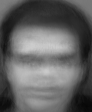

Image after NMF:


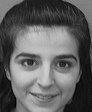

[[138. 135. 135. ... 128. 129. 126.]
 [136. 135. 136. ... 130. 128. 126.]
 [134. 135. 134. ... 132. 128. 128.]
 ...
 [ 43.  26.  28. ...  14.  22.  22.]
 [ 37.  27.  26. ...  16.  23.  25.]
 [ 39.  27.  26. ...  23.  18.  35.]]
Image Before NMF:
-------------------------------Number of image: 104
[[ 96.  97.  97. ...  94.  94.  94.]
 [ 97.  97.  97. ...  94.  94.  94.]
 [ 97.  97.  97. ...  94.  94.  94.]
 ...
 [157. 156. 158. ... 108. 107. 107.]
 [161. 161. 164. ... 112. 111. 110.]
 [163. 166. 169. ... 113. 111. 111.]]


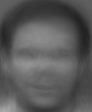

Image after NMF:


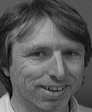

[[ 93.  93.  88. ...  84.  81.  82.]
 [ 91.  89.  92. ...  82.  82.  82.]
 [ 92.  90.  93. ...  83.  83.  77.]
 ...
 [205. 202. 202. ... 110. 106. 109.]
 [205. 204. 203. ... 108. 111. 109.]
 [203. 205. 204. ... 112. 111. 111.]]
Image Before NMF:
-------------------------------Number of image: 105
[[150. 150. 150. ... 152. 152. 152.]
 [151. 150. 149. ... 152. 152. 152.]
 [150. 150. 150. ... 152. 153. 152.]
 ...
 [159. 158. 158. ... 131. 129. 128.]
 [166. 164. 167. ... 135. 133. 133.]
 [170. 169. 173. ... 136. 133. 134.]]


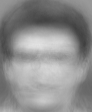

Image after NMF:


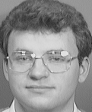

[[153. 152. 152. ... 151. 151. 149.]
 [153. 154. 155. ... 147. 148. 151.]
 [155. 151. 157. ... 150. 151. 150.]
 ...
 [134. 141. 146. ... 109. 112. 111.]
 [143. 135. 132. ... 109. 113. 109.]
 [139. 139. 184. ... 110. 108. 114.]]
Image Before NMF:
-------------------------------Number of image: 106
[[127. 127. 128. ... 123. 123. 123.]
 [127. 128. 128. ... 123. 122. 122.]
 [127. 127. 128. ... 123. 122. 122.]
 ...
 [116. 114. 114. ...  85.  85.  84.]
 [121. 118. 122. ...  88.  88.  88.]
 [125. 126. 129. ...  91.  89.  90.]]


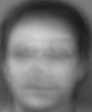

Image after NMF:


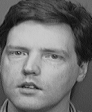

[[108. 112. 109. ... 105. 108. 103.]
 [113. 111. 111. ... 108. 105. 105.]
 [113. 109. 113. ... 106. 108. 105.]
 ...
 [ 94. 138. 115. ...  67.  70.  66.]
 [119. 148. 112. ...  76.  65.  70.]
 [130. 148. 101. ...  73.  64.  69.]]
Image Before NMF:
-------------------------------Number of image: 107
[[63. 64. 64. ... 66. 66. 66.]
 [63. 64. 64. ... 67. 66. 66.]
 [64. 64. 64. ... 66. 66. 67.]
 ...
 [61. 62. 65. ... 50. 50. 51.]
 [61. 63. 66. ... 48. 49. 51.]
 [61. 65. 66. ... 50. 51. 51.]]


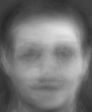

Image after NMF:


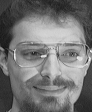

[[53. 58. 57. ... 56. 56. 58.]
 [56. 58. 55. ... 57. 55. 58.]
 [57. 55. 60. ... 59. 54. 57.]
 ...
 [55. 52. 51. ... 45. 43. 42.]
 [54. 57. 54. ... 44. 41. 42.]
 [57. 55. 52. ... 38. 47. 39.]]
Image Before NMF:
-------------------------------Number of image: 108
[[ 56.  56.  57. ...  54.  54.  54.]
 [ 56.  57.  57. ...  54.  54.  54.]
 [ 57.  57.  57. ...  54.  54.  54.]
 ...
 [127. 128. 129. ...  88.  87.  87.]
 [130. 132. 134. ...  91.  90.  89.]
 [133. 138. 139. ...  94.  92.  91.]]


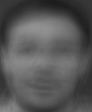

Image after NMF:


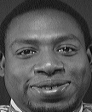

[[ 50.  54.  61. ...  50.  50.  54.]
 [ 58.  56.  60. ...  53.  57.  48.]
 [ 54.  56.  56. ...  53.  57.  54.]
 ...
 [129. 103. 119. ...  58.  73.  83.]
 [116. 207. 196. ... 116.  77.  91.]
 [102. 230. 209. ... 152. 165.  67.]]
Image Before NMF:
-------------------------------Number of image: 109
[[125. 124. 124. ... 121. 121. 121.]
 [125. 124. 125. ... 121. 121. 121.]
 [124. 124. 125. ... 121. 121. 121.]
 ...
 [135. 133. 132. ... 104. 102. 101.]
 [140. 137. 141. ... 107. 106. 106.]
 [144. 144. 147. ... 109. 107. 107.]]


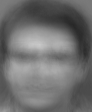

Image after NMF:


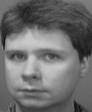

[[121. 118. 117. ... 127. 124. 127.]
 [117. 117. 117. ... 126. 123. 125.]
 [120. 120. 119. ... 122. 125. 124.]
 ...
 [ 90.  97.  89. ...  90.  90.  90.]
 [102. 105.  89. ...  86.  84.  89.]
 [ 99. 106. 101. ...  74.  84.  90.]]
Image Before NMF:
-------------------------------Number of image: 110
[[ 86.  86.  86. ...  83.  83.  83.]
 [ 86.  86.  87. ...  83.  83.  83.]
 [ 86.  86.  87. ...  83.  83.  83.]
 ...
 [164. 163. 163. ... 113. 112. 111.]
 [169. 168. 171. ... 118. 117. 115.]
 [172. 176. 178. ... 120. 117. 117.]]


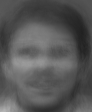

Image after NMF:


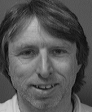

[[ 86.  90.  87. ...  84.  86.  85.]
 [ 85.  88.  90. ...  81.  86.  86.]
 [ 87.  88.  89. ...  83.  85.  83.]
 ...
 [199. 199. 196. ... 122. 122. 125.]
 [196. 190. 191. ... 127. 126. 124.]
 [192. 199. 201. ... 127. 124. 126.]]
Image Before NMF:
-------------------------------Number of image: 111
[[66. 65. 65. ... 72. 71. 72.]
 [65. 65. 64. ... 72. 72. 72.]
 [66. 65. 66. ... 71. 73. 73.]
 ...
 [30. 32. 33. ... 43. 43. 44.]
 [34. 36. 36. ... 44. 44. 43.]
 [35. 38. 38. ... 50. 47. 45.]]


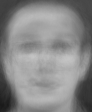

Image after NMF:


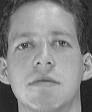

[[41. 47. 47. ... 52. 46. 49.]
 [44. 43. 43. ... 50. 49. 46.]
 [48. 47. 46. ... 50. 48. 47.]
 ...
 [43. 44. 44. ... 36. 37. 35.]
 [45. 44. 45. ... 37. 39. 33.]
 [46. 41. 47. ... 35. 37. 38.]]
Image Before NMF:
-------------------------------Number of image: 112
[[ 49.  50.  50. ...  47.  47.  47.]
 [ 50.  50.  51. ...  47.  47.  47.]
 [ 50.  50.  51. ...  48.  48.  47.]
 ...
 [125. 125. 126. ...  90.  89.  89.]
 [129. 130. 132. ...  94.  93.  91.]
 [132. 137. 138. ...  98.  96.  93.]]


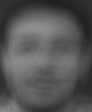

Image after NMF:


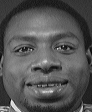

[[ 58.  55.  52. ...  48.  55.  46.]
 [ 51.  59.  55. ...  45.  49.  56.]
 [ 55.  52.  57. ...  51.  53.  52.]
 ...
 [201. 202. 209. ...  78.  82.  80.]
 [124. 106. 120. ...  74.  67.  80.]
 [111. 203. 195. ... 131. 115.  68.]]
Image Before NMF:
-------------------------------Number of image: 113
[[124. 125. 125. ... 117. 116. 116.]
 [125. 125. 126. ... 116. 116. 116.]
 [125. 125. 125. ... 117. 116. 116.]
 ...
 [116. 119. 119. ...  60.  61.  60.]
 [122. 122. 125. ...  63.  63.  62.]
 [124. 127. 129. ...  64.  63.  64.]]


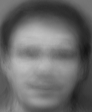

Image after NMF:


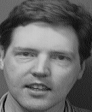

[[103. 109. 105. ... 100.  93. 100.]
 [104. 109. 103. ...  99.  98.  97.]
 [106. 108. 101. ...  98. 100.  96.]
 ...
 [170. 111. 116. ...  40.  32.  40.]
 [166.  93. 119. ...  56.  45.  36.]
 [161.  97. 122. ...  53.  58.  54.]]
Image Before NMF:
-------------------------------Number of image: 114
[[150. 149. 149. ... 151. 150. 151.]
 [150. 149. 148. ... 151. 151. 151.]
 [149. 149. 149. ... 150. 151. 151.]
 ...
 [162. 161. 162. ... 126. 124. 123.]
 [168. 168. 170. ... 130. 128. 128.]
 [172. 171. 175. ... 131. 129. 129.]]


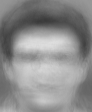

Image after NMF:


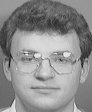

[[155. 154. 154. ... 148. 151. 149.]
 [154. 153. 152. ... 151. 151. 150.]
 [153. 153. 153. ... 151. 151. 150.]
 ...
 [147. 144. 145. ... 108. 113. 108.]
 [159. 142. 133. ... 109. 111. 110.]
 [150. 162. 206. ... 111. 111. 108.]]
Image Before NMF:
-------------------------------Number of image: 115
[[ 48.  48.  49. ...  42.  42.  42.]
 [ 48.  48.  49. ...  43.  42.  42.]
 [ 49.  49.  49. ...  43.  42.  42.]
 ...
 [ 90.  90.  93. ...  71.  70.  71.]
 [ 94.  96.  99. ...  73.  73.  71.]
 [ 96. 102. 104. ...  82.  81.  74.]]


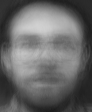

Image after NMF:


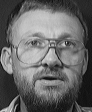

[[ 47.  46.  46. ...  38.  38.  39.]
 [ 47.  45.  47. ...  40.  42.  39.]
 [ 45.  47.  45. ...  39.  38.  43.]
 ...
 [ 39.  47. 132. ...  80.  83.  97.]
 [ 81. 164. 204. ... 105.  93. 102.]
 [185. 200. 162. ... 151. 143.  90.]]
Image Before NMF:
-------------------------------Number of image: 116
[[ 59.  59.  59. ...  60.  60.  61.]
 [ 58.  59.  58. ...  61.  61.  61.]
 [ 59.  58.  59. ...  60.  62.  61.]
 ...
 [108. 111. 112. ...  80.  79.  79.]
 [114. 116. 116. ...  83.  82.  81.]
 [116. 120. 120. ...  86.  83.  83.]]


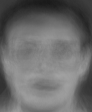

Image after NMF:


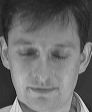

[[ 40.  42.  41. ...  48.  44.  46.]
 [ 41.  42.  42. ...  46.  45.  47.]
 [ 42.  40.  40. ...  48.  51.  46.]
 ...
 [154. 160. 161. ...  38.  45.  50.]
 [172. 174. 180. ...  29.  40.  45.]
 [171. 170. 168. ...  57.  37.  42.]]
Image Before NMF:
-------------------------------Number of image: 117
[[55. 55. 55. ... 55. 54. 55.]
 [55. 55. 56. ... 55. 55. 55.]
 [56. 55. 56. ... 55. 56. 55.]
 ...
 [73. 73. 72. ... 65. 64. 64.]
 [77. 76. 78. ... 67. 67. 66.]
 [81. 86. 86. ... 73. 71. 71.]]


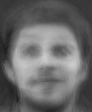

Image after NMF:


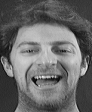

[[48. 52. 51. ... 56. 56. 49.]
 [48. 47. 52. ... 58. 59. 54.]
 [52. 50. 44. ... 60. 57. 57.]
 ...
 [49. 54. 48. ... 54. 50. 55.]
 [51. 50. 47. ... 55. 50. 56.]
 [53. 48. 53. ... 56. 56. 55.]]
Image Before NMF:
-------------------------------Number of image: 118
[[103. 103. 103. ... 100. 100. 100.]
 [103. 103. 103. ... 100. 100. 100.]
 [103. 103. 103. ... 101. 100. 100.]
 ...
 [132. 130. 130. ...  99.  97.  97.]
 [135. 133. 137. ... 101. 100. 100.]
 [138. 139. 142. ... 102. 101. 101.]]


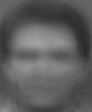

Image after NMF:


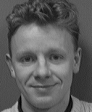

[[ 95.  95.  99. ...  89.  92.  91.]
 [ 98.  96.  95. ...  93.  89.  94.]
 [ 98.  97.  95. ...  90.  89.  92.]
 ...
 [ 74.  72.  71. ... 127. 139. 156.]
 [ 74.  78.  87. ... 126. 158. 149.]
 [ 79. 118. 145. ... 111. 165. 162.]]
Image Before NMF:
-------------------------------Number of image: 119
[[48. 47. 48. ... 46. 45. 45.]
 [47. 48. 47. ... 45. 45. 45.]
 [48. 48. 48. ... 45. 46. 45.]
 ...
 [36. 39. 40. ... 24. 24. 25.]
 [40. 43. 42. ... 25. 26. 24.]
 [42. 46. 45. ... 31. 30. 27.]]


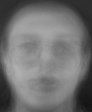

Image after NMF:


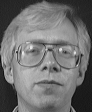

[[37. 35. 35. ... 34. 34. 36.]
 [36. 36. 37. ... 35. 31. 36.]
 [38. 36. 37. ... 35. 32. 33.]
 ...
 [42. 43. 39. ... 24. 29. 26.]
 [34. 44. 43. ... 26. 29. 27.]
 [36. 43. 36. ... 26. 28. 28.]]
Image Before NMF:
-------------------------------Number of image: 120
[[ 81.  81.  82. ...  77.  77.  77.]
 [ 81.  82.  82. ...  77.  77.  77.]
 [ 81.  81.  82. ...  77.  77.  77.]
 ...
 [176. 178. 179. ... 113. 111. 110.]
 [182. 183. 185. ... 116. 115. 114.]
 [185. 188. 191. ... 117. 116. 116.]]


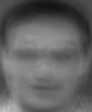

Image after NMF:


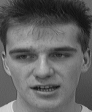

[[112. 110. 113. ... 102. 103. 103.]
 [110. 113. 109. ... 103. 101. 107.]
 [110. 111. 111. ... 104. 104. 104.]
 ...
 [203. 199. 200. ... 106.  67.  62.]
 [203. 198. 203. ... 159. 150. 103.]
 [202. 199. 202. ... 157. 159. 167.]]
Image Before NMF:
-------------------------------Number of image: 121
[[103. 103. 103. ... 106. 106. 106.]
 [103. 103. 103. ... 106. 106. 106.]
 [103. 102. 103. ... 106. 106. 106.]
 ...
 [ 84.  83.  83. ...  75.  75.  74.]
 [ 87.  85.  88. ...  77.  77.  77.]
 [ 90.  91.  93. ...  79.  76.  78.]]


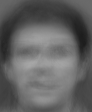

Image after NMF:


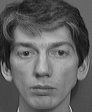

[[104. 101. 104. ... 104. 102. 103.]
 [104. 104. 103. ... 103. 101. 101.]
 [102. 106. 102. ... 101. 103. 102.]
 ...
 [ 73.  69.  70. ...  76.  78.  73.]
 [ 73.  74.  72. ...  75.  75.  79.]
 [ 75.  75.  73. ...  78.  73.  79.]]
Image Before NMF:
-------------------------------Number of image: 122
[[49. 49. 49. ... 46. 46. 46.]
 [49. 49. 49. ... 47. 46. 46.]
 [50. 50. 49. ... 47. 47. 46.]
 ...
 [84. 82. 85. ... 73. 72. 73.]
 [86. 87. 90. ... 75. 74. 73.]
 [88. 92. 94. ... 81. 81. 75.]]


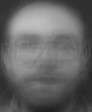

Image after NMF:


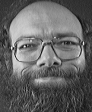

[[55. 47. 50. ... 47. 44. 49.]
 [47. 52. 47. ... 45. 46. 46.]
 [49. 53. 48. ... 42. 48. 46.]
 ...
 [71. 67. 72. ... 46. 59. 45.]
 [68. 71. 65. ... 49. 49. 67.]
 [64. 71. 62. ... 48. 46. 72.]]
Image Before NMF:
-------------------------------Number of image: 123
[[108. 109. 109. ... 107. 107. 106.]
 [109. 109. 109. ... 107. 107. 107.]
 [109. 109. 108. ... 107. 106. 107.]
 ...
 [120. 118. 122. ...  92.  92.  92.]
 [119. 120. 125. ...  91.  91.  93.]
 [119. 122. 126. ...  92.  94.  91.]]


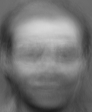

Image after NMF:


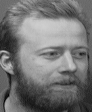

[[113. 105. 109. ... 102. 108. 108.]
 [109. 105. 111. ... 110. 103. 106.]
 [107. 108. 107. ... 110. 101. 107.]
 ...
 [110.  94.  95. ...  41.  55.  40.]
 [103. 106.  95. ...  47.  44.  47.]
 [104. 104.  95. ...  48.  37.  51.]]
Image Before NMF:
-------------------------------Number of image: 124
[[ 36.  36.  36. ...  33.  32.  32.]
 [ 36.  36.  37. ...  33.  33.  33.]
 [ 37.  37.  36. ...  33.  33.  33.]
 ...
 [ 92.  91.  92. ...  80.  79.  80.]
 [ 96.  96.  99. ...  82.  82.  80.]
 [ 99. 105. 106. ...  91.  89.  84.]]


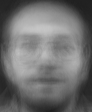

Image after NMF:


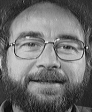

[[ 52.  52.  46. ...  41.  49.  45.]
 [ 48.  54.  50. ...  48.  47.  43.]
 [ 49.  54.  51. ...  45.  50.  52.]
 ...
 [142.  98.  87. ...  84.  65.  45.]
 [137. 105.  84. ...  84.  74.  44.]
 [138. 116.  90. ...  88.  82.  52.]]
Image Before NMF:
-------------------------------Number of image: 125
[[113. 112. 113. ... 112. 112. 112.]
 [113. 113. 112. ... 112. 111. 112.]
 [113. 112. 112. ... 112. 112. 111.]
 ...
 [ 89.  89.  89. ...  73.  72.  72.]
 [ 93.  92.  94. ...  73.  74.  74.]
 [ 95.  95.  97. ...  75.  75.  76.]]


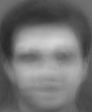

Image after NMF:


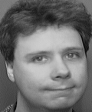

[[126. 124. 125. ... 119. 119. 122.]
 [122. 124. 123. ... 120. 122. 119.]
 [124. 124. 123. ... 123. 121. 122.]
 ...
 [ 78.  70.  75. ...  82.  79.  84.]
 [ 71.  77.  80. ...  76.  81.  78.]
 [ 73.  89.  97. ...  76.  81.  78.]]
Image Before NMF:
-------------------------------Number of image: 126
[[112. 112. 112. ... 108. 107. 107.]
 [112. 112. 112. ... 107. 107. 107.]
 [112. 112. 112. ... 107. 107. 107.]
 ...
 [ 48.  49.  51. ...  26.  27.  27.]
 [ 49.  49.  53. ...  24.  25.  27.]
 [ 49.  51.  52. ...  24.  27.  27.]]


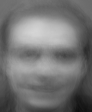

Image after NMF:


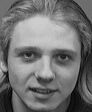

[[111. 110. 111. ... 113. 104. 110.]
 [112. 111. 114. ... 111. 109. 111.]
 [112. 109. 112. ... 109. 106. 111.]
 ...
 [ 40.  36.  35. ...  29.  34.  30.]
 [ 30.  36.  47. ...  36.  39.  36.]
 [ 44.  37.  39. ...  35.  40.  29.]]
Image Before NMF:
-------------------------------Number of image: 127
[[107. 107. 107. ... 111. 111. 111.]
 [107. 107. 107. ... 112. 111. 111.]
 [107. 106. 107. ... 111. 112. 111.]
 ...
 [ 83.  81.  82. ...  81.  81.  81.]
 [ 86.  84.  87. ...  85.  83.  84.]
 [ 89.  90.  92. ...  87.  84.  84.]]


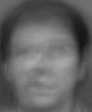

Image after NMF:


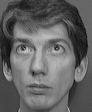

[[103. 104. 105. ... 102. 103. 103.]
 [104. 105. 105. ... 103. 102. 100.]
 [105. 102. 105. ... 102.  99. 101.]
 ...
 [ 73.  70.  71. ...  78.  73.  79.]
 [ 71.  72.  72. ...  79.  75.  78.]
 [ 72.  74.  72. ...  76.  76.  75.]]
Image Before NMF:
-------------------------------Number of image: 128
[[126. 125. 126. ... 122. 122. 122.]
 [126. 126. 126. ... 122. 122. 122.]
 [126. 126. 126. ... 122. 122. 122.]
 ...
 [138. 136. 136. ... 106. 104. 104.]
 [144. 142. 144. ... 110. 109. 108.]
 [148. 147. 151. ... 112. 110. 110.]]


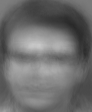

Image after NMF:


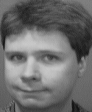

[[114. 120. 118. ... 123. 124. 124.]
 [116. 124. 121. ... 122. 128. 127.]
 [118. 120. 120. ... 128. 126. 124.]
 ...
 [101. 105.  88. ...  93.  91.  87.]
 [101. 112. 107. ...  87.  92.  87.]
 [103. 106. 106. ...  79.  92.  87.]]
Image Before NMF:
-------------------------------Number of image: 129
[[ 96.  96.  97. ...  91.  91.  91.]
 [ 96.  97.  97. ...  91.  91.  91.]
 [ 96.  96.  97. ...  91.  91.  91.]
 ...
 [153. 157. 158. ...  87.  86.  86.]
 [158. 161. 163. ...  90.  89.  89.]
 [161. 165. 166. ...  90.  90.  90.]]


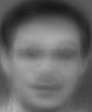

Image after NMF:


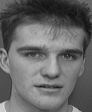

[[111. 107. 109. ... 102. 104. 101.]
 [107. 109. 106. ... 103. 100. 105.]
 [106. 108. 107. ... 103. 104.  99.]
 ...
 [205. 203. 203. ...  68.  68.  68.]
 [207. 201. 205. ...  67.  65.  67.]
 [209. 203. 203. ...  65.  68.  65.]]
Image Before NMF:
-------------------------------Number of image: 130
[[114. 114. 115. ... 120. 120. 119.]
 [115. 114. 114. ... 121. 120. 120.]
 [115. 114. 114. ... 120. 120. 121.]
 ...
 [ 61.  57.  62. ...  79.  80.  81.]
 [ 60.  58.  65. ...  80.  79.  80.]
 [ 60.  62.  65. ...  82.  81.  79.]]


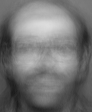

Image after NMF:


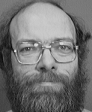

[[121. 119. 122. ... 120. 122. 121.]
 [122. 121. 122. ... 121. 120. 122.]
 [122. 121. 120. ... 119. 121. 121.]
 ...
 [ 72.  67.  70. ...  99.  97.  98.]
 [ 67.  69.  71. ... 109.  98.  98.]
 [ 65.  73.  67. ... 150. 135. 121.]]
Image Before NMF:
-------------------------------Number of image: 131
[[ 93.  94.  94. ...  94.  93.  93.]
 [ 93.  94.  93. ...  94.  94.  93.]
 [ 94.  93.  94. ...  93.  94.  94.]
 ...
 [ 97. 103. 105. ...  52.  53.  52.]
 [102. 106. 106. ...  54.  54.  54.]
 [103. 107. 107. ...  54.  53.  54.]]


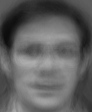

Image after NMF:


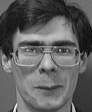

[[111. 110. 114. ... 114. 110. 114.]
 [113. 108. 109. ... 109. 114. 110.]
 [112. 112. 112. ... 113. 112. 112.]
 ...
 [100.  97.  98. ...  52.  54.  52.]
 [ 94.  98.  97. ...  47.  58.  47.]
 [101.  90. 104. ...  57.  53.  48.]]
Image Before NMF:
-------------------------------Number of image: 132
[[46. 45. 46. ... 51. 50. 51.]
 [45. 46. 45. ... 51. 51. 51.]
 [46. 45. 46. ... 50. 52. 52.]
 ...
 [56. 60. 60. ... 50. 50. 51.]
 [61. 63. 63. ... 53. 52. 51.]
 [62. 66. 66. ... 56. 54. 53.]]


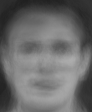

Image after NMF:


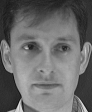

[[37. 36. 38. ... 45. 42. 45.]
 [36. 38. 38. ... 43. 46. 45.]
 [36. 39. 40. ... 50. 48. 50.]
 ...
 [45. 43. 41. ... 51. 46. 55.]
 [43. 44. 42. ... 49. 48. 50.]
 [37. 40. 40. ... 40. 50. 50.]]
Image Before NMF:
-------------------------------Number of image: 133
[[59. 58. 58. ... 68. 67. 68.]
 [58. 58. 57. ... 68. 68. 68.]
 [59. 58. 58. ... 67. 69. 69.]
 ...
 [32. 32. 36. ... 61. 61. 62.]
 [34. 36. 37. ... 61. 60. 61.]
 [34. 37. 37. ... 66. 65. 61.]]


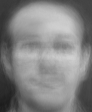

Image after NMF:


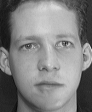

[[44. 43. 32. ... 52. 48. 52.]
 [44. 38. 33. ... 51. 51. 54.]
 [41. 42. 29. ... 50. 53. 53.]
 ...
 [39. 37. 39. ... 41. 37. 37.]
 [41. 41. 38. ... 44. 36. 32.]
 [40. 36. 42. ... 43. 43. 37.]]
Image Before NMF:
-------------------------------Number of image: 134
[[ 98.  99.  99. ... 101. 101. 101.]
 [ 99.  99.  99. ... 101. 101. 101.]
 [ 99.  98.  99. ... 101. 101. 101.]
 ...
 [141. 139. 141. ... 115. 114. 114.]
 [143. 142. 147. ... 117. 116. 117.]
 [145. 147. 150. ... 117. 117. 117.]]


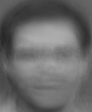

Image after NMF:


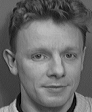

[[107. 103. 104. ...  99. 103.  99.]
 [103. 107. 101. ...  99. 101. 102.]
 [105. 105. 102. ... 102. 103. 103.]
 ...
 [168. 176. 183. ... 158. 129. 158.]
 [174. 170. 175. ... 156. 130. 163.]
 [176. 166. 183. ... 155. 133. 159.]]
Image Before NMF:
-------------------------------Number of image: 135
[[64. 64. 64. ... 66. 65. 66.]
 [64. 64. 65. ... 66. 66. 66.]
 [64. 64. 65. ... 65. 67. 66.]
 ...
 [46. 46. 45. ... 49. 49. 49.]
 [50. 49. 51. ... 51. 52. 51.]
 [54. 58. 58. ... 57. 55. 56.]]


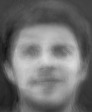

Image after NMF:


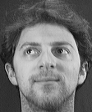

[[49. 48. 49. ... 62. 58. 62.]
 [48. 51. 50. ... 57. 60. 62.]
 [49. 49. 51. ... 59. 62. 59.]
 ...
 [50. 50. 48. ... 65. 57. 62.]
 [46. 54. 50. ... 67. 63. 54.]
 [47. 51. 51. ... 63. 63. 56.]]
Image Before NMF:
-------------------------------Number of image: 136
[[115. 115. 115. ... 119. 119. 119.]
 [115. 115. 114. ... 119. 119. 119.]
 [115. 115. 114. ... 118. 119. 120.]
 ...
 [ 45.  45.  48. ...  50.  51.  51.]
 [ 45.  46.  49. ...  50.  49.  51.]
 [ 45.  46.  48. ...  51.  51.  49.]]


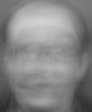

Image after NMF:


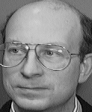

[[113. 110. 110. ... 120. 121. 118.]
 [112. 110. 111. ... 119. 119. 118.]
 [113. 111. 113. ... 120. 120. 120.]
 ...
 [ 28.  24.  21. ...  23.  20.  17.]
 [ 20.  23.  27. ...  20.  21.  16.]
 [ 24.  23.  21. ...  21.  21.  20.]]
Image Before NMF:
-------------------------------Number of image: 137
[[69. 69. 69. ... 68. 68. 68.]
 [68. 69. 67. ... 68. 69. 68.]
 [69. 69. 69. ... 68. 69. 68.]
 ...
 [76. 84. 88. ... 41. 41. 42.]
 [82. 90. 87. ... 42. 41. 41.]
 [83. 87. 86. ... 45. 45. 41.]]


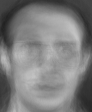

Image after NMF:


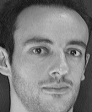

[[61. 58. 59. ... 60. 61. 62.]
 [61. 62. 54. ... 64. 56. 61.]
 [58. 64. 60. ... 65. 55. 59.]
 ...
 [56. 51. 52. ... 61. 63. 61.]
 [48. 53. 51. ... 61. 64. 59.]
 [48. 52. 51. ... 59. 64. 61.]]
Image Before NMF:
-------------------------------Number of image: 138
[[48. 47. 48. ... 52. 52. 52.]
 [47. 48. 47. ... 52. 52. 52.]
 [48. 47. 48. ... 51. 53. 53.]
 ...
 [42. 46. 47. ... 34. 34. 34.]
 [46. 49. 48. ... 35. 35. 35.]
 [48. 51. 50. ... 38. 36. 37.]]


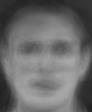

Image after NMF:


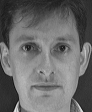

[[36. 39. 45. ... 47. 44. 43.]
 [37. 45. 40. ... 47. 44. 47.]
 [36. 40. 41. ... 47. 47. 45.]
 ...
 [48. 45. 46. ... 51. 47. 54.]
 [44. 44. 47. ... 52. 51. 52.]
 [42. 45. 41. ... 52. 51. 53.]]
Image Before NMF:
-------------------------------Number of image: 139
[[113. 113. 113. ... 115. 115. 114.]
 [113. 113. 112. ... 115. 115. 115.]
 [113. 113. 113. ... 114. 115. 116.]
 ...
 [ 81.  82.  86. ...  65.  66.  66.]
 [ 82.  85.  87. ...  65.  65.  66.]
 [ 82.  84.  87. ...  67.  67.  65.]]


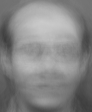

Image after NMF:


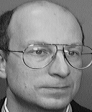

[[110. 110. 112. ... 119. 122. 117.]
 [109. 110. 111. ... 117. 119. 115.]
 [112. 111. 111. ... 122. 120. 117.]
 ...
 [  3.  78. 151. ...  40.  75.  75.]
 [  0.  87. 153. ...  15.  33.  44.]
 [  0.  93. 164. ...  20.  31.  16.]]
Image Before NMF:
-------------------------------Number of image: 140
[[119. 119. 120. ... 120. 120. 120.]
 [119. 120. 120. ... 121. 120. 120.]
 [120. 119. 119. ... 120. 120. 120.]
 ...
 [ 60.  58.  61. ...  58.  59.  59.]
 [ 61.  59.  64. ...  58.  59.  60.]
 [ 63.  64.  67. ...  60.  59.  60.]]


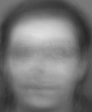

Image after NMF:


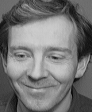

[[107. 104. 109. ... 110. 107. 109.]
 [107. 106. 107. ... 109. 108. 110.]
 [108. 107. 107. ... 109. 109. 108.]
 ...
 [ 71.  73.  72. ...  57.  58.  60.]
 [ 72.  75.  76. ...  58.  60.  56.]
 [ 74.  78.  75. ...  58.  56.  57.]]
Image Before NMF:
-------------------------------Number of image: 141
[[130. 129. 130. ... 133. 133. 133.]
 [130. 129. 129. ... 133. 133. 133.]
 [130. 129. 129. ... 133. 133. 133.]
 ...
 [104. 101. 103. ...  99.  98.  98.]
 [106. 104. 108. ... 100.  99. 101.]
 [108. 107. 111. ... 101. 100. 100.]]


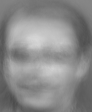

Image after NMF:


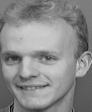

[[128. 125. 126. ... 125. 126. 123.]
 [127. 127. 124. ... 124. 124. 124.]
 [127. 127. 124. ... 125. 124. 127.]
 ...
 [ 87. 102.  94. ...  87.  86.  87.]
 [103. 105.  92. ...  88.  83.  87.]
 [ 92.  92.  89. ...  84.  85.  85.]]
Image Before NMF:
-------------------------------Number of image: 142
[[48. 48. 48. ... 49. 49. 49.]
 [48. 48. 47. ... 49. 49. 49.]
 [48. 48. 48. ... 49. 50. 50.]
 ...
 [39. 40. 41. ... 38. 37. 38.]
 [41. 43. 44. ... 38. 38. 38.]
 [42. 46. 46. ... 42. 42. 40.]]


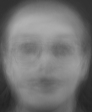

Image after NMF:


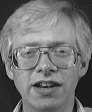

[[ 38.  35.  36. ...  34.  32.  36.]
 [ 35.  39.  39. ...  37.  33.  43.]
 [ 40.  34.  40. ...  35.  38.  35.]
 ...
 [ 39.  41.  35. ... 138. 132. 129.]
 [ 40.  36.  40. ... 132. 128. 135.]
 [ 37.  42.  39. ... 138. 142. 141.]]
Image Before NMF:
-------------------------------Number of image: 143
[[105. 105. 105. ... 103. 103. 102.]
 [105. 105. 105. ... 103. 102. 102.]
 [105. 105. 104. ... 103. 102. 102.]
 ...
 [ 24.  23.  25. ...  25.  25.  26.]
 [ 24.  22.  26. ...  22.  23.  25.]
 [ 25.  23.  26. ...  22.  25.  25.]]


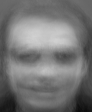

Image after NMF:


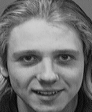

[[114. 109. 112. ... 117. 109. 111.]
 [113. 109. 112. ... 111. 111. 111.]
 [109. 110. 111. ... 113. 109. 113.]
 ...
 [ 38.  33.  30. ...  42.  32.  31.]
 [ 35.  26.  35. ...  34.  47.  42.]
 [ 24.  30.  38. ...  37.  35.  38.]]
Image Before NMF:
-------------------------------Number of image: 144
[[161. 160. 160. ... 162. 162. 162.]
 [161. 160. 159. ... 162. 162. 162.]
 [160. 160. 160. ... 161. 163. 162.]
 ...
 [160. 160. 160. ... 130. 127. 127.]
 [168. 168. 169. ... 135. 133. 132.]
 [173. 170. 174. ... 136. 133. 132.]]


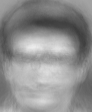

Image after NMF:


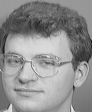

[[154. 155. 151. ... 148. 151. 148.]
 [156. 154. 154. ... 149. 151. 147.]
 [152. 155. 155. ... 148. 152. 150.]
 ...
 [102. 109. 109. ... 113. 111. 112.]
 [125. 123. 134. ... 114. 111. 113.]
 [141. 132. 124. ... 108. 113. 110.]]
Image Before NMF:
-------------------------------Number of image: 145
[[98. 98. 99. ... 97. 97. 96.]
 [99. 98. 99. ... 97. 97. 96.]
 [98. 98. 98. ... 97. 96. 97.]
 ...
 [27. 25. 27. ... 26. 27. 27.]
 [26. 23. 28. ... 24. 25. 27.]
 [26. 26. 28. ... 23. 26. 27.]]


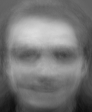

Image after NMF:


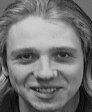

[[106. 110. 107. ... 107. 109. 112.]
 [105. 109. 107. ... 107. 111. 112.]
 [106. 107. 107. ... 110. 110. 107.]
 ...
 [ 40.  35.  30. ...  46.  35.  50.]
 [ 35.  30.  28. ...  41.  32.  41.]
 [ 32.  38.  23. ...  44.  49.  31.]]
Image Before NMF:
-------------------------------Number of image: 146
[[116. 115. 115. ... 111. 111. 111.]
 [116. 115. 115. ... 111. 111. 111.]
 [115. 115. 115. ... 111. 111. 111.]
 ...
 [118. 118. 119. ...  83.  81.  81.]
 [124. 124. 125. ...  85.  84.  83.]
 [127. 126. 129. ...  87.  86.  85.]]


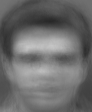

Image after NMF:


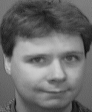

[[116. 119. 117. ... 124. 125. 125.]
 [122. 118. 120. ... 123. 123. 122.]
 [118. 120. 118. ... 130. 121. 128.]
 ...
 [104. 101. 104. ...  75.  84.  89.]
 [119. 102. 118. ...  60.  64.  84.]
 [ 94.  84. 107. ...  60.  54.  64.]]
Image Before NMF:
-------------------------------Number of image: 147
[[36. 36. 36. ... 37. 37. 38.]
 [36. 36. 36. ... 38. 38. 38.]
 [37. 36. 36. ... 37. 38. 38.]
 ...
 [41. 41. 41. ... 47. 47. 48.]
 [44. 44. 46. ... 49. 49. 48.]
 [46. 49. 50. ... 55. 53. 51.]]


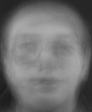

Image after NMF:


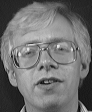

[[ 35.  36.  37. ...  36.  33.  37.]
 [ 35.  35.  39. ...  39.  33.  36.]
 [ 36.  36.  37. ...  39.  36.  32.]
 ...
 [ 39.  38.  41. ...  29.  28.  29.]
 [ 34.  36.  39. ...  52.  49.  35.]
 [ 36.  36.  40. ... 144. 147. 143.]]
Image Before NMF:
-------------------------------Number of image: 148
[[36. 36. 36. ... 35. 34. 34.]
 [36. 36. 36. ... 35. 35. 35.]
 [37. 37. 37. ... 35. 35. 35.]
 ...
 [71. 72. 73. ... 65. 64. 65.]
 [76. 78. 79. ... 68. 67. 65.]
 [79. 85. 85. ... 77. 75. 69.]]


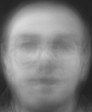

Image after NMF:


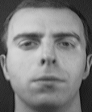

[[52. 51. 52. ... 40. 40. 37.]
 [49. 52. 53. ... 40. 34. 43.]
 [46. 58. 49. ... 37. 41. 39.]
 ...
 [37. 41. 38. ... 36. 31. 31.]
 [35. 39. 37. ... 34. 32. 31.]
 [41. 35. 39. ... 33. 34. 32.]]
Image Before NMF:
-------------------------------Number of image: 149
[[109. 110. 111. ... 108. 108. 108.]
 [110. 110. 111. ... 109. 108. 108.]
 [110. 110. 110. ... 109. 108. 108.]
 ...
 [182. 179. 181. ... 138. 137. 136.]
 [185. 183. 189. ... 141. 140. 141.]
 [188. 191. 195. ... 142. 141. 141.]]


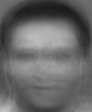

Image after NMF:


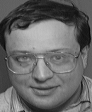

[[ 94.  98.  94. ...  92.  93.  95.]
 [ 97.  95.  98. ...  91.  91.  94.]
 [ 94.  96.  95. ...  96.  93.  96.]
 ...
 [172. 172. 169. ... 131. 132. 123.]
 [182. 166. 150. ... 137. 130. 115.]
 [172. 159. 138. ... 126. 148. 135.]]
Image Before NMF:
-------------------------------Number of image: 150
[[114. 114. 114. ... 113. 112. 111.]
 [114. 114. 113. ... 112. 113. 112.]
 [114. 114. 114. ... 112. 112. 113.]
 ...
 [ 72.  73.  77. ...  46.  46.  47.]
 [ 73.  75.  78. ...  45.  45.  47.]
 [ 73.  75.  77. ...  46.  47.  45.]]


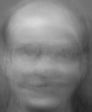

Image after NMF:


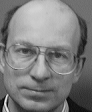

[[108. 109. 110. ... 112. 115. 108.]
 [107. 106. 105. ... 109. 114. 110.]
 [105. 108. 108. ... 110. 111. 112.]
 ...
 [ 23.   9.  78. ...  49.  48.  49.]
 [ 29.   6. 103. ...  33.  43.  48.]
 [ 29.   8. 101. ...  24.  23.  30.]]
Image Before NMF:
-------------------------------Number of image: 151
[[36. 36. 36. ... 49. 48. 49.]
 [36. 36. 35. ... 50. 49. 49.]
 [37. 36. 36. ... 48. 50. 50.]
 ...
 [30. 31. 32. ... 57. 58. 58.]
 [31. 33. 34. ... 59. 58. 58.]
 [32. 34. 35. ... 62. 60. 59.]]


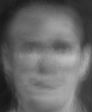

Image after NMF:


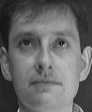

[[35. 35. 35. ... 47. 45. 47.]
 [36. 34. 39. ... 51. 45. 46.]
 [35. 36. 35. ... 48. 48. 48.]
 ...
 [37. 39. 37. ... 58. 58. 57.]
 [34. 40. 35. ... 54. 60. 54.]
 [35. 36. 39. ... 56. 58. 55.]]
Image Before NMF:
-------------------------------Number of image: 152
[[120. 119. 119. ... 114. 115. 115.]
 [119. 119. 118. ... 114. 113. 114.]
 [119. 118. 118. ... 114. 114. 113.]
 ...
 [ 21.  23.  23. ...  16.  16.  17.]
 [ 27.  27.  26. ...  16.  17.  17.]
 [ 30.  26.  28. ...  19.  19.  18.]]


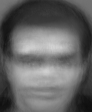

Image after NMF:


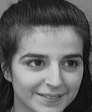

[[137. 135. 136. ... 129. 131. 128.]
 [137. 135. 133. ... 133. 128. 127.]
 [137. 134. 136. ... 130. 125. 127.]
 ...
 [ 26.  27.  28. ...  28.  21.  22.]
 [ 23.  25.  25. ...  19.  21.  26.]
 [ 24.  28.  24. ...  19.  24.  41.]]
Image Before NMF:
-------------------------------Number of image: 153
[[103. 102. 103. ... 102. 101. 101.]
 [103. 102. 103. ... 102. 102. 101.]
 [103. 103. 102. ... 102. 102. 102.]
 ...
 [ 89.  85.  89. ...  87.  88.  88.]
 [ 90.  89.  95. ...  90.  88.  89.]
 [ 92.  95.  98. ...  95.  94.  89.]]


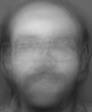

Image after NMF:


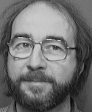

[[124. 123. 126. ... 115. 113. 116.]
 [123. 125. 123. ... 113. 114. 114.]
 [123. 125. 121. ... 112. 113. 113.]
 ...
 [114. 131. 117. ...  78.  77.  74.]
 [119. 105. 127. ...  76.  76.  73.]
 [143.  98. 132. ...  75.  72.  78.]]
Image Before NMF:
-------------------------------Number of image: 154
[[129. 129. 129. ... 126. 126. 126.]
 [129. 129. 129. ... 126. 126. 126.]
 [129. 129. 129. ... 126. 126. 126.]
 ...
 [120. 118. 120. ...  85.  85.  84.]
 [122. 121. 125. ...  87.  86.  87.]
 [124. 125. 128. ...  87.  87.  87.]]


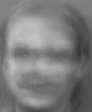

Image after NMF:


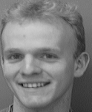

[[130. 133. 129. ... 121. 121. 124.]
 [131. 132. 135. ... 123. 122. 125.]
 [132. 130. 132. ... 124. 121. 123.]
 ...
 [108. 111. 114. ...  55.  56.  55.]
 [116. 129. 124. ...  52.  56.  56.]
 [129. 126. 112. ...  54.  54.  56.]]
Image Before NMF:
-------------------------------Number of image: 155
[[78. 77. 77. ... 78. 77. 78.]
 [77. 77. 76. ... 78. 78. 78.]
 [78. 77. 77. ... 77. 79. 78.]
 ...
 [35. 38. 40. ... 34. 34. 35.]
 [40. 43. 42. ... 36. 36. 34.]
 [42. 45. 45. ... 42. 40. 37.]]


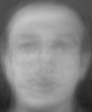

Image after NMF:


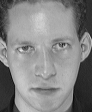

[[39. 44. 53. ... 47. 48. 47.]
 [44. 44. 61. ... 47. 45. 46.]
 [59. 39. 57. ... 46. 46. 44.]
 ...
 [49. 46. 42. ... 30. 32. 28.]
 [46. 35. 34. ... 30. 29. 27.]
 [32. 37. 27. ... 29. 26. 29.]]
Image Before NMF:
-------------------------------Number of image: 156
[[ 99.  99. 100. ...  97.  97.  97.]
 [ 99. 100.  99. ...  97.  98.  97.]
 [ 99.  99. 100. ...  97.  97.  98.]
 ...
 [113. 116. 119. ...  68.  68.  68.]
 [116. 119. 121. ...  69.  69.  69.]
 [116. 121. 122. ...  69.  70.  69.]]


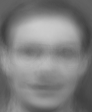

Image after NMF:


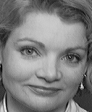

[[ 95.  89.  89. ... 103. 112.  91.]
 [ 95.  95.  93. ...  89. 107. 111.]
 [ 91.  95.  94. ...  80.  99. 100.]
 ...
 [173. 209. 208. ...  57.  54.  54.]
 [180. 209. 209. ...  54.  58.  54.]
 [184. 207. 208. ...  43.  55.  55.]]
Image Before NMF:
-------------------------------Number of image: 157
[[50. 50. 50. ... 45. 44. 45.]
 [50. 50. 51. ... 45. 44. 44.]
 [51. 51. 51. ... 45. 45. 44.]
 ...
 [80. 82. 83. ... 64. 63. 64.]
 [87. 89. 90. ... 69. 68. 64.]
 [91. 98. 98. ... 79. 76. 69.]]


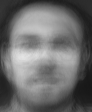

Image after NMF:


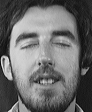

[[48. 45. 45. ... 41. 40. 39.]
 [52. 46. 46. ... 39. 43. 38.]
 [49. 46. 47. ... 45. 38. 46.]
 ...
 [59. 45. 57. ... 30. 30. 35.]
 [53. 52. 53. ... 28. 30. 37.]
 [45. 49. 52. ... 28. 37. 29.]]
Image Before NMF:
-------------------------------Number of image: 158
[[ 57.  56.  57. ...  53.  53.  53.]
 [ 57.  57.  58. ...  53.  53.  53.]
 [ 58.  57.  57. ...  54.  53.  53.]
 ...
 [ 89.  86.  89. ...  84.  83.  84.]
 [ 93.  92.  96. ...  88.  86.  85.]
 [ 95. 101. 103. ...  97.  94.  87.]]


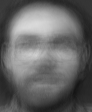

Image after NMF:


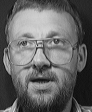

[[ 44.  44.  47. ...  37.  41.  34.]
 [ 43.  46.  50. ...  41.  41.  37.]
 [ 48.  44.  48. ...  40.  43.  35.]
 ...
 [ 43.  49.  47. ... 117. 121. 112.]
 [115. 128. 129. ... 185. 124. 111.]
 [127. 134. 142. ... 188. 165. 106.]]
Image Before NMF:
-------------------------------Number of image: 159
[[108. 109. 110. ... 110. 109. 109.]
 [108. 109. 109. ... 110. 110. 110.]
 [109. 109. 109. ... 110. 110. 110.]
 ...
 [ 97. 100. 103. ...  66.  68.  68.]
 [ 99. 101. 105. ...  67.  67.  69.]
 [100. 105. 106. ...  67.  67.  68.]]


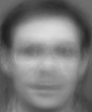

Image after NMF:


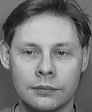

[[119. 121. 123. ... 117. 117. 114.]
 [119. 120. 123. ... 117. 118. 116.]
 [122. 121. 117. ... 115. 115. 118.]
 ...
 [ 82.  86.  89. ...  80.  79.  77.]
 [ 90. 100.  98. ...  78.  82.  82.]
 [104. 103. 104. ...  75.  79.  78.]]
Image Before NMF:
-------------------------------Number of image: 160
[[80. 80. 80. ... 80. 79. 79.]
 [81. 80. 81. ... 80. 79. 79.]
 [81. 80. 81. ... 79. 80. 79.]
 ...
 [49. 49. 47. ... 47. 46. 46.]
 [54. 52. 54. ... 49. 49. 48.]
 [58. 61. 61. ... 55. 52. 52.]]


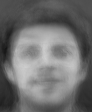

Image after NMF:


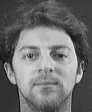

[[48. 47. 53. ... 61. 59. 60.]
 [50. 48. 52. ... 56. 61. 58.]
 [53. 47. 53. ... 54. 64. 60.]
 ...
 [50. 55. 49. ... 64. 67. 59.]
 [52. 50. 49. ... 63. 65. 60.]
 [52. 49. 50. ... 61. 66. 67.]]
Image Before NMF:
-------------------------------Number of image: 161
[[72. 71. 71. ... 82. 81. 81.]
 [72. 71. 69. ... 82. 82. 82.]
 [72. 71. 71. ... 80. 83. 83.]
 ...
 [22. 22. 25. ... 55. 54. 56.]
 [23. 25. 26. ... 55. 54. 54.]
 [24. 25. 26. ... 60. 59. 55.]]


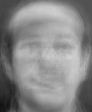

Image after NMF:


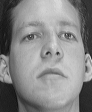

[[42. 41. 44. ... 50. 49. 57.]
 [41. 41. 43. ... 51. 53. 53.]
 [54. 40. 43. ... 49. 52. 53.]
 ...
 [38. 37. 36. ... 40. 43. 40.]
 [38. 36. 37. ... 44. 42. 39.]
 [37. 39. 37. ... 42. 43. 41.]]
Image Before NMF:
-------------------------------Number of image: 162
[[ 67.  66.  66. ...  63.  63.  64.]
 [ 67.  67.  67. ...  64.  63.  64.]
 [ 67.  67.  67. ...  64.  64.  63.]
 ...
 [153. 151. 151. ... 116. 114. 113.]
 [158. 157. 160. ... 122. 120. 118.]
 [162. 165. 168. ... 126. 122. 120.]]


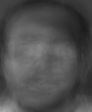

Image after NMF:


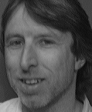

[[ 74.  74.  76. ...  67.  65.  67.]
 [ 72.  75.  75. ...  68.  65.  68.]
 [ 81.  72.  77. ...  66.  68.  65.]
 ...
 [183. 186. 186. ... 118. 121. 113.]
 [185. 190. 189. ... 128. 125. 114.]
 [186. 190. 190. ... 135. 127. 118.]]
Image Before NMF:
-------------------------------Number of image: 163
[[ 65.  65.  65. ...  67.  67.  67.]
 [ 65.  65.  65. ...  68.  68.  68.]
 [ 65.  65.  66. ...  67.  69.  68.]
 ...
 [144. 146. 147. ... 102. 100.  99.]
 [149. 152. 152. ... 105. 104. 103.]
 [151. 155. 157. ... 106. 104. 104.]]


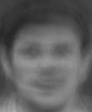

Image after NMF:


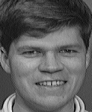

[[101.  86.  71. ... 101. 101. 102.]
 [ 92.  73.  69. ... 100. 102. 103.]
 [ 85.  69.  77. ... 101. 103. 103.]
 ...
 [ 78.  85. 161. ...  76.  72.  79.]
 [144. 155. 180. ...  72.  77.  75.]
 [171. 167. 186. ...  81. 105.  87.]]
Image Before NMF:
-------------------------------Number of image: 164
[[111. 110. 110. ... 116. 116. 116.]
 [111. 110. 109. ... 117. 117. 116.]
 [111. 110. 110. ... 115. 117. 117.]
 ...
 [ 72.  69.  72. ...  79.  80.  80.]
 [ 73.  71.  76. ...  82.  80.  81.]
 [ 74.  76.  79. ...  84.  82.  80.]]


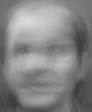

Image after NMF:


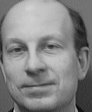

[[108. 111. 110. ... 113. 114. 115.]
 [110. 108. 110. ... 114. 116. 116.]
 [105. 110. 107. ... 113. 115. 113.]
 ...
 [ 81.  84.  90. ...  48.  57.  47.]
 [ 83.  93.  83. ...  54.  52.  53.]
 [ 85.  90.  88. ...  53.  48.  56.]]
Image Before NMF:
-------------------------------Number of image: 165
[[93. 93. 94. ... 91. 90. 91.]
 [93. 94. 94. ... 91. 90. 90.]
 [94. 93. 94. ... 91. 91. 90.]
 ...
 [44. 47. 46. ... 31. 32. 32.]
 [50. 50. 51. ... 34. 34. 33.]
 [53. 58. 57. ... 39. 36. 37.]]


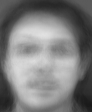

Image after NMF:


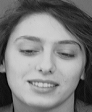

[[117. 114. 116. ... 111. 108. 113.]
 [112. 116. 112. ... 109. 110. 109.]
 [116. 113. 114. ... 111. 111. 111.]
 ...
 [ 65.  65.  56. ...  81.  82.  79.]
 [ 67.  68.  65. ...  80.  87.  87.]
 [ 67.  68.  73. ...  85.  89.  91.]]
Image Before NMF:
-------------------------------Number of image: 166
[[116. 116. 117. ... 109. 109. 109.]
 [116. 117. 117. ... 109. 109. 109.]
 [116. 117. 116. ... 109. 108. 108.]
 ...
 [133. 134. 138. ...  84.  83.  83.]
 [138. 139. 142. ...  84.  84.  85.]
 [139. 140. 143. ...  85.  87.  85.]]


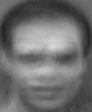

Image after NMF:


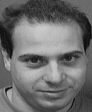

[[ 97. 105. 107. ... 106. 105. 108.]
 [104. 102. 106. ... 103. 108. 107.]
 [107. 106. 103. ... 106. 106. 106.]
 ...
 [138. 138. 139. ...  66.  68.  65.]
 [138. 139. 138. ...  66.  68.  67.]
 [135. 143. 144. ...  76.  67.  74.]]
Image Before NMF:
-------------------------------Number of image: 167
[[93. 93. 93. ... 96. 96. 96.]
 [93. 93. 92. ... 97. 97. 96.]
 [94. 93. 92. ... 96. 96. 97.]
 ...
 [56. 53. 58. ... 69. 70. 70.]
 [55. 55. 60. ... 69. 68. 70.]
 [55. 57. 60. ... 72. 72. 68.]]


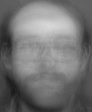

Image after NMF:


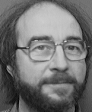

[[122. 125. 123. ... 116. 113. 113.]
 [123. 124. 123. ... 112. 115. 116.]
 [124. 124. 124. ... 112. 115. 113.]
 ...
 [ 73.  73.  69. ...  78.  76.  76.]
 [ 72.  74.  78. ...  76.  73.  78.]
 [ 86.  96. 116. ...  75.  74.  74.]]
Image Before NMF:
-------------------------------Number of image: 168
[[ 92.  92.  92. ...  85.  85.  85.]
 [ 92.  93.  92. ...  85.  85.  85.]
 [ 92.  92.  93. ...  86.  85.  85.]
 ...
 [164. 168. 169. ...  93.  91.  90.]
 [170. 173. 174. ...  95.  95.  94.]
 [173. 176. 178. ...  96.  95.  95.]]


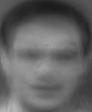

Image after NMF:


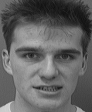

[[110. 111. 110. ... 103. 102. 100.]
 [110. 110. 112. ... 101. 104. 100.]
 [111. 109. 111. ... 100. 102. 104.]
 ...
 [198. 201. 203. ...  62.  65.  62.]
 [201. 201. 203. ...  64.  60.  62.]
 [202. 203. 203. ...  63.  59.  60.]]
Image Before NMF:
-------------------------------Number of image: 169
[[103. 104. 105. ... 111. 110. 111.]
 [103. 104. 104. ... 112. 111. 111.]
 [104. 103. 104. ... 110. 111. 112.]
 ...
 [ 72.  75.  78. ...  59.  61.  60.]
 [ 73.  75.  78. ...  59.  59.  61.]
 [ 73.  76.  77. ...  58.  57.  60.]]


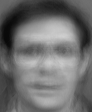

Image after NMF:


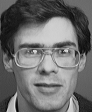

[[108. 110. 111. ... 105. 106. 107.]
 [108. 110. 109. ... 108. 105. 106.]
 [109. 108. 109. ... 107. 104. 106.]
 ...
 [ 46.  41.  46. ...  30.  35.  32.]
 [ 46.  42.  50. ...  38.  38.  35.]
 [ 55.  49.  43. ...  26.  37.  37.]]
Image Before NMF:
-------------------------------Number of image: 170
[[55. 55. 55. ... 53. 53. 53.]
 [55. 55. 55. ... 53. 53. 53.]
 [55. 55. 55. ... 53. 53. 53.]
 ...
 [80. 80. 82. ... 67. 66. 67.]
 [83. 83. 86. ... 68. 68. 67.]
 [84. 89. 90. ... 73. 72. 69.]]


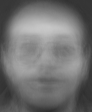

Image after NMF:


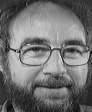

[[ 48.  50.  51. ...  50.  50.  52.]
 [ 49.  54.  50. ...  50.  48.  49.]
 [ 60.  50.  52. ...  52.  48.  47.]
 ...
 [ 81.  47. 135. ...  92.  93. 103.]
 [ 58.  84. 147. ...  90.  90. 105.]
 [ 62. 135. 144. ...  87.  90.  99.]]
Image Before NMF:
-------------------------------Number of image: 171
[[ 66.  66.  67. ...  63.  63.  63.]
 [ 67.  67.  67. ...  64.  63.  64.]
 [ 67.  67.  67. ...  64.  64.  63.]
 ...
 [180. 179. 180. ... 135. 132. 132.]
 [186. 186. 189. ... 141. 138. 136.]
 [190. 194. 197. ... 146. 142. 138.]]


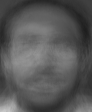

Image after NMF:


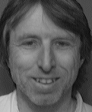

[[ 83.  86.  84. ...  74.  72.  75.]
 [ 84.  84.  84. ...  75.  74.  75.]
 [ 83.  85.  82. ...  73.  76.  74.]
 ...
 [194. 193. 193. ... 137. 134. 133.]
 [193. 195. 192. ... 135. 135. 134.]
 [194. 194. 194. ... 136. 138. 134.]]
Image Before NMF:
-------------------------------Number of image: 172
[[114. 114. 115. ... 111. 111. 111.]
 [114. 115. 115. ... 111. 111. 111.]
 [114. 114. 114. ... 111. 111. 111.]
 ...
 [ 74.  75.  77. ...  53.  53.  53.]
 [ 78.  77.  81. ...  53.  53.  54.]
 [ 80.  82.  83. ...  55.  55.  55.]]


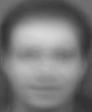

Image after NMF:


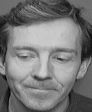

[[110. 106. 109. ... 108. 112. 109.]
 [109. 107. 110. ... 108. 110. 110.]
 [108. 107. 110. ... 109. 110. 108.]
 ...
 [ 68.  71.  61. ...  59.  53.  55.]
 [ 72.  68.  60. ...  54.  53.  60.]
 [ 68.  65.  60. ...  49.  53.  53.]]
Image Before NMF:
-------------------------------Number of image: 173
[[107. 108. 108. ... 108. 108. 107.]
 [108. 108. 108. ... 108. 108. 108.]
 [108. 108. 108. ... 108. 108. 108.]
 ...
 [ 81.  80.  82. ...  67.  68.  67.]
 [ 82.  81.  86. ...  68.  67.  69.]
 [ 83.  85.  87. ...  69.  68.  68.]]


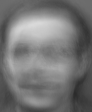

Image after NMF:


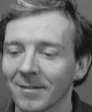

[[101. 104. 104. ... 109. 111. 108.]
 [101. 101. 104. ... 108. 109. 106.]
 [102. 103.  99. ... 108. 109. 109.]
 ...
 [ 68.  71.  72. ...  47.  45.  45.]
 [ 72.  78.  74. ...  50.  45.  44.]
 [ 71.  66.  72. ...  42.  46.  43.]]
Image Before NMF:
-------------------------------Number of image: 174
[[ 71.  71.  71. ...  72.  72.  72.]
 [ 71.  71.  71. ...  72.  72.  73.]
 [ 71.  71.  72. ...  72.  73.  73.]
 ...
 [153. 155. 156. ... 108. 106. 106.]
 [159. 161. 162. ... 112. 111. 110.]
 [162. 165. 167. ... 114. 112. 112.]]


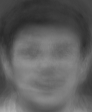

Image after NMF:


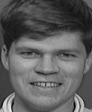

[[ 98.  94. 100. ... 102.  98. 102.]
 [ 94.  97.  99. ...  98. 102. 104.]
 [ 94.  97.  97. ... 100. 103. 100.]
 ...
 [135. 168. 160. ... 105. 122. 127.]
 [166. 175. 173. ... 165. 151. 153.]
 [183. 173. 190. ... 164. 167. 164.]]
Image Before NMF:
-------------------------------Number of image: 175
[[ 79.  79.  79. ...  77.  77.  77.]
 [ 79.  79.  79. ...  77.  77.  77.]
 [ 79.  79.  80. ...  77.  78.  77.]
 ...
 [136. 139. 140. ...  87.  85.  85.]
 [143. 145. 145. ...  91.  90.  88.]
 [146. 149. 150. ...  93.  91.  90.]]


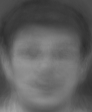

Image after NMF:


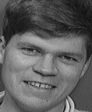

[[104. 100. 101. ...  54.  61.  46.]
 [103. 103. 102. ...  49.  64.  54.]
 [102. 102. 102. ...  48.  63.  58.]
 ...
 [135. 132. 132. ...  77.  76.  75.]
 [144. 134. 131. ...  75.  78.  72.]
 [140. 134. 132. ...  89.  79.  77.]]
Image Before NMF:
-------------------------------Number of image: 176
[[114. 113. 114. ... 120. 119. 119.]
 [114. 113. 113. ... 120. 120. 119.]
 [114. 114. 113. ... 119. 120. 120.]
 ...
 [ 61.  57.  61. ...  79.  80.  81.]
 [ 60.  58.  64. ...  80.  79.  80.]
 [ 60.  61.  65. ...  82.  82.  79.]]


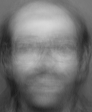

Image after NMF:


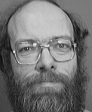

[[118. 120. 118. ... 122. 121. 119.]
 [121. 120. 121. ... 121. 121. 122.]
 [121. 119. 121. ... 122. 122. 120.]
 ...
 [ 63.  68.  65. ...  95.  98.  99.]
 [ 67.  65.  67. ...  98.  98. 100.]
 [ 66.  67.  66. ... 131. 113. 102.]]
Image Before NMF:
-------------------------------Number of image: 177
[[55. 55. 55. ... 59. 58. 58.]
 [55. 55. 56. ... 59. 59. 58.]
 [55. 55. 56. ... 58. 59. 59.]
 ...
 [36. 35. 35. ... 41. 41. 41.]
 [37. 36. 38. ... 41. 42. 42.]
 [39. 42. 43. ... 44. 43. 45.]]


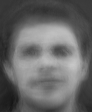

Image after NMF:


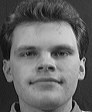

[[ 48.  47.  47. ...  60.  57.  59.]
 [ 46.  46.  51. ...  59.  59.  63.]
 [ 50.  47.  49. ...  59.  59.  61.]
 ...
 [ 37.  35.  37. ...  51.  46.  47.]
 [ 37.  36.  38. ...  48.  45.  46.]
 [ 37.  41.  40. ... 120. 104.  66.]]
Image Before NMF:
-------------------------------Number of image: 178
[[101. 102. 103. ... 100.  99.  99.]
 [101. 103. 102. ...  99. 100.  99.]
 [102. 102. 103. ... 100.  99. 100.]
 ...
 [103. 109. 114. ...  51.  52.  52.]
 [106. 111. 113. ...  51.  51.  53.]
 [105. 110. 111. ...  50.  51.  51.]]


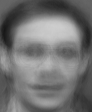

Image after NMF:


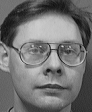

[[116. 112. 115. ... 107. 109. 113.]
 [116. 117. 114. ... 112. 106. 114.]
 [117. 113. 118. ... 112. 111. 111.]
 ...
 [ 98. 101.  97. ...  49.  56.  49.]
 [100.  99.  98. ...  57.  53.  52.]
 [102. 100. 110. ...  51.  55.  54.]]
Image Before NMF:
-------------------------------Number of image: 179
[[139. 138. 139. ... 132. 132. 132.]
 [139. 139. 138. ... 131. 131. 131.]
 [138. 138. 138. ... 132. 131. 130.]
 ...
 [ 15.  17.  16. ...  10.  10.  10.]
 [ 23.  21.  21. ...  11.  11.  10.]
 [ 26.  22.  24. ...  14.  13.  12.]]


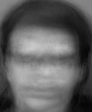

Image after NMF:


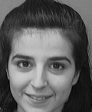

[[140. 134. 135. ... 129. 126. 128.]
 [140. 136. 135. ... 127. 126. 128.]
 [142. 132. 137. ... 126. 128. 128.]
 ...
 [ 63.  48.  47. ...  15.  26.  27.]
 [ 42.  45.  48. ...  23.  24.  36.]
 [ 43.  55.  43. ...  25.  26.  49.]]
Image Before NMF:
-------------------------------Number of image: 180
[[127. 127. 128. ... 121. 122. 121.]
 [127. 128. 128. ... 121. 121. 121.]
 [127. 127. 127. ... 122. 121. 121.]
 ...
 [131. 131. 133. ...  90.  89.  88.]
 [135. 135. 138. ...  90.  91.  91.]
 [138. 138. 142. ...  91.  92.  92.]]


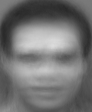

Image after NMF:


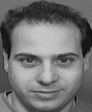

[[110. 112. 113. ... 112. 109. 115.]
 [108. 116. 113. ... 109. 114. 111.]
 [114. 110. 112. ... 111. 113. 110.]
 ...
 [141. 142. 141. ...  86.  91.  83.]
 [141. 141. 139. ...  86.  87.  88.]
 [137. 143. 137. ...  92.  87.  90.]]
Image Before NMF:
-------------------------------Number of image: 181
[[43. 43. 43. ... 43. 43. 43.]
 [43. 43. 42. ... 43. 43. 43.]
 [43. 43. 43. ... 43. 44. 43.]
 ...
 [29. 31. 32. ... 25. 25. 26.]
 [33. 35. 34. ... 26. 26. 26.]
 [34. 37. 37. ... 31. 30. 28.]]


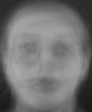

Image after NMF:


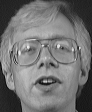

[[35. 32. 36. ... 36. 31. 35.]
 [38. 30. 35. ... 34. 33. 34.]
 [38. 34. 35. ... 30. 33. 33.]
 ...
 [35. 37. 41. ... 26. 25. 26.]
 [40. 38. 42. ... 26. 27. 27.]
 [42. 40. 40. ... 25. 28. 29.]]
Image Before NMF:
-------------------------------Number of image: 182
[[43. 42. 42. ... 42. 41. 41.]
 [43. 43. 43. ... 42. 42. 42.]
 [43. 44. 43. ... 41. 42. 42.]
 ...
 [87. 84. 86. ... 78. 77. 78.]
 [89. 89. 92. ... 81. 80. 79.]
 [91. 95. 97. ... 87. 86. 81.]]


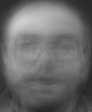

Image after NMF:


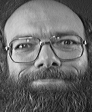

[[58. 48. 47. ... 46. 53. 42.]
 [56. 54. 50. ... 47. 48. 45.]
 [50. 50. 53. ... 47. 50. 47.]
 ...
 [61. 59. 82. ... 51. 39. 36.]
 [65. 63. 70. ... 34. 43. 38.]
 [76. 77. 81. ... 31. 43. 41.]]
Image Before NMF:
-------------------------------Number of image: 183
[[119. 120. 120. ... 117. 118. 118.]
 [119. 120. 120. ... 118. 117. 118.]
 [120. 119. 119. ... 118. 117. 117.]
 ...
 [131. 131. 134. ... 100.  99.  99.]
 [134. 134. 138. ... 100. 100. 101.]
 [136. 136. 140. ... 100. 101. 101.]]


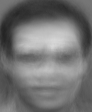

Image after NMF:


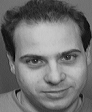

[[110. 109. 111. ... 111. 113. 116.]
 [108. 111. 109. ... 113. 112. 113.]
 [108. 109. 111. ... 110. 114. 115.]
 ...
 [137. 137. 141. ...  95.  89.  90.]
 [140. 133. 144. ...  96.  86.  90.]
 [142. 136. 138. ...  94.  88.  90.]]
Image Before NMF:
-------------------------------Number of image: 184
[[70. 69. 70. ... 72. 72. 72.]
 [69. 70. 69. ... 72. 72. 72.]
 [70. 69. 70. ... 72. 73. 72.]
 ...
 [45. 49. 51. ... 41. 41. 42.]
 [50. 53. 53. ... 42. 42. 41.]
 [52. 55. 55. ... 47. 45. 43.]]


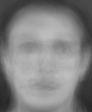

Image after NMF:


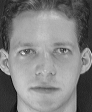

[[48. 49. 45. ... 56. 56. 54.]
 [45. 52. 39. ... 52. 50. 51.]
 [45. 50. 42. ... 48. 53. 50.]
 ...
 [50. 48. 50. ... 45. 46. 46.]
 [45. 54. 49. ... 46. 47. 47.]
 [51. 51. 51. ... 47. 46. 46.]]
Image Before NMF:
-------------------------------Number of image: 185
[[121. 121. 122. ... 128. 127. 127.]
 [122. 121. 121. ... 128. 128. 128.]
 [122. 121. 121. ... 127. 128. 128.]
 ...
 [ 79.  77.  80. ...  80.  80.  80.]
 [ 79.  78.  83. ...  80.  80.  82.]
 [ 80.  82.  85. ...  80.  80.  81.]]


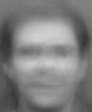

Image after NMF:


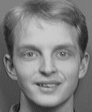

[[127. 131. 128. ... 123. 127. 122.]
 [132. 126. 127. ... 124. 126. 122.]
 [128. 127. 122. ... 123. 126. 124.]
 ...
 [ 95.  89.  86. ...  89.  91.  93.]
 [ 99.  91.  84. ...  93.  87.  90.]
 [ 96.  94.  88. ...  94.  84.  89.]]
Image Before NMF:
-------------------------------Number of image: 186
[[92. 92. 92. ... 96. 96. 96.]
 [92. 92. 92. ... 97. 97. 96.]
 [92. 91. 91. ... 96. 97. 97.]
 ...
 [38. 36. 38. ... 54. 55. 55.]
 [38. 35. 41. ... 53. 53. 55.]
 [38. 40. 42. ... 55. 55. 55.]]


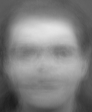

Image after NMF:


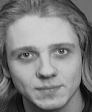

[[ 95. 101.  99. ... 109. 109. 110.]
 [ 98.  97.  99. ... 110. 108. 111.]
 [ 98.  98.  95. ... 111. 110. 109.]
 ...
 [ 62.  53.  61. ...  25.  42.  39.]
 [ 48.  69.  62. ...  31.  45.  43.]
 [ 55.  65.  46. ...  40.  42.  53.]]
Image Before NMF:
-------------------------------Number of image: 187
[[110. 110. 110. ... 112. 112. 111.]
 [110. 110. 109. ... 112. 112. 112.]
 [110. 110. 110. ... 111. 112. 113.]
 ...
 [ 55.  57.  61. ...  47.  48.  48.]
 [ 56.  58.  61. ...  46.  46.  47.]
 [ 56.  58.  59. ...  47.  48.  46.]]


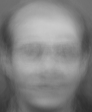

Image after NMF:


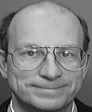

[[110. 106. 106. ... 117. 117. 122.]
 [109. 103. 109. ... 119. 119. 121.]
 [107. 104. 108. ... 119. 117. 120.]
 ...
 [ 24.  21.  28. ...  23.  19.  24.]
 [ 22.  22.  24. ...  20.  18.  21.]
 [ 20.  30.  25. ...  19.  21.  19.]]
Image Before NMF:
-------------------------------Number of image: 188
[[89. 90. 90. ... 96. 96. 96.]
 [88. 90. 89. ... 97. 97. 96.]
 [89. 89. 90. ... 96. 97. 97.]
 ...
 [78. 82. 85. ... 60. 62. 62.]
 [79. 83. 85. ... 60. 60. 62.]
 [79. 83. 84. ... 60. 59. 61.]]


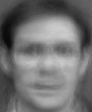

Image after NMF:


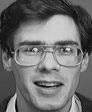

[[108. 110. 108. ... 107. 105. 105.]
 [110. 110. 110. ... 108. 104. 106.]
 [111. 107. 111. ... 107. 108. 107.]
 ...
 [ 40.  40.  44. ...  40.  36.  32.]
 [ 44.  48.  52. ...  26.  37.  36.]
 [ 41.  47.  54. ...  36.  35.  34.]]
Image Before NMF:
-------------------------------Number of image: 189
[[ 50.  50.  50. ...  47.  47.  47.]
 [ 50.  50.  50. ...  48.  47.  47.]
 [ 50.  50.  50. ...  48.  48.  47.]
 ...
 [118. 118. 119. ...  89.  88.  88.]
 [123. 123. 125. ...  93.  92.  90.]
 [125. 130. 132. ...  98.  95.  92.]]


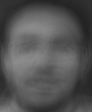

Image after NMF:


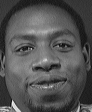

[[ 55.  56.  56. ...  55.  54.  50.]
 [ 56.  51.  60. ...  55.  47.  55.]
 [ 57.  54.  57. ...  51.  54.  52.]
 ...
 [183. 201. 201. ... 152. 149. 169.]
 [112. 148. 136. ... 107. 170. 192.]
 [125. 144. 128. ...  69. 144. 193.]]
Image Before NMF:
-------------------------------Number of image: 190
[[114. 115. 115. ... 111. 110. 110.]
 [114. 115. 115. ... 110. 111. 110.]
 [114. 115. 115. ... 111. 110. 111.]
 ...
 [143. 145. 148. ...  83.  82.  82.]
 [145. 147. 150. ...  83.  83.  84.]
 [146. 149. 152. ...  81.  82.  83.]]


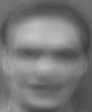

Image after NMF:


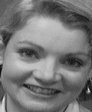

[[ 86.  89.  90. ... 143. 129. 125.]
 [ 83.  90.  89. ... 138. 140. 135.]
 [ 89.  89.  88. ... 136. 128. 131.]
 ...
 [201. 206. 209. ...  79.  75.  76.]
 [201. 206. 207. ... 112.  85.  66.]
 [201. 205. 208. ... 124. 116.  83.]]
Image Before NMF:
-------------------------------Number of image: 191
[[102. 102. 102. ... 105. 106. 106.]
 [102. 102. 103. ... 106. 106. 106.]
 [102. 102. 102. ... 106. 106. 106.]
 ...
 [135. 132. 133. ... 118. 117. 116.]
 [138. 135. 140. ... 121. 120. 120.]
 [140. 141. 145. ... 122. 120. 121.]]


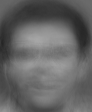

Image after NMF:


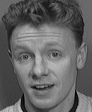

[[104. 108. 105. ... 104. 105. 108.]
 [104. 106. 105. ... 105. 106. 103.]
 [105. 105. 108. ... 102. 103. 106.]
 ...
 [ 83.  83.  99. ... 163. 176. 141.]
 [103. 124. 147. ... 179. 164. 148.]
 [160. 180. 156. ... 173. 175. 155.]]
Image Before NMF:
-------------------------------Number of image: 192
[[35. 34. 34. ... 33. 33. 33.]
 [35. 35. 35. ... 34. 33. 33.]
 [35. 35. 35. ... 33. 34. 34.]
 ...
 [82. 82. 83. ... 72. 71. 72.]
 [86. 88. 89. ... 75. 74. 72.]
 [89. 95. 95. ... 84. 81. 76.]]


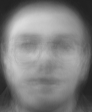

Image after NMF:


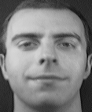

[[54. 52. 49. ... 44. 39. 36.]
 [53. 55. 47. ... 40. 40. 37.]
 [50. 53. 54. ... 40. 40. 35.]
 ...
 [43. 42. 40. ... 37. 28. 37.]
 [38. 40. 39. ... 34. 35. 31.]
 [42. 37. 36. ... 33. 33. 32.]]
Image Before NMF:
-------------------------------Number of image: 193
[[ 55.  55.  55. ...  52.  52.  52.]
 [ 55.  55.  56. ...  53.  53.  53.]
 [ 55.  55.  56. ...  53.  53.  53.]
 ...
 [133. 133. 134. ...  96.  95.  95.]
 [137. 138. 140. ... 100.  99.  97.]
 [139. 145. 146. ... 104. 101.  99.]]


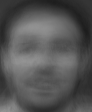

Image after NMF:


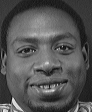

[[ 53.  58.  53. ...  48.  53.  53.]
 [ 54.  55.  64. ...  50.  50.  49.]
 [ 56.  57.  56. ...  52.  48.  54.]
 ...
 [123. 132. 109. ... 199. 140. 101.]
 [122. 146.  71. ... 202. 140.  81.]
 [105. 148.  77. ... 195. 122.  76.]]
Image Before NMF:
-------------------------------Number of image: 194
[[ 31.  32.  32. ...  30.  30.  30.]
 [ 32.  32.  33. ...  31.  30.  31.]
 [ 32.  32.  33. ...  31.  31.  31.]
 ...
 [184. 184. 184. ... 129. 126. 125.]
 [188. 189. 191. ... 133. 132. 130.]
 [191. 197. 199. ... 135. 133. 133.]]


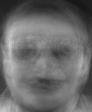

Image after NMF:


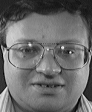

[[ 37.  36.  35. ...  33.  27.  29.]
 [ 36.  34.  35. ...  31.  29.  27.]
 [ 36.  34.  35. ...  30.  33.  28.]
 ...
 [184. 154. 188. ... 211. 192. 159.]
 [172. 152. 204. ... 215. 208. 149.]
 [163. 167. 213. ... 210. 212. 157.]]
Image Before NMF:
-------------------------------Number of image: 195
[[107. 108. 108. ... 108. 108. 108.]
 [107. 108. 108. ... 108. 108. 108.]
 [108. 107. 108. ... 108. 108. 108.]
 ...
 [ 96.  99. 103. ...  64.  65.  65.]
 [ 98. 101. 104. ...  64.  64.  66.]
 [ 99. 103. 105. ...  64.  64.  65.]]


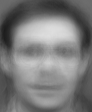

Image after NMF:


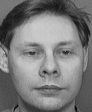

[[119. 121. 119. ... 118. 118. 119.]
 [118. 120. 121. ... 119. 119. 120.]
 [120. 120. 124. ... 116. 116. 116.]
 ...
 [ 84.  86.  83. ...  80.  79.  87.]
 [ 87.  82.  89. ...  78.  85.  76.]
 [ 85.  88. 105. ...  82.  78.  80.]]
Image Before NMF:
-------------------------------Number of image: 196
[[113. 113. 113. ... 117. 116. 116.]
 [113. 113. 112. ... 116. 117. 116.]
 [113. 113. 112. ... 115. 117. 117.]
 ...
 [ 49.  50.  54. ...  47.  48.  49.]
 [ 50.  51.  54. ...  47.  47.  48.]
 [ 50.  52.  54. ...  48.  49.  47.]]


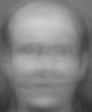

Image after NMF:


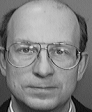

[[108. 112. 110. ... 119. 119. 122.]
 [111. 110. 113. ... 121. 120. 120.]
 [111. 111. 111. ... 119. 119. 120.]
 ...
 [ 23.  23.  20. ...  23.  35.  62.]
 [ 27.  28.  23. ...  24.  20.  27.]
 [ 25.  25.  19. ...  22.  30.  20.]]
Image Before NMF:
-------------------------------Number of image: 197
[[106. 107. 107. ... 110. 110. 110.]
 [106. 107. 107. ... 111. 110. 110.]
 [107. 106. 107. ... 110. 111. 111.]
 ...
 [ 86.  88.  90. ...  65.  65.  65.]
 [ 88.  89.  91. ...  65.  65.  67.]
 [ 88.  90.  92. ...  63.  63.  66.]]


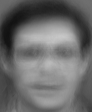

Image after NMF:


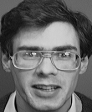

[[102. 103. 103. ... 103. 100. 101.]
 [102. 103. 103. ... 101.  97. 101.]
 [104. 102. 102. ... 101. 102. 101.]
 ...
 [ 43.  41.  42. ...  37.  36.  27.]
 [ 36.  41.  48. ...  37.  43.  35.]
 [ 42.  40.  31. ...  36.  37.  31.]]
Image Before NMF:
-------------------------------Number of image: 198
[[111. 111. 112. ... 112. 112. 112.]
 [111. 111. 111. ... 113. 112. 112.]
 [111. 111. 111. ... 112. 112. 113.]
 ...
 [ 63.  65.  68. ...  50.  52.  52.]
 [ 65.  66.  69. ...  50.  50.  52.]
 [ 65.  68.  69. ...  50.  51.  51.]]


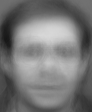

Image after NMF:


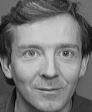

[[104. 109. 104. ... 110. 111. 109.]
 [104. 108. 106. ... 107. 112. 110.]
 [106. 103. 106. ... 109. 111. 112.]
 ...
 [ 73.  77.  78. ...  59.  56.  63.]
 [ 72.  84.  82. ...  56.  57.  60.]
 [ 78.  77.  77. ...  52.  59.  56.]]
Image Before NMF:
-------------------------------Number of image: 199
[[116. 116. 116. ... 113. 113. 112.]
 [116. 116. 116. ... 113. 113. 112.]
 [116. 116. 115. ... 113. 112. 113.]
 ...
 [ 95.  92.  95. ...  80.  80.  80.]
 [ 96.  94. 100. ...  80.  80.  81.]
 [ 97.  99. 103. ...  82.  83.  82.]]


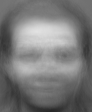

Image after NMF:


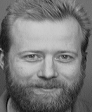

[[112. 109. 110. ... 112. 110. 111.]
 [108. 112. 110. ... 113. 112. 111.]
 [110. 110. 112. ... 114. 107. 116.]
 ...
 [107. 107. 107. ...  71.  77.  78.]
 [110. 108. 104. ...  59.  77.  77.]
 [109. 108. 104. ...  65.  69.  83.]]
Image Before NMF:
-------------------------------Number of image: 200
[[ 83.  83.  83. ...  81.  81.  81.]
 [ 83.  84.  82. ...  81.  81.  81.]
 [ 83.  84.  84. ...  81.  82.  81.]
 ...
 [154. 159. 160. ...  91.  89.  88.]
 [161. 165. 164. ...  94.  93.  92.]
 [163. 166. 168. ...  95.  93.  93.]]


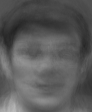

Image after NMF:


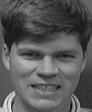

[[ 93.  92.  97. ... 102. 100.  98.]
 [ 92.  95.  90. ... 100.  99.  99.]
 [ 90.  95.  98. ...  96. 101. 102.]
 ...
 [187. 198. 196. ... 105. 102.  92.]
 [193. 202. 197. ... 107. 117. 117.]
 [197. 203. 196. ...  94.  90.  94.]]
Image Before NMF:
-------------------------------Number of image: 201
[[102. 102. 102. ...  95.  94.  94.]
 [102. 103. 103. ...  94.  94.  94.]
 [102. 102. 103. ...  95.  95.  94.]
 ...
 [ 35.  38.  36. ...  13.  14.  14.]
 [ 42.  42.  42. ...  16.  16.  14.]
 [ 46.  49.  49. ...  21.  19.  19.]]


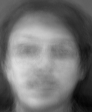

Image after NMF:


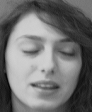

[[129. 127. 128. ... 117. 118. 115.]
 [130. 125. 129. ... 118. 118. 114.]
 [124. 128. 124. ... 118. 119. 115.]
 ...
 [ 39.  40.  40. ...  35.  39.  46.]
 [ 42.  39.  41. ...  32.  37.  41.]
 [ 45.  42.  42. ...  32.  35.  40.]]
Image Before NMF:
-------------------------------Number of image: 202
[[47. 46. 46. ... 46. 46. 46.]
 [47. 46. 46. ... 46. 46. 46.]
 [48. 47. 47. ... 46. 47. 46.]
 ...
 [52. 52. 53. ... 58. 58. 59.]
 [57. 58. 59. ... 62. 61. 59.]
 [60. 64. 64. ... 71. 69. 62.]]


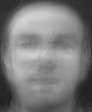

Image after NMF:


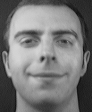

[[53. 50. 52. ... 39. 37. 42.]
 [52. 53. 52. ... 42. 33. 41.]
 [54. 57. 53. ... 40. 39. 44.]
 ...
 [42. 40. 42. ... 36. 28. 35.]
 [40. 40. 39. ... 32. 37. 33.]
 [40. 35. 41. ... 35. 34. 33.]]
Image Before NMF:
-------------------------------Number of image: 203
[[137. 137. 137. ... 131. 131. 131.]
 [137. 137. 138. ... 131. 130. 131.]
 [137. 136. 137. ... 131. 131. 130.]
 ...
 [112. 111. 111. ...  81.  81.  80.]
 [118. 116. 119. ...  84.  84.  83.]
 [122. 123. 126. ...  87.  85.  85.]]


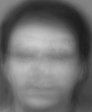

Image after NMF:


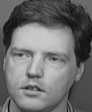

[[109. 112. 114. ... 104. 108. 109.]
 [113. 112. 112. ... 105. 107. 105.]
 [111. 112. 112. ... 108. 105. 103.]
 ...
 [120.  84. 113. ...  71.  71.  68.]
 [101.  90. 123. ...  72.  71.  71.]
 [ 80. 108. 124. ...  69.  72.  69.]]
Image Before NMF:
-------------------------------Number of image: 204
[[130. 130. 131. ... 127. 127. 127.]
 [131. 131. 131. ... 127. 126. 127.]
 [131. 130. 130. ... 127. 127. 126.]
 ...
 [101.  99.  99. ...  80.  80.  79.]
 [106. 103. 106. ...  83.  82.  82.]
 [110. 110. 113. ...  85.  83.  84.]]


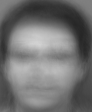

Image after NMF:


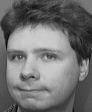

[[124. 126. 124. ... 120. 120. 119.]
 [124. 122. 126. ... 121. 117. 120.]
 [125. 125. 123. ... 120. 117. 121.]
 ...
 [ 74.  74.  68. ...  81.  79.  79.]
 [ 74.  71.  69. ...  79.  78.  82.]
 [ 72.  72.  68. ...  78.  78.  77.]]
Image Before NMF:
-------------------------------Number of image: 205
[[126. 125. 125. ... 125. 125. 125.]
 [126. 125. 125. ... 125. 125. 125.]
 [125. 125. 125. ... 125. 125. 125.]
 ...
 [101.  98. 101. ...  90.  89.  89.]
 [104. 102. 106. ...  91.  90.  91.]
 [106. 104. 108. ...  92.  92.  91.]]


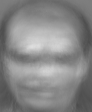

Image after NMF:


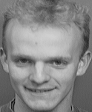

[[132. 127. 128. ... 127. 124. 125.]
 [129. 126. 129. ... 124. 127. 126.]
 [129. 128. 125. ... 125. 127. 128.]
 ...
 [118.  86.  96. ...  89.  86.  84.]
 [122.  81.  97. ...  85.  84.  84.]
 [118.  79.  93. ...  85.  83.  85.]]
Image Before NMF:
-------------------------------Number of image: 206
[[ 42.  42.  41. ...  41.  41.  41.]
 [ 42.  41.  42. ...  41.  41.  42.]
 [ 42.  43.  42. ...  41.  42.  42.]
 ...
 [209. 206. 209. ... 157. 154. 154.]
 [212. 214. 217. ... 163. 160. 158.]
 [215. 220. 224. ... 167. 164. 159.]]


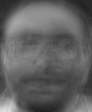

Image after NMF:


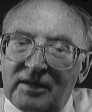

[[ 19.  23.  20. ...  17.  16.  15.]
 [ 22.  22.  19. ...  17.  18.  18.]
 [ 22.  24.  18. ...  18.  17.  17.]
 ...
 [169. 160. 157. ... 156. 167. 177.]
 [169. 158. 154. ... 164. 171. 176.]
 [168. 160. 154. ... 169. 173. 175.]]
Image Before NMF:
-------------------------------Number of image: 207
[[ 46.  46.  46. ...  45.  45.  45.]
 [ 46.  46.  47. ...  46.  46.  46.]
 [ 47.  47.  47. ...  46.  46.  46.]
 ...
 [123. 122. 124. ...  95.  94.  94.]
 [126. 128. 130. ...  99.  98.  96.]
 [129. 134. 135. ... 104. 101.  98.]]


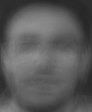

Image after NMF:


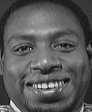

[[ 49.  65.  53. ...  54.  50.  56.]
 [ 62.  55.  59. ...  51.  52.  54.]
 [ 57.  63.  51. ...  54.  51.  56.]
 ...
 [146. 134. 158. ...  82.  72.  78.]
 [125. 159. 151. ... 142.  84.  65.]
 [104. 221. 209. ... 134. 130. 145.]]
Image Before NMF:
-------------------------------Number of image: 208
[[70. 69. 69. ... 77. 76. 76.]
 [70. 69. 68. ... 77. 77. 76.]
 [70. 70. 69. ... 75. 78. 78.]
 ...
 [53. 54. 57. ... 62. 61. 62.]
 [54. 57. 58. ... 62. 61. 61.]
 [55. 57. 58. ... 66. 66. 62.]]


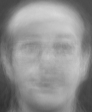

Image after NMF:


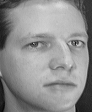

[[64. 76. 80. ... 52. 54. 52.]
 [60. 61. 60. ... 52. 53. 51.]
 [63. 80. 79. ... 53. 52. 59.]
 ...
 [21. 22. 12. ... 37. 42. 35.]
 [19. 20.  7. ... 42. 35. 42.]
 [24. 14. 11. ... 35. 37. 39.]]
Image Before NMF:
-------------------------------Number of image: 209
[[113. 113. 113. ... 117. 116. 116.]
 [113. 113. 112. ... 117. 117. 117.]
 [113. 113. 112. ... 116. 117. 118.]
 ...
 [ 43.  43.  46. ...  49.  50.  50.]
 [ 44.  44.  47. ...  48.  48.  50.]
 [ 44.  44.  46. ...  50.  50.  48.]]


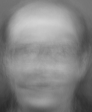

Image after NMF:


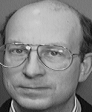

[[111. 112. 110. ... 118. 121. 119.]
 [108. 114. 110. ... 120. 122. 121.]
 [113. 109. 112. ... 118. 121. 122.]
 ...
 [ 21.  23.  23. ...  24.  17.  20.]
 [ 24.  23.  21. ...  21.  21.  19.]
 [ 24.  20.  22. ...  21.  20.  17.]]
Image Before NMF:
-------------------------------Number of image: 210
[[63. 63. 64. ... 65. 65. 65.]
 [63. 63. 63. ... 65. 65. 65.]
 [63. 63. 63. ... 65. 65. 65.]
 ...
 [55. 58. 61. ... 46. 46. 47.]
 [56. 59. 61. ... 45. 45. 46.]
 [56. 60. 61. ... 47. 48. 47.]]


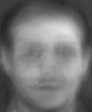

Image after NMF:


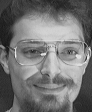

[[52. 56. 60. ... 48. 55. 57.]
 [51. 59. 54. ... 53. 62. 56.]
 [57. 54. 59. ... 55. 54. 58.]
 ...
 [55. 52. 58. ... 38. 44. 42.]
 [50. 49. 55. ... 49. 40. 42.]
 [49. 51. 51. ... 39. 41. 44.]]
Image Before NMF:
-------------------------------Number of image: 211
[[108. 108. 109. ... 106. 105. 105.]
 [108. 108. 108. ... 105. 105. 105.]
 [108. 108. 108. ... 105. 105. 105.]
 ...
 [ 39.  38.  41. ...  28.  29.  29.]
 [ 39.  37.  42. ...  25.  27.  29.]
 [ 39.  39.  41. ...  25.  28.  29.]]


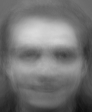

Image after NMF:


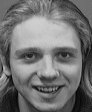

[[111. 106. 106. ... 111. 108. 107.]
 [108. 107. 108. ... 113. 110. 105.]
 [108. 109. 108. ... 111. 111. 112.]
 ...
 [ 50.  31.  36. ...  37.  39.  29.]
 [ 40.  31.  32. ...  41.  36.  31.]
 [ 39.  39.  33. ...  43.  34.  43.]]
Image Before NMF:
-------------------------------Number of image: 212
[[121. 122. 122. ... 117. 116. 116.]
 [121. 122. 121. ... 116. 117. 116.]
 [121. 122. 122. ... 116. 116. 116.]
 ...
 [136. 140. 145. ...  74.  74.  74.]
 [140. 144. 146. ...  75.  74.  75.]
 [140. 144. 146. ...  74.  75.  74.]]


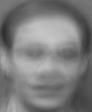

Image after NMF:


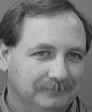

[[123. 122. 121. ... 117. 116. 115.]
 [124. 123. 121. ... 115. 116. 117.]
 [123. 123. 123. ... 116. 116. 116.]
 ...
 [ 88. 100. 129. ...  94.  85.  79.]
 [ 86.  95. 129. ...  84.  92.  95.]
 [ 78.  95. 125. ...  84.  92.  94.]]
Image Before NMF:
-------------------------------Number of image: 213
[[102. 102. 102. ... 104. 104. 104.]
 [102. 102. 103. ... 104. 104. 104.]
 [102. 102. 102. ... 104. 104. 104.]
 ...
 [115. 113. 113. ... 102. 101. 101.]
 [118. 116. 120. ... 104. 104. 104.]
 [121. 121. 125. ... 106. 104. 105.]]


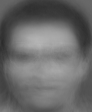

Image after NMF:


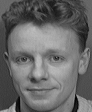

[[104. 106. 105. ... 101. 104. 102.]
 [101. 107. 102. ... 103. 102. 103.]
 [106. 104. 106. ... 101. 102. 103.]
 ...
 [ 63.  64.  63. ... 165. 156. 155.]
 [ 85. 110. 126. ... 161. 159. 160.]
 [149. 167. 165. ... 148. 155. 168.]]
Image Before NMF:
-------------------------------Number of image: 214
[[115. 114. 115. ... 115. 115. 115.]
 [115. 114. 115. ... 116. 115. 115.]
 [115. 115. 114. ... 116. 115. 116.]
 ...
 [127. 123. 125. ... 111. 111. 110.]
 [129. 127. 132. ... 114. 113. 113.]
 [131. 133. 137. ... 117. 115. 113.]]


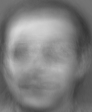

Image after NMF:


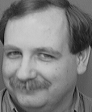

[[119. 123. 121. ... 115. 117. 116.]
 [119. 121. 122. ... 118. 114. 119.]
 [121. 121. 121. ... 115. 114. 115.]
 ...
 [139.  77.  90. ...  94. 106.  91.]
 [141.  81.  87. ...  95. 107.  91.]
 [140.  82.  89. ...  93. 106.  90.]]
Image Before NMF:
-------------------------------Number of image: 215
[[ 97.  98.  98. ...  97.  97.  97.]
 [ 97.  98.  97. ...  97.  97.  97.]
 [ 98.  97.  98. ...  97.  98.  97.]
 ...
 [ 97. 103. 105. ...  52.  53.  52.]
 [102. 106. 106. ...  54.  54.  54.]
 [103. 107. 107. ...  53.  53.  54.]]


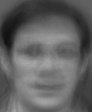

Image after NMF:


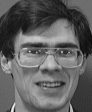

[[113. 111. 112. ... 112. 110. 109.]
 [113. 112. 111. ... 111. 112. 110.]
 [108. 112. 110. ... 111. 108. 111.]
 ...
 [ 99. 100.  97. ...  49.  54.  47.]
 [ 98. 101.  96. ...  48.  53.  53.]
 [ 97.  96.  95. ...  47.  57.  55.]]
Image Before NMF:
-------------------------------Number of image: 216
[[125. 126. 127. ... 117. 118. 117.]
 [126. 127. 126. ... 117. 117. 117.]
 [126. 126. 126. ... 118. 116. 116.]
 ...
 [131. 133. 136. ...  72.  72.  72.]
 [135. 137. 140. ...  72.  73.  74.]
 [137. 138. 141. ...  72.  74.  74.]]


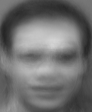

Image after NMF:


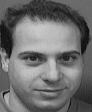

[[100. 110. 107. ... 102. 105. 107.]
 [105. 108. 105. ... 104. 102. 105.]
 [107. 106. 105. ... 105. 108. 103.]
 ...
 [129. 127. 132. ...  70.  63.  63.]
 [138. 130. 134. ...  65.  68.  56.]
 [138. 130. 131. ...  64.  71.  59.]]
Image Before NMF:
-------------------------------Number of image: 217
[[147. 147. 147. ... 143. 143. 143.]
 [147. 147. 146. ... 142. 143. 143.]
 [147. 147. 147. ... 142. 143. 142.]
 ...
 [175. 177. 178. ... 113. 110. 110.]
 [183. 185. 185. ... 116. 115. 114.]
 [187. 186. 190. ... 117. 116. 115.]]


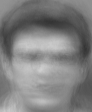

Image after NMF:


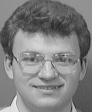

[[144. 144. 145. ... 145. 145. 145.]
 [144. 145. 144. ... 143. 146. 145.]
 [145. 145. 145. ... 145. 147. 143.]
 ...
 [153. 158. 186. ...  81.  81.  79.]
 [192. 216. 224. ...  85.  80.  79.]
 [226. 222. 223. ...  76.  78.  82.]]
Image Before NMF:
-------------------------------Number of image: 218
[[ 63.  63.  64. ...  57.  56.  56.]
 [ 63.  64.  65. ...  57.  56.  56.]
 [ 64.  64.  65. ...  57.  57.  56.]
 ...
 [100. 102. 102. ...  64.  64.  64.]
 [107. 107. 110. ...  69.  69.  66.]
 [111. 119. 119. ...  76.  73.  71.]]


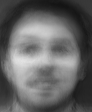

Image after NMF:


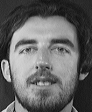

[[ 48.  46.  49. ...  37.  39.  40.]
 [ 43.  53.  46. ...  36.  40.  41.]
 [ 52.  43.  53. ...  40.  39.  41.]
 ...
 [ 62.  48.  49. ...  30.  33.  32.]
 [ 56.  25.  92. ...  32.  31.  30.]
 [ 43. 110. 215. ...  31.  31.  36.]]
Image Before NMF:
-------------------------------Number of image: 219
[[ 71.  71.  71. ...  65.  65.  65.]
 [ 71.  72.  73. ...  66.  65.  65.]
 [ 72.  71.  72. ...  66.  65.  65.]
 ...
 [ 86.  86.  85. ...  59.  59.  59.]
 [ 92.  90.  93. ...  63.  63.  62.]
 [ 96. 102. 103. ...  70.  66.  66.]]


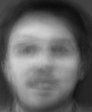

Image after NMF:


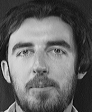

[[45. 49. 47. ... 40. 39. 42.]
 [46. 51. 50. ... 41. 39. 37.]
 [48. 48. 51. ... 41. 38. 38.]
 ...
 [53. 62. 59. ... 36. 33. 36.]
 [56. 56. 54. ... 37. 39. 36.]
 [67. 84. 88. ... 40. 30. 44.]]
Image Before NMF:
-------------------------------Number of image: 220
[[83. 83. 83. ... 77. 77. 76.]
 [83. 84. 84. ... 76. 76. 76.]
 [83. 83. 84. ... 77. 76. 76.]
 ...
 [74. 77. 77. ... 41. 41. 41.]
 [79. 79. 81. ... 41. 42. 42.]
 [81. 84. 85. ... 43. 44. 44.]]


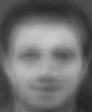

Image after NMF:


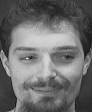

[[50. 57. 56. ... 58. 56. 57.]
 [52. 56. 60. ... 58. 57. 55.]
 [52. 56. 58. ... 59. 56. 57.]
 ...
 [52. 56. 56. ... 41. 46. 43.]
 [59. 53. 54. ... 40. 46. 42.]
 [58. 56. 53. ... 39. 46. 43.]]
Image Before NMF:
-------------------------------Number of image: 221
[[110. 110. 110. ... 108. 108. 107.]
 [110. 110. 110. ... 108. 108. 107.]
 [110. 110. 110. ... 108. 107. 108.]
 ...
 [116. 113. 117. ...  91.  91.  91.]
 [115. 115. 121. ...  91.  91.  93.]
 [116. 119. 123. ...  92.  94.  92.]]


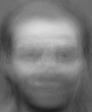

Image after NMF:


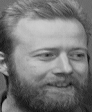

[[112. 107. 111. ... 106. 110. 104.]
 [107. 110. 102. ... 109. 106. 107.]
 [109. 106. 112. ... 105. 109. 108.]
 ...
 [ 61.  81. 170. ...  47.  48.  48.]
 [ 70.  71. 168. ...  46.  44.  50.]
 [ 80.  59. 153. ...  39.  45.  57.]]
Image Before NMF:
-------------------------------Number of image: 222
[[106. 106. 106. ... 102. 103. 103.]
 [107. 106. 107. ... 103. 102. 102.]
 [106. 106. 107. ... 103. 103. 102.]
 ...
 [131. 130. 129. ...  97.  95.  95.]
 [137. 135. 137. ... 100.  99.  99.]
 [140. 141. 144. ... 102. 101. 101.]]


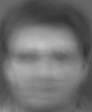

Image after NMF:


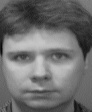

[[118. 122. 118. ... 119. 126. 126.]
 [122. 118. 117. ... 122. 125. 125.]
 [119. 121. 116. ... 122. 124. 124.]
 ...
 [ 90. 101. 104. ...  80.  90.  88.]
 [ 93.  83. 110. ...  76.  79.  80.]
 [103.  68. 103. ...  78.  62.  62.]]
Image Before NMF:
-------------------------------Number of image: 223
[[ 84.  84.  84. ...  79.  79.  79.]
 [ 84.  84.  84. ...  79.  78.  79.]
 [ 84.  84.  84. ...  79.  79.  78.]
 ...
 [168. 168. 169. ... 112. 109. 109.]
 [174. 174. 176. ... 115. 114. 113.]
 [178. 179. 182. ... 117. 115. 115.]]


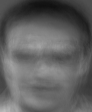

Image after NMF:


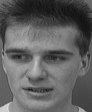

[[110. 113. 108. ... 105. 100. 105.]
 [108. 113. 107. ... 105. 102. 106.]
 [109. 111. 112. ... 103. 102. 104.]
 ...
 [202. 201. 204. ...  65.  65.  67.]
 [204. 202. 203. ...  66.  61.  66.]
 [204. 203. 204. ...  63.  63.  61.]]
Image Before NMF:
-------------------------------Number of image: 224
[[ 80.  79.  79. ...  90.  90.  90.]
 [ 80.  79.  78. ...  91.  91.  91.]
 [ 80.  79.  79. ...  89.  92.  92.]
 ...
 [ 96.  94.  95. ... 109. 108. 108.]
 [ 98.  97. 100. ... 112. 110. 110.]
 [100. 102. 104. ... 115. 112. 111.]]


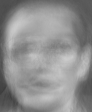

Image after NMF:


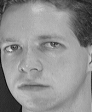

[[ 43.  50.  41. ...  55.  55.  56.]
 [ 45.  53.  44. ...  67.  62.  52.]
 [ 57.  47.  47. ...  45.  59.  55.]
 ...
 [ 49.  49.  46. ... 154. 152. 175.]
 [ 46.  48.  47. ... 157. 150. 174.]
 [ 49.  50.  43. ... 158. 153. 169.]]
Image Before NMF:
-------------------------------Number of image: 225
[[125. 125. 126. ... 126. 125. 125.]
 [126. 125. 124. ... 125. 125. 125.]
 [125. 125. 125. ... 125. 125. 125.]
 ...
 [ 61.  61.  64. ...  50.  50.  50.]
 [ 62.  62.  65. ...  49.  49.  51.]
 [ 63.  62.  65. ...  48.  50.  50.]]


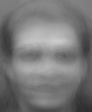

Image after NMF:


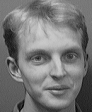

[[119. 121. 123. ... 122. 118. 119.]
 [122. 123. 123. ... 122. 120. 120.]
 [120. 125. 121. ... 123. 121. 120.]
 ...
 [ 85.  88.  88. ...  38.  36.  43.]
 [ 84.  84.  87. ...  37.  34.  45.]
 [ 80.  89.  85. ...  36.  40.  36.]]
Image Before NMF:
-------------------------------Number of image: 226
[[44. 44. 44. ... 44. 44. 44.]
 [44. 44. 43. ... 44. 44. 44.]
 [44. 44. 44. ... 44. 45. 44.]
 ...
 [31. 33. 33. ... 29. 29. 29.]
 [34. 36. 36. ... 29. 30. 29.]
 [35. 39. 39. ... 34. 34. 31.]]


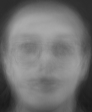

Image after NMF:


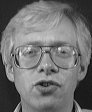

[[ 34.  39.  35. ...  36.  35.  35.]
 [ 35.  35.  36. ...  34.  35.  35.]
 [ 35.  42.  34. ...  34.  37.  36.]
 ...
 [ 38.  36.  39. ...  58.  43.  34.]
 [ 41.  34.  43. ... 129. 129. 121.]
 [ 39.  36.  35. ... 135. 138. 148.]]
Image Before NMF:
-------------------------------Number of image: 227
[[143. 143. 143. ... 139. 138. 138.]
 [143. 143. 142. ... 138. 138. 138.]
 [143. 143. 144. ... 138. 139. 138.]
 ...
 [179. 181. 182. ... 116. 114. 113.]
 [187. 188. 189. ... 120. 119. 118.]
 [191. 192. 195. ... 121. 119. 119.]]


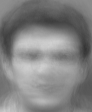

Image after NMF:


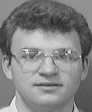

[[139. 143. 146. ... 145. 146. 146.]
 [141. 148. 141. ... 143. 143. 144.]
 [145. 142. 141. ... 143. 146. 145.]
 ...
 [170. 203. 218. ...  80.  77.  80.]
 [222. 224. 223. ...  84.  75.  84.]
 [222. 223. 221. ...  83.  81.  74.]]
Image Before NMF:
-------------------------------Number of image: 228
[[ 93.  93.  93. ...  92.  92.  92.]
 [ 93.  93.  93. ...  92.  92.  92.]
 [ 93.  93.  94. ...  92.  92.  92.]
 ...
 [103. 104. 105. ...  69.  68.  67.]
 [107. 108. 109. ...  71.  71.  70.]
 [110. 111. 113. ...  72.  71.  71.]]


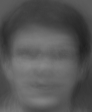

Image after NMF:


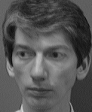

[[104.  98. 100. ...  93.  96.  93.]
 [ 97. 101. 101. ...  93.  94.  93.]
 [ 99. 100. 100. ...  97.  98.  91.]
 ...
 [ 92.  92.  89. ...  56.  52.  51.]
 [ 88.  88.  93. ...  51.  53.  50.]
 [ 84.  92.  90. ...  52.  49.  53.]]
Image Before NMF:
-------------------------------Number of image: 229
[[66. 66. 66. ... 69. 68. 69.]
 [65. 66. 65. ... 69. 69. 69.]
 [66. 66. 66. ... 68. 70. 69.]
 ...
 [65. 70. 73. ... 49. 50. 51.]
 [69. 75. 74. ... 51. 51. 50.]
 [70. 75. 75. ... 55. 54. 51.]]


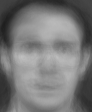

Image after NMF:


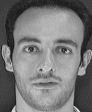

[[60. 57. 59. ... 61. 61. 63.]
 [58. 60. 59. ... 66. 60. 63.]
 [59. 59. 60. ... 64. 60. 61.]
 ...
 [54. 51. 54. ... 57. 57. 57.]
 [54. 53. 50. ... 56. 54. 61.]
 [54. 52. 46. ... 49. 55. 54.]]
Image Before NMF:
-------------------------------Number of image: 230
[[ 52.  52.  52. ...  49.  49.  49.]
 [ 52.  52.  52. ...  50.  49.  49.]
 [ 53.  53.  53. ...  50.  50.  49.]
 ...
 [104. 104. 105. ...  80.  78.  79.]
 [109. 109. 111. ...  83.  82.  80.]
 [111. 114. 116. ...  88.  86.  82.]]


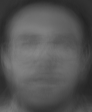

Image after NMF:


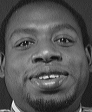

[[ 58.  54.  57. ...  53.  50.  54.]
 [ 57.  50.  57. ...  51.  54.  47.]
 [ 59.  52.  60. ...  52.  53.  53.]
 ...
 [ 76.  97. 104. ... 119. 113. 106.]
 [160. 191. 205. ... 119. 137. 142.]
 [136. 136. 149. ...  97. 115. 128.]]
Image Before NMF:
-------------------------------Number of image: 231
[[70. 70. 70. ... 70. 69. 70.]
 [70. 70. 71. ... 70. 70. 70.]
 [70. 70. 71. ... 70. 71. 70.]
 ...
 [52. 52. 51. ... 50. 49. 49.]
 [58. 56. 57. ... 52. 52. 51.]
 [61. 65. 65. ... 58. 56. 56.]]


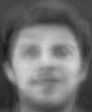

Image after NMF:


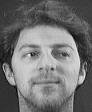

[[54. 51. 49. ... 58. 56. 57.]
 [54. 49. 52. ... 58. 60. 56.]
 [51. 51. 55. ... 62. 59. 57.]
 ...
 [48. 49. 46. ... 57. 66. 61.]
 [49. 47. 52. ... 62. 60. 62.]
 [47. 48. 51. ... 61. 59. 63.]]
Image Before NMF:
-------------------------------Number of image: 232
[[123. 124. 125. ... 120. 120. 119.]
 [124. 125. 124. ... 119. 120. 119.]
 [124. 124. 124. ... 120. 119. 119.]
 ...
 [129. 131. 135. ...  78.  78.  78.]
 [131. 134. 137. ...  78.  78.  79.]
 [132. 135. 138. ...  78.  79.  79.]]


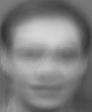

Image after NMF:


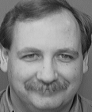

[[120. 123. 119. ... 114. 113. 115.]
 [122. 122. 121. ... 117. 114. 114.]
 [121. 121. 120. ... 114. 115. 114.]
 ...
 [121. 131. 138. ...  98.  96. 101.]
 [119. 131. 138. ...  96.  94. 102.]
 [115. 130. 132. ...  96.  95. 103.]]
Image Before NMF:
-------------------------------Number of image: 233
[[47. 46. 47. ... 46. 45. 46.]
 [46. 47. 47. ... 46. 46. 46.]
 [47. 47. 47. ... 46. 46. 46.]
 ...
 [38. 39. 40. ... 40. 41. 42.]
 [42. 43. 45. ... 43. 43. 41.]
 [45. 51. 50. ... 51. 49. 45.]]


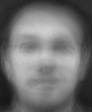

Image after NMF:


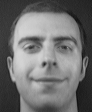

[[46. 48. 51. ... 37. 36. 31.]
 [53. 47. 51. ... 37. 32. 35.]
 [54. 51. 50. ... 36. 37. 34.]
 ...
 [42. 41. 43. ... 32. 35. 31.]
 [46. 36. 45. ... 29. 35. 32.]
 [41. 43. 37. ... 34. 30. 32.]]
Image Before NMF:
-------------------------------Number of image: 234
[[ 58.  58.  58. ...  56.  56.  56.]
 [ 58.  58.  59. ...  57.  56.  56.]
 [ 58.  58.  59. ...  57.  57.  56.]
 ...
 [126. 126. 127. ...  92.  91.  91.]
 [129. 130. 133. ...  95.  94.  93.]
 [132. 137. 138. ...  98.  96.  95.]]


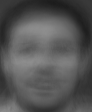

Image after NMF:


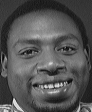

[[ 56.  58.  50. ...  55.  48.  54.]
 [ 56.  49.  59. ...  51.  53.  47.]
 [ 52.  55.  57. ...  54.  47.  55.]
 ...
 [126. 136. 140. ...  73. 139. 200.]
 [128. 134. 112. ...  86.  86. 202.]
 [155. 122. 110. ...  63.  75. 189.]]
Image Before NMF:
-------------------------------Number of image: 235
[[ 91.  91.  91. ...  88.  88.  88.]
 [ 91.  91.  91. ...  88.  88.  88.]
 [ 91.  91.  91. ...  88.  88.  88.]
 ...
 [124. 123. 124. ...  85.  84.  84.]
 [127. 126. 129. ...  86.  86.  87.]
 [129. 130. 133. ...  87.  87.  88.]]


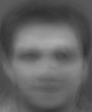

Image after NMF:


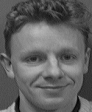

[[ 93.  98.  95. ...  87.  92.  89.]
 [ 96.  95.  97. ...  89.  88.  90.]
 [ 99.  98.  94. ...  87.  90.  88.]
 ...
 [ 83.  81.  91. ... 122. 120. 133.]
 [121. 132. 155. ... 126. 126. 142.]
 [168. 163. 177. ... 131. 131. 132.]]
Image Before NMF:
-------------------------------Number of image: 236
[[124. 124. 124. ... 116. 116. 115.]
 [124. 124. 124. ... 115. 115. 115.]
 [124. 124. 124. ... 116. 115. 115.]
 ...
 [106. 109. 110. ...  55.  54.  54.]
 [112. 113. 115. ...  56.  56.  56.]
 [115. 117. 119. ...  58.  57.  58.]]


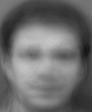

Image after NMF:


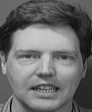

[[104. 106. 107. ...  99. 100.  97.]
 [106. 106. 102. ...  96. 100.  99.]
 [105. 104. 104. ... 101.  95.  94.]
 ...
 [152. 107.  93. ...  59.  52.  42.]
 [144.  83. 107. ...  72.  63.  67.]
 [115.  84. 128. ...  65.  59.  73.]]
Image Before NMF:
-------------------------------Number of image: 237
[[ 70.  70.  70. ...  74.  73.  74.]
 [ 70.  70.  70. ...  74.  74.  74.]
 [ 70.  70.  71. ...  74.  75.  75.]
 ...
 [150. 151. 152. ... 115. 113. 113.]
 [155. 156. 158. ... 119. 117. 117.]
 [158. 161. 163. ... 120. 118. 118.]]


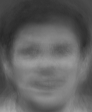

Image after NMF:


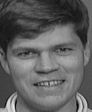

[[ 54.  49.  56. ... 103. 102. 104.]
 [ 54.  47.  49. ... 102. 105. 102.]
 [ 42.  43.  67. ... 100. 102. 104.]
 ...
 [168. 174. 157. ... 151. 124.  82.]
 [161. 166. 172. ... 161. 168. 161.]
 [175. 189. 175. ... 154. 154. 162.]]
Image Before NMF:
-------------------------------Number of image: 238
[[108. 109. 109. ... 107. 106. 106.]
 [108. 109. 109. ... 107. 107. 107.]
 [109. 109. 109. ... 107. 107. 107.]
 ...
 [133. 134. 136. ...  89.  89.  88.]
 [136. 137. 140. ...  90.  90.  91.]
 [137. 141. 144. ...  90.  90.  91.]]


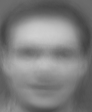

Image after NMF:


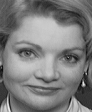

[[ 92.  93.  96. ...  92.  89.  90.]
 [ 94.  96.  91. ...  93.  95.  92.]
 [ 91.  90.  89. ...  94.  90.  96.]
 ...
 [148. 197. 171. ... 121. 112.  54.]
 [154. 198. 165. ... 174. 162. 156.]
 [159. 195. 161. ... 192. 163. 157.]]
Image Before NMF:
-------------------------------Number of image: 239
[[102. 102. 102. ... 106. 105. 106.]
 [102. 102. 102. ... 106. 106. 106.]
 [102. 101. 102. ... 105. 106. 106.]
 ...
 [ 81.  80.  80. ...  80.  80.  79.]
 [ 85.  83.  86. ...  83.  82.  82.]
 [ 87.  89.  91. ...  85.  82.  83.]]


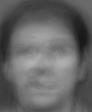

Image after NMF:


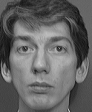

[[102. 105. 104. ... 101. 101. 105.]
 [106. 102. 101. ... 102. 102. 101.]
 [105. 100. 103. ... 101. 101. 104.]
 ...
 [ 69.  70.  68. ...  78.  72.  78.]
 [ 69.  69.  71. ...  73.  77.  75.]
 [ 69.  69.  72. ...  74.  74.  75.]]
Image Before NMF:
-------------------------------Number of image: 240
[[ 35.  36.  36. ...  35.  34.  35.]
 [ 36.  36.  36. ...  35.  35.  35.]
 [ 36.  37.  37. ...  35.  36.  36.]
 ...
 [205. 205. 207. ... 149. 146. 146.]
 [209. 213. 214. ... 154. 152. 150.]
 [212. 218. 221. ... 158. 156. 151.]]


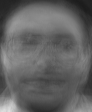

Image after NMF:


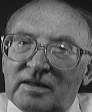

[[ 25.  25.  23. ...  19.  22.  22.]
 [ 25.  27.  24. ...  20.  21.  24.]
 [ 26.  26.  24. ...  21.  20.  23.]
 ...
 [189. 181. 181. ... 184. 188. 188.]
 [190. 186. 182. ... 188. 189. 189.]
 [191. 188. 182. ... 187. 190. 192.]]
Image Before NMF:
-------------------------------Number of image: 241
[[ 58.  57.  57. ...  54.  54.  54.]
 [ 58.  57.  57. ...  54.  54.  54.]
 [ 59.  58.  57. ...  54.  54.  54.]
 ...
 [113. 110. 114. ... 103. 101. 102.]
 [116. 117. 121. ... 106. 104. 102.]
 [118. 122. 125. ... 115. 113. 104.]]


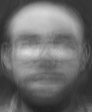

Image after NMF:


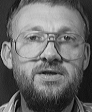

[[ 44.  50.  46. ...  44.  41.  44.]
 [ 51.  46.  48. ...  39.  41.  43.]
 [ 48.  46.  48. ...  38.  37.  42.]
 ...
 [145. 148. 144. ... 106. 102. 104.]
 [151. 167. 100. ... 100. 105. 103.]
 [150. 155. 138. ... 140. 104.  95.]]
Image Before NMF:
-------------------------------Number of image: 242
[[ 95.  94.  94. ... 103. 102. 103.]
 [ 95.  94.  94. ... 104. 103. 103.]
 [ 95.  95.  95. ... 102. 104. 104.]
 ...
 [126. 122. 124. ... 130. 129. 129.]
 [127. 126. 131. ... 134. 132. 132.]
 [130. 132. 136. ... 138. 134. 131.]]


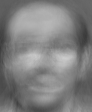

Image after NMF:


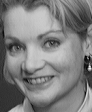

[[ 67.  62.  88. ... 158. 141. 151.]
 [ 66.  57.  75. ... 156. 149. 140.]
 [ 65.  71.  74. ... 150. 155. 142.]
 ...
 [ 51.  47.  50. ... 176. 166. 147.]
 [ 52.  50.  50. ... 170. 161. 140.]
 [ 48.  53.  55. ... 167. 157. 145.]]
Image Before NMF:
-------------------------------Number of image: 243
[[61. 60. 61. ... 63. 62. 62.]
 [61. 61. 59. ... 63. 63. 63.]
 [62. 61. 61. ... 62. 64. 64.]
 ...
 [58. 61. 66. ... 55. 56. 57.]
 [62. 67. 67. ... 57. 56. 55.]
 [62. 68. 68. ... 64. 64. 57.]]


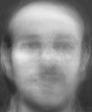

Image after NMF:


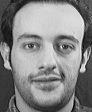

[[ 72.  73.  77. ...  87.  86.  91.]
 [ 73.  71.  69. ...  88.  88.  87.]
 [ 72.  70.  70. ...  84.  88.  90.]
 ...
 [ 54.  55.  49. ...  93.  90.  93.]
 [ 48.  52.  49. ...  87.  90.  88.]
 [ 49.  57.  48. ... 100.  86.  76.]]
Image Before NMF:
-------------------------------Number of image: 244
[[ 34.  34.  34. ...  31.  30.  30.]
 [ 34.  34.  34. ...  31.  31.  31.]
 [ 34.  35.  35. ...  31.  32.  31.]
 ...
 [201. 201. 203. ... 137. 134. 134.]
 [206. 209. 210. ... 142. 140. 138.]
 [209. 215. 217. ... 146. 144. 140.]]


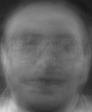

Image after NMF:


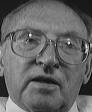

[[ 24.  26.  27. ...  25.  16.  28.]
 [ 27.  26.  27. ...  26.  16.  26.]
 [ 23.  28.  27. ...  26.  20.  25.]
 ...
 [195. 185. 189. ... 173. 176. 175.]
 [192. 184. 188. ... 183. 178. 179.]
 [195. 186. 181. ... 183. 181. 181.]]
Image Before NMF:
-------------------------------Number of image: 245
[[119. 120. 120. ... 117. 117. 117.]
 [119. 120. 120. ... 118. 117. 117.]
 [120. 119. 120. ... 117. 117. 117.]
 ...
 [ 94.  97.  98. ...  59.  60.  60.]
 [ 98.  99. 102. ...  61.  61.  61.]
 [100. 104. 105. ...  61.  61.  62.]]


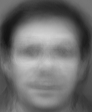

Image after NMF:


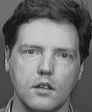

[[110. 111. 114. ... 106. 107. 105.]
 [109. 112. 110. ... 104. 104. 106.]
 [109. 112. 109. ... 101. 106. 102.]
 ...
 [123. 128. 128. ...  70.  69.  68.]
 [139. 126. 125. ...  70.  67.  65.]
 [123. 100. 131. ...  65.  72.  65.]]
Image Before NMF:
-------------------------------Number of image: 246
[[ 75.  74.  74. ...  89.  88.  89.]
 [ 74.  73.  72. ...  90.  90.  89.]
 [ 75.  74.  74. ...  88.  91.  91.]
 ...
 [ 61.  58.  61. ...  96.  95.  96.]
 [ 61.  60.  63. ...  96.  95.  96.]
 [ 61.  62.  64. ... 100.  98.  96.]]


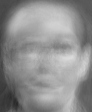

Image after NMF:


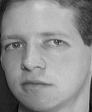

[[63. 53. 35. ... 36. 44. 45.]
 [56. 48. 31. ... 57. 50. 50.]
 [52. 29. 35. ... 54. 55. 61.]
 ...
 [35. 37. 36. ... 44.  9. 25.]
 [36. 35. 37. ... 40.  7. 28.]
 [35. 38. 34. ... 41. 10. 24.]]
Image Before NMF:
-------------------------------Number of image: 247
[[ 49.  49.  49. ...  53.  53.  54.]
 [ 48.  49.  48. ...  54.  54.  54.]
 [ 49.  48.  50. ...  53.  55.  54.]
 ...
 [ 91.  94.  94. ...  75.  74.  75.]
 [ 96.  98.  98. ...  79.  78.  77.]
 [ 98. 103. 103. ...  82.  79.  79.]]


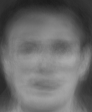

Image after NMF:


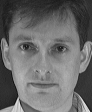

[[ 35.  40.  38. ...  46.  45.  46.]
 [ 39.  40.  38. ...  47.  46.  46.]
 [ 39.  39.  38. ...  47.  48.  44.]
 ...
 [ 46.  86. 131. ...  37.  39.  46.]
 [138. 154. 161. ... 130.  27.  43.]
 [169. 174. 176. ... 222.  55.  34.]]
Image Before NMF:
-------------------------------Number of image: 248
[[129. 130. 130. ... 124. 124. 124.]
 [129. 130. 130. ... 124. 124. 124.]
 [130. 130. 130. ... 125. 124. 124.]
 ...
 [147. 149. 152. ...  88.  88.  87.]
 [150. 152. 156. ...  88.  88.  90.]
 [151. 155. 158. ...  88.  89.  89.]]


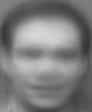

Image after NMF:


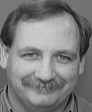

[[118. 119. 122. ... 111. 115. 112.]
 [119. 120. 121. ... 112. 115. 112.]
 [122. 120. 123. ... 113. 114. 114.]
 ...
 [129. 135.  92. ...  97.  98. 102.]
 [132. 137.  91. ...  97. 101. 100.]
 [128. 139.  95. ...  97. 102. 101.]]
Image Before NMF:
-------------------------------Number of image: 249
[[105. 105. 106. ... 101. 101. 100.]
 [105. 106. 105. ... 101. 101. 100.]
 [105. 106. 105. ... 101. 100. 101.]
 ...
 [ 63.  63.  66. ...  38.  38.  39.]
 [ 64.  64.  68. ...  36.  37.  39.]
 [ 64.  67.  69. ...  37.  40.  39.]]


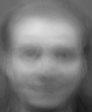

Image after NMF:


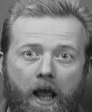

[[108. 107. 106. ... 111. 109. 106.]
 [108. 110. 109. ... 107. 108. 103.]
 [107. 111. 106. ... 102. 108. 107.]
 ...
 [111. 104. 102. ...  35.  44.  45.]
 [105. 105.  96. ...  44.  36.  44.]
 [104. 106.  94. ...  43.  43.  40.]]
Image Before NMF:
-------------------------------Number of image: 250
[[124. 123. 123. ... 117. 118. 118.]
 [123. 123. 123. ... 117. 116. 117.]
 [123. 122. 122. ... 117. 117. 116.]
 ...
 [  9.  10.   9. ...  13.  13.  14.]
 [ 16.  14.  14. ...  14.  15.  14.]
 [ 20.  16.  18. ...  19.  18.  17.]]


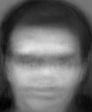

Image after NMF:


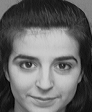

[[135. 133. 136. ... 129. 131. 129.]
 [135. 139. 132. ... 131. 133. 129.]
 [137. 134. 137. ... 131. 131. 130.]
 ...
 [ 26.  23.  29. ...  14.  21.  17.]
 [ 31.  20.  30. ...  17.  20.  17.]
 [ 29.  21.  27. ...  18.  21.  24.]]
Image Before NMF:
-------------------------------Number of image: 251
[[121. 121. 122. ... 118. 118. 118.]
 [121. 121. 122. ... 118. 118. 118.]
 [121. 121. 121. ... 118. 117. 117.]
 ...
 [128. 127. 129. ...  95.  94.  94.]
 [131. 130. 134. ...  96.  95.  96.]
 [133. 134. 138. ...  96.  97.  97.]]


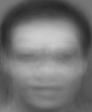

Image after NMF:


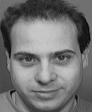

[[114. 110. 112. ... 113. 108. 112.]
 [112. 109. 110. ... 112. 109. 112.]
 [113. 109. 111. ... 110. 112. 110.]
 ...
 [136. 136. 136. ...  90.  89.  91.]
 [137. 137. 139. ...  94.  87.  91.]
 [138. 135. 139. ...  93.  89.  86.]]
Image Before NMF:
-------------------------------Number of image: 252
[[99. 99. 99. ... 95. 95. 94.]
 [99. 99. 99. ... 95. 95. 94.]
 [99. 99. 99. ... 95. 95. 95.]
 ...
 [51. 53. 55. ... 29. 29. 30.]
 [53. 54. 56. ... 27. 28. 30.]
 [54. 56. 57. ... 29. 31. 30.]]


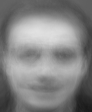

Image after NMF:


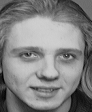

[[106. 105. 106. ... 109. 108. 113.]
 [107. 108. 106. ... 113. 105. 110.]
 [109. 109. 106. ... 107. 112. 106.]
 ...
 [ 31.  37.  39. ...  29.  34.  36.]
 [ 27.  36.  39. ...  31.  36.  36.]
 [ 23.  40.  33. ...  32.  31.  28.]]
Image Before NMF:
-------------------------------Number of image: 253
[[90. 90. 90. ... 91. 91. 90.]
 [90. 90. 90. ... 91. 91. 91.]
 [90. 90. 90. ... 91. 91. 91.]
 ...
 [34. 33. 35. ... 37. 38. 38.]
 [35. 34. 37. ... 36. 37. 38.]
 [36. 38. 39. ... 38. 39. 39.]]


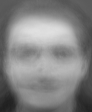

Image after NMF:


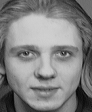

[[104. 101. 105. ... 113. 107. 109.]
 [104. 103. 105. ... 108. 115. 109.]
 [102. 102. 107. ... 109. 112. 109.]
 ...
 [ 41.  35.  56. ...  35.  48.  38.]
 [ 49.  41.  43. ...  37.  31.  43.]
 [ 39.  38.  55. ...  49.  43.  36.]]
Image Before NMF:
-------------------------------Number of image: 254
[[69. 69. 70. ... 70. 70. 70.]
 [69. 70. 68. ... 70. 70. 70.]
 [70. 69. 70. ... 70. 71. 71.]
 ...
 [65. 71. 74. ... 44. 45. 46.]
 [70. 76. 75. ... 46. 45. 45.]
 [71. 76. 75. ... 50. 49. 46.]]


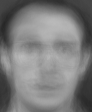

Image after NMF:


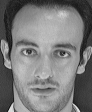

[[61. 62. 64. ... 59. 66. 63.]
 [59. 63. 61. ... 66. 67. 64.]
 [60. 63. 63. ... 64. 61. 69.]
 ...
 [55. 54. 53. ... 56. 56. 60.]
 [55. 55. 54. ... 56. 54. 60.]
 [54. 49. 55. ... 51. 55. 53.]]
Image Before NMF:
-------------------------------Number of image: 255
[[ 88.  88.  88. ...  87.  86.  86.]
 [ 88.  88.  86. ...  86.  87.  87.]
 [ 88.  89.  89. ...  86.  88.  87.]
 ...
 [124. 130. 132. ...  72.  71.  71.]
 [130. 136. 134. ...  74.  73.  72.]
 [131. 135. 136. ...  77.  76.  73.]]


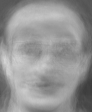

Image after NMF:


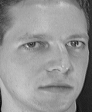

[[ 60.  60.  62. ...  40.  53.  46.]
 [ 58.  73.  54. ...  34.  50.  51.]
 [ 68.  77.  80. ...  36.  50.  49.]
 ...
 [ 24. 143. 160. ...  34.  33.  33.]
 [ 18. 136. 161. ...  36.  36.  31.]
 [  9. 111. 168. ...  32.  34.  34.]]
Image Before NMF:
-------------------------------Number of image: 256
[[142. 141. 142. ... 135. 136. 135.]
 [142. 142. 142. ... 135. 135. 135.]
 [142. 141. 142. ... 136. 135. 134.]
 ...
 [118. 117. 117. ...  84.  83.  82.]
 [125. 123. 125. ...  87.  87.  86.]
 [129. 129. 132. ...  90.  88.  88.]]


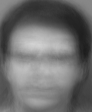

Image after NMF:


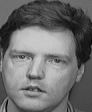

[[114. 112. 110. ... 107. 105. 103.]
 [109. 115. 113. ... 107. 104. 107.]
 [110. 112. 111. ... 109. 104. 104.]
 ...
 [136. 155.  95. ...  69.  70.  72.]
 [144. 140. 106. ...  70.  70.  68.]
 [148. 129. 107. ...  67.  70.  68.]]
Image Before NMF:
-------------------------------Number of image: 257
[[73. 72. 73. ... 75. 74. 75.]
 [72. 73. 71. ... 74. 75. 74.]
 [73. 73. 73. ... 74. 76. 75.]
 ...
 [60. 66. 69. ... 44. 45. 46.]
 [66. 73. 70. ... 47. 46. 45.]
 [68. 71. 71. ... 53. 50. 46.]]


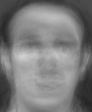

Image after NMF:


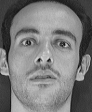

[[63. 54. 58. ... 61. 61. 59.]
 [59. 59. 59. ... 59. 61. 61.]
 [59. 58. 57. ... 60. 65. 63.]
 ...
 [54. 57. 52. ... 64. 61. 65.]
 [59. 52. 54. ... 68. 61. 62.]
 [52. 54. 54. ... 63. 63. 64.]]
Image Before NMF:
-------------------------------Number of image: 258
[[42. 42. 42. ... 52. 52. 53.]
 [41. 42. 41. ... 53. 53. 53.]
 [42. 41. 42. ... 52. 54. 53.]
 ...
 [37. 39. 40. ... 49. 49. 50.]
 [38. 40. 40. ... 49. 49. 50.]
 [38. 40. 40. ... 50. 49. 50.]]


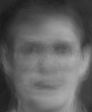

Image after NMF:


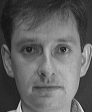

[[35. 36. 37. ... 46. 46. 46.]
 [37. 36. 38. ... 48. 50. 47.]
 [38. 36. 38. ... 47. 48. 50.]
 ...
 [39. 40. 43. ... 61. 58. 62.]
 [42. 39. 40. ... 56. 57. 54.]
 [39. 37. 41. ... 59. 57. 58.]]
Image Before NMF:
-------------------------------Number of image: 259
[[ 99.  99.  99. ...  96.  96.  95.]
 [ 99.  99. 100. ...  96.  96.  96.]
 [ 99.  99.  99. ...  96.  96.  96.]
 ...
 [ 81.  78.  81. ...  62.  62.  62.]
 [ 81.  79.  85. ...  62.  62.  63.]
 [ 82.  86.  88. ...  64.  65.  64.]]


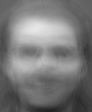

Image after NMF:


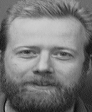

[[109. 105. 112. ... 109. 107. 108.]
 [106. 113. 105. ... 107. 107. 107.]
 [105. 111. 108. ... 108. 107. 104.]
 ...
 [101.  92.  95. ...  48.  48.  44.]
 [ 99.  91.  97. ...  56.  49.  44.]
 [101.  88.  90. ...  55.  50.  51.]]
Image Before NMF:
-------------------------------Number of image: 260
[[ 75.  75.  75. ...  79.  79.  80.]
 [ 76.  75.  76. ...  80.  80.  80.]
 [ 76.  75.  76. ...  80.  81.  80.]
 ...
 [174. 171. 172. ... 144. 141. 141.]
 [178. 177. 180. ... 149. 147. 146.]
 [182. 185. 188. ... 151. 147. 148.]]


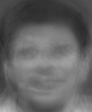

Image after NMF:


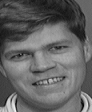

[[ 40.  42.  53. ... 104. 102. 102.]
 [ 50.  65.  61. ... 104. 104. 103.]
 [ 64.  62.  67. ... 104. 104. 102.]
 ...
 [168. 179. 176. ... 169. 189. 193.]
 [193. 173. 180. ... 185. 193. 190.]
 [188. 157. 188. ... 190. 195. 182.]]
Image Before NMF:
-------------------------------Number of image: 261
[[137. 137. 138. ... 134. 135. 134.]
 [138. 137. 138. ... 134. 134. 134.]
 [137. 137. 137. ... 135. 134. 134.]
 ...
 [138. 134. 136. ... 111. 110. 109.]
 [142. 138. 143. ... 113. 112. 113.]
 [145. 144. 149. ... 114. 113. 113.]]


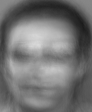

Image after NMF:


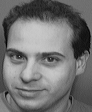

[[112. 109. 116. ... 110. 112. 110.]
 [112. 112. 113. ... 114. 110. 113.]
 [111. 111. 113. ... 113. 110. 110.]
 ...
 [139. 141. 136. ...  93.  87.  93.]
 [138. 137. 139. ...  94.  90.  94.]
 [136. 136. 139. ...  93.  88.  92.]]
Image Before NMF:
-------------------------------Number of image: 262
[[123. 123. 124. ... 127. 126. 126.]
 [124. 124. 123. ... 127. 127. 127.]
 [124. 124. 124. ... 126. 128. 128.]
 ...
 [ 81.  80.  83. ...  65.  66.  66.]
 [ 81.  81.  85. ...  66.  65.  67.]
 [ 82.  84.  86. ...  65.  65.  66.]]


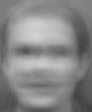

Image after NMF:


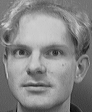

[[117. 120. 122. ... 115. 114. 115.]
 [123. 118. 124. ... 115. 114. 113.]
 [121. 122. 122. ... 113. 114. 115.]
 ...
 [ 89.  86.  94. ...  63.  67.  64.]
 [ 93.  89.  88. ...  64.  64.  61.]
 [ 83.  89.  85. ...  66.  59.  65.]]
Image Before NMF:
-------------------------------Number of image: 263
[[ 93.  94.  94. ...  89.  89.  89.]
 [ 94.  94.  94. ...  89.  89.  89.]
 [ 94.  94.  94. ...  90.  89.  89.]
 ...
 [181. 180. 181. ... 125. 122. 121.]
 [187. 187. 189. ... 129. 128. 127.]
 [191. 192. 196. ... 130. 128. 128.]]


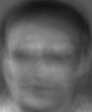

Image after NMF:


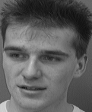

[[112. 109. 112. ... 103. 103. 101.]
 [111. 112. 111. ... 102. 101. 101.]
 [112. 111. 113. ... 103. 102. 105.]
 ...
 [204. 207. 204. ...  64.  61.  62.]
 [205. 205. 205. ...  63.  62.  62.]
 [203. 204. 209. ...  61.  62.  62.]]
Image Before NMF:
-------------------------------Number of image: 264
[[ 44.  44.  44. ...  41.  41.  41.]
 [ 44.  45.  45. ...  41.  41.  41.]
 [ 45.  45.  45. ...  41.  42.  41.]
 ...
 [122. 124. 125. ...  85.  83.  83.]
 [128. 131. 131. ...  88.  87.  85.]
 [131. 137. 137. ...  94.  92.  89.]]


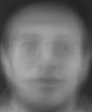

Image after NMF:


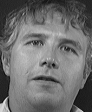

[[ 39.  41.  37. ...  36.  37.  37.]
 [ 38.  36.  40. ...  41.  35.  40.]
 [ 37.  43.  35. ...  35.  37.  36.]
 ...
 [209. 210. 211. ...  30.  34.  39.]
 [209. 213. 204. ...  34.  31.  36.]
 [209. 213. 195. ...  33.  33.  40.]]
Image Before NMF:
-------------------------------Number of image: 265
[[112. 113. 113. ... 112. 112. 111.]
 [112. 113. 112. ... 112. 112. 112.]
 [113. 113. 113. ... 112. 112. 112.]
 ...
 [ 92.  94.  97. ...  63.  64.  64.]
 [ 94.  95.  99. ...  63.  63.  65.]
 [ 94.  97.  99. ...  63.  64.  64.]]


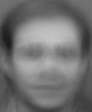

Image after NMF:


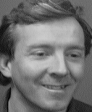

[[100.  99. 108. ... 109. 110. 111.]
 [104. 100. 105. ... 112. 106. 109.]
 [100. 102. 100. ... 110. 107. 110.]
 ...
 [ 78.  84.  80. ...  42.  47.  47.]
 [ 74.  83.  74. ...  43.  45.  44.]
 [ 79.  78.  76. ...  44.  42.  44.]]
Image Before NMF:
-------------------------------Number of image: 266
[[129. 128. 129. ... 130. 130. 130.]
 [129. 128. 128. ... 130. 130. 130.]
 [129. 128. 128. ... 130. 130. 130.]
 ...
 [ 96.  94.  96. ...  89.  89.  88.]
 [ 98.  96. 100. ...  90.  89.  90.]
 [100.  99. 103. ...  90.  90.  90.]]


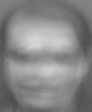

Image after NMF:


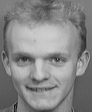

[[126. 127. 126. ... 125. 126. 125.]
 [126. 129. 126. ... 125. 127. 125.]
 [128. 124. 129. ... 124. 126. 124.]
 ...
 [ 86.  89.  91. ...  87.  87.  86.]
 [101.  98.  97. ...  86.  86.  86.]
 [100.  98.  99. ...  87.  85.  89.]]
Image Before NMF:
-------------------------------Number of image: 267
[[100. 100. 101. ... 100. 100.  99.]
 [101. 101. 101. ... 100. 100.  99.]
 [101. 101. 100. ... 100.  99. 100.]
 ...
 [ 29.  27.  29. ...  30.  31.  31.]
 [ 29.  26.  31. ...  28.  29.  31.]
 [ 29.  30.  32. ...  28.  30.  31.]]


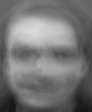

Image after NMF:


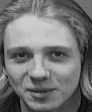

[[107. 108. 107. ... 107. 114. 106.]
 [112. 107. 110. ... 111. 111. 110.]
 [112. 102. 109. ... 112. 113. 110.]
 ...
 [ 39.  35.  37. ...  35.  34.  23.]
 [ 40.  48.  38. ...  42.  36.  40.]
 [ 54.  40.  35. ...  28.  39.  43.]]
Image Before NMF:
-------------------------------Number of image: 268
[[112. 112. 112. ... 110. 109. 109.]
 [112. 112. 112. ... 110. 110. 109.]
 [112. 112. 112. ... 110. 109. 110.]
 ...
 [139. 137. 139. ... 103. 102. 102.]
 [141. 141. 145. ... 105. 104. 105.]
 [143. 145. 149. ... 107. 106. 104.]]


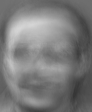

Image after NMF:


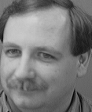

[[123. 124. 122. ... 118. 121. 116.]
 [124. 122. 122. ... 118. 121. 119.]
 [125. 124. 122. ... 118. 122. 114.]
 ...
 [144. 106.  69. ...  75.  70. 107.]
 [143. 100.  67. ...  74.  68. 103.]
 [140.  96.  67. ...  69.  71. 101.]]
Image Before NMF:
-------------------------------Number of image: 269
[[122. 122. 122. ... 119. 119. 119.]
 [122. 122. 121. ... 119. 119. 119.]
 [122. 122. 122. ... 119. 119. 119.]
 ...
 [138. 136. 138. ...  97.  95.  94.]
 [141. 140. 143. ...  98.  98.  98.]
 [143. 143. 147. ...  97.  98.  98.]]


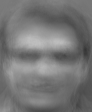

Image after NMF:


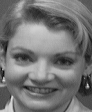

[[ 86.  90.  87. ...  84.  85.  87.]
 [ 93.  86.  87. ...  88.  84.  88.]
 [ 89.  86.  88. ...  88.  84.  87.]
 ...
 [ 97. 103. 126. ... 109.  94.  81.]
 [177. 182. 191. ... 135. 127. 133.]
 [203. 203. 203. ... 153. 142. 139.]]
Image Before NMF:
-------------------------------Number of image: 270
[[129. 129. 129. ... 132. 132. 132.]
 [130. 129. 129. ... 132. 132. 132.]
 [129. 129. 129. ... 132. 132. 132.]
 ...
 [105. 102. 104. ...  97.  97.  96.]
 [107. 104. 109. ...  98.  98.  99.]
 [109. 108. 112. ...  99.  98.  98.]]


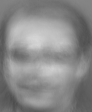

Image after NMF:


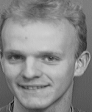

[[128. 128. 128. ... 124. 124. 124.]
 [128. 127. 126. ... 125. 125. 126.]
 [128. 128. 125. ... 126. 125. 128.]
 ...
 [112.  91.  92. ...  84.  88.  86.]
 [102.  83.  91. ...  85.  84.  87.]
 [ 89.  90.  86. ...  87.  83.  86.]]
Image Before NMF:
-------------------------------Number of image: 271
[[131. 131. 131. ... 129. 129. 128.]
 [131. 131. 130. ... 128. 129. 128.]
 [131. 131. 130. ... 128. 128. 129.]
 ...
 [ 59.  60.  62. ...  38.  39.  39.]
 [ 60.  61.  63. ...  37.  37.  39.]
 [ 60.  60.  62. ...  36.  38.  38.]]


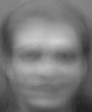

Image after NMF:


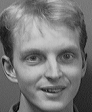

[[125. 119. 124. ... 122. 120. 116.]
 [121. 124. 118. ... 119. 120. 120.]
 [122. 125. 122. ... 121. 118. 121.]
 ...
 [ 85.  93.  82. ...  48.  35.  43.]
 [ 87.  92.  85. ...  40.  39.  35.]
 [ 79.  93.  89. ...  36.  39.  40.]]
Image Before NMF:
-------------------------------Number of image: 272
[[105. 105. 106. ... 103. 103. 102.]
 [106. 106. 106. ... 103. 103. 103.]
 [106. 106. 105. ... 103. 103. 103.]
 ...
 [ 86.  83.  86. ...  73.  73.  73.]
 [ 87.  85.  91. ...  73.  73.  74.]
 [ 88.  91.  94. ...  76.  77.  75.]]


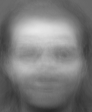

Image after NMF:


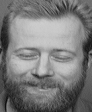

[[111. 111. 108. ... 111. 112. 111.]
 [109. 110. 110. ... 111. 109. 110.]
 [110. 108. 112. ... 109. 108. 113.]
 ...
 [110. 104.  94. ...  58.  64.  66.]
 [108. 101.  98. ...  62.  59.  61.]
 [107. 105. 105. ...  66.  64.  59.]]
Image Before NMF:
-------------------------------Number of image: 273
[[ 48.  47.  47. ...  44.  44.  44.]
 [ 48.  47.  47. ...  44.  44.  44.]
 [ 48.  48.  48. ...  44.  45.  44.]
 ...
 [ 94.  95.  97. ...  75.  74.  75.]
 [ 98. 101. 102. ...  78.  77.  75.]
 [101. 105. 107. ...  86.  84.  77.]]


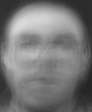

Image after NMF:


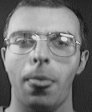

[[ 48.  44.  49. ...  38.  38.  34.]
 [ 50.  47.  51. ...  42.  38.  35.]
 [ 46.  50.  54. ...  40.  39.  39.]
 ...
 [131. 130. 112. ...  38.  41.  40.]
 [130. 133. 113. ...  37.  41.  37.]
 [136. 135. 126. ...  41.  45.  35.]]
Image Before NMF:
-------------------------------Number of image: 274
[[109. 109. 109. ... 102. 102. 102.]
 [109. 110. 109. ... 101. 101. 102.]
 [109. 109. 110. ... 102. 102. 101.]
 ...
 [156. 160. 161. ...  88.  87.  86.]
 [163. 165. 166. ...  91.  90.  89.]
 [166. 168. 170. ...  91.  91.  91.]]


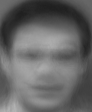

Image after NMF:


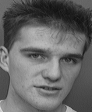

[[110. 108. 109. ... 100.  98. 104.]
 [110. 110. 110. ... 102.  99. 102.]
 [110. 108. 108. ... 102. 100. 102.]
 ...
 [212. 193. 150. ...  65.  66.  64.]
 [199. 215. 163. ...  66.  63.  67.]
 [200. 206. 206. ...  66.  64.  63.]]
Image Before NMF:
-------------------------------Number of image: 275
[[ 82.  83.  83. ...  81.  82.  82.]
 [ 83.  83.  84. ...  82.  82.  82.]
 [ 83.  83.  84. ...  82.  82.  82.]
 ...
 [169. 167. 169. ... 127. 126. 125.]
 [171. 170. 176. ... 129. 128. 129.]
 [173. 178. 181. ... 130. 129. 129.]]


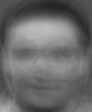

Image after NMF:


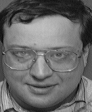

[[ 99. 103.  98. ...  92.  92.  92.]
 [100. 102. 101. ...  93.  92.  90.]
 [101. 102. 102. ...  92.  92.  90.]
 ...
 [104. 154. 139. ... 143. 148. 157.]
 [101. 147. 154. ... 155. 139. 149.]
 [104. 148. 160. ... 162. 122. 122.]]
Image Before NMF:
-------------------------------Number of image: 276
[[86. 87. 87. ... 92. 92. 92.]
 [86. 87. 87. ... 93. 92. 92.]
 [87. 86. 87. ... 92. 93. 93.]
 ...
 [88. 90. 90. ... 76. 76. 75.]
 [92. 92. 94. ... 79. 78. 78.]
 [94. 97. 98. ... 80. 77. 79.]]


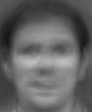

Image after NMF:


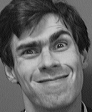

[[115. 118. 117. ... 117. 114. 116.]
 [114. 116. 117. ... 113. 119. 113.]
 [118. 114. 117. ... 115. 116. 112.]
 ...
 [ 98. 102. 100. ...  25.  23.  25.]
 [ 99.  98.  98. ...  21.  26.  21.]
 [101. 100.  95. ...  22.  25.  28.]]
Image Before NMF:
-------------------------------Number of image: 277
[[107. 108. 108. ... 112. 112. 112.]
 [107. 108. 107. ... 113. 113. 113.]
 [107. 107. 108. ... 112. 113. 113.]
 ...
 [ 86.  89.  92. ...  65.  66.  66.]
 [ 88.  90.  92. ...  65.  65.  67.]
 [ 88.  91.  92. ...  63.  63.  66.]]


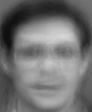

Image after NMF:


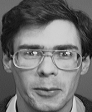

[[109. 107. 110. ... 106. 108. 105.]
 [108. 110. 108. ... 106. 107. 108.]
 [109. 109. 108. ... 106. 108. 108.]
 ...
 [ 38.  51.  43. ...  37.  42.  35.]
 [ 47.  49.  33. ...  38.  40.  31.]
 [ 47.  40.  44. ...  42.  40.  35.]]
Image Before NMF:
-------------------------------Number of image: 278
[[122. 122. 122. ... 114. 115. 114.]
 [122. 122. 122. ... 114. 114. 114.]
 [122. 122. 121. ... 115. 113. 113.]
 ...
 [132. 133. 136. ...  84.  83.  83.]
 [137. 138. 141. ...  85.  85.  85.]
 [139. 139. 143. ...  86.  87.  85.]]


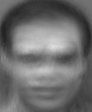

Image after NMF:


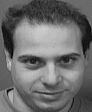

[[105. 102. 106. ... 105. 105. 107.]
 [105. 105. 104. ... 106. 107. 108.]
 [100. 105. 104. ... 108. 106. 101.]
 ...
 [140. 139. 140. ...  66.  65.  65.]
 [144. 138. 142. ...  70.  70.  67.]
 [144. 141. 137. ...  72.  62.  75.]]
Image Before NMF:
-------------------------------Number of image: 279
[[44. 44. 44. ... 42. 42. 42.]
 [45. 44. 44. ... 42. 42. 42.]
 [45. 45. 44. ... 42. 43. 42.]
 ...
 [84. 81. 84. ... 76. 75. 76.]
 [86. 86. 89. ... 79. 78. 76.]
 [88. 92. 94. ... 86. 85. 79.]]


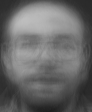

Image after NMF:


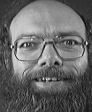

[[47. 50. 52. ... 48. 45. 48.]
 [49. 52. 51. ... 45. 46. 42.]
 [51. 50. 48. ... 44. 46. 47.]
 ...
 [70. 63. 68. ... 44. 39. 45.]
 [69. 62. 68. ... 37. 42. 37.]
 [69. 66. 62. ... 33. 45. 36.]]
Image Before NMF:
-------------------------------Number of image: 280
[[ 35.  35.  35. ...  32.  32.  32.]
 [ 35.  35.  36. ...  33.  33.  33.]
 [ 36.  36.  36. ...  33.  33.  33.]
 ...
 [ 98.  95.  97. ...  89.  87.  88.]
 [101. 101. 104. ...  92.  91.  89.]
 [104. 110. 112. ... 101.  99.  93.]]


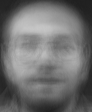

Image after NMF:


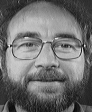

[[ 48.  48.  55. ...  44.  46.  47.]
 [ 51.  47.  54. ...  48.  47.  47.]
 [ 49.  56.  50. ...  48.  46.  48.]
 ...
 [107.  96.  59. ...  94.  94. 108.]
 [110.  89.  59. ...  90.  98. 104.]
 [110.  79. 116. ...  88.  93.  99.]]
Image Before NMF:
-------------------------------Number of image: 281
[[65. 65. 65. ... 69. 68. 69.]
 [65. 65. 65. ... 70. 69. 69.]
 [65. 65. 65. ... 69. 70. 70.]
 ...
 [58. 56. 56. ... 62. 62. 62.]
 [60. 58. 61. ... 62. 63. 63.]
 [61. 65. 66. ... 66. 65. 66.]]


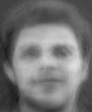

Image after NMF:


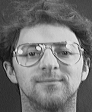

[[67. 64. 67. ... 69. 69. 77.]
 [70. 66. 69. ... 67. 73. 71.]
 [67. 66. 62. ... 71. 71. 71.]
 ...
 [48. 46. 50. ... 65. 72. 82.]
 [50. 50. 49. ... 72. 67. 71.]
 [49. 48. 52. ... 73. 69. 72.]]
Image Before NMF:
-------------------------------Number of image: 282
[[ 96.  96.  97. ... 100. 100. 100.]
 [ 96.  96.  97. ... 101. 100. 100.]
 [ 97.  96.  96. ... 100. 101. 101.]
 ...
 [ 93.  91.  93. ...  90.  91.  90.]
 [ 95.  93.  98. ...  92.  92.  92.]
 [ 96.  99. 102. ...  95.  93.  92.]]


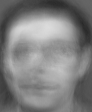

Image after NMF:


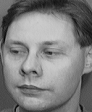

[[121. 123. 121. ... 113. 118. 118.]
 [120. 123. 123. ... 115. 116. 116.]
 [116. 121. 120. ... 118. 112. 115.]
 ...
 [ 76.  68.  75. ...  82.  78.  81.]
 [ 77.  77.  91. ...  81.  78.  86.]
 [ 85.  97. 105. ...  88.  83.  78.]]
Image Before NMF:
-------------------------------Number of image: 283
[[ 93.  93.  93. ... 102. 102. 102.]
 [ 93.  93.  93. ... 103. 103. 103.]
 [ 93.  93.  93. ... 102. 104. 104.]
 ...
 [ 93.  89.  91. ... 104. 104. 104.]
 [ 93.  91.  96. ... 107. 105. 106.]
 [ 95.  97. 100. ... 109. 106. 106.]]


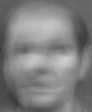

Image after NMF:


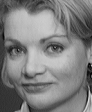

[[ 91.  83.  70. ... 162. 161. 157.]
 [ 82.  81.  72. ... 148. 165. 162.]
 [ 86.  74.  70. ... 138. 164. 168.]
 ...
 [ 54.  50.  52. ... 156. 181. 193.]
 [ 52.  51.  51. ... 165. 186. 195.]
 [ 48.  56.  45. ... 171. 188. 190.]]
Image Before NMF:
-------------------------------Number of image: 284
[[ 97.  97.  97. ...  95.  96.  95.]
 [ 98.  97.  98. ...  96.  95.  96.]
 [ 97.  97.  98. ...  96.  96.  95.]
 ...
 [130. 127. 127. ... 101.  99.  99.]
 [133. 130. 134. ... 103. 103. 103.]
 [136. 137. 140. ... 104. 103. 104.]]


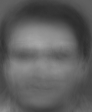

Image after NMF:


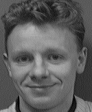

[[ 99.  90.  97. ...  88.  94.  88.]
 [ 99.  94.  96. ...  94.  87.  89.]
 [ 95.  97.  97. ...  89.  89.  91.]
 ...
 [ 84.  97.  97. ... 115. 130. 150.]
 [122. 154. 153. ... 123. 117. 156.]
 [165. 176. 164. ... 135. 113. 158.]]
Image Before NMF:
-------------------------------Number of image: 285
[[89. 89. 90. ... 87. 86. 86.]
 [89. 90. 90. ... 87. 86. 86.]
 [89. 89. 90. ... 87. 87. 86.]
 ...
 [57. 61. 61. ... 35. 36. 36.]
 [63. 65. 66. ... 38. 38. 37.]
 [67. 72. 71. ... 42. 40. 40.]]


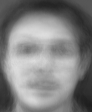

Image after NMF:


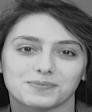

[[117. 113. 118. ... 111. 107. 113.]
 [116. 117. 112. ... 111. 111. 113.]
 [116. 116. 116. ... 112. 109. 111.]
 ...
 [ 54.  51.  60. ...  76.  78.  75.]
 [ 64.  64.  67. ...  76.  79.  82.]
 [ 70.  70.  75. ...  78.  85.  82.]]
Image Before NMF:
-------------------------------Number of image: 286
[[ 95.  96.  96. ...  95.  95.  95.]
 [ 96.  96.  96. ...  96.  96.  96.]
 [ 96.  96.  96. ...  96.  96.  96.]
 ...
 [157. 157. 159. ... 114. 113. 112.]
 [161. 161. 165. ... 117. 116. 116.]
 [163. 166. 169. ... 118. 116. 116.]]


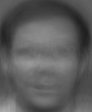

Image after NMF:


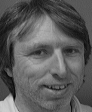

[[ 88.  85.  89. ...  89.  87.  84.]
 [ 87.  88.  84. ...  86.  89.  87.]
 [ 85.  88.  88. ...  85.  90.  83.]
 ...
 [199. 201. 201. ... 116. 120. 114.]
 [199. 200. 202. ... 118. 119. 117.]
 [192. 195. 203. ... 117. 117. 116.]]
Image Before NMF:
-------------------------------Number of image: 287
[[111. 112. 112. ... 115. 114. 114.]
 [112. 112. 111. ... 115. 115. 114.]
 [112. 112. 112. ... 114. 115. 115.]
 ...
 [ 74.  76.  79. ...  51.  51.  51.]
 [ 75.  76.  79. ...  50.  50.  52.]
 [ 75.  78.  79. ...  49.  50.  51.]]


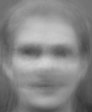

Image after NMF:


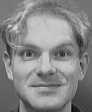

[[122. 120. 121. ... 113. 116. 112.]
 [122. 120. 117. ... 115. 114. 113.]
 [121. 123. 122. ... 112. 118. 114.]
 ...
 [ 92.  85.  89. ...  69.  64.  68.]
 [ 87.  90.  88. ...  62.  67.  59.]
 [ 88.  85.  91. ...  59.  67.  58.]]
Image Before NMF:
-------------------------------Number of image: 288
[[42. 42. 42. ... 36. 35. 35.]
 [41. 43. 42. ... 35. 35. 35.]
 [42. 43. 43. ... 35. 36. 35.]
 ...
 [72. 79. 82. ... 28. 28. 29.]
 [77. 84. 83. ... 30. 30. 28.]
 [79. 86. 85. ... 35. 36. 31.]]


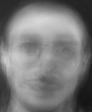

Image after NMF:


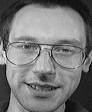

[[39. 46. 42. ... 39. 39. 36.]
 [48. 44. 45. ... 37. 40. 42.]
 [42. 47. 43. ... 37. 38. 47.]
 ...
 [60. 53. 48. ... 20. 28. 26.]
 [65. 45. 48. ... 19. 24. 27.]
 [52. 55. 54. ... 19. 19. 25.]]
Image Before NMF:
-------------------------------Number of image: 289
[[117. 117. 118. ... 122. 121. 121.]
 [117. 117. 116. ... 122. 122. 122.]
 [117. 117. 117. ... 121. 123. 123.]
 ...
 [ 67.  70.  74. ...  54.  56.  56.]
 [ 69.  72.  74. ...  55.  54.  56.]
 [ 69.  72.  74. ...  55.  55.  54.]]


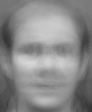

Image after NMF:


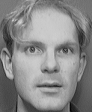

[[120. 120. 120. ... 113. 113. 109.]
 [121. 121. 121. ... 112. 114. 111.]
 [120. 124. 123. ... 112. 114. 114.]
 ...
 [ 94.  85.  82. ...  85.  86.  85.]
 [ 94.  93.  82. ...  82.  83.  84.]
 [ 94.  93.  86. ...  82.  87.  79.]]
Image Before NMF:
-------------------------------Number of image: 290
[[80. 79. 80. ... 81. 80. 81.]
 [79. 80. 79. ... 81. 81. 81.]
 [80. 79. 80. ... 80. 82. 81.]
 ...
 [87. 91. 94. ... 65. 65. 65.]
 [93. 97. 97. ... 68. 66. 66.]
 [94. 98. 99. ... 71. 69. 66.]]


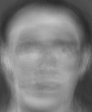

Image after NMF:


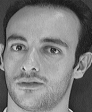

[[63. 60. 63. ... 62. 61. 66.]
 [58. 60. 65. ... 68. 61. 63.]
 [61. 61. 60. ... 62. 65. 57.]
 ...
 [60. 51. 60. ... 63. 62. 68.]
 [52. 50. 46. ... 64. 64. 61.]
 [55. 50. 24. ... 63. 69. 58.]]
Image Before NMF:
-------------------------------Number of image: 291
[[ 63.  62.  62. ...  59.  59.  59.]
 [ 63.  62.  62. ...  60.  59.  60.]
 [ 64.  63.  62. ...  60.  60.  60.]
 ...
 [109. 106. 109. ... 103. 102. 103.]
 [113. 113. 117. ... 107. 105. 104.]
 [116. 119. 122. ... 116. 114. 105.]]


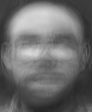

Image after NMF:


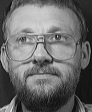

[[ 44.  48.  51. ...  41.  41.  43.]
 [ 46.  50.  45. ...  38.  41.  44.]
 [ 50.  51.  43. ...  36.  42.  41.]
 ...
 [186. 198. 164. ... 106. 113. 111.]
 [174. 149. 144. ... 116. 130. 123.]
 [136. 150. 154. ... 129. 131. 125.]]
Image Before NMF:
-------------------------------Number of image: 292
[[ 66.  65.  66. ...  63.  63.  63.]
 [ 66.  65.  66. ...  63.  63.  63.]
 [ 67.  67.  65. ...  63.  63.  63.]
 ...
 [145. 141. 145. ... 130. 129. 129.]
 [148. 148. 153. ... 135. 133. 131.]
 [151. 155. 159. ... 144. 141. 132.]]


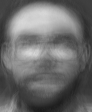

Image after NMF:


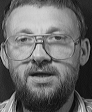

[[ 46.  50.  45. ...  38.  44.  40.]
 [ 49.  45.  51. ...  40.  42.  40.]
 [ 50.  50.  49. ...  42.  43.  40.]
 ...
 [188. 166. 188. ... 137. 128. 153.]
 [148. 152. 220. ... 128. 135. 112.]
 [126. 197. 188. ... 136. 144.  98.]]
Image Before NMF:
-------------------------------Number of image: 293
[[110. 110. 110. ... 114. 113. 113.]
 [110. 111. 109. ... 113. 114. 113.]
 [110. 110. 110. ... 112. 114. 114.]
 ...
 [ 77.  81.  84. ...  53.  53.  54.]
 [ 78.  82.  84. ...  52.  52.  54.]
 [ 78.  81.  82. ...  51.  52.  52.]]


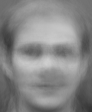

Image after NMF:


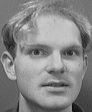

[[122. 120. 125. ... 118. 112. 113.]
 [125. 121. 121. ... 113. 115. 112.]
 [120. 119. 120. ... 117. 112. 115.]
 ...
 [ 89.  86.  88. ...  65.  67.  63.]
 [ 91.  88.  85. ...  67.  66.  62.]
 [ 92.  91.  87. ...  65.  62.  66.]]
Image Before NMF:
-------------------------------Number of image: 294
[[39. 39. 39. ... 34. 33. 33.]
 [38. 39. 38. ... 33. 34. 33.]
 [39. 39. 40. ... 33. 34. 34.]
 ...
 [70. 77. 80. ... 29. 29. 30.]
 [75. 83. 81. ... 31. 31. 29.]
 [76. 83. 82. ... 36. 37. 31.]]


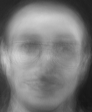

Image after NMF:


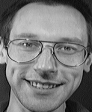

[[52. 42. 42. ... 37. 39. 38.]
 [45. 48. 39. ... 34. 37. 40.]
 [47. 44. 42. ... 35. 41. 39.]
 ...
 [58. 47. 49. ... 27. 19. 25.]
 [59. 44. 55. ... 16. 23. 23.]
 [56. 48. 61. ... 37. 19. 24.]]
Image Before NMF:
-------------------------------Number of image: 295
[[ 38.  38.  38. ...  36.  36.  36.]
 [ 39.  38.  39. ...  37.  36.  36.]
 [ 39.  39.  39. ...  37.  37.  36.]
 ...
 [ 93.  91.  92. ...  83.  82.  83.]
 [ 97.  96.  99. ...  86.  86.  84.]
 [100. 105. 107. ...  94.  92.  88.]]


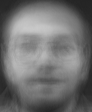

Image after NMF:


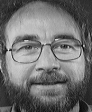

[[ 63.  56.  51. ...  43.  44.  44.]
 [ 54.  56.  49. ...  44.  49.  50.]
 [ 50.  54.  47. ...  47.  47.  44.]
 ...
 [106. 124. 120. ... 110. 126.  88.]
 [ 96. 120. 125. ... 111. 137.  97.]
 [ 86. 117. 124. ... 118. 127. 137.]]
Image Before NMF:
-------------------------------Number of image: 296
[[69. 69. 69. ... 73. 72. 72.]
 [69. 69. 69. ... 73. 73. 73.]
 [69. 69. 70. ... 72. 74. 73.]
 ...
 [63. 62. 62. ... 63. 63. 63.]
 [65. 63. 67. ... 64. 65. 65.]
 [68. 72. 72. ... 68. 67. 68.]]


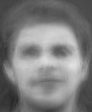

Image after NMF:


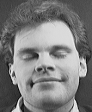

[[62. 64. 64. ... 80. 77. 79.]
 [63. 66. 67. ... 76. 77. 81.]
 [67. 66. 67. ... 77. 77. 84.]
 ...
 [65. 63. 57. ... 49. 51. 58.]
 [60. 56. 46. ... 45. 50. 50.]
 [54. 53. 46. ... 45. 44. 52.]]
Image Before NMF:
-------------------------------Number of image: 297
[[114. 113. 114. ... 111. 111. 110.]
 [114. 114. 114. ... 111. 110. 110.]
 [114. 113. 113. ... 111. 110. 110.]
 ...
 [ 33.  32.  34. ...  30.  31.  31.]
 [ 35.  33.  37. ...  29.  30.  31.]
 [ 36.  36.  38. ...  31.  32.  32.]]


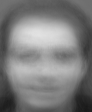

Image after NMF:


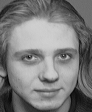

[[100. 105. 103. ... 110. 109. 113.]
 [103. 103. 103. ... 110. 110. 109.]
 [103. 105. 107. ... 111. 110. 109.]
 ...
 [ 59.  54.  44. ...  40.  32.  45.]
 [ 45.  49.  44. ...  34.  36.  44.]
 [ 53.  59.  38. ...  41.  37.  37.]]
Image Before NMF:
-------------------------------Number of image: 298
[[ 36.  36.  36. ...  34.  33.  34.]
 [ 36.  36.  36. ...  34.  34.  34.]
 [ 36.  36.  36. ...  34.  34.  34.]
 ...
 [ 94.  95.  97. ...  71.  70.  71.]
 [ 98. 100. 102. ...  74.  73.  72.]
 [ 99. 105. 106. ...  80.  79.  74.]]


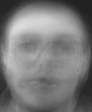

Image after NMF:


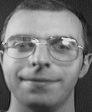

[[51. 41. 56. ... 41. 33. 48.]
 [52. 50. 47. ... 36. 38. 39.]
 [48. 49. 51. ... 37. 41. 33.]
 ...
 [43. 41. 49. ... 38. 46. 47.]
 [73. 61. 65. ... 43. 43. 44.]
 [85. 48. 49. ... 43. 49. 36.]]
Image Before NMF:
-------------------------------Number of image: 299
[[ 97.  97.  97. ...  95.  96.  96.]
 [ 97.  97.  97. ...  96.  95.  96.]
 [ 97.  97.  97. ...  96.  96.  95.]
 ...
 [127. 128. 129. ...  92.  91.  91.]
 [132. 132. 134. ...  94.  94.  94.]
 [135. 136. 138. ...  95.  94.  95.]]


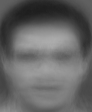

Image after NMF:


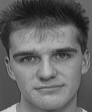

[[108. 108. 106. ... 103. 106. 105.]
 [110. 104. 110. ... 104. 102. 109.]
 [108. 106. 109. ... 103. 105. 104.]
 ...
 [ 77.  79.  74. ...  73.  71.  69.]
 [ 75.  90. 128. ...  70.  71.  70.]
 [132. 176. 193. ...  69.  69.  70.]]
Image Before NMF:
-------------------------------Number of image: 300
[[ 51.  51.  51. ...  49.  49.  49.]
 [ 51.  51.  52. ...  50.  49.  49.]
 [ 52.  52.  52. ...  50.  50.  49.]
 ...
 [133. 132. 133. ...  99.  98.  98.]
 [136. 137. 140. ... 104. 102. 101.]
 [139. 144. 146. ... 108. 105. 102.]]


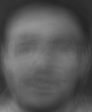

Image after NMF:


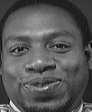

[[ 54.  55.  60. ...  57.  50.  56.]
 [ 54.  57.  59. ...  51.  52.  55.]
 [ 58.  60.  57. ...  54.  55.  57.]
 ...
 [128. 169. 153. ... 113.  71.  78.]
 [ 99. 223. 209. ... 143. 154. 124.]
 [106. 227. 217. ... 156. 181. 217.]]
Image Before NMF:
-------------------------------Number of image: 301
[[ 48.  48.  48. ...  45.  45.  45.]
 [ 48.  48.  49. ...  46.  45.  45.]
 [ 49.  49.  48. ...  46.  46.  45.]
 ...
 [117. 114. 116. ... 101. 100. 100.]
 [121. 120. 124. ... 105. 104. 102.]
 [124. 130. 132. ... 113. 111. 106.]]


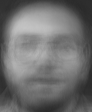

Image after NMF:


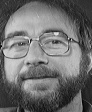

[[ 49.  50.  48. ...  44.  47.  43.]
 [ 50.  50.  55. ...  48.  45.  44.]
 [ 52.  62.  56. ...  47.  47.  48.]
 ...
 [115. 115. 108. ...  58.  70.  68.]
 [117. 121. 120. ...  66.  70.  73.]
 [125. 119. 122. ...  73.  77.  71.]]
Image Before NMF:
-------------------------------Number of image: 302
[[ 93.  93.  93. ...  88.  88.  88.]
 [ 93.  93.  93. ...  88.  88.  88.]
 [ 93.  93.  93. ...  88.  88.  87.]
 ...
 [169. 170. 170. ... 112. 109. 109.]
 [175. 176. 177. ... 115. 114. 113.]
 [179. 180. 183. ... 117. 115. 115.]]


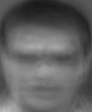

Image after NMF:


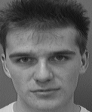

[[110. 110. 112. ... 104. 105. 102.]
 [109. 110. 113. ... 103. 104. 104.]
 [108. 113. 107. ... 105. 105. 103.]
 ...
 [194. 200. 198. ...  68.  66.  64.]
 [203. 202. 199. ...  65.  65.  65.]
 [203. 201. 198. ... 141.  88.  64.]]
Image Before NMF:
-------------------------------Number of image: 303
[[46. 46. 47. ... 40. 39. 39.]
 [46. 47. 46. ... 39. 40. 40.]
 [47. 47. 47. ... 40. 40. 40.]
 ...
 [72. 78. 81. ... 30. 30. 31.]
 [77. 84. 83. ... 31. 31. 30.]
 [79. 86. 85. ... 37. 37. 32.]]


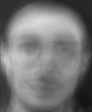

Image after NMF:


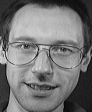

[[41. 49. 45. ... 39. 40. 42.]
 [38. 49. 44. ... 37. 41. 40.]
 [48. 45. 48. ... 42. 37. 40.]
 ...
 [51. 55. 40. ... 24. 24. 24.]
 [53. 53. 27. ... 23. 24. 25.]
 [52. 56. 11. ... 18. 28. 21.]]
Image Before NMF:
-------------------------------Number of image: 304
[[125. 125. 125. ... 131. 131. 131.]
 [125. 125. 124. ... 132. 132. 131.]
 [125. 125. 125. ... 131. 132. 132.]
 ...
 [ 78.  75.  79. ...  80.  81.  81.]
 [ 77.  76.  81. ...  80.  80.  82.]
 [ 77.  78.  81. ...  79.  79.  80.]]


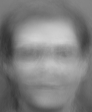

Image after NMF:


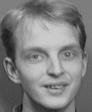

[[131. 125. 126. ... 125. 127. 124.]
 [131. 128. 124. ... 125. 125. 125.]
 [127. 127. 125. ... 122. 125. 127.]
 ...
 [ 99. 100.  99. ...  90.  93.  91.]
 [101.  97.  99. ...  90.  92.  89.]
 [ 98.  94. 103. ...  89.  93.  91.]]
Image Before NMF:
-------------------------------Number of image: 305
[[33. 33. 33. ... 31. 30. 30.]
 [33. 33. 33. ... 31. 31. 31.]
 [33. 33. 33. ... 31. 31. 31.]
 ...
 [86. 87. 88. ... 66. 65. 65.]
 [89. 92. 93. ... 68. 67. 66.]
 [91. 97. 98. ... 74. 73. 69.]]


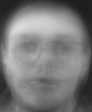

Image after NMF:


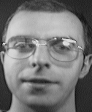

[[ 42.  47.  48. ...  38.  40.  35.]
 [ 45.  40.  45. ...  36.  36.  38.]
 [ 46.  53.  48. ...  42.  36.  38.]
 ...
 [ 59.  50.  46. ...  40.  41.  41.]
 [112.  82.  66. ...  35.  47.  37.]
 [124.  97.  57. ...  34.  43.  45.]]
Image Before NMF:
-------------------------------Number of image: 306
[[ 43.  42.  43. ...  40.  40.  40.]
 [ 43.  43.  43. ...  40.  40.  40.]
 [ 43.  43.  43. ...  40.  41.  40.]
 ...
 [114. 115. 116. ...  84.  82.  83.]
 [119. 122. 122. ...  87.  87.  85.]
 [122. 128. 129. ...  94.  92.  88.]]


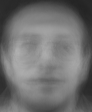

Image after NMF:


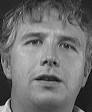

[[ 38.  35.  40. ...  34.  36.  36.]
 [ 37.  41.  37. ...  38.  36.  39.]
 [ 37.  40.  39. ...  34.  38.  36.]
 ...
 [192. 197. 198. ...  36.  34.  36.]
 [184. 193. 204. ...  36.  35.  37.]
 [190. 202. 208. ...  36.  35.  39.]]
Image Before NMF:
-------------------------------Number of image: 307
[[126. 125. 126. ... 124. 124. 124.]
 [126. 125. 124. ... 123. 123. 123.]
 [125. 125. 124. ... 123. 123. 123.]
 ...
 [  5.   7.   6. ...  16.  16.  16.]
 [ 12.  10.  10. ...  16.  17.  16.]
 [ 15.  10.  11. ...  18.  18.  19.]]


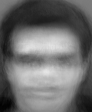

Image after NMF:


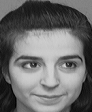

[[133. 135. 135. ... 133. 131. 132.]
 [133. 133. 134. ... 131. 129. 130.]
 [130. 134. 132. ... 129. 131. 129.]
 ...
 [ 26.  20.  32. ...  19.  22.  16.]
 [ 25.  21.  28. ...  18.  18.  16.]
 [ 23.  25.  27. ...  18.  17.  15.]]
Image Before NMF:
-------------------------------Number of image: 308
[[146. 146. 146. ... 141. 141. 141.]
 [147. 147. 145. ... 141. 141. 141.]
 [146. 146. 147. ... 141. 142. 141.]
 ...
 [181. 183. 185. ... 115. 112. 112.]
 [189. 191. 191. ... 118. 117. 116.]
 [192. 193. 196. ... 119. 117. 117.]]


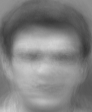

Image after NMF:


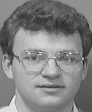

[[143. 144. 142. ... 147. 144. 141.]
 [145. 141. 144. ... 146. 145. 142.]
 [144. 143. 143. ... 147. 143. 144.]
 ...
 [213. 223. 222. ...  83.  78.  75.]
 [223. 222. 221. ...  79.  79.  80.]
 [222. 222. 220. ...  79.  79.  80.]]
Image Before NMF:
-------------------------------Number of image: 309
[[ 78.  78.  78. ...  79.  79.  79.]
 [ 78.  78.  78. ...  79.  79.  79.]
 [ 78.  78.  79. ...  79.  80.  80.]
 ...
 [163. 165. 166. ... 112. 110. 110.]
 [168. 171. 172. ... 116. 115. 114.]
 [171. 175. 177. ... 117. 115. 115.]]


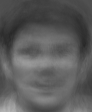

Image after NMF:


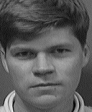

[[ 88.  79.  77. ... 100. 102. 103.]
 [ 80.  69.  86. ... 102. 100. 100.]
 [ 64.  71.  86. ...  99. 104. 101.]
 ...
 [192. 191. 200. ... 144. 140. 133.]
 [194. 199. 200. ... 137. 143. 145.]
 [189. 202. 200. ... 137. 138. 148.]]
Image Before NMF:
-------------------------------Number of image: 310
[[ 99. 100. 100. ... 100. 100. 100.]
 [100. 100. 100. ... 101. 101. 101.]
 [100. 100. 100. ... 100. 101. 101.]
 ...
 [140. 139. 141. ... 109. 109. 108.]
 [144. 143. 147. ... 113. 112. 111.]
 [147. 150. 153. ... 115. 113. 112.]]


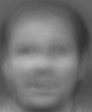

Image after NMF:


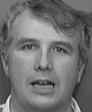

[[120. 119. 121. ... 113. 117. 117.]
 [121. 122. 121. ... 115. 113. 117.]
 [121. 119. 122. ... 115. 117. 117.]
 ...
 [116.  90. 132. ...  77.  76.  78.]
 [101.  92. 153. ...  79.  74.  79.]
 [ 95. 105. 175. ...  74.  74.  80.]]
Image Before NMF:
-------------------------------Number of image: 311
[[ 50.  50.  51. ...  40.  40.  40.]
 [ 50.  51.  51. ...  40.  40.  40.]
 [ 51.  51.  52. ...  41.  40.  39.]
 ...
 [103. 109. 111. ...  44.  44.  44.]
 [109. 115. 115. ...  46.  46.  44.]
 [112. 121. 120. ...  53.  52.  48.]]


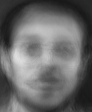

Image after NMF:


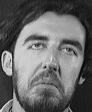

[[ 47.  49.  46. ...  39.  39.  39.]
 [ 45.  45.  51. ...  38.  37.  41.]
 [ 47.  45.  48. ...  42.  33.  46.]
 ...
 [109. 226. 192. ...  29.  34.  31.]
 [220. 220. 145. ...  28.  29.  35.]
 [212. 215. 137. ...  31.  32.  34.]]
Image Before NMF:
-------------------------------Number of image: 312
[[106. 107. 107. ... 107. 107. 106.]
 [106. 107. 107. ... 107. 107. 107.]
 [107. 106. 107. ... 107. 107. 107.]
 ...
 [ 95.  95.  98. ...  70.  71.  70.]
 [ 97.  97. 101. ...  71.  70.  72.]
 [ 98. 101. 103. ...  71.  70.  71.]]


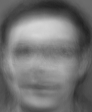

Image after NMF:


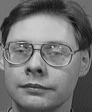

[[112. 115. 120. ... 109. 114. 105.]
 [118. 112. 115. ... 109. 111. 109.]
 [116. 116. 115. ... 109. 111. 112.]
 ...
 [ 96.  98. 100. ...  52.  53.  43.]
 [ 97.  96. 104. ...  54.  50.  54.]
 [107. 110. 109. ...  53.  53.  54.]]
Image Before NMF:
-------------------------------Number of image: 313
[[29. 29. 29. ... 30. 29. 30.]
 [29. 29. 29. ... 30. 30. 30.]
 [30. 30. 30. ... 29. 31. 31.]
 ...
 [78. 82. 84. ... 55. 54. 55.]
 [82. 88. 86. ... 57. 56. 55.]
 [84. 90. 89. ... 62. 61. 57.]]


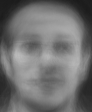

Image after NMF:


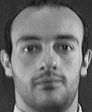

[[46. 45. 49. ... 45. 45. 44.]
 [47. 49. 49. ... 44. 46. 45.]
 [50. 49. 49. ... 42. 47. 47.]
 ...
 [61. 56. 59. ... 59. 55. 58.]
 [57. 57. 56. ... 56. 57. 59.]
 [57. 55. 54. ... 56. 60. 58.]]
Image Before NMF:
-------------------------------Number of image: 314
[[61. 61. 62. ... 62. 62. 62.]
 [61. 62. 62. ... 63. 63. 63.]
 [62. 61. 62. ... 63. 63. 63.]
 ...
 [74. 75. 78. ... 60. 60. 61.]
 [75. 78. 80. ... 60. 60. 61.]
 [76. 80. 81. ... 63. 63. 62.]]


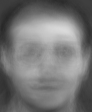

Image after NMF:


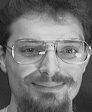

[[ 56.  61.  54. ...  54.  55.  54.]
 [ 53.  61.  56. ...  55.  54.  59.]
 [ 60.  59.  57. ...  59.  54.  60.]
 ...
 [ 72. 105. 134. ...  39.  44.  41.]
 [142. 145. 146. ...  39.  41.  41.]
 [155. 142. 159. ...  40.  43.  45.]]
Image Before NMF:
-------------------------------Number of image: 315
[[ 28.  28.  28. ...  28.  28.  28.]
 [ 29.  28.  29. ...  28.  29.  29.]
 [ 28.  29.  30. ...  28.  29.  29.]
 ...
 [184. 182. 183. ... 136. 132. 132.]
 [187. 188. 190. ... 140. 138. 137.]
 [190. 196. 198. ... 143. 141. 139.]]


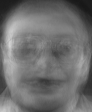

Image after NMF:


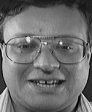

[[ 35.  39.  38. ...  27.  33.  31.]
 [ 38.  37.  38. ...  33.  32.  32.]
 [ 40.  37.  38. ...  34.  33.  34.]
 ...
 [198. 157. 171. ... 211. 163. 190.]
 [185. 155. 188. ... 210. 180. 169.]
 [170. 154. 202. ... 212. 202. 145.]]
Image Before NMF:
-------------------------------Number of image: 316
[[ 31.  31.  31. ...  29.  29.  29.]
 [ 31.  31.  31. ...  29.  29.  29.]
 [ 32.  32.  32. ...  29.  30.  30.]
 ...
 [ 96.  97.  99. ...  74.  73.  74.]
 [100. 103. 104. ...  77.  76.  74.]
 [102. 108. 108. ...  84.  83.  77.]]


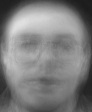

Image after NMF:


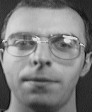

[[50. 49. 49. ... 42. 37. 41.]
 [54. 50. 47. ... 44. 40. 39.]
 [60. 44. 54. ... 43. 40. 41.]
 ...
 [69. 67. 61. ... 42. 40. 43.]
 [81. 50. 44. ... 41. 39. 46.]
 [81. 33. 15. ... 41. 40. 45.]]
Image Before NMF:
-------------------------------Number of image: 317
[[117. 117. 118. ... 122. 121. 121.]
 [117. 118. 116. ... 122. 122. 121.]
 [117. 117. 117. ... 121. 122. 122.]
 ...
 [ 61.  64.  67. ...  49.  50.  50.]
 [ 62.  65.  67. ...  48.  48.  50.]
 [ 62.  65.  67. ...  48.  49.  49.]]


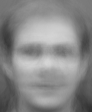

Image after NMF:


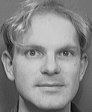

[[119. 118. 119. ... 116. 112. 114.]
 [121. 119. 119. ... 114. 115. 113.]
 [117. 121. 118. ... 114. 115. 110.]
 ...
 [ 92.  88.  87. ...  83.  84.  83.]
 [ 94.  90.  88. ...  83.  82.  84.]
 [ 93.  89.  81. ...  83.  83.  82.]]
Image Before NMF:
-------------------------------Number of image: 318
[[116. 116. 116. ... 119. 118. 118.]
 [116. 116. 116. ... 119. 119. 119.]
 [116. 116. 116. ... 118. 120. 120.]
 ...
 [ 81.  82.  84. ...  60.  61.  60.]
 [ 82.  83.  86. ...  60.  60.  62.]
 [ 83.  86.  88. ...  59.  59.  61.]]


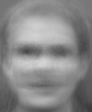

Image after NMF:


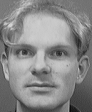

[[121. 120. 122. ... 116. 113. 112.]
 [120. 121. 119. ... 115. 115. 114.]
 [120. 122. 120. ... 115. 114. 115.]
 ...
 [ 87.  94.  94. ...  67.  67.  66.]
 [ 91.  89.  92. ...  64.  65.  67.]
 [ 89.  94.  90. ...  66.  62.  68.]]
Image Before NMF:
-------------------------------Number of image: 319
[[67. 67. 68. ... 59. 58. 58.]
 [67. 68. 68. ... 58. 58. 58.]
 [67. 67. 68. ... 59. 58. 58.]
 ...
 [69. 74. 76. ... 26. 27. 27.]
 [74. 77. 78. ... 27. 27. 27.]
 [75. 81. 81. ... 31. 31. 29.]]


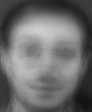

Image after NMF:


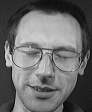

[[38. 46. 38. ... 39. 32. 39.]
 [41. 43. 42. ... 40. 35. 34.]
 [45. 37. 43. ... 39. 35. 42.]
 ...
 [71. 74. 69. ... 26. 27. 16.]
 [71. 77. 68. ... 24. 21. 27.]
 [75. 70. 72. ... 27. 23. 26.]]
Image Before NMF:
-------------------------------Number of image: 320
[[123. 122. 123. ... 124. 124. 124.]
 [123. 122. 121. ... 123. 123. 123.]
 [122. 121. 121. ... 123. 124. 123.]
 ...
 [  7.   8.   8. ...  25.  25.  26.]
 [ 12.  11.  11. ...  25.  26.  26.]
 [ 15.  10.  12. ...  28.  27.  27.]]


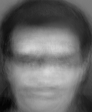

Image after NMF:


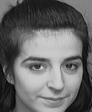

[[134. 138. 136. ... 129. 131. 127.]
 [134. 135. 135. ... 130. 130. 129.]
 [133. 134. 135. ... 127. 132. 133.]
 ...
 [ 25.  19.  21. ...  27.  57.  81.]
 [ 26.  22.  19. ...  30.  71.  81.]
 [ 21.  25.  22. ...  55.  79.  81.]]
Image Before NMF:
-------------------------------Number of image: 321
[[87. 87. 87. ... 85. 85. 85.]
 [87. 88. 88. ... 86. 85. 85.]
 [88. 87. 88. ... 85. 86. 85.]
 ...
 [43. 45. 45. ... 36. 38. 38.]
 [49. 49. 50. ... 40. 40. 38.]
 [52. 57. 57. ... 47. 43. 42.]]


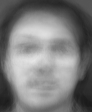

Image after NMF:


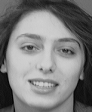

[[117. 112. 115. ... 108. 112. 109.]
 [114. 115. 116. ... 111. 109. 111.]
 [115. 114. 114. ... 110. 111. 109.]
 ...
 [ 46.  53.  59. ...  82.  76.  72.]
 [ 55.  59.  67. ...  80.  78.  76.]
 [ 57.  61.  69. ...  82.  82.  80.]]
Image Before NMF:
-------------------------------Number of image: 322
[[110. 110. 111. ... 107. 107. 106.]
 [110. 111. 110. ... 107. 107. 106.]
 [110. 110. 111. ... 107. 107. 107.]
 ...
 [ 79.  82.  85. ...  43.  44.  44.]
 [ 81.  83.  86. ...  42.  42.  44.]
 [ 81.  85.  86. ...  41.  43.  43.]]


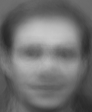

Image after NMF:


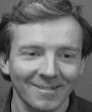

[[103. 105. 104. ... 111. 107. 106.]
 [102. 106. 107. ... 110. 106. 106.]
 [103. 106. 104. ... 111. 108. 107.]
 ...
 [ 80.  82.  85. ...  44.  47.  43.]
 [ 79.  87.  78. ...  48.  41.  44.]
 [ 76.  88.  82. ...  44.  38.  43.]]
Image Before NMF:
-------------------------------Number of image: 323
[[ 90.  90.  91. ...  88.  88.  88.]
 [ 90.  91.  90. ...  88.  88.  88.]
 [ 90.  90.  91. ...  88.  88.  88.]
 ...
 [136. 140. 143. ...  86.  86.  86.]
 [140. 144. 146. ...  88.  87.  88.]
 [141. 147. 149. ...  90.  90.  88.]]


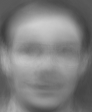

Image after NMF:


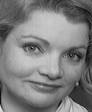

[[ 88.  97.  95. ... 104.  87.  80.]
 [ 94.  95.  96. ... 109. 105.  84.]
 [ 93. 101. 101. ... 109. 105. 104.]
 ...
 [224. 208. 115. ...  71.  64.  62.]
 [222. 215. 180. ...  80.  73.  77.]
 [200. 216. 204. ...  67.  68.  69.]]
Image Before NMF:
-------------------------------Number of image: 324
[[79. 80. 80. ... 73. 73. 73.]
 [80. 80. 81. ... 73. 73. 73.]
 [80. 80. 80. ... 74. 73. 73.]
 ...
 [74. 77. 77. ... 40. 40. 40.]
 [78. 79. 81. ... 40. 41. 41.]
 [80. 84. 84. ... 42. 43. 43.]]


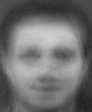

Image after NMF:


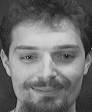

[[53. 52. 61. ... 56. 62. 59.]
 [53. 57. 59. ... 57. 56. 57.]
 [58. 57. 58. ... 61. 57. 57.]
 ...
 [54. 55. 54. ... 38. 44. 40.]
 [62. 51. 53. ... 46. 39. 44.]
 [57. 56. 51. ... 46. 45. 45.]]
Image Before NMF:
-------------------------------Number of image: 325
[[112. 113. 113. ... 111. 111. 111.]
 [112. 113. 113. ... 111. 111. 111.]
 [112. 112. 113. ... 111. 111. 111.]
 ...
 [ 94.  96.  98. ...  58.  59.  59.]
 [ 96.  97. 101. ...  59.  59.  61.]
 [ 97. 101. 103. ...  58.  58.  60.]]


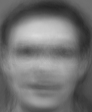

Image after NMF:


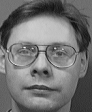

[[115. 113. 113. ... 111. 110. 110.]
 [114. 117. 114. ... 108. 112. 109.]
 [116. 116. 117. ... 106. 113. 112.]
 ...
 [ 99.  96. 101. ...  52.  58.  49.]
 [ 93. 101.  94. ...  52.  51.  57.]
 [ 99.  93. 101. ...  56.  52.  55.]]
Image Before NMF:
-------------------------------Number of image: 326
[[ 97.  97.  97. ...  96.  96.  96.]
 [ 97.  98.  97. ...  96.  96.  96.]
 [ 97.  97.  98. ...  96.  97.  96.]
 ...
 [ 92.  93.  94. ...  62.  61.  61.]
 [ 96.  97.  98. ...  63.  63.  63.]
 [ 98.  98. 100. ...  63.  63.  63.]]


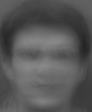

Image after NMF:


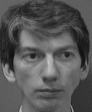

[[101. 100.  99. ...  87.  94.  90.]
 [ 98. 100. 101. ...  92.  94.  92.]
 [103.  97.  97. ...  89.  97.  92.]
 ...
 [ 90.  88.  93. ...  51.  52.  52.]
 [ 93.  89.  93. ...  50.  52.  51.]
 [ 86.  93.  92. ...  49.  52.  52.]]
Image Before NMF:
-------------------------------Number of image: 327
[[51. 51. 52. ... 47. 46. 46.]
 [51. 52. 51. ... 46. 46. 46.]
 [52. 52. 52. ... 46. 47. 46.]
 ...
 [57. 62. 63. ... 24. 24. 25.]
 [62. 67. 65. ... 26. 26. 25.]
 [64. 69. 68. ... 30. 30. 27.]]


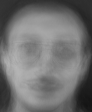

Image after NMF:


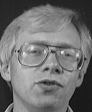

[[34. 35. 35. ... 27. 36. 33.]
 [36. 35. 37. ... 36. 30. 31.]
 [37. 35. 38. ... 32. 35. 31.]
 ...
 [40. 37. 39. ... 29. 27. 28.]
 [37. 38. 44. ... 26. 28. 25.]
 [40. 38. 43. ... 31. 24. 24.]]
Image Before NMF:
-------------------------------Number of image: 328
[[ 26.  26.  26. ...  25.  25.  25.]
 [ 26.  26.  27. ...  26.  26.  26.]
 [ 26.  27.  27. ...  26.  27.  26.]
 ...
 [184. 183. 183. ... 137. 134. 134.]
 [188. 189. 191. ... 142. 140. 138.]
 [192. 197. 200. ... 146. 144. 141.]]


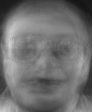

Image after NMF:


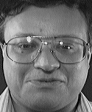

[[ 36.  36.  38. ...  29.  31.  35.]
 [ 37.  40.  35. ...  35.  31.  28.]
 [ 35.  38.  35. ...  33.  33.  25.]
 ...
 [219. 173. 155. ... 213. 166. 188.]
 [210. 162. 163. ... 211. 185. 164.]
 [194. 156. 176. ... 210. 205. 144.]]
Image Before NMF:
-------------------------------Number of image: 329
[[119. 119. 120. ... 113. 113. 112.]
 [119. 120. 119. ... 113. 113. 113.]
 [119. 120. 120. ... 113. 113. 113.]
 ...
 [132. 136. 140. ...  68.  68.  68.]
 [135. 139. 142. ...  68.  68.  69.]
 [136. 140. 142. ...  67.  69.  69.]]


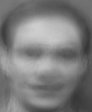

Image after NMF:


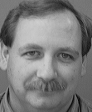

[[122. 123. 122. ... 118. 114. 118.]
 [124. 122. 122. ... 117. 116. 114.]
 [122. 123. 122. ... 116. 115. 115.]
 ...
 [132. 110. 131. ...  98.  92.  93.]
 [128. 116. 137. ...  99.  93.  90.]
 [126. 121. 146. ...  98. 101.  85.]]
Image Before NMF:
-------------------------------Number of image: 330
[[72. 72. 72. ... 75. 74. 74.]
 [72. 72. 72. ... 75. 75. 75.]
 [72. 72. 72. ... 74. 75. 75.]
 ...
 [63. 62. 61. ... 62. 61. 61.]
 [65. 63. 66. ... 62. 63. 63.]
 [67. 70. 71. ... 65. 65. 66.]]


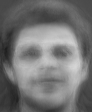

Image after NMF:


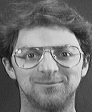

[[68. 68. 69. ... 69. 70. 75.]
 [68. 69. 73. ... 70. 78. 76.]
 [69. 67. 67. ... 73. 73. 75.]
 ...
 [52. 56. 52. ... 69. 73. 72.]
 [52. 55. 55. ... 73. 67. 71.]
 [58. 54. 59. ... 73. 67. 69.]]
Image Before NMF:
-------------------------------Number of image: 331
[[ 45.  44.  44. ...  42.  42.  42.]
 [ 45.  45.  45. ...  42.  42.  42.]
 [ 45.  45.  45. ...  42.  43.  42.]
 ...
 [108. 109. 110. ...  81.  80.  80.]
 [113. 115. 116. ...  84.  84.  82.]
 [116. 121. 122. ...  91.  89.  85.]]


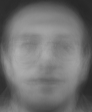

Image after NMF:


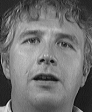

[[ 38.  41.  37. ...  42.  38.  34.]
 [ 42.  39.  39. ...  37.  34.  41.]
 [ 39.  43.  40. ...  42.  36.  39.]
 ...
 [197. 197. 200. ...  37.  38.  36.]
 [188. 186. 199. ...  39.  39.  37.]
 [182. 182. 195. ...  39.  38.  40.]]
Image Before NMF:
-------------------------------Number of image: 332
[[ 56.  56.  56. ...  54.  55.  55.]
 [ 56.  56.  57. ...  55.  55.  55.]
 [ 56.  56.  57. ...  55.  55.  55.]
 ...
 [117. 115. 115. ...  94.  93.  92.]
 [121. 119. 122. ...  98.  97.  96.]
 [124. 127. 129. ... 102.  99.  98.]]


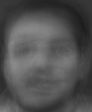

Image after NMF:


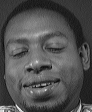

[[ 54.  53.  53. ...  46.  56.  50.]
 [ 54.  49.  57. ...  54.  45.  52.]
 [ 52.  55.  54. ...  59.  44.  55.]
 ...
 [157. 179. 159. ... 101. 110. 147.]
 [208. 211. 210. ... 116. 116.  93.]
 [213. 212. 209. ... 227. 104. 125.]]
Image Before NMF:
-------------------------------Number of image: 333
[[130. 130. 130. ... 133. 133. 133.]
 [130. 130. 130. ... 134. 134. 133.]
 [130. 130. 130. ... 133. 134. 134.]
 ...
 [ 79.  77.  78. ...  75.  75.  75.]
 [ 81.  78.  83. ...  76.  76.  77.]
 [ 82.  84.  86. ...  77.  76.  77.]]


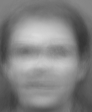

Image after NMF:


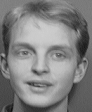

[[128. 125. 125. ... 121. 122. 121.]
 [129. 127. 128. ... 125. 121. 125.]
 [126. 126. 131. ... 124. 124. 125.]
 ...
 [ 71.  65.  90. ...  90.  86.  90.]
 [ 72.  75.  99. ...  86.  88.  91.]
 [ 63.  87. 100. ...  85.  90.  84.]]
Image Before NMF:
-------------------------------Number of image: 334
[[ 41.  41.  41. ...  39.  38.  39.]
 [ 41.  42.  42. ...  39.  39.  39.]
 [ 42.  42.  42. ...  39.  39.  39.]
 ...
 [112. 114. 114. ...  82.  80.  81.]
 [118. 120. 120. ...  85.  84.  82.]
 [121. 126. 127. ...  92.  90.  86.]]


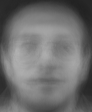

Image after NMF:


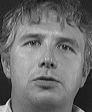

[[ 39.  40.  38. ...  34.  41.  31.]
 [ 36.  39.  39. ...  33.  39.  33.]
 [ 39.  40.  36. ...  38.  38.  34.]
 ...
 [184. 187. 194. ...  39.  37.  39.]
 [183. 186. 197. ...  35.  39.  37.]
 [191. 194. 207. ...  36.  38.  40.]]
Image Before NMF:
-------------------------------Number of image: 335
[[ 87.  87.  87. ...  93.  92.  92.]
 [ 87.  87.  87. ...  93.  93.  93.]
 [ 87.  87.  87. ...  92.  94.  94.]
 ...
 [123. 121. 122. ... 108. 107. 107.]
 [124. 123. 128. ... 111. 110. 110.]
 [126. 130. 133. ... 112. 110. 110.]]


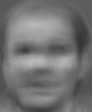

Image after NMF:


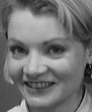

[[ 89.  95.  95. ... 152. 144. 134.]
 [ 87.  97.  88. ... 155. 145. 140.]
 [ 92.  98.  91. ... 144. 151. 142.]
 ...
 [ 76.  74.  79. ... 143. 139. 148.]
 [ 76.  75.  78. ... 137. 146. 151.]
 [ 77.  76.  74. ... 147. 152. 159.]]
Image Before NMF:
-------------------------------Number of image: 336
[[28. 28. 28. ... 30. 29. 30.]
 [27. 28. 27. ... 30. 30. 30.]
 [28. 28. 28. ... 29. 31. 30.]
 ...
 [55. 59. 62. ... 44. 44. 46.]
 [59. 65. 64. ... 47. 46. 44.]
 [60. 66. 65. ... 53. 51. 46.]]


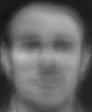

Image after NMF:


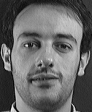

[[41. 43. 43. ... 57. 56. 61.]
 [41. 39. 38. ... 53. 59. 56.]
 [37. 38. 39. ... 51. 59. 52.]
 ...
 [37. 33. 30. ... 49. 49. 48.]
 [31. 33. 30. ... 50. 42. 48.]
 [38. 56. 77. ... 45. 47. 46.]]
Image Before NMF:
-------------------------------Number of image: 337
[[109. 110. 110. ... 111. 111. 111.]
 [110. 110. 110. ... 111. 111. 111.]
 [110. 110. 110. ... 111. 112. 111.]
 ...
 [133. 131. 132. ... 104. 103. 103.]
 [136. 134. 138. ... 108. 107. 107.]
 [139. 142. 144. ... 109. 106. 108.]]


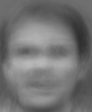

Image after NMF:


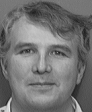

[[121. 120. 120. ... 117. 116. 118.]
 [120. 120. 120. ... 116. 122. 119.]
 [119. 119. 121. ... 119. 116. 123.]
 ...
 [199. 179. 184. ...  80.  74.  80.]
 [179. 119. 119. ...  80.  79.  77.]
 [181. 136.  95. ...  79.  76.  78.]]
Image Before NMF:
-------------------------------Number of image: 338
[[100. 101. 101. ...  99. 100.  99.]
 [101. 101. 102. ... 100. 100. 100.]
 [101. 101. 102. ... 100. 100. 100.]
 ...
 [181. 178. 180. ... 136. 135. 134.]
 [183. 182. 188. ... 139. 138. 139.]
 [186. 189. 193. ... 139. 138. 139.]]


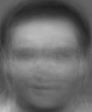

Image after NMF:


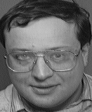

[[ 96.  94.  98. ...  94.  94.  93.]
 [ 96.  96. 102. ...  94.  94.  93.]
 [ 96.  97.  99. ...  94.  95.  94.]
 ...
 [169. 162. 142. ... 131. 137. 133.]
 [141. 137. 165. ... 120. 127. 153.]
 [153. 162. 171. ... 131. 136. 152.]]
Image Before NMF:
-------------------------------Number of image: 339
[[64. 64. 64. ... 67. 67. 68.]
 [64. 64. 65. ... 68. 67. 68.]
 [65. 64. 65. ... 67. 68. 68.]
 ...
 [85. 84. 84. ... 83. 81. 81.]
 [89. 87. 89. ... 84. 84. 84.]
 [92. 93. 95. ... 87. 86. 86.]]


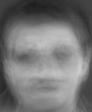

Image after NMF:


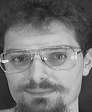

[[ 45.  52.  48. ...  53.  52.  56.]
 [ 44.  48.  48. ...  55.  53.  55.]
 [ 48.  47.  55. ...  56.  57.  52.]
 ...
 [ 48.  51.  57. ...  47.  49.  45.]
 [106. 111. 119. ...  44.  52.  43.]
 [125. 126. 124. ...  48.  43.  47.]]
Image Before NMF:
-------------------------------Number of image: 340
[[128. 128. 129. ... 124. 123. 123.]
 [129. 129. 128. ... 123. 123. 123.]
 [128. 129. 128. ... 123. 123. 123.]
 ...
 [107. 108. 110. ...  63.  62.  62.]
 [110. 111. 113. ...  63.  63.  64.]
 [111. 112. 115. ...  62.  64.  64.]]


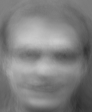

Image after NMF:


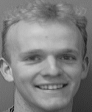

[[131. 129. 130. ... 123. 119. 119.]
 [129. 132. 129. ... 120. 119. 123.]
 [130. 130. 131. ... 119. 119. 121.]
 ...
 [100. 104. 101. ...  54.  50.  54.]
 [ 97. 103.  99. ...  51.  49.  50.]
 [100. 102. 107. ...  51.  48.  55.]]
Image Before NMF:
-------------------------------Number of image: 341
[[ 57.  58.  58. ...  53.  53.  53.]
 [ 58.  58.  60. ...  54.  53.  53.]
 [ 59.  58.  59. ...  54.  53.  53.]
 ...
 [ 88.  88.  88. ...  64.  64.  64.]
 [ 93.  93.  96. ...  68.  68.  66.]
 [ 97. 105. 105. ...  76.  72.  70.]]


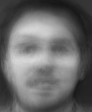

Image after NMF:


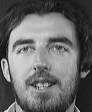

[[52. 48. 47. ... 40. 40. 41.]
 [51. 45. 54. ... 44. 39. 48.]
 [52. 48. 48. ... 42. 43. 38.]
 ...
 [62. 60. 57. ... 29. 31. 30.]
 [60. 56. 56. ... 32. 28. 35.]
 [59. 71. 61. ... 32. 31. 37.]]
Image Before NMF:
-------------------------------Number of image: 342
[[46. 46. 46. ... 53. 53. 53.]
 [46. 46. 46. ... 54. 54. 53.]
 [47. 46. 47. ... 52. 55. 54.]
 ...
 [49. 52. 52. ... 50. 50. 51.]
 [53. 55. 55. ... 53. 52. 51.]
 [54. 58. 57. ... 56. 53. 53.]]


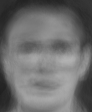

Image after NMF:


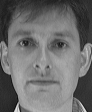

[[36. 38. 37. ... 45. 46. 45.]
 [36. 41. 40. ... 46. 46. 47.]
 [37. 40. 41. ... 43. 47. 44.]
 ...
 [41. 47. 41. ... 51. 53. 50.]
 [45. 40. 46. ... 52. 53. 47.]
 [43. 42. 42. ... 48. 51. 50.]]
Image Before NMF:
-------------------------------Number of image: 343
[[ 61.  61.  62. ...  57.  57.  57.]
 [ 61.  62.  63. ...  57.  56.  57.]
 [ 62.  61.  62. ...  58.  57.  56.]
 ...
 [ 88.  87.  85. ...  68.  68.  67.]
 [ 94.  91.  94. ...  73.  72.  70.]
 [ 98. 104. 104. ...  79.  75.  75.]]


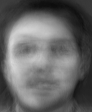

Image after NMF:


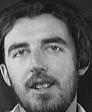

[[44. 48. 45. ... 39. 40. 40.]
 [47. 49. 46. ... 40. 42. 38.]
 [44. 47. 51. ... 39. 42. 41.]
 ...
 [51. 58. 52. ... 36. 30. 39.]
 [54. 49. 56. ... 32. 34. 37.]
 [62. 46. 49. ... 33. 36. 37.]]
Image Before NMF:
-------------------------------Number of image: 344
[[126. 126. 127. ... 122. 122. 122.]
 [127. 127. 127. ... 123. 122. 122.]
 [127. 126. 127. ... 123. 122. 122.]
 ...
 [ 97.  95.  95. ...  76.  75.  75.]
 [102.  98. 102. ...  78.  78.  78.]
 [106. 107. 109. ...  81.  79.  80.]]


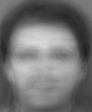

Image after NMF:


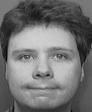

[[122. 124. 121. ... 124. 121. 120.]
 [124. 122. 124. ... 118. 121. 119.]
 [122. 123. 125. ... 122. 116. 122.]
 ...
 [ 75.  74.  75. ...  88.  81.  86.]
 [ 75.  71.  74. ...  83.  83.  84.]
 [ 72.  74.  74. ...  86.  84.  84.]]
Image Before NMF:
-------------------------------Number of image: 345
[[119. 118. 119. ... 115. 115. 115.]
 [118. 119. 118. ... 114. 114. 114.]
 [118. 118. 118. ... 114. 114. 114.]
 ...
 [ 31.  33.  34. ...  20.  21.  21.]
 [ 36.  37.  37. ...  20.  21.  21.]
 [ 39.  36.  37. ...  22.  22.  22.]]


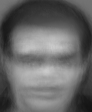

Image after NMF:


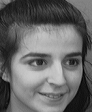

[[132. 118. 124. ... 132. 129. 129.]
 [130. 122. 110. ... 129. 129. 129.]
 [115. 120. 108. ... 126. 131. 132.]
 ...
 [ 21.  27.  31. ...  62.  64.  68.]
 [ 27.  32.  36. ...  58.  65.  71.]
 [ 32.  38.  39. ...  56.  67.  62.]]
Image Before NMF:
-------------------------------Number of image: 346
[[63. 62. 62. ... 63. 62. 63.]
 [63. 63. 63. ... 63. 63. 63.]
 [63. 63. 64. ... 63. 64. 63.]
 ...
 [61. 60. 59. ... 56. 55. 56.]
 [65. 63. 65. ... 58. 59. 58.]
 [69. 73. 73. ... 64. 62. 63.]]


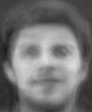

Image after NMF:


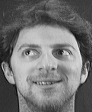

[[48. 52. 48. ... 61. 61. 59.]
 [54. 51. 53. ... 63. 59. 63.]
 [51. 53. 55. ... 60. 58. 62.]
 ...
 [49. 51. 48. ... 63. 61. 69.]
 [52. 51. 47. ... 65. 63. 65.]
 [50. 50. 50. ... 65. 61. 63.]]
Image Before NMF:
-------------------------------Number of image: 347
[[68. 68. 68. ... 68. 67. 67.]
 [68. 68. 69. ... 68. 68. 67.]
 [68. 68. 69. ... 68. 69. 68.]
 ...
 [61. 60. 59. ... 55. 54. 55.]
 [65. 64. 66. ... 57. 58. 56.]
 [69. 74. 74. ... 64. 61. 61.]]


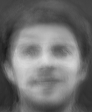

Image after NMF:


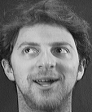

[[53. 51. 49. ... 60. 58. 59.]
 [53. 55. 51. ... 59. 60. 61.]
 [49. 56. 50. ... 62. 57. 65.]
 ...
 [48. 51. 56. ... 57. 65. 61.]
 [50. 55. 50. ... 58. 61. 64.]
 [48. 55. 53. ... 58. 64. 60.]]
Image Before NMF:
-------------------------------Number of image: 348
[[108. 108. 108. ... 112. 111. 111.]
 [108. 108. 107. ... 111. 112. 111.]
 [108. 108. 108. ... 110. 112. 112.]
 ...
 [ 72.  75.  79. ...  48.  50.  50.]
 [ 72.  76.  78. ...  48.  48.  50.]
 [ 72.  75.  76. ...  47.  48.  48.]]


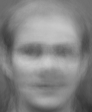

Image after NMF:


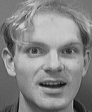

[[123. 121. 121. ... 114. 114. 113.]
 [118. 121. 122. ... 114. 115. 114.]
 [120. 119. 122. ... 116. 113. 118.]
 ...
 [ 90.  93.  83. ...  71.  60.  63.]
 [ 80.  82.  77. ...  70.  67.  61.]
 [ 69.  78.  67. ...  78.  79.  67.]]
Image Before NMF:
-------------------------------Number of image: 349
[[44. 44. 44. ... 44. 44. 44.]
 [44. 44. 44. ... 44. 44. 44.]
 [45. 44. 44. ... 44. 45. 44.]
 ...
 [25. 27. 28. ... 28. 28. 28.]
 [29. 30. 31. ... 28. 29. 28.]
 [31. 34. 34. ... 34. 33. 31.]]


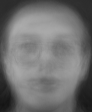

Image after NMF:


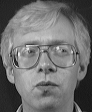

[[30. 37. 35. ... 36. 32. 32.]
 [31. 38. 30. ... 37. 34. 37.]
 [36. 37. 30. ... 33. 33. 38.]
 ...
 [42. 37. 39. ... 24. 30. 28.]
 [40. 35. 36. ... 25. 25. 29.]
 [36. 39. 34. ... 26. 27. 32.]]
Image Before NMF:
-------------------------------Number of image: 350
[[60. 59. 60. ... 63. 62. 63.]
 [60. 60. 58. ... 63. 63. 63.]
 [61. 60. 60. ... 62. 64. 64.]
 ...
 [56. 58. 63. ... 58. 58. 60.]
 [59. 64. 64. ... 59. 59. 58.]
 [59. 65. 65. ... 67. 66. 59.]]


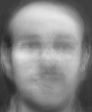

Image after NMF:


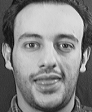

[[ 69.  76.  69. ...  85.  86.  92.]
 [ 69.  72.  70. ...  86.  88.  89.]
 [ 66.  71.  69. ...  86.  91.  88.]
 ...
 [ 46.  50.  53. ...  92.  90.  95.]
 [ 51.  50.  50. ...  90.  91.  77.]
 [ 54.  47.  52. ... 104. 121.  93.]]
Image Before NMF:


In [67]:
from sklearn.decomposition import non_negative_factorization
w,h,n_iter = non_negative_factorization(m,max_iter=100,n_components=10,init='random')
m=convertMatrixtoImageMinMax(m, min, max)
print(m)
compareAndTest(m,w,h, min, max, 1)